<img align="center" src="http://sydney.edu.au/images/content/about/logo-mono.jpg">
<h1 align="center" style="margin-top:10px">Modelling</h1>
<h2 align="center" style="margin-top:10px">ChengJie Deng/SID: 520030671</h2>
<br>

In [1]:
## include the necessary package
!pip install dataprep
!pip install tensorflow
!pip install keras_tuner
!pip install category_encoders
!pip install optuna
!pip install basemap
!pip install optuna-integration[xgboost]

In [2]:
import pandas as pd
import json
import seaborn as sns
from dataprep.clean import clean_df
from statsmodels.stats.outliers_influence import variance_inflation_factor
from dataprep.eda.missing import plot_missing

import matplotlib.pyplot as plt
import numpy as np

import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd


import tensorflow as tf
from tensorflow.keras import regularizers
from tensorflow.keras import backend as K
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils import class_weight
from sklearn.metrics import confusion_matrix


from keras_tuner.tuners import RandomSearch
from keras_tuner.tuners import BayesianOptimization
import keras_tuner as kt
from sklearn.metrics import roc_curve, auc


from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import OrdinalEncoder
from category_encoders.leave_one_out import LeaveOneOutEncoder
from category_encoders.james_stein import JamesSteinEncoder
from category_encoders.glmm import GLMMEncoder
from category_encoders.cat_boost import CatBoostEncoder

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score,  mean_absolute_error

from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import make_scorer, f1_score


import plotly.express as px
import plotly.graph_objects as go

from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold


import optuna
from sklearn.model_selection import KFold
import xgboost as xgb
from optuna.integration import XGBoostPruningCallback
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE
from collections import Counter

from imblearn.over_sampling import BorderlineSMOTE
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from xgboost import XGBClassifier
from xgboost import plot_importance
from xgboost import XGBRegressor
from sklearn.multioutput import MultiOutputClassifier


from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV


from sklearn.ensemble import RandomForestClassifier

from mpl_toolkits.basemap import Basemap


import warnings
import logging
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=UserWarning)
logging.getLogger('matplotlib').setLevel(logging.CRITICAL)


sns.set_context('notebook')
sns.set_style('ticks') # set default plot style
colours = ['#4E79A7','#F28E2C','#E15759','#76B7B2','#59A14F',
          '#EDC949','#AF7AA1','#FF9DA7','#9C755F','#BAB0AB']
sns.set_palette(colours) # set custom color scheme

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 8)
plt.rcParams['figure.dpi'] = 80
%config InlineBackend.figure_format = 'retina'

In [3]:
##link to Google Drvie
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1: Import L'Oreal and Postcode Dataset

## 1.1: L'Oreal Dataset

In [4]:
loreal_classifi = pd.read_csv("/content/drive/My Drive/QBUS_LOreal_Data_Classification.csv")

loreal = loreal_classifi.iloc[:, :63]

print(loreal.shape)
loreal.head()

(6400, 63)


,Unnamed: 0,CustomerID,Has_Transaction_Nov23_May24,Total_Spent_Nov23_May24,Total_Spent_1M,Transaction_Count_1M,Total_Spent_3M,Transaction_Count_3M,Total_Spent_6M,Transaction_Count_6M,...,EAN_TolerianeMoisturiser40ml,EAN_HyaluB5Serum30ml,EAN_EffaclarMoisturiser40ml,EAN_VitaminC10Serum30ml,EAN_RetinolB3Serum30ml,EAN_EffaclarSerum30ml,EAN_AntheliosInvisibleSunscreen50ml,EAN_Pure10NiacinamideSerum,EAN_CicaplastB5BaumeBothSKUs40ml,Post Code
0,0,LRP00002,1,119.81,143.00,1,143.00,1,143.00,1,...,0,0,0,0,0,0,0,0,0,NaN
1,1,LRP00004,1,461.54,0.00,0,0.00,0,189.36,1,...,0,0,1,0,0,1,0,0,0,NaN
2,2,LRP00008,1,38.41,0.00,0,0.00,0,161.59,1,...,0,0,1,0,0,1,0,0,1,NaN
3,3,LRP00009,1,168.25,73.62,1,73.62,1,73.62,1,...,0,0,0,0,0,0,0,0,0,NaN
4,4,LRP00012,1,82.28,0.00,0,0.00,0,0.00,0,...,1,0,0,0,0,0,0,0,0,NaN


In [5]:
print(f"The type of dependent variable is {loreal_classifi['Total_Spent_Nov23_May24'].dtype} and it has {loreal_classifi['Total_Spent_Nov23_May24'].isnull().sum()} missing value")

The type of dependent variable is float64 and it has 0 missing value


In [6]:
response = ["Total_Spent_Nov23_May24"]

### Comment:

- **Check Dataset Size**: After loading the dataset, first verify its dimensions to understand the number of rows and columns.

- **Examine Dependent Variable Type**: Review the type of the dependent variable. If it is not numerical (i.e., not an int or float), apply `type casting` to convert it to a numerical format.

- **Check for Missing Values**: Also, perform a quick check for any missing values in the dependent variable to ensure data integrity.

## 1.2: Postcode Dataset

In [7]:
all_postcode = loreal_classifi["Post Code"].value_counts().index
loreal_classifi["Post Code"].value_counts().sort_values(ascending=False).head(10)

,Post Code
2000.0,11
3000.0,10
4101.0,9
3030.0,8
3020.0,7
2017.0,7
3216.0,6
4000.0,6
2617.0,6
2131.0,6


In [8]:
postcode = pd.read_csv("/content/drive/My Drive/Postcode_ART.csv")
print(postcode.shape)
postcode.head()

(2633, 66)


,Postcode,A,B,C,D,E,F,G,H,I,...,L42,M43,M44,M45,M46,M47,N48,N49,N50,N51
0,800,11.0,NaN,2816.0,1.0,NaN,41.0,1300.0,3.0,NaN,...,NaN,NaN,1.0,1.0,NaN,NaN,1.0,NaN,2.0,NaN
1,810,225.0,3423.0,NaN,529.0,308.0,3137.0,1421.0,132.0,2273.0,...,NaN,NaN,105.0,217.0,79.0,6.0,1.0,NaN,NaN,NaN
2,812,71.0,1649.0,NaN,187.0,166.0,902.0,6.0,192.0,2669.0,...,NaN,NaN,45.0,142.0,46.0,6.0,10.0,NaN,NaN,NaN
3,820,784.0,455.0,585.0,115.0,96.0,4763.0,2284.0,121.0,140.0,...,NaN,NaN,17.0,101.0,102.0,4.0,4.0,NaN,NaN,NaN
4,822,3.0,NaN,NaN,43.0,441.0,1.0,2.0,356.0,6.0,...,2.0,NaN,3.0,77.0,NaN,3.0,2247.0,94.0,600.0,7.0


# 2: Data Cleaning

## 2.1: L'Oreal Data Cleaning

In [9]:
loreal.isnull().sum().sort_values(ascending=False).head(5)

,0
Post Code,5326
CustomerID,0
Unnamed: 0,0
Total_Spent_Nov23_May24,0
Total_Spent_1M,0


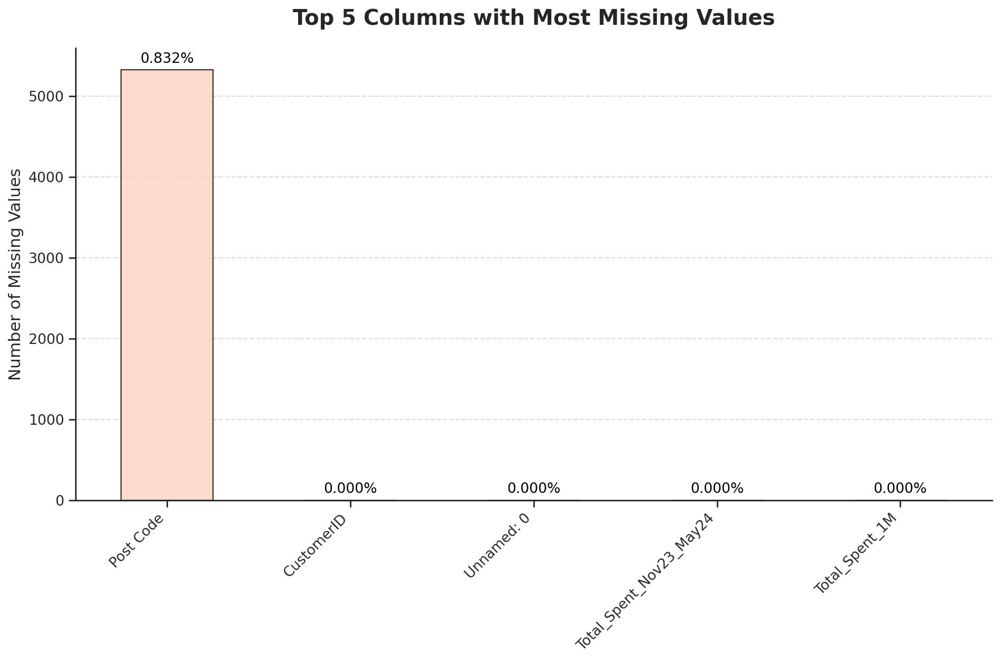

In [10]:
miss_var = loreal.isnull().sum().sort_values(ascending=False).head(5)

plt.figure(figsize=(12, 8))


colors = sns.color_palette("Reds", len(miss_var))

miss_var.plot(kind='bar', color=colors, alpha=0.8, edgecolor='black')
plt.title('Top 5 Columns with Most Missing Values', size=18, fontweight='bold', pad=20)
plt.ylabel('Number of Missing Values', size=14)
plt.xticks(rotation=45, size=12, ha='right')
plt.yticks(size=12)



for i, value in enumerate(miss_var):
    plt.text(i, value + 50, f'{(value/loreal.shape[0]):.3f}%', ha='center', va='bottom', fontsize=12, color='black')


sns.despine()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [11]:
tranc_23_24 = loreal['Has_Transaction_Nov23_May24']

In [12]:
loreal.drop(columns=["Unnamed: 0"], inplace=True)
loreal.drop(columns=["Post Code"], inplace=True)
loreal.drop(columns=["CustomerID"], inplace=True)
loreal.drop(columns=["Has_Transaction_Nov23_May24"], inplace=True)

In [13]:
loreal["Category_Face_Care"] = loreal["Category_Face Care"] + loreal["Category_Face Care "]
loreal.drop(columns=["Category_Face Care"], inplace=True)
loreal.drop(columns=["Category_Face Care "], inplace=True)

In [14]:
loreal.columns = [col.replace(' & ','_').replace(' ', '_').replace('-', '_') for col in loreal.columns]


In [15]:
plot_missing(loreal, display=['Stats', 'Bar Chart'])

Output hidden; open in https://colab.research.google.com to view.

### Comments:

- The **postcode** variable contains approximately **0.832%** missing values, which is too high, making any imputation method highly risky and inaccurate.

- Therefore, in the subsequent model construction, we will exclude this variable. However, for the purposes of EDA, we will still utilize the available postcode information.

## 2.2: Postcode Data Cleaning

In [16]:
post_colum = postcode.columns
post_colum

Index(['Postcode', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L',
       'M', 'N', 'A01', 'A02', 'A03', 'A04', 'B05', 'B06', 'B07', 'C08', 'C09',
       'C10', 'D11', 'D12', 'D13', 'E14', 'E15', 'E16', 'F17', 'F18', 'F19',
       'G20', 'G21', 'G22', 'G23', 'H24', 'H25', 'H26', 'H27', 'I28', 'I29',
       'I30', 'J31', 'J32', 'J33', 'J34', 'K35', 'K36', 'K37', 'L38', 'L39',
       'L40', 'L41', 'L42', 'M43', 'M44', 'M45', 'M46', 'M47', 'N48', 'N49',
       'N50', 'N51'],
      dtype='object')

In [17]:
postcode[~postcode['Postcode'].isin(all_postcode)].index

Int64Index([   2,    3,    4,    5,    6,    7,    8,    9,   10,   12,
            ...
            2621, 2623, 2624, 2625, 2627, 2628, 2629, 2630, 2631, 2632],
           dtype='int64', length=2026)

In [18]:
postcode = postcode.drop(postcode[~postcode['Postcode'].isin(all_postcode)].index)
postcode.head()

,Postcode,A,B,C,D,E,F,G,H,I,...,L42,M43,M44,M45,M46,M47,N48,N49,N50,N51
0,800,11.0,NaN,2816.0,1.0,NaN,41.0,1300.0,3.0,NaN,...,NaN,NaN,1.0,1.0,NaN,NaN,1.0,NaN,2.0,NaN
1,810,225.0,3423.0,NaN,529.0,308.0,3137.0,1421.0,132.0,2273.0,...,NaN,NaN,105.0,217.0,79.0,6.0,1.0,NaN,NaN,NaN
11,836,NaN,1.0,NaN,NaN,1602.0,NaN,NaN,30.0,5.0,...,NaN,NaN,1.0,6.0,NaN,2.0,167.0,NaN,NaN,1.0
26,870,5.0,1047.0,NaN,57.0,176.0,882.0,747.0,539.0,1035.0,...,35.0,NaN,44.0,75.0,NaN,15.0,14.0,NaN,3.0,1.0
34,2000,1226.0,NaN,13061.0,NaN,NaN,NaN,2876.0,218.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
postcode = postcode.reset_index()
postcode = postcode.iloc[:,1:]

In [20]:
print(postcode.shape)
postcode.head()

(607, 66)


,Postcode,A,B,C,D,E,F,G,H,I,...,L42,M43,M44,M45,M46,M47,N48,N49,N50,N51
0,800,11.0,NaN,2816.0,1.0,NaN,41.0,1300.0,3.0,NaN,...,NaN,NaN,1.0,1.0,NaN,NaN,1.0,NaN,2.0,NaN
1,810,225.0,3423.0,NaN,529.0,308.0,3137.0,1421.0,132.0,2273.0,...,NaN,NaN,105.0,217.0,79.0,6.0,1.0,NaN,NaN,NaN
2,836,NaN,1.0,NaN,NaN,1602.0,NaN,NaN,30.0,5.0,...,NaN,NaN,1.0,6.0,NaN,2.0,167.0,NaN,NaN,1.0
3,870,5.0,1047.0,NaN,57.0,176.0,882.0,747.0,539.0,1035.0,...,35.0,NaN,44.0,75.0,NaN,15.0,14.0,NaN,3.0,1.0
4,2000,1226.0,NaN,13061.0,NaN,NaN,NaN,2876.0,218.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
postcode["Region"] = np.nan

for i in range(len(postcode)):

    post = postcode.iloc[i,]["Postcode"]

    if post >= 0 and post < 1000:
        postcode.loc[i,"Region"] = 'South Australia'

    elif post >= 1000 and post < 3000:
        postcode.loc[i,"Region"] = 'New South Wales'

    elif post >= 3000 and post < 4000:
        postcode.loc[i,"Region"] = 'Victoria'

    elif post >= 4000 and post < 5000:
        postcode.loc[i,"Region"] = 'Queensland'

    elif post >= 5000 and post < 6000:
        postcode.loc[i,"Region"] = 'South Australia'

    elif post >= 6000 and post < 7000:
        postcode.loc[i,"Region"] = 'Western Australia'

    elif post >= 7000 and post < 8000:
        postcode.loc[i,"Region"] = 'Tasmania'

    elif post >= 8000:
        postcode.loc[i,"Region"] = 'Northern Territory'

In [22]:
print(postcode.shape)
postcode.head()

(607, 67)


,Postcode,A,B,C,D,E,F,G,H,I,...,M43,M44,M45,M46,M47,N48,N49,N50,N51,Region
0,800,11.0,NaN,2816.0,1.0,NaN,41.0,1300.0,3.0,NaN,...,NaN,1.0,1.0,NaN,NaN,1.0,NaN,2.0,NaN,South Australia
1,810,225.0,3423.0,NaN,529.0,308.0,3137.0,1421.0,132.0,2273.0,...,NaN,105.0,217.0,79.0,6.0,1.0,NaN,NaN,NaN,South Australia
2,836,NaN,1.0,NaN,NaN,1602.0,NaN,NaN,30.0,5.0,...,NaN,1.0,6.0,NaN,2.0,167.0,NaN,NaN,1.0,South Australia
3,870,5.0,1047.0,NaN,57.0,176.0,882.0,747.0,539.0,1035.0,...,NaN,44.0,75.0,NaN,15.0,14.0,NaN,3.0,1.0,South Australia
4,2000,1226.0,NaN,13061.0,NaN,NaN,NaN,2876.0,218.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New South Wales


### Comments:

- I imported and preprocessed the postcode dataset. Since the L'Oreal dataset does not contain all postcodes, I **filtered out** those that are not present in the L'Oreal dataset.

- Additionally, I assigned each postcode to its respective region. For example, postcodes from 0 to 1000 are categorized under **South Australia**.


# 3: Dependent Variable Analysis

In [23]:
loreal["Total_Spent_Nov23_May24"].describe()

,Total_Spent_Nov23_May24
count,6400.000000
mean,162.998742
std,127.477466
min,25.510000
25%,79.950000
50%,124.355000
75%,200.825000
max,1379.580000


In [24]:
def dependent_analysis(subtitle, y):

    fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(25, 9))

    plt.suptitle(subtitle, size=35)

    ax1 = sns.boxplot(y = y, data=loreal, palette='Blues', showmeans=True, ax = ax1)
    ax1.set_ylabel("Total Spent", size=25)
    ax1.set_title("Boxplot of Spent",size=30)
    sns.despine()



    sns.histplot(y, kde=True, ax=ax2, color='orange')
    ax2.set_title("Histogram of Spent",size=30)
    ax2.set_xlabel("Total Spent",size=25)
    ax2.set_ylabel("Frequency",size=25)


    stats.probplot(y, dist="norm", plot = ax3)
    ax3.set_title('QQ Plot of Total_Spent_Nov23_May24',size=30)
    ax3.set_xlabel("Theoretical Quantiles",size=25)

    plt.tight_layout()
    plt.show()

## 3.1: Before Transformation

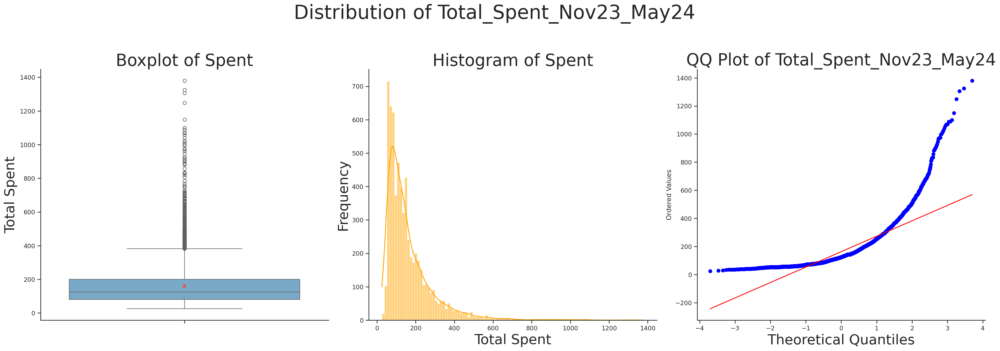

In [25]:
dependent_analysis('Distribution of Total_Spent_Nov23_May24\n', loreal['Total_Spent_Nov23_May24'])

## 3.2: Log-Transformation

In [26]:
loreal["Log_Spent"] = np.log(loreal["Total_Spent_Nov23_May24"])

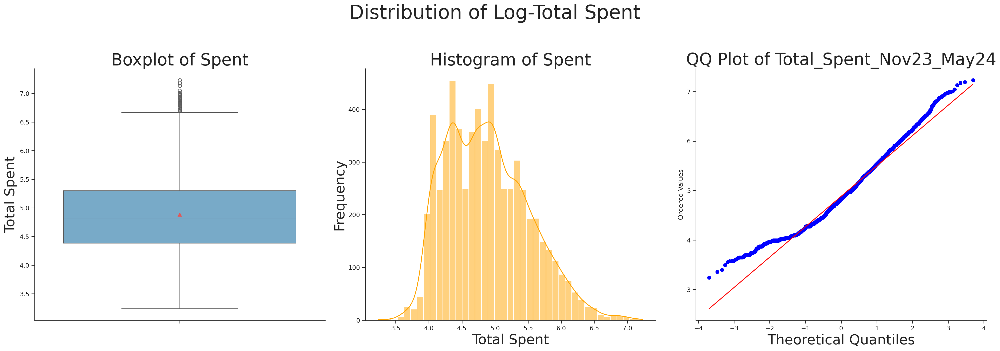

In [27]:
dependent_analysis('Distribution of Log-Total Spent\n', loreal['Log_Spent'])

## 3.3: Yeo-Johnson-Transformation

In [28]:
yj = PowerTransformer(method='yeo-johnson')

loreal['YJ_Spent']  = yj.fit_transform(loreal[['Total_Spent_Nov23_May24']])


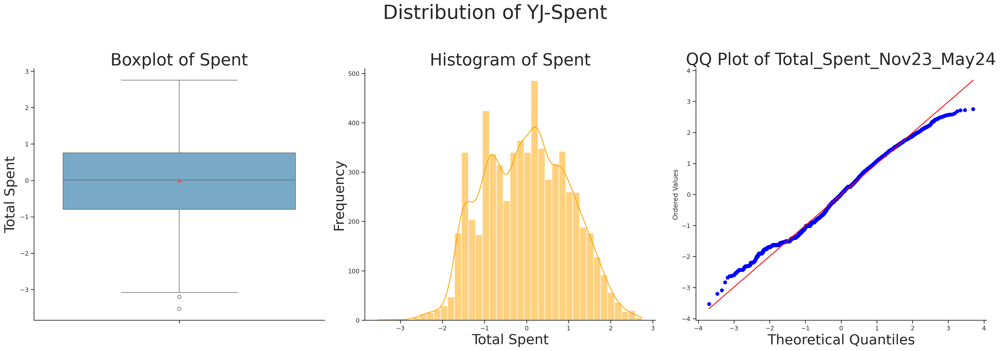

In [29]:
dependent_analysis('Distribution of YJ-Spent\n', loreal['YJ_Spent'])

In [30]:
original_dependent = loreal["Total_Spent_Nov23_May24"]

In [31]:
loreal.drop(columns=["Total_Spent_Nov23_May24"], inplace=True)
loreal.drop(columns=["Log_Spent"], inplace=True)


In [32]:
response = ["YJ_Spent"]
origi_col = loreal.columns

In [33]:
all_predictors = [i for i in loreal.columns]
len(all_predictors)

58

In [34]:
yj.transform(np.array(original_dependent).reshape(-1,1))[:,0]

array([-0.05302074,  1.78729129, -2.43173746, ...,  0.72138545,
       -1.45013079, -0.35601383])

In [35]:
loreal['YJ_Spent']

,YJ_Spent
0,-0.053021
1,1.787291
2,-2.431737
3,0.495272
4,-0.739915
...,...
6395,-1.544690
6396,0.168866
6397,0.721385
6398,-1.450131


### Comments:

- I applied two types of transformations to the dependent variables to enhance the model's performance. Initially, **without any transformation**, the **box plot** revealed `numerous outliers`, and the **histogram** showed `significant skewness`. Additionally, the **Q-Q plot** displayed a `distinct curve`.

- After applying a **log transformation**, the number of outliers was substantially reduced, and the **histogram** started to `resemble a normal distribution`. However, this was not yet the optimal result.

- I then performed a **Yeo-Johnson (YJ) transformation**, which further reduced the outliers and caused the **histogram** to more closely align with a `normal distribution`.


# 4: Binary Predictors

In [36]:
binary = []
for i in range(loreal.shape[1]):
    if 0 in loreal[loreal.columns[i]].value_counts().index:
        if loreal[loreal.columns[i]].value_counts()[0]/len(loreal) > 0.8:
            binary.append(loreal.columns[i])

print(len(binary))
binary

24


['Brand_Description_Bundle',
 'Brand_Description_Eau_Thermale',
 'Brand_Description_Lipikar',
 'Brand_Description_Niacinamide',
 'Brand_Description_Retinol_LRP',
 'Brand_Description_Serozinc',
 'Brand_Description_Uvidea',
 'Brand_Description_Vitamin_C',
 'Class_Description_Bundle',
 'Sub_Category_Body_Wash',
 'Sub_Category_Eye_Cream',
 'Sub_Category_Face_Mask',
 'Sub_Category_Tinted_Sunscreen',
 'Sub_Category_Toner_Mist',
 'Skin_Concern_Pigmentation_and_Dark_Spots',
 'EAN_TolerianeMoisturiser40ml',
 'EAN_HyaluB5Serum30ml',
 'EAN_EffaclarMoisturiser40ml',
 'EAN_VitaminC10Serum30ml',
 'EAN_RetinolB3Serum30ml',
 'EAN_EffaclarSerum30ml',
 'EAN_AntheliosInvisibleSunscreen50ml',
 'EAN_Pure10NiacinamideSerum',
 'EAN_CicaplastB5BaumeBothSKUs40ml']

In [37]:
def barplots(X, direction):

    colors = ['#4E79A7','#F28E2C','#E15759','#76B7B2','#59A14F',
          '#EDC949','#AF7AA1','#FF9DA7','#9C755F','#BAB0AB']

    labels = list(X.columns)
    N, p = X.shape

    rows = int(np.ceil(p / 3))

    fig, axes = plt.subplots(rows, 3, figsize=(12, rows * (12 / 4)))

    for i, ax in enumerate(fig.axes):
        if i < p:

            value_counts = X.iloc[:, i].value_counts()
            value_counts.plot(kind=direction, ax=ax, color=colors[i % 10], edgecolor='black', alpha = 0.7)
            ax.set_xlabel('Count')
            ax.set_ylabel('')
            ax.set_title(labels[i])
        else:
            fig.delaxes(ax)

    sns.despine()
    plt.tight_layout()

    return fig, axes

## 4.1: Boxplot Visualization

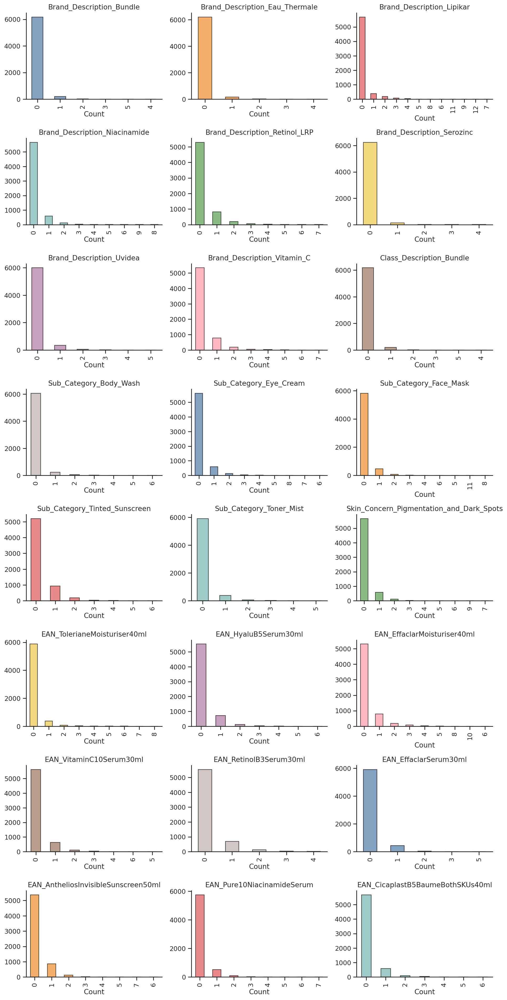

In [38]:
barplots(loreal[binary],'bar')

plt.show()

## 4.2: Correlation Matrix

In [39]:
corrl_matrix = round(loreal[binary+response].corr(),3)


fig = px.imshow(corrl_matrix,
                text_auto=True,
                color_continuous_scale='Blues',
                title='Correlation Matrix Heatmap')

fig.update_traces(
    hovertemplate='x: %{x}<br>y: %{y}<br>Correlation: %{z}<extra></extra>'
)


fig.update_layout(
    title_font_size=25,
    font=dict(size=12),
    width=1000,
    height=1000,
    coloraxis_colorbar=dict(
        thickness=30,
        len=0.9,
        yanchor="middle",
        y=0.5,
        x=1.05
    ),
    xaxis=dict(
        tickangle=-45,
    )

)

fig.update_traces(
    textfont_size=6
)


fig.show()

## 4.3: Proportion Barplot

In [40]:
for i in range(len(binary)):

    loreal[binary[i]] = np.where(loreal[binary[i]] == 0, 'not_buy', 'buy')


In [41]:
def proporplots(X):
    colors = ['#4E79A7','#F28E2C','#E15759','#76B7B2','#59A14F',
              '#EDC949','#AF7AA1','#FF9DA7','#9C755F','#BAB0AB']

    labels = list(X.columns)
    N, p = X.shape

    rows = int(np.ceil(p / 3))

    fig, axes = plt.subplots(rows, 3, figsize=(12, rows * (12 / 4)))

    for i, ax in enumerate(fig.axes):
        if i < p:
            counts = X.iloc[:, i].value_counts()
            label = counts.index
            values = counts.values
            total = values.sum()


            proportions = values / total * 100

            if len(proportions) >= 2:
                ax.bar([labels[i]], [proportions[0]], color='lightblue', label=label[0])
                ax.bar([labels[i]], [proportions[1]], bottom=proportions[0], color=colors[i % 10], label=label[1])


                ax.text(0, proportions[0] / 2, f'{proportions[0]:.2f}%', ha='center', va='center', fontsize=12, color='black')
                ax.text(0, proportions[0] + proportions[1] / 2, f'{proportions[1]:.2f}%', ha='center', va='center', fontsize=12, color='black')

                ax.set_title(f'Proportion of {labels[i]}\n', fontsize=12)
                ax.legend(title='Categories', title_fontsize='13', fontsize='10', loc='lower left')

                ax.set_ylim(0, 100)

            else:
                ax.bar([labels[i]], [proportions[0]], color='lightblue', label=label[0])
                ax.text(0, proportions[0] / 2, f'{proportions[0]:.2f}%', ha='center', va='center', fontsize=12, color='black')
                ax.set_title(f'Proportion of {labels[i]}', fontsize=12)
                ax.set_ylim(0, 100)

        else:
            fig.delaxes(ax)

    sns.despine()
    plt.tight_layout()

    return fig, axes


In [ ]:
_=proporplots(loreal[binary])

### Comments:

- I found that many variables in the dataset contain a `significant number of zero values`, indicating that most customers have not purchased these products. Therefore, I extracted the variables where zero values exceed **80%**. The **bar plot** illustrates that for these products, over **80%** of customers have not made any purchases, and the majority of those who have, purchased **only once**.

- Additionally, the **correlation matrix** shows that the correlation coefficients between these variables and the target variable are very low, averaging less than **0.1**. Therefore, I believe it is more appropriate to treat these variables as **binary**. This approach will help `reduce data sparsity` and `simplify the subsequent models`.


- Lastly, the **proportion bar plot** clearly indicates that for each product, more than **80%** of customers have never made a purchase, and for some products, this figure exceeds **90%**.

## 4.4: Dummy Encoding

In [ ]:
dummies_binary = []
for i in range(len(binary)):

    variable = binary[i]

    dummy = pd.get_dummies(loreal[variable],  prefix = variable, drop_first=True)
    dummies_binary.append(dummy)

In [ ]:
variable = [i for i in binary]

dummy_list = [i for i in dummies_binary]

for i in range(len(variable)):

    loreal = pd.concat([loreal.drop(variable[i], axis=1), dummy_list[i]], axis=1)

### Comments:

- For these variables, which have only **two possible values**, I believe the most appropriate approach is to convert them directly into **dummy variables**. This conversion will not impact the dataset's size and will simplify subsequent analysis.

# 5: Continuous Predictors

In [ ]:
continuous = loreal.select_dtypes(include=['Float32', 'Float64']).columns.tolist()
continuous.remove("YJ_Spent")

## 5.1: Correlation Matrix

In [ ]:
corrl_matrix = round(loreal[continuous+response].corr(),3)


fig = px.imshow(corrl_matrix,
                text_auto=True,
                color_continuous_scale='plasma',
                title='Correlation Matrix Heatmap')

fig.update_traces(
    hovertemplate='x: %{x}<br>y: %{y}<br>Correlation: %{z}<extra></extra>'
)

fig.update_layout(
    title_font_size=20,
    font=dict(size=12),
    width=700,
    height=700,
    coloraxis_colorbar=dict(
        thickness=30,
        len=0.9,
        yanchor="middle",
        y=0.5,
        x=1.1
    ),
    xaxis=dict(
        tickangle=-45,
    )
)



fig.show()

### Comments:

- By plotting the heatmap, we can observe **strong multicollinearity** among these variables. This issue can lead to `unstable parameter estimates` in regression models. Therefore, when building the model in the future, we should carefully consider whether to use all of these variables as predictors.


## 5.2: VIF Table

In [ ]:
x_con = loreal[continuous].select_dtypes(include=[np.number])


vif = pd.DataFrame()
vif["Continuous"] = x_con.columns
vif["VIF"] = [variance_inflation_factor(x_con.values, i) for i in range(len(x_con.columns))]

vif.round(2)

### Comments:

- The `VIF results` reveal that most continuous variables suffer from **severe multicollinearity(VIFs > 10)**, meaning they can be largely predicted by linear combinations of other variables. This is an undesirable outcome. In the subsequent analysis, I think we should focus primarily on variable **Total_Spent_AllTime** or **Total_Spent_12M**, as it may already include important information from other continuous variables.

## 5.3: Histogram and Scatter Plot (Before Transformation)

In [ ]:
def distplots(X, kde=True):

    labels = list(X.columns)

    N, p = X.shape

    rows = int(np.ceil(p/3))

    fig, axes = plt.subplots(rows, 3, figsize=(12, rows*(12/4)))

    for i, ax in enumerate(fig.axes):
        if i < p:
            sns.histplot(X.iloc[:,i], ax=ax, stat='density', kde=True, alpha= 0.7, edgecolor ='black')
            sns.kdeplot(X.iloc[:,i], ax=ax, alpha= 0.4, color='black')
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.set_title(labels[i])
            ax.set_yticks([])
        else:
            fig.delaxes(ax)

    sns.despine()
    plt.tight_layout()

    return fig, axes

In [ ]:
distplots(loreal[continuous])

plt.show()

In [ ]:
def scattplot(X, y, data):
    colors = ['#4E79A7','#F28E2C','#E15759','#76B7B2','#59A14F',
          '#EDC949','#AF7AA1','#FF9DA7','#9C755F','#BAB0AB']
    sns.set_palette(colors) # set custom color scheme

    labels = list(X.columns)

    N, p = X.shape

    rows = int(np.ceil(p/3))

    fig, axes = plt.subplots(rows, 3, figsize=(12, rows*(11/4)))

    for i, ax in enumerate(fig.axes):
        if i < p:

            sns.regplot(x=X.iloc[:,i], y=y, data=data, lowess=True,
            line_kws={'color': 'black', 'alpha': 0.6},
            scatter_kws={'color': colors[i % 10], 'alpha': 0.8, 'edgecolor': 'orange', 's': 50},
            ax=ax)

            ax.set_xlabel('')

            ax.set_title(labels[i])
        else:
            fig.delaxes(ax)

    sns.despine()
    plt.tight_layout()

    return fig, axes


In [ ]:
_= scattplot(loreal[continuous], loreal["YJ_Spent"], loreal)

## 5.4: Histogram and Scatter Plot (After YJ Transformation)

In [ ]:
continuous_YJ = []
corr_conti_notrans = []
corr_conti_aftertrans = []

In [ ]:
for i in range(len(continuous)):
    yj = PowerTransformer(method='yeo-johnson')
    loreal[f'{continuous[i]}_YJ'] = yj.fit_transform(loreal[[continuous[i]]])
    continuous_YJ.append(f'{continuous[i]}_YJ')

    corr_conti_notrans.append(loreal[continuous[i]].corr(loreal["YJ_Spent"]))
    corr_conti_aftertrans.append(loreal[continuous_YJ[i]].corr(loreal["YJ_Spent"]))

In [ ]:
distplots(loreal[continuous_YJ])

plt.show()

In [ ]:
_= scattplot(loreal[continuous_YJ], loreal["YJ_Spent"], loreal)

In [ ]:
pd.DataFrame({
    'No Trans': np.round(corr_conti_notrans, 2),
    'After Trans': np.round(corr_conti_aftertrans, 2)
}, index=continuous)

### Comments:

- From all the histograms above, we can observe that, except for the **Total_Spent_AllTime** variable, the distributions of the other variables remain `quite skewed` even after the Yeo-Johnson (YJ) transformation. Some variables even exhibit `discontinuities` in their distributions, indicating that for these variables, the YJ transformation may can not significantly improved the predictive power of the regression model.

- By examining all the scatter plots above, it is clear that the original continuous variables typically **do not exhibit a clear linear relationship** but may have **some degree of nonlinearity**. For these variables, using **linear spline (with n knots)** to dealing them might be more appropriate to capture these `nonlinear relationships`. With the exception of Total_Spend_All_Time, the scatter plot still does not reveal a clear linear relationship after transformation.

- The final table shows that the `correlation` between the dependent variable and all continuous predictors, except **Total_Spent_AllTime**, has `decreased` after the transformation. Therefore, I have decided not to apply any transformation methods to these variables. For the remaining continuous variables, using a linear spline with 2 or 3 knots may better capture the non-linear relationship.

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))


sns.regplot(x='Total_Spent_AllTime', y='YJ_Spent', data=loreal, lowess=True,
            line_kws={'color': 'black', 'alpha': 0.6},
            scatter_kws={'color': 'red', 'alpha': 0.6, 'edgecolor': 'orange', 's': 50},
            ax=ax1)

ax1.set_title('Regplot without Transformation')
sns.despine(ax=ax1)



sns.regplot(x='Total_Spent_AllTime_YJ', y='YJ_Spent', data=loreal, lowess=True,
            line_kws={'color': 'black', 'alpha': 0.6},
            scatter_kws={'color': 'green', 'alpha': 0.6, 'edgecolor': 'orange', 's': 50},
            ax=ax2)

ax2.set_title('Regplot with Yeo-Johnson Transformation')

sns.despine(ax=ax2)




plt.show()


In [ ]:
total_spent_alltime =  loreal["Total_Spent_AllTime"]

In [ ]:
for i in range(len(continuous_YJ)):
    if continuous_YJ[i] != "Total_Spent_AllTime_YJ":
        loreal.drop(columns=[continuous_YJ[i]], inplace=True)

loreal.drop(columns=["Total_Spent_AllTime"], inplace=True)

# 6: Discrete Predictors

In [ ]:
yj.transform(np.array(original_dependent).reshape(-1,1))[:,0]

In [ ]:
discrete = []
for i in range(len(origi_col)):
    if origi_col[i] not in (continuous + binary):
        discrete.append(origi_col[i])
discrete.remove("YJ_Spent")

In [ ]:
print(len(binary), len(continuous),len(discrete))

## 6.1: Correlation Matrix

In [ ]:
corrl_matrix = round(loreal[discrete+response].corr(),3)


fig = px.imshow(corrl_matrix,
                text_auto=True,
                color_continuous_scale='oranges',
                title='Correlation Matrix Heatmap')

fig.update_traces(
    hovertemplate='x: %{x}<br>y: %{y}<br>Correlation: %{z}<extra></extra>'
)


fig.update_layout(
    title_font_size=25,
    font=dict(size=12),
    width=1000,
    height=1000,
    coloraxis_colorbar=dict(
        thickness=30,
        len=0.9,
        yanchor="middle",
        y=0.5,
        x=1.05
    ),
    xaxis=dict(
        tickangle=-45,
    )

)

fig.update_traces(
    textfont_size=7.5
)


fig.show()

## 6.2: Boxplot Visualization

In [ ]:
barplots(loreal[discrete], 'bar')
plt.show()

In [ ]:
for i in range(len(discrete)):

    variable = discrete[i]
    counts = loreal[variable].value_counts()
    more = max(loreal[variable].value_counts().index)+1

    for level in counts.index:
        if counts[level] <= 10:
            loreal.loc[loreal[variable]==level, variable] = "More"

### Comments:

- I have reviewed all the remaining discrete variables and found that most of them are very **sparse**, with customers rarely purchasing the same item **more than four times**. Therefore, I believe it is necessary to **merge infrequent values** for each discrete variables to **reduce their sparsity** and make the data cleaner before proceeding with further analysis.

## 6.3: Low Cardinality

In [ ]:
low_discrete = []
for i in range(len(discrete)):
    if loreal[discrete[i]].nunique() < 6:
        low_discrete.append(discrete[i])

In [ ]:
def boxplots(X, y, color):

    labels = list(X.columns)
    N, p = X.shape


    rows = int(np.ceil(p / 3))


    fig, axes = plt.subplots(rows, 3, figsize=(12, rows * (12 / 4)))


    for i, ax in enumerate(fig.axes):
        if i < p:
            sns.boxplot(x=X.iloc[:, i], y = y, ax=ax, boxprops=dict(alpha=.9), palette=color)
            ax.set_xlabel('')
            ax.set_ylabel('YJ_Spent')
            ax.set_title(labels[i])
        else:
            fig.delaxes(ax)

    sns.despine()
    plt.tight_layout()

    return fig, axes

In [ ]:
boxplots(loreal[low_discrete], loreal['YJ_Spent'], 'Set1')



plt.show()

## 6.4: Ordinal Encoding (Low Cardinality)

In [ ]:
max_cate = max(loreal[low_discrete[0]].value_counts().index[:-1]) + 1
loreal[low_discrete[0]] = loreal[low_discrete[0]].replace("More", max_cate)

In [ ]:

boxplots(loreal[low_discrete].astype(int), loreal['YJ_Spent'], 'Set1')

plt.show()

## post-hoc test (Low Cardinality)

In [ ]:
post_host_test_lowtable = []

for i in range(len(low_discrete)):

    model = smf.ols(f'YJ_Spent ~ C({low_discrete[i]})', data=loreal).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)



    pair_ttest = pairwise_tukeyhsd(endog=loreal['YJ_Spent'], groups=loreal[low_discrete[i]].astype(str))


    pair_ttest_table = pd.DataFrame(data=pair_ttest.summary().data[0:], columns=pair_ttest.summary().data[0])

    post_host_test_lowtable.append(pair_ttest_table)

In [ ]:
post_host_test_lowtable[0]

## 6.6: High Cardinality

In [ ]:
high_discrete = []

for i in range(len(discrete)):

    if discrete[i] not in low_discrete:
        high_discrete.append(discrete[i])

In [ ]:
number = [x for x in loreal[high_discrete[-1]].value_counts().index if isinstance(x, (int, float))]
max(number)

In [ ]:
for i in range(len(high_discrete[0:])):
    number = [x for x in loreal[high_discrete[0]].value_counts().index if isinstance(x, (int, float))]
    max_cate = max(number) + 1
    loreal[high_discrete[i]] = loreal[high_discrete[i]].replace("More", max_cate)


In [ ]:
for i in range(len(high_discrete[0:])):
    encoder = OrdinalEncoder()
    loreal[high_discrete[i]] = encoder.fit_transform(loreal[[high_discrete[i]]])

In [ ]:
boxplots(loreal[high_discrete].astype(int), loreal['YJ_Spent'], 'Set2')

plt.show()

In [ ]:
len(high_discrete)

### Comments:

- I conducted a visual analysis of the remaining **high cardinality** discrete variables. Similar to the low cardinality discrete variables, some of the high cardinality variables show boxplots with `no consistent upward or downward trend` in the median or central tendency. For these variables, methods like **CatBoost**, which efficiently handles nominal variables, could be considered for use.

- For variables that `exhibit certain trends`, we recommend continuing with **ordinal encoding** to preserve the original order information, which will facilitate further analysis.

## post-hoc test (High Cardinality)

In [ ]:
no_trend_discrete = ['Brand_Description_Anthelios', 'Class_Description_Body_Care', 'Category_Body_Care', 'Category_Sun_Care', 'Sub_Category_Body_Moisturiser', 'Sub_Category_Sunscreen', 'Skin_Concern_Sun_Protection']


In [ ]:
post_host_test_hightable = []

for i in range(len(no_trend_discrete)):

    model = smf.ols(f'YJ_Spent ~ C({no_trend_discrete[i]})', data=loreal).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)


    pair_ttest = pairwise_tukeyhsd(endog=loreal['YJ_Spent'], groups=loreal[no_trend_discrete[i]].astype(str))

    pair_ttest_table = pd.DataFrame(data=pair_ttest.summary().data[0:], columns=pair_ttest.summary().data[0])
    post_host_test_hightable.append(pair_ttest_table)

In [ ]:
post_host_test_hightable[6]

## 6.7: Dummy Encoding

In [ ]:
dummies_discrete = []
for i in range(len(no_trend_discrete)):

    variable = no_trend_discrete[i]

    dummy = pd.get_dummies(loreal[variable],  prefix = variable, drop_first=True)
    dummies_discrete.append(dummy)

In [ ]:
variable = [i for i in no_trend_discrete]

dummy_list = [i for i in dummies_discrete]

for i in range(len(variable)):

    loreal = pd.concat([loreal.drop(variable[i], axis=1), dummy_list[i]], axis=1)

In [ ]:
loreal.columns = [col.replace(' .0','').replace('.0','') for col in loreal.columns]


In [ ]:
for column in loreal.columns:
    if loreal[column].dtype == 'bool':
        loreal[column] = loreal[column].astype(int)

In [ ]:
loreal

### Commments

- Here, I found that many high cardinality discrete variables exhibit **non-linear** relationships, meaning that regardless of whether customers have purchased these products or have made multiple purchases, the overall spending trend among these customers is quite similar


# 7: Association Rule Mining

In [ ]:
arm = pd.read_csv("/content/drive/My Drive/QBUS_LOreal_Data_Classification.csv").iloc[:, :]

arm["Category_Face_Care"] = arm["Category_Face Care"] + arm["Category_Face Care "]
arm.drop(columns=["Category_Face Care"], inplace=True)
arm.drop(columns=["Category_Face Care "], inplace=True)
arm.drop(columns=["Unnamed: 0"], inplace=True)
arm.drop(columns=["Post Code"], inplace=True)
arm.drop(columns=["CustomerID"], inplace=True)
arm.drop(columns=["Has_Transaction_Nov23_May24"], inplace=True)
arm.drop(columns=["Total_Spent_Nov23_May24"], inplace=True)

In [ ]:
for i in range(len(origi_col)):
    if origi_col[i].startswith('T'):
        arm.drop(columns=[origi_col[i]], inplace=True)


In [ ]:
arm = arm.applymap(lambda x: 1 if x > 0 else 0)

In [ ]:
product_frequency = apriori(arm, min_support=0.5, use_colnames=True)
product_frequency

In [ ]:
association_rules(product_frequency, metric="lift", min_threshold=1).iloc[:, :9]

### Comments:

- Here, I explored and analyzed the correlation between products, filtering data with support greater than 0.5. A support **greater than 0.5** indicates that the combination of two or more products appears in **more than 50%** of transactions.

- From the table, we can see that the correlation between products **Sub-Category_Face Moisturiser** and **Category_Face_Care** is the strongest, with **50%** of customers purchasing both products simultaneously. When customers purchase product **Sub-Category_Face Moisturiser**, they will purchase product **Category_Face_Care** definitely, this indicates a strong association between these two products.

- Additionally, nearly **60%** of customers have bought both products **Class Description_Face Care** and **Category_Face_Care**, suggesting that these products are relatively popular. When a customer purchases product **Class Description_Face Care**, there is an **87%** probability that they will also purchase product **Category_Face_Care**.

In [ ]:
classi_depen = [i for i in loreal_classifi.columns[-7:]]
classi_depen

In [ ]:
product_frequency = apriori(arm, min_support=0.2, use_colnames=True)

rules = association_rules(product_frequency, metric="lift", min_threshold=1)

In [ ]:
# Filter the rules where the 'consequents' contain the target products
filtered_rules = rules[rules['consequents'].apply(lambda x: any(item in x for item in classi_depen))]

# Further filter for rules with confidence > 0.5
filtered_rules = filtered_rules[filtered_rules['confidence'] > 0.5]

# Ensure antecedents have at most 1 item
filtered_rules = filtered_rules[filtered_rules['antecedents'].apply(lambda x: len(x) == 1)]

# Ensure consequents have at most 1 item
filtered_rules = filtered_rules[filtered_rules['consequents'].apply(lambda x: len(x) == 1)]

# Sort the filtered rules by confidence in descending order
sorted_rules = filtered_rules.sort_values(by='confidence', ascending=False)

# Select the top 20 rules
top_20_rules = sorted_rules.head(20)

top_20_rules.iloc[:, :9]


### Comments:

- I found that people who purchase products under **Class Description_Anti-Acne** have a **68.68%** probability of spending on **Brand Description_Effaclar**.

- Similarly, those who have purchased **Skin Concern_Irritation-Prone Skin products** have a **54.4%** probability of purchasing from **Brand Description_Toleriane**, while those who buy **Category_Sun Care products** have a **52.56%** probability of purchasing from **Brand Description_Anthelios**.


# 8: Customer Segmentation

In [ ]:
scaler = MinMaxScaler()

scaled_customer = scaler.fit_transform(loreal_classifi[['Transaction_Count_AllTime', 'Total_Spent_AllTime']])


In [ ]:
wcss = []
for i in range(1, 16):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=500, n_init=15, random_state=0)
    kmeans.fit(scaled_customer)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 16), wcss, '-o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
sns.despine()
plt.ylabel('WCSS')
plt.show()

In [ ]:
# Select Variables
X = loreal_classifi[['Total_Spent_AllTime', 'Transaction_Count_AllTime']]

# Initilize KMeans with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=3600)

# Fit the clustering model
loreal_classifi['Cluster'] = kmeans.fit_predict(X)

# Centers for each cluster
centers = kmeans.cluster_centers_

In [ ]:
plt.figure(figsize=(8, 6))

colours=['lightgreen', 'lightskyblue', 'pink']
# scatter plot for each cluster
sns.scatterplot(x='Total_Spent_AllTime', y='Transaction_Count_AllTime', hue='Cluster', data=loreal_classifi, palette=colours, s=50, edgecolor='black')

# plot the centroids
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, alpha=0.75, marker='o', label='Centroids')

plt.title('Customer Segments based on Spending and Transactions', fontsize=15)
plt.xlabel('Total Amount Spend', fontsize=15)
plt.ylabel('Total Transaction Counts', fontsize=15)
plt.legend()
plt.show()

# 9: Postcode Analysis

## 9.1: 3D Visualization

In [ ]:
loreal_postcode = pd.read_csv("/content/drive/My Drive/QBUS_LOreal_Data_Classification.csv")

loreal_postcode = loreal_postcode.iloc[:,1:]

In [ ]:
loreal_postcode["Post Code"].fillna(0, inplace=True)

In [ ]:
loreal_postcode.loc[loreal_postcode["Post Code"] > 10000, "Post Code"] = 0

In [ ]:
scaler = MinMaxScaler()

scaled_customer = scaler.fit_transform(loreal_postcode[['Transaction_Count_AllTime', 'Total_Spent_AllTime', 'Post Code']])

num_clusters = 3

kmeans = KMeans(n_clusters=num_clusters, init='k-means++', max_iter=300, n_init=10, random_state=0)
labels = kmeans.fit_predict(scaled_customer)
labels

In [ ]:
fig = go.Figure()


num_clusters = len(set(labels))
for i in range(num_clusters):
    fig.add_trace(go.Scatter3d(
        x=loreal_postcode['Post Code'][labels == i],
        y=loreal_postcode['Transaction_Count_AllTime'][labels == i],
        z=loreal_postcode['Total_Spent_AllTime'][labels == i],
        mode='markers',
        name=f'Cluster {i}',
        marker=dict(
            size=5,
            line=dict(
                color='black',
                width=1
            )
        )
    ))


fig.update_layout(
    scene=dict(
        xaxis_title='Post Code',
        yaxis_title='Transaction',
        zaxis_title='Spent'
    ),
    width=800,
    height=800
)


fig.show()


### Comments:

- From this graph, we can observe that individuals living in postcodes ranging from 0 to 3000 exhibit higher consumption levels. This indicates that residents of **South Australia** and **New South Wales** tend to spend more compared to those living in other regions.

## 9.2: RFM Score

In [ ]:
loreal_rfm=loreal.copy()

In [ ]:
# Log Transform -- Frequency
loreal_rfm['Log_Transaction_Count_12M'] = np.log1p(loreal_rfm['Transaction_Count_12M'])

# Step 3: Apply Logarithmic Transformation to Total Spending (Monetary)
loreal_rfm['Log_Total_Spent_12M'] = np.log1p(loreal_rfm['Total_Spent_12M'])

In [ ]:
# Recency Score
def recency_score(row):
    if row['Transaction_Count_1M'] > 0:
        return 6  # Most recent (1M)
    elif row['Transaction_Count_3M'] > 0:
        return 5  # Recent (3M)
    elif row['Transaction_Count_6M'] > 0:
        return 4  # Moderately recent (6M)
    elif row['Transaction_Count_9M'] > 0:
        return 3  # Less recent (9M)
    elif row['Transaction_Count_12M'] > 0:
        return 2  # Least recent (12M)
    else:
        return 1  # No transactions in the last 12M

loreal_rfm['Recency_Score'] = loreal_rfm.apply(recency_score, axis=1)

In [ ]:
# Frequency Score
def frequency_score(row):
    if row['Log_Transaction_Count_12M'] <= np.log1p(1):
        return 1
    elif row['Log_Transaction_Count_12M'] <= np.log1p(2):
        return 2
    elif row['Log_Transaction_Count_12M'] <= np.log1p(5):
        return 3
    elif row['Log_Transaction_Count_12M'] <= np.log1p(10):
        return 4
    else:
        return 5

loreal_rfm['Frequency_Score'] = loreal_rfm.apply(frequency_score, axis=1)

In [ ]:
# Monetary Score
def monetary_score(row):
    if row['Log_Total_Spent_12M'] <= np.log1p(100):
        return 1
    elif row['Log_Total_Spent_12M'] <= np.log1p(300):
        return 2
    elif row['Log_Total_Spent_12M'] <= np.log1p(600):
        return 3
    elif row['Log_Total_Spent_12M'] <= np.log1p(1000):
        return 4
    else:
        return 5

loreal_rfm['Monetary_Score'] = loreal_rfm.apply(monetary_score, axis=1)


In [ ]:
# RFM Score: Recency + Frequency + Monetary
loreal_rfm['RFM_Score'] = (loreal_rfm['Recency_Score'] +
                           loreal_rfm['Frequency_Score'] +
                           loreal_rfm['Monetary_Score'])

# Get the dadatset
rfm_columns = ['Recency_Score', 'Frequency_Score', 'Monetary_Score', 'RFM_Score']

loreal_rfm.head()

In [ ]:
def consumer_segments(row):

    if row['Monetary_Score'] >= 3 and row['Frequency_Score'] >= 2:
        return 'Soulmates'

    elif row['Recency_Score'] <= 5 and row['Frequency_Score'] >= 2:
        return 'Ex-Lovers'

    elif row['Frequency_Score'] <= 2 and row['RFM_Score'] >= 7:
        return 'Potential Lovers'

    return 'Other'

# cluster the consumer segments
loreal_rfm['Segments'] = loreal_rfm.apply(consumer_segments, axis=1)

# split dataset
soulmates_df = loreal_rfm[loreal_rfm['Segments'] == 'Soulmates']
ex_lovers_df = loreal_rfm[loreal_rfm['Segments'] == 'Ex-Lovers']
potential_lovers_df = loreal_rfm[loreal_rfm['Segments'] == 'Potential Lovers']

# Check the counts for each group
print(f"Soulmates count: {len(soulmates_df)}")
print(f"Ex-Lovers count: {len(ex_lovers_df)}")
print(f"Potential Lovers count: {len(potential_lovers_df)}")


In [ ]:
# get index for each group
soulmates_indices = soulmates_df.index
ex_lovers_indices = ex_lovers_df.index
potential_lovers_indices = potential_lovers_df.index


In [ ]:
scaler = MinMaxScaler()

scaled_customer = scaler.fit_transform(loreal_rfm[['Recency_Score', 'Frequency_Score', 'Monetary_Score']])

num_clusters = 3

kmeans = KMeans(n_clusters=num_clusters, init='k-means++', max_iter=1000, n_init=100, random_state=0)
labels = kmeans.fit_predict(scaled_customer)
labels

In [ ]:
len(labels)

In [ ]:
fig = go.Figure()


num_clusters = len(set(labels))
for i in range(num_clusters):
    fig.add_trace(go.Scatter3d(
        x=loreal_rfm['Recency_Score'][labels == i],
        y=loreal_rfm['Frequency_Score'][labels == i],
        z=loreal_rfm['Monetary_Score'][labels == i],
        mode='markers',
        name=f'Cluster {i}',
        marker=dict(
            size=5,
            line=dict(
                color='black',
                width=1
            )
        )
    ))


fig.update_layout(
    scene=dict(
        xaxis_title='Frequency_Score',
        yaxis_title='Recency_Score_Corrected',
        zaxis_title='Monetary_Score'
    ),
    width=800,
    height=800
)


fig.show()


## 9.3: Bubble Map Plot

In [ ]:
loreal_classifi_postcode = loreal_classifi.copy()

In [ ]:
loreal_classifi_postcode = loreal_classifi_postcode.dropna(subset = ["Post Code"])

In [ ]:
loreal_classifi_postcode = loreal_classifi_postcode.iloc[:,2:]

In [ ]:
loreal_classifi_postcode = loreal_classifi_postcode.reset_index(drop=True)

In [ ]:
loreal_classifi_postcode["State"] = np.nan

for i in range(len(loreal_classifi_postcode)):

    post = loreal_classifi_postcode.iloc[i,]["Post Code"]
    if 1000 <= post < 2600 or 2900 <= post < 3000:
        loreal_classifi_postcode.loc[i,"State"] = 'NSW'

    elif 2600 <= post < 2900:  # ACT
        loreal_classifi_postcode.loc[i,"State"] = 'ACT'

    elif 3000 <= post < 4000 or 8000 <= post < 9000:
        loreal_classifi_postcode.loc[i,"State"] = 'VIC'

    elif 4000 <= post < 5000 or 9000 <= post < 10000:
        loreal_classifi_postcode.loc[i,"State"] = 'QLD'

    elif 5000 <= post < 6000:
        loreal_classifi_postcode.loc[i,"State"] = 'SA'

    elif 6000 <= post < 7000:
        loreal_classifi_postcode.loc[i,"State"] = 'WA'

    elif 7000 <= post < 8000:
        loreal_classifi_postcode.loc[i,"State"] = 'TAS'

    elif 800 <= post < 1000:
        loreal_classifi_postcode.loc[i,"State"] = 'NT'

    else:
        loreal_classifi_postcode.loc[i,"State"] = 'Others'

In [ ]:
### Create a dictionary to store the total spending/transaction counts/number of customers for each state

# get all states we have
states = loreal_classifi_postcode['State'].unique()

# initialize a dictionary to store the result
state_dict = {}

for i in states:
    state_data = loreal_classifi_postcode[loreal_classifi_postcode['State'] == i]
    total_spending = state_data['Total_Spent_AllTime'].sum()
    total_transactions = state_data['Transaction_Count_AllTime'].sum()
    num_customers = state_data.shape[0]
    avg_spending = total_spending/num_customers
    avg_trans = total_transactions/num_customers

    # store results in a dictionary
    state_dict[i] = {
        'avg_spending': round(avg_spending,2),
        'avg_transactions': round(avg_trans,2),
        'number_of_customers': round(num_customers,2)
    }

state_df = pd.DataFrame.from_dict(state_dict, orient='index')
state_df

In [ ]:
from mpl_toolkits.basemap import Basemap

# Latitude, Longitude for each state's center
state_coords = {
    'NSW': [-31.8402, 145.6128],
    'VIC': [-37.4713, 144.7852],
    'QLD': [-20.9176, 142.7028],
    'SA': [-30.0002, 136.2092],
    'WA': [-27.6728, 121.6283],
    'TAS': [-42.0409, 146.8087],
    'NT': [-19.4914, 132.5500],
    'ACT': [-35.4735, 149.0124],
}

# Initialize Basemap
fig, ax = plt.subplots(figsize=(12, 10))
m = Basemap(llcrnrlon=110, llcrnrlat=-45, urcrnrlon=155, urcrnrlat=-10, resolution='l', projection='merc', ax=ax)
m.drawcoastlines()
m.drawcountries()
m.drawstates()
# Set colours
m.drawmapboundary(fill_color='powderblue')
m.fillcontinents(color='#ffffcc', lake_color='#6eabdb')

# looping through the dictionary
for state, data in state_dict.items():
    if state in state_coords:
        latitude, longitude = state_coords[state]
        x, y = m(longitude, latitude)
        size = data['number_of_customers'] * 8
        plt.scatter(x, y, s=size, color='red', alpha=0.6, edgecolors='black', linewidth=1, zorder=5)
        plt.text(x, y - 100000, f"{state}:\n{data['number_of_customers']}",
                 ha='center', fontsize=20, color='black', weight='bold', zorder=4)


plt.title('Customer Density by State', fontsize=20, weight='bold')
plt.show()

### Comments:

- La Roche-Posay's primary online customer base is highly concentrated in NSW, VIC, and QLD

In [ ]:
postcode["State"] = np.nan

for i in range(len(postcode)):

    post = postcode.iloc[i,]["Postcode"]
    if 1000 <= post < 2600 or 2900 <= post < 3000:
        postcode.loc[i,"State"] = 'NSW'

    elif 2600 <= post < 2900:  # ACT
        postcode.loc[i,"State"] = 'ACT'

    elif 3000 <= post < 4000 or 8000 <= post < 9000:
        postcode.loc[i,"State"] = 'VIC'

    elif 4000 <= post < 5000 or 9000 <= post < 10000:
        postcode.loc[i,"State"] = 'QLD'

    elif 5000 <= post < 6000:
        postcode.loc[i,"State"] = 'SA'

    elif 6000 <= post < 7000:
        postcode.loc[i,"State"] = 'WA'

    elif 7000 <= post < 8000:
        postcode.loc[i,"State"] = 'TAS'

    elif 800 <= post < 1000:
        postcode.loc[i,"State"] = 'NT'

    else:
        postcode.loc[i,"State"] = 'Others'

In [ ]:
grouped = postcode.drop(columns=['Postcode']).groupby(postcode['State']).sum(numeric_only=True)

In [ ]:
proportions = grouped.div(grouped.sum(axis=1), axis=0) * 100
proportions = proportions.round(2)

In [ ]:
# get top 3 frequent population
top3_per_state = {}
for state in proportions.index:
    top3 = proportions.loc[state].nlargest(3)
    top3_per_state[state] = top3.to_dict()

top3_per_state

In [ ]:
# define colours
colors = [
    '#A1CAF1', '#ADD8E6', '#B3E5FC', '#B0C4DE', '#E0FFFF', 'wheat', '#FFFFE0','skyblue'
]



# set fig size
fig, ax = plt.subplots(figsize=(15, 8))

# get state names
states = list(top3_per_state.keys())
bar_width = 0.2
index = np.arange(len(states))

# do box plot
for i, state in enumerate(states):
    categories = list(top3_per_state[state].keys())
    values = list(top3_per_state[state].values())
    bars = ax.bar(index[i] + np.arange(len(categories)) * bar_width - bar_width,
                  values, width=bar_width, label=state, color=colors[i], edgecolor='black')

    for j, bar in enumerate(bars):
        category = categories[j]
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() , category,
                ha='center', va='bottom', fontsize=18, color='red', weight='bold', zorder=4)

# set labels
ax.set_xticks(index)
ax.set_xticklabels(states,fontsize = 25)
ax.set_ylabel('Percentage (%)',fontsize = 25)
ax.set_title('Top 3 Categories by State',fontsize=30)
ax.legend(title="States", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12, title_fontsize=14)

plt.tight_layout()
sns.despine()
plt.show()

### Comment:

- The top consumer groups in each state varied, ranging from "Comfortable Foundations" (B), "Growing Independence" (G), and "Traditional Pursuits" (I) to "First Class Life" (A). This demonstrates a spectrum from middle-class to upper-class consumers, and different strategies need to be built for corresponding customers.

# 10: Consumer cyclical pattern

In [ ]:
# Calculate total spending for each 3-month time period
spending_1 = round(loreal_classifi['Total_Spent_AllTime'].sum() - loreal_classifi['Total_Spent_12M'].sum())
spending_2 = round(loreal_classifi['Total_Spent_12M'].sum() - loreal_classifi['Total_Spent_9M'].sum())
spending_3 = round(loreal_classifi['Total_Spent_9M'].sum() - loreal_classifi['Total_Spent_6M'].sum())
spending_4 = round(loreal_classifi['Total_Spent_6M'].sum() - loreal_classifi['Total_Spent_3M'].sum())
spending_5 = round(loreal_classifi['Total_Spent_3M'].sum())


In [ ]:
# Calculate total transaction count for each 3-month time period
counts_1 = round(loreal_classifi['Transaction_Count_AllTime'].sum() - loreal_classifi['Transaction_Count_12M'].sum())
counts_2 = round(loreal_classifi['Transaction_Count_12M'].sum() - loreal_classifi['Transaction_Count_9M'].sum())
counts_3 = round(loreal_classifi['Transaction_Count_9M'].sum() - loreal_classifi['Transaction_Count_6M'].sum())
counts_4 = round(loreal_classifi['Transaction_Count_6M'].sum() - loreal_classifi['Transaction_Count_3M'].sum())
counts_5 = round(loreal_classifi['Transaction_Count_3M'].sum())


In [ ]:
# Label each time interval
x_label = ['Beginning\nto Nov 22', 'Nov 22\nto Feb 23', 'Feb 23\nto May 23', 'May 23\nto Aug 23', 'Aug 23\nto Nov 23']
# Grouping data together
spends = [spending_1, spending_2, spending_3, spending_4, spending_5]
counts = [counts_1, counts_2, counts_3, counts_4, counts_5]


In [ ]:
fig, ax1 = plt.subplots(figsize=(15, 10))
ax1.set_xlabel('\nTime Period', fontsize=25)
ax1.set_ylabel('Total Spending for Each 3-Month Period\n', fontsize=30, color='deepskyblue')
ax1.plot(x_label, spends, color='deepskyblue', marker='o', linestyle='-', linewidth=5, markersize=15, label='Total Spending')
ax1.tick_params(axis='y', labelcolor='deepskyblue', labelsize=20)
ax1.tick_params(axis='x', labelsize=25)
#plt.xticks(rotation=20)


# y-axis on RHS
ax2 = ax1.twinx()
ax2.set_ylabel('\nTotal Transaction Count for Each 3-Month Period', fontsize=30, color='orangered')
ax2.plot(x_label, counts, color='orangered', marker='^', linestyle='--', linewidth=5, markersize=15, label='Total Transaction Count')
ax2.tick_params(axis='y', labelcolor='orangered', labelsize=25)

plt.title('Total Spending and Transaction Count Over Time\n', fontsize=40)
plt.tight_layout()
plt.show()


### Comments:

- Clearly, both total spending and total transaction counts reached their lowest points during the second time interval and the numbers started increasing gradually during the following period.


# 11: Interaction terms

In [ ]:
data = pd.read_csv('/content/drive/My Drive/QBUS_LOreal_Data_Classification.csv')
data.dropna(subset=['CustomerID'], inplace=True)
data['Category_Face_Care'] = data.iloc[:, 35] + data.iloc[:, 36]

In [ ]:
data['log_Total_Spent_Nov23_May24'] = np.where(data['Total_Spent_Nov23_May24'] > 0, np.log(data['Total_Spent_Nov23_May24']), np.nan)
data['log_Total_Spent_1M'] = np.where(data['Total_Spent_1M'] > 0, np.log(data['Total_Spent_1M']), np.nan)
data['log_Total_Spent_3M'] = np.where(data['Total_Spent_3M'] > 0, np.log(data['Total_Spent_3M']), np.nan)
data['log_Total_Spent_6M'] = np.where(data['Total_Spent_6M'] > 0, np.log(data['Total_Spent_6M']), np.nan)
data['log_Total_Spent_AllTime'] = np.where(data['Total_Spent_AllTime'] > 0, np.log(data['Total_Spent_AllTime']), np.nan)

# Checking if the transformation was applied successfully without warnings
data[['log_Total_Spent_Nov23_May24', 'log_Total_Spent_1M', 'log_Total_Spent_3M', 'log_Total_Spent_6M', 'log_Total_Spent_AllTime']].head()


In [ ]:
# List of skin concern columns to convert to binary
skin_concern_columns = [
    'Skin Concern_Acne-Prone Skin', 'Skin Concern_Anti-Ageing',
    'Skin Concern_Irritation-Prone Skin', 'Skin Concern_Pigmentation and Dark Spots',
    'Skin Concern_Sun Protection'
]

# Loop through each skin concern column and create a new binary column
for col in skin_concern_columns:
    data[col + '_Binary'] = data[col].apply(lambda x: 1 if x != 0 else 0)

# Display the new binary columns
data[[col + '_Binary' for col in skin_concern_columns]].head()

In [ ]:
# Define the thresholds for categorizing spenders into low, medium, and high
low_threshold = data['Total_Spent_AllTime'].quantile(0.33)
high_threshold = data['Total_Spent_AllTime'].quantile(0.66)

# Create the 'Spender_Category' column
data['Spender_Category'] = pd.cut(data['Total_Spent_AllTime'],
                                  bins=[-float('inf'), low_threshold, high_threshold, float('inf')],
                                  labels=['Low Spender', 'Medium Spender', 'High Spender'])

# Plotting the scatter plot with regression lines for each Spender Category
plt.figure(figsize=(10, 8))

# Using seaborn to plot with different categories
sns.scatterplot(data=data, x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', hue='Spender_Category', palette='coolwarm')

# Adding regression lines
sns.regplot(data=data[data['Spender_Category'] == 'Low Spender'], x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', scatter=False, color='blue')
sns.regplot(data=data[data['Spender_Category'] == 'Medium Spender'], x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', scatter=False, color='orange')
sns.regplot(data=data[data['Spender_Category'] == 'High Spender'], x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', scatter=False, color='red')

plt.title('Amount Spent by Log of Salary with Spender Category Interaction\n', fontsize=18)
plt.xlabel('Log of Total Spent from Nov 23 to May 24', size=14)
plt.ylabel('Log of Total Spent in Last 6 Months', size=14)
plt.legend(title='Spender Category', fontsize = 14)
plt.grid(True)
sns.despine()
plt.show()

In [ ]:
# Applying idxmax for only these columns
data['Most Important Skin Concern'] = data[skin_concern_columns].idxmax(axis=1)

# Assuming `data` is your DataFrame, and we're replacing 'Spender_Category' with 'Most Important Skin Concern'
plt.figure(figsize=(10, 8))

# Scatter plot with different skin concerns
sns.scatterplot(data=data, x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', hue='Most Important Skin Concern', palette='coolwarm')

# Adding regression lines for each skin concern interaction
# Adding regression lines for each skin concern interaction
sns.regplot(data=data[data['Most Important Skin Concern'] == 'Skin Concern_Acne-Prone Skin'],
            x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', scatter=False, color='blue', label='Acne-Prone Skin')
sns.regplot(data=data[data['Most Important Skin Concern'] == 'Skin Concern_Anti-Ageing'],
            x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', scatter=False, color='orange', label='Anti-Ageing')
sns.regplot(data=data[data['Most Important Skin Concern'] == 'Skin Concern_Irritation-Prone Skin'],
            x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', scatter=False, color='green', label='Irritation-Prone Skin')
sns.regplot(data=data[data['Most Important Skin Concern'] == 'Skin Concern_Pigmentation and Dark Spots'],
            x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', scatter=False, color='purple', label='Pigmentation and Dark Spots')
sns.regplot(data=data[data['Most Important Skin Concern'] == 'Skin Concern_Sun Protection'],
            x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', scatter=False, color='red', label='Sun Protection')

plt.title('Amount Spent by Log of Salary with Skin Concern Interaction\n', fontsize=18)
plt.xlabel('Log of Total Spent from Nov 23 to May 24', size=14)
plt.ylabel('Log of Total Spent in Last 6 Months', size=14)
plt.legend(title='Most Important Skin Concern', fontsize=10)
plt.grid(True)
sns.despine()
plt.show()


In [ ]:
category_columns = [
    'Category_Body Care', 'Category_Face_Care', 'Category_Sun Care'
]

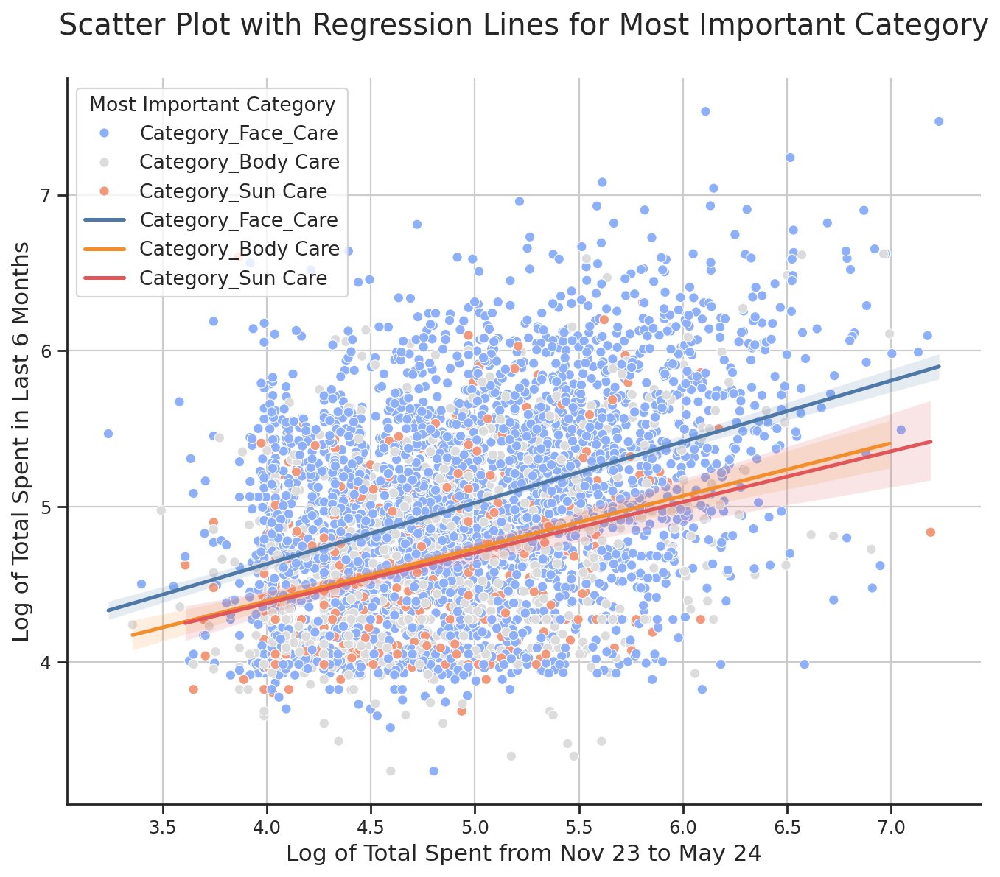

In [ ]:
# Create 'Most Important Category' based on the maximum value in category columns
data['Most Important Category'] = data[category_columns].idxmax(axis=1)

# Creating scatter and regplot for Most Important Category
plt.figure(figsize=(10, 8))
sns.scatterplot(data=data, x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', hue='Most Important Category', palette='coolwarm')

# Adding regression lines for each category
for category in data['Most Important Category'].unique():
    sns.regplot(data=data[data['Most Important Category'] == category],
                x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', scatter=False, label=category)

plt.title('Scatter Plot with Regression Lines for Most Important Category\n', fontsize=18)
plt.xlabel('Log of Total Spent from Nov 23 to May 24', size=14)
plt.ylabel('Log of Total Spent in Last 6 Months', size=14)
plt.legend(title='Most Important Category', loc = 'upper left', fontsize=12)
plt.grid(True)
sns.despine()
plt.show()


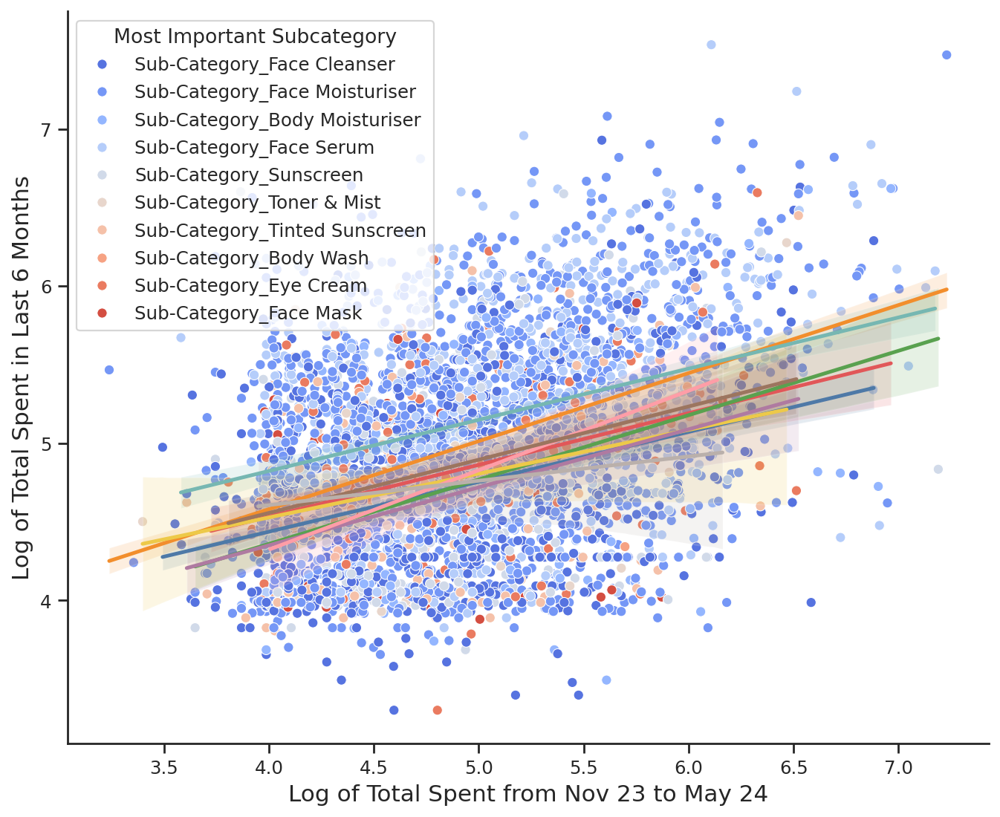

In [ ]:
# Define the subcategory columns (adjust column names as necessary)
subcategory_columns = ['Sub-Category_Face Cleanser', 'Sub-Category_Eye Cream', 'Sub-Category_Face Moisturiser',
                       'Sub-Category_Body Moisturiser', 'Sub-Category_Face Serum', 'Sub-Category_Face Mask',
                       'Sub-Category_Sunscreen', 'Sub-Category_Tinted Sunscreen', 'Sub-Category_Toner & Mist',
                       'Sub-Category_Body Wash']
# Create 'Most Important Subcategory' based on the maximum value in subcategory columns
data['Most Important Subcategory'] = data[subcategory_columns].idxmax(axis=1)

# Creating scatter and regplot for Most Important Subcategory
plt.figure(figsize=(10, 8))
sns.scatterplot(data=data, x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', hue='Most Important Subcategory', palette='coolwarm')

# Adding regression lines for each subcategory
for subcategory in data['Most Important Subcategory'].unique():
    sns.regplot(data=data[data['Most Important Subcategory'] == subcategory],
                x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', scatter=False, label=subcategory)

plt.xlabel('Log of Total Spent from Nov 23 to May 24', size=14)
plt.ylabel('Log of Total Spent in Last 6 Months', size=14)

sns.despine()

In [ ]:
brand_columns = [
    "Brand Description_Anthelios", "Brand Description_Bundle", "Brand Description_Cicaplast",
    "Brand Description_Eau Thermale", "Brand Description_Effaclar", "Brand Description_Hyalu B5",
    "Brand Description_Lipikar", "Brand Description_Niacinamide", "Brand Description_Retinol LRP",
    "Brand Description_Serozinc", "Brand Description_Toleriane", "Brand Description_Uvidea",
    "Brand Description_Vitamin C"
]

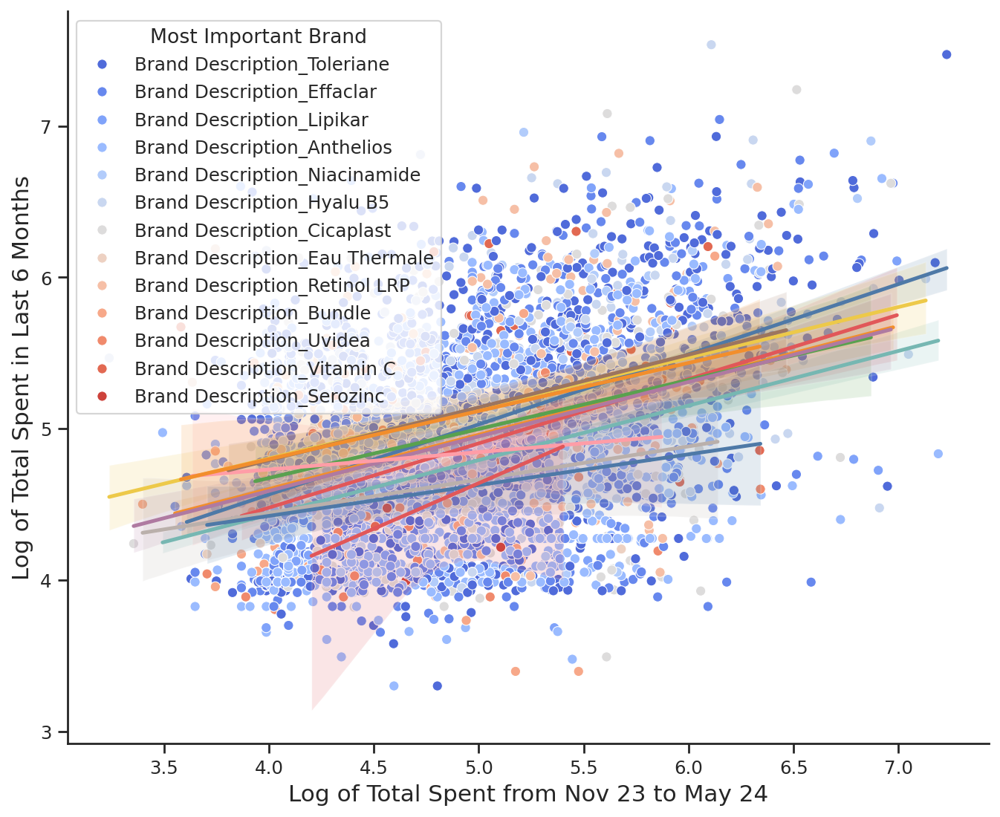

In [ ]:
# Create 'Most Important Brand' based on the maximum value in brand columns
data['Most Important Brand'] = data[brand_columns].idxmax(axis=1)

# Creating scatter and regplot for Most Important Brand
plt.figure(figsize=(10, 8))
sns.scatterplot(data=data, x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', hue='Most Important Brand', palette='coolwarm')

# Adding regression lines for each brand
for brand in data['Most Important Brand'].unique():
    sns.regplot(data=data[data['Most Important Brand'] == brand],
                x='log_Total_Spent_Nov23_May24', y='log_Total_Spent_6M', scatter=False, label=brand)


plt.xlabel('Log of Total Spent from Nov 23 to May 24', size=14)
plt.ylabel('Log of Total Spent in Last 6 Months', size=14)
# plt.legend(fontsize=10, loc = 'upper left')
sns.despine()

### Comments:



# Modelling for Classification Problem (Overall Trend)

In [ ]:
loreal.index = range(0, len(loreal))
yj_Spent = loreal['YJ_Spent']

In [ ]:
loreal["Total_Spent_Nov23_May24"] = original_dependent
loreal["Total_Spent_AllTime"] = total_spent_alltime
loreal.drop(columns="YJ_Spent",inplace=True)
loreal.drop(columns="Total_Spent_AllTime_YJ",inplace=True)

In [ ]:
loreal["Transaction_Count_9M_to_12M"] = loreal['Transaction_Count_12M'] - loreal['Transaction_Count_9M']

loreal["Transaction_Count_6M_to_9M"] = loreal['Transaction_Count_9M'] - loreal['Transaction_Count_6M']

loreal["Transaction_Count_3M_to_6M"] = loreal['Transaction_Count_6M'] - loreal['Transaction_Count_3M']

loreal["Transaction_Count_1M_to_3M"] = loreal['Transaction_Count_3M'] - loreal['Transaction_Count_1M']


In [ ]:
loreal.drop(columns = ['Transaction_Count_1M'],inplace=True)
loreal.drop(columns = ['Transaction_Count_3M'],inplace=True)
loreal.drop(columns = ['Transaction_Count_6M'],inplace=True)
loreal.drop(columns = ['Transaction_Count_9M'],inplace=True)
loreal.drop(columns = ['Transaction_Count_12M'],inplace=True)

In [ ]:
loreal["Total_Spent_9M_to_12M"] = loreal['Total_Spent_12M'] - loreal['Total_Spent_9M']

loreal["Total_Spent_6M_to_9M"] = loreal['Total_Spent_9M'] - loreal['Total_Spent_6M']

loreal["Total_Spent_3M_to_6M"] = loreal['Total_Spent_6M'] - loreal['Total_Spent_3M']

loreal["Total_Spent_1M_to_3M"] = loreal['Total_Spent_3M'] - loreal['Total_Spent_1M']


In [ ]:
loreal.drop(columns = ['Total_Spent_1M'],inplace=True)
loreal.drop(columns = ['Total_Spent_3M'],inplace=True)
loreal.drop(columns = ['Total_Spent_6M'],inplace=True)
loreal.drop(columns = ['Total_Spent_9M'],inplace=True)
loreal.drop(columns = ['Total_Spent_12M'],inplace=True)

In [ ]:
loreal

,Transaction_Count_AllTime,Brand_Description_Cicaplast,Brand_Description_Effaclar,Brand_Description_Hyalu_B5,Brand_Description_Toleriane,Class_Description_Anti_Acne,Class_Description_Anti_Ageing,Class_Description_Face_Care,Sub_Category_Face_Cleanser,Sub_Category_Face_Moisturiser,...,Total_Spent_Nov23_May24,Total_Spent_AllTime,Transaction_Count_9M_to_12M,Transaction_Count_6M_to_9M,Transaction_Count_3M_to_6M,Transaction_Count_1M_to_3M,Total_Spent_9M_to_12M,Total_Spent_6M_to_9M,Total_Spent_3M_to_6M,Total_Spent_1M_to_3M
0,0.0,0.0,1.0,0.0,3.0,1.0,0.0,4.0,2.0,2.0,...,119.81,143.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
1,0.0,0.0,4.0,0.0,0.0,3.0,0.0,2.0,1.0,1.0,...,461.54,189.36,0.0,0.0,1.0,0.0,0.0,0.0,189.36,0.00
2,0.0,1.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,...,38.41,161.59,0.0,0.0,1.0,0.0,0.0,0.0,161.59,0.00
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,168.25,73.62,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,...,82.28,88.85,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6395,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,2.0,0.0,...,55.90,133.85,0.0,0.0,0.0,1.0,0.0,0.0,0.00,133.85
6396,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,136.80,100.15,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
6397,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,196.00,180.67,0.0,0.0,0.0,1.0,0.0,0.0,0.00,180.67
6398,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,2.0,...,58.35,63.40,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00


In [ ]:
loreal_classifi = pd.read_csv("/content/drive/My Drive/QBUS_LOreal_Data_Classification.csv")

In [ ]:
classi_depen

['Brand Description_Anthelios_Output',
 'Brand Description_Cicaplast_Output',
 'Brand Description_Effaclar_Output',
 'Brand Description_Hyalu B5_Output',
 'Brand Description_Lipikar_Output',
 'Brand Description_Toleriane_Output',
 'Brand Description_Vitamin C_Output']

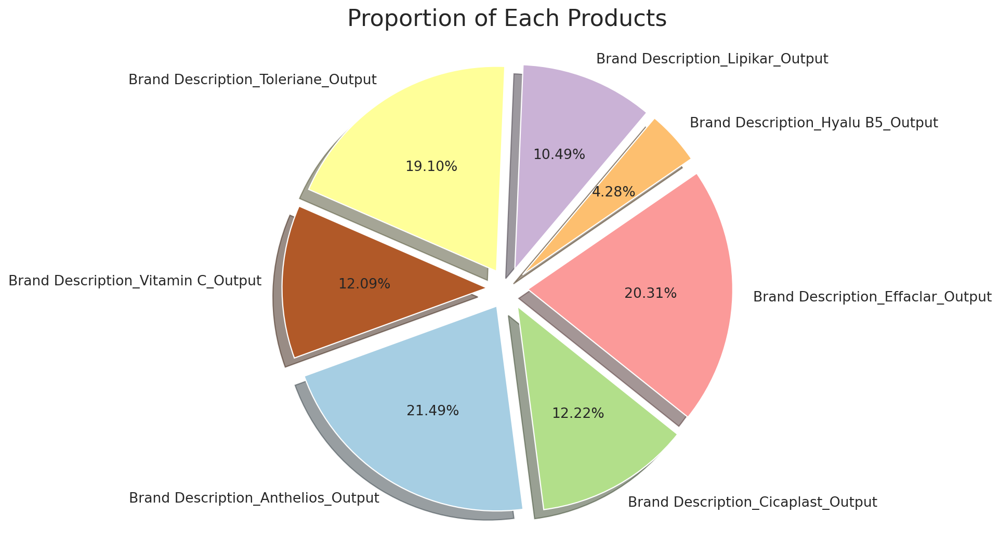

In [ ]:
data = loreal_classifi[classi_depen].sum()
labels = data.index
sizes = data.values
colors = plt.cm.Paired(np.linspace(0, 1, len(labels)))


explode = [0.1] * len(labels)


fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111, aspect='equal')
ax.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.2f%%', shadow=True,
       startangle=200, textprops={'fontsize': 12})


plt.title('Proportion of Each Products', fontsize=20)

plt.show()

# 1: One to One Model Building

In [ ]:
def confus_matrix(y_test,y_pred,title):
    conf_matrix = confusion_matrix(y_test, y_pred)

    disp = ConfusionMatrixDisplay(conf_matrix)
    fig, ax = plt.subplots(figsize=(6, 4))
    disp.plot(cmap=plt.cm.Blues, ax=ax, values_format='d')

    plt.title(f"Confusion Matrix for {title}\n", fontsize=22)
    plt.xlabel('Predicted label', fontsize=18)
    plt.ylabel('True label', fontsize=18)

    for text in disp.text_.ravel():
        text.set_fontsize(16)

    plt.show()

## 1: Logistic Regression Model

In [ ]:
loreal_logestic = loreal.copy()
loreal_logestic= pd.concat([loreal, loreal_classifi.iloc[:,-7:]], axis=1)
x_logestic = loreal_logestic.iloc[:, 0:-7]
y_logestic = loreal_logestic.iloc[:, -7:]
x_logestic

,Transaction_Count_AllTime,Brand_Description_Cicaplast,Brand_Description_Effaclar,Brand_Description_Hyalu_B5,Brand_Description_Toleriane,Class_Description_Anti_Acne,Class_Description_Anti_Ageing,Class_Description_Face_Care,Sub_Category_Face_Cleanser,Sub_Category_Face_Moisturiser,...,Total_Spent_Nov23_May24,Total_Spent_AllTime,Transaction_Count_9M_to_12M,Transaction_Count_6M_to_9M,Transaction_Count_3M_to_6M,Transaction_Count_1M_to_3M,Total_Spent_9M_to_12M,Total_Spent_6M_to_9M,Total_Spent_3M_to_6M,Total_Spent_1M_to_3M
0,0.0,0.0,1.0,0.0,3.0,1.0,0.0,4.0,2.0,2.0,...,119.81,143.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
1,0.0,0.0,4.0,0.0,0.0,3.0,0.0,2.0,1.0,1.0,...,461.54,189.36,0.0,0.0,1.0,0.0,0.0,0.0,189.36,0.00
2,0.0,1.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,...,38.41,161.59,0.0,0.0,1.0,0.0,0.0,0.0,161.59,0.00
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,168.25,73.62,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,...,82.28,88.85,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6395,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,2.0,0.0,...,55.90,133.85,0.0,0.0,0.0,1.0,0.0,0.0,0.00,133.85
6396,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,136.80,100.15,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
6397,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,196.00,180.67,0.0,0.0,0.0,1.0,0.0,0.0,0.00,180.67
6398,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,2.0,...,58.35,63.40,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00


In [ ]:
x_logestic_train, x_logestic_test, y_logestic_train, y_logestic_test = train_test_split(x_logestic, y_logestic, test_size=0.2, random_state=0)
print(x_logestic_train.shape)
print(x_logestic_test.shape)

(5120, 90)
(1280, 90)


In [ ]:
y_logestic

,Brand Description_Anthelios_Output,Brand Description_Cicaplast_Output,Brand Description_Effaclar_Output,Brand Description_Hyalu B5_Output,Brand Description_Lipikar_Output,Brand Description_Toleriane_Output,Brand Description_Vitamin C_Output
0,0,0,1,0,1,1,1
1,0,1,1,1,1,1,1
2,1,0,1,0,0,0,0
3,1,1,0,0,1,0,0
4,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...
6395,0,0,0,0,0,0,0
6396,0,0,1,0,0,0,0
6397,0,0,1,0,0,0,0
6398,0,1,0,0,0,1,0


Training model for Brand Description_Anthelios_Output...

Classification Report for Brand Description_Anthelios_Output:

              precision    recall  f1-score   support

           0       0.57      0.87      0.69       706
           1       0.55      0.20      0.29       574

    accuracy                           0.57      1280
   macro avg       0.56      0.53      0.49      1280
weighted avg       0.56      0.57      0.51      1280

F1 Score for class 1 in Brand Description_Anthelios_Output: 0.29118773946360155
Best hyperparameters for Brand Description_Anthelios_Output: {'C': 0.01, 'penalty': 'l1'}



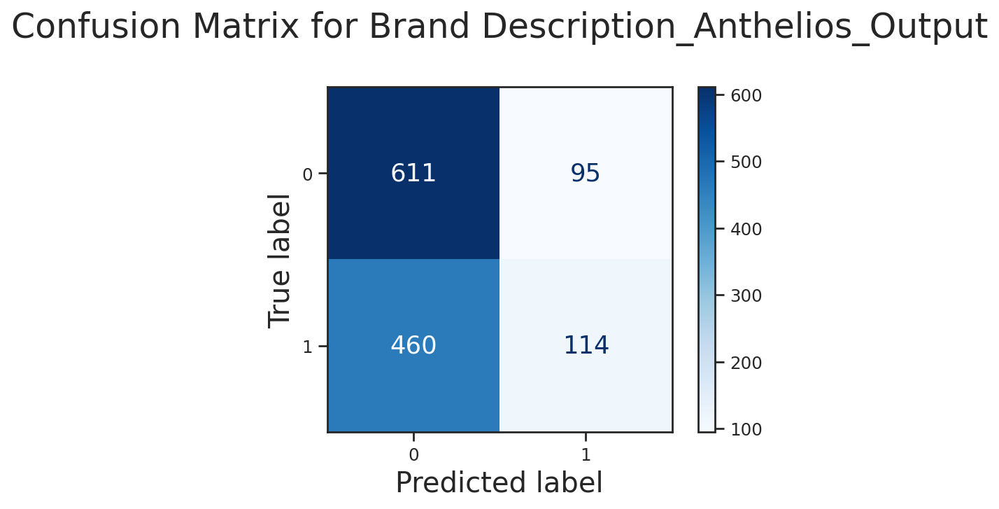

Training model for Brand Description_Cicaplast_Output...

Classification Report for Brand Description_Cicaplast_Output:

              precision    recall  f1-score   support

           0       0.74      1.00      0.85       943
           1       0.83      0.03      0.06       337

    accuracy                           0.74      1280
   macro avg       0.79      0.51      0.45      1280
weighted avg       0.77      0.74      0.64      1280

F1 Score for class 1 in Brand Description_Cicaplast_Output: 0.05730659025787966
Best hyperparameters for Brand Description_Cicaplast_Output: {'C': 0.01, 'penalty': 'l2'}



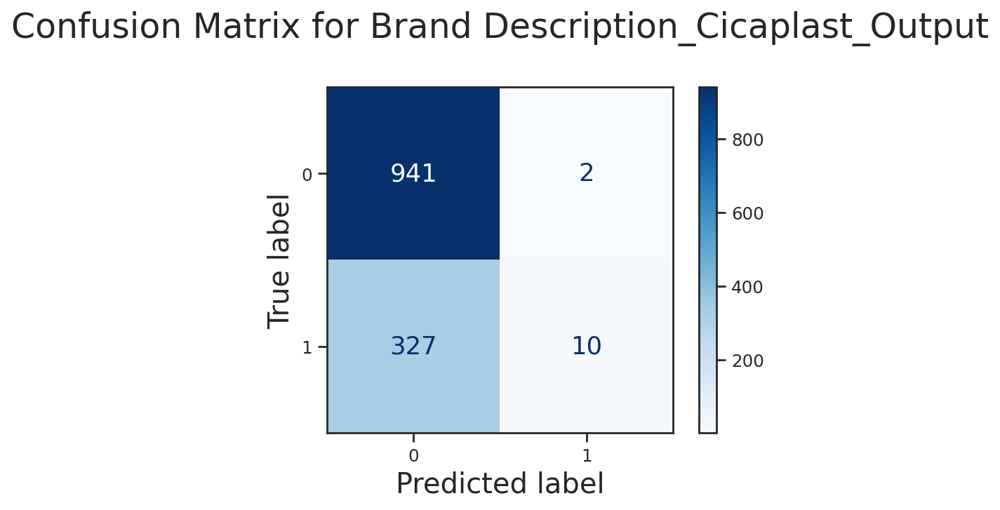

Training model for Brand Description_Effaclar_Output...

Classification Report for Brand Description_Effaclar_Output:

              precision    recall  f1-score   support

           0       0.67      0.90      0.77       751
           1       0.72      0.37      0.49       529

    accuracy                           0.68      1280
   macro avg       0.69      0.63      0.63      1280
weighted avg       0.69      0.68      0.65      1280

F1 Score for class 1 in Brand Description_Effaclar_Output: 0.4868913857677903
Best hyperparameters for Brand Description_Effaclar_Output: {'C': 0.01, 'penalty': 'l1'}



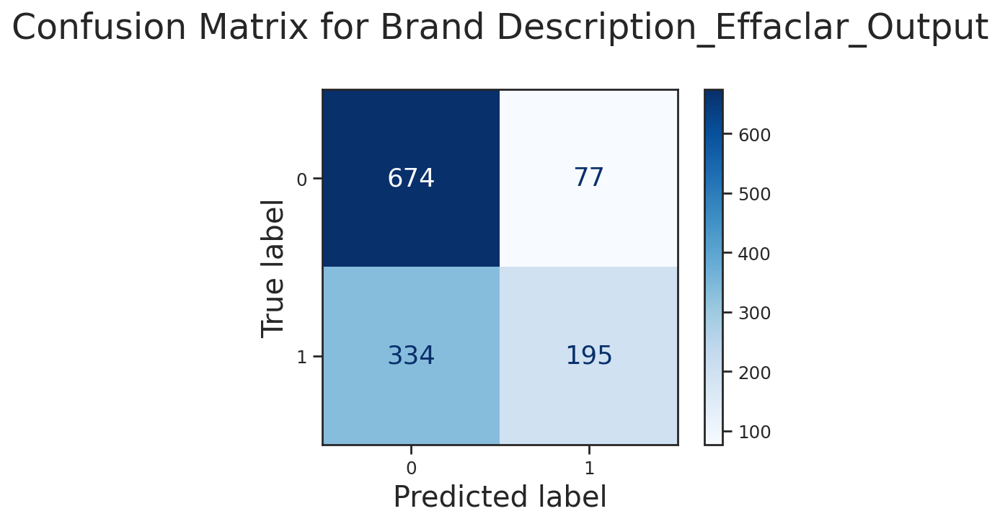

Training model for Brand Description_Hyalu B5_Output...

Classification Report for Brand Description_Hyalu B5_Output:

              precision    recall  f1-score   support

           0       0.92      1.00      0.96      1178
           1       0.00      0.00      0.00       102

    accuracy                           0.92      1280
   macro avg       0.46      0.50      0.48      1280
weighted avg       0.85      0.92      0.88      1280

F1 Score for class 1 in Brand Description_Hyalu B5_Output: 0.0
Best hyperparameters for Brand Description_Hyalu B5_Output: {'C': 0.01, 'penalty': 'l1'}



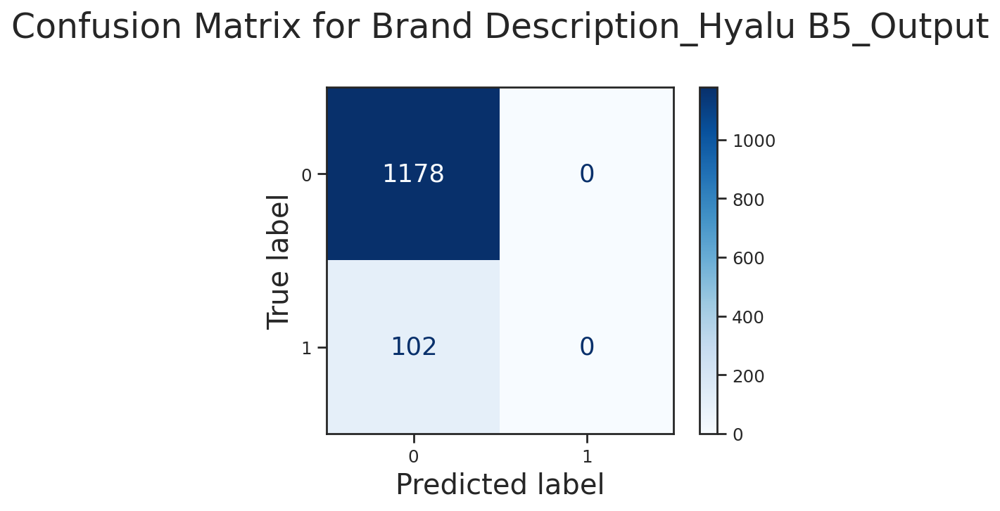

Training model for Brand Description_Lipikar_Output...

Classification Report for Brand Description_Lipikar_Output:

              precision    recall  f1-score   support

           0       0.77      1.00      0.87       989
           1       0.50      0.00      0.01       291

    accuracy                           0.77      1280
   macro avg       0.64      0.50      0.44      1280
weighted avg       0.71      0.77      0.68      1280

F1 Score for class 1 in Brand Description_Lipikar_Output: 0.006825938566552901
Best hyperparameters for Brand Description_Lipikar_Output: {'C': 0.01, 'penalty': 'l2'}



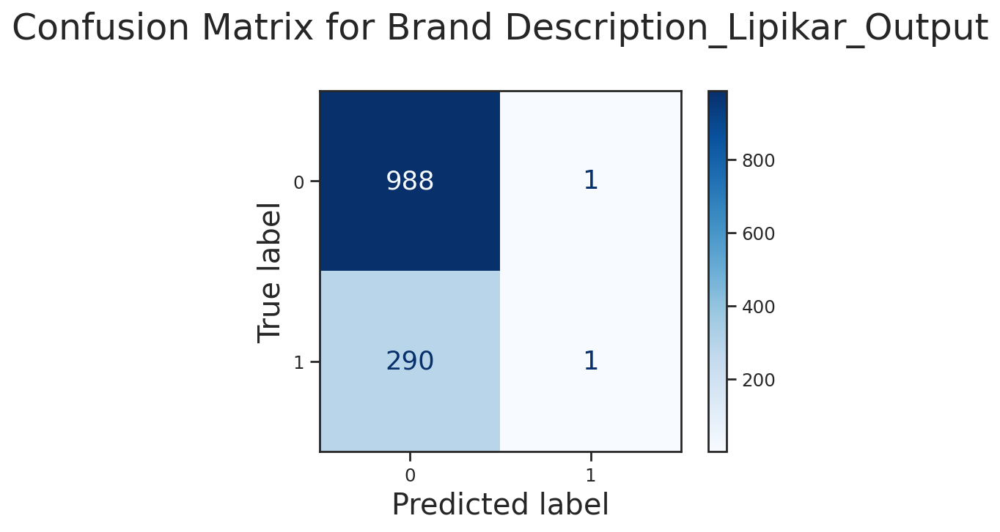

Training model for Brand Description_Toleriane_Output...

Classification Report for Brand Description_Toleriane_Output:

              precision    recall  f1-score   support

           0       0.70      0.93      0.80       777
           1       0.78      0.38      0.51       503

    accuracy                           0.71      1280
   macro avg       0.74      0.66      0.66      1280
weighted avg       0.73      0.71      0.69      1280

F1 Score for class 1 in Brand Description_Toleriane_Output: 0.5126835781041389
Best hyperparameters for Brand Description_Toleriane_Output: {'C': 0.01, 'penalty': 'l1'}



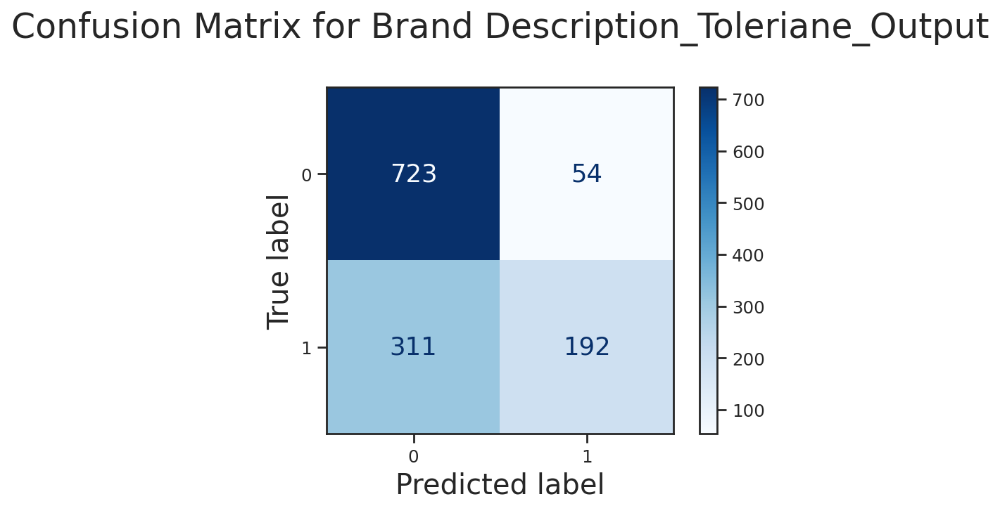

Training model for Brand Description_Vitamin C_Output...

Classification Report for Brand Description_Vitamin C_Output:

              precision    recall  f1-score   support

           0       0.76      1.00      0.86       966
           1       0.50      0.01      0.01       314

    accuracy                           0.75      1280
   macro avg       0.63      0.50      0.44      1280
weighted avg       0.69      0.75      0.65      1280

F1 Score for class 1 in Brand Description_Vitamin C_Output: 0.012578616352201259
Best hyperparameters for Brand Description_Vitamin C_Output: {'C': 0.1, 'penalty': 'l2'}



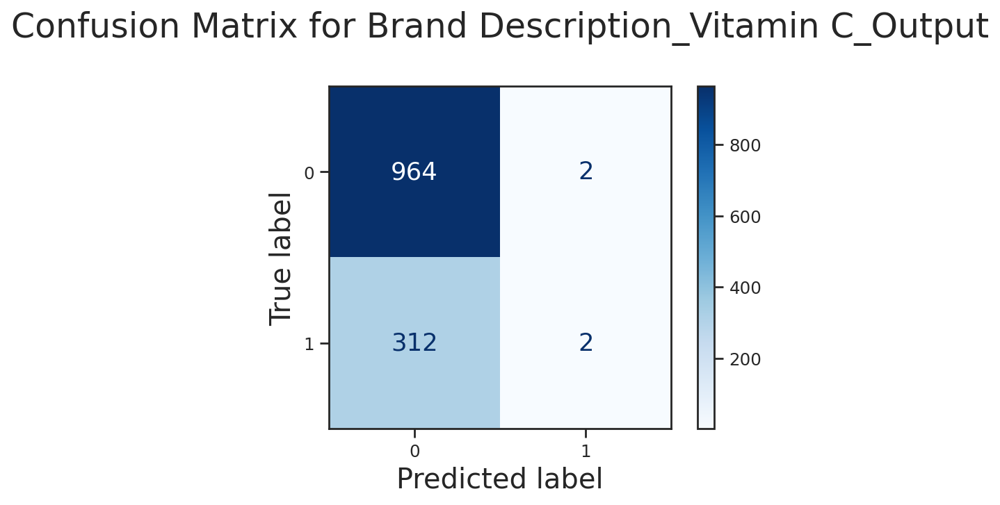

F1 Scores for class 1 across all labels:
 [0.29118773946360155, 0.05730659025787966, 0.4868913857677903, 0.0, 0.006825938566552901, 0.5126835781041389, 0.012578616352201259]
Overall Accuracy for each label:
 [0.56640625, 0.74296875, 0.67890625, 0.9203125, 0.77265625, 0.71484375, 0.7546875]
Best hyperparameters for each label:
 [{'C': 0.01, 'penalty': 'l1'}, {'C': 0.01, 'penalty': 'l2'}, {'C': 0.01, 'penalty': 'l1'}, {'C': 0.01, 'penalty': 'l1'}, {'C': 0.01, 'penalty': 'l2'}, {'C': 0.01, 'penalty': 'l1'}, {'C': 0.1, 'penalty': 'l2'}]


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, f1_score, accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

param_grid = {
    'penalty': ['l1', 'l2'],  # L1 (Lasso) and L2 (Ridge) regularization
    'C': [0.01, 0.1, 1, 10, 100]  # Regularization strength
}

f1_scores_class_1 = []
accuracies = []
best_params_list = []

for i, column in enumerate(y_logestic.columns):
    print(f"Training model for {column}...\n")

    log_reg_model = LogisticRegression(max_iter=1000, solver='saga')
    grid_search = GridSearchCV(log_reg_model, param_grid, cv=3, scoring='f1_macro')

    # Fit the model for the current output column
    grid_search.fit(x_logestic_train, y_logestic_train.iloc[:, i])
    best_model = grid_search.best_estimator_

    # Make predictions
    y_log_pred = best_model.predict(x_logestic_test)

    # Print classification report and F1 score for class 1
    print(f"Classification Report for {column}:\n")
    print(classification_report(y_logestic_test.iloc[:, i], y_log_pred))

    f1_class_1 = f1_score(y_logestic_test.iloc[:, i], y_log_pred, average=None)[1]
    accuracy = accuracy_score(y_logestic_test.iloc[:, i], y_log_pred)

    f1_scores_class_1.append(f1_class_1)
    accuracies.append(accuracy)
    best_params_list.append(grid_search.best_params_)

    print(f"F1 Score for class 1 in {column}: {f1_class_1}")
    print(f"Best hyperparameters for {column}: {grid_search.best_params_}\n")

    # Display the confusion matrix
    confus_matrix(y_logestic_test.iloc[:, i], y_log_pred, title=column)

    # Plot feature importance (coefficients) for this logistic regression model
    plot_logistic_regression_feature_importance(best_model, x_logestic.columns, column)

print("F1 Scores for class 1 across all labels:\n", f1_scores_class_1)
print("Overall Accuracy for each label:\n", accuracies)
print("Best hyperparameters for each label:\n", best_params_list)


# Function to plot feature importance using Logistic Regression coefficients
def plot_logistic_regression_feature_importance(model, feature_names, label_name):
    coef = model.coef_.flatten()  # Get the coefficients from the trained model

    # Sort the features by importance (absolute value of coefficients)
    importance = np.abs(coef)
    sorted_idx = np.argsort(importance)[::-1]

    plt.figure(figsize=(10, 6))

    # Plot the top 15 most important features
    top_features = sorted_idx[:15]
    plt.barh([feature_names[i] for i in top_features], coef[top_features], color='skyblue')

    plt.title(f"Feature Importance for {label_name}", fontsize=16)
    plt.xlabel('Coefficient Value (Impact on Prediction)', fontsize=14)
    plt.ylabel('Features', fontsize=12)

    plt.gca().invert_yaxis()  # Invert y-axis to display the highest importance on top
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    sns.despine()
    plt.show()


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.multioutput import MultiOutputClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, f1_score, accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Define the base logistic regression model
log_reg_model = LogisticRegression(max_iter=1000, solver='saga')

# Define hyperparameters for L1 and L2 regularization
param_grid = {
    'estimator__penalty': ['l1', 'l2'],  # L1 (Lasso) and L2 (Ridge) regularization
    'estimator__C': [0.01, 0.1, 1, 10, 100]  # Regularization strength
}

# Wrap the logistic regression model in MultiOutputClassifier for multi-label classification
multi_output_model = MultiOutputClassifier(log_reg_model)

# Perform GridSearchCV to tune the hyperparameters
grid_search = GridSearchCV(multi_output_model, param_grid, cv=3, scoring='f1_macro')

# Fit the model using the training data
grid_search.fit(x_logestic_train, y_logestic_train)

# Get the best model after hyperparameter tuning
best_model = grid_search.best_estimator_

# Make predictions using the best model
y_log_pred = best_model.predict(x_logestic_test)

# Initialize lists to store F1 scores for class 1 and accuracies for each label
f1_scores_class_1 = []
accuracies = []

# Evaluate the model for each label
for i, column in enumerate(y_logestic.columns):
    print(f"Classification Report for {column}:\n")
    print(classification_report(y_logestic_test.iloc[:, i], y_log_pred[:, i]))

    # Get the F1 score for class 1
    f1_class_1 = f1_score(y_logestic_test.iloc[:, i], y_log_pred[:, i], average=None)[1]  # F1 score for class 1
    accuracy = accuracy_score(y_logestic_test.iloc[:, i], y_log_pred[:, i])

    f1_scores_class_1.append(f1_class_1)
    accuracies.append(accuracy)

    print(f"F1 Score for class 1 in {column}: {f1_class_1}")
    print(f"Accuracy for {column}: {accuracy}")

    # Display feature importance for each label (based on logistic regression coefficients)
    plot_logistic_regression_feature_importance(best_model.estimators_[i], x_logestic.columns, column)

# Print F1 scores for class 1 and accuracy for each label
print("F1 Scores for class 1 across all labels:\n", f1_scores_class_1)
print("Overall Accuracy for each label:\n", accuracies)

# Print the best hyperparameters found by GridSearchCV
print(f"Best hyperparameters found by GridSearchCV: {grid_search.best_params_}")


# Function to plot feature importance using Logistic Regression coefficients
def plot_logistic_regression_feature_importance(model, feature_names, label_name):
    coef = model.coef_.flatten()  # Get the coefficients from the trained model

    # Sort the features by importance (absolute value of coefficients)
    importance = np.abs(coef)
    sorted_idx = np.argsort(importance)[::-1]

    plt.figure(figsize=(10, 6))

    # Plot the top 15 most important features
    top_features = sorted_idx[:15]
    plt.barh([feature_names[i] for i in top_features], coef[top_features], color='skyblue')

    plt.title(f"Feature Importance for {label_name}", fontsize=16)
    plt.xlabel('Coefficient Value (Impact on Prediction)', fontsize=14)
    plt.ylabel('Features', fontsize=12)

    plt.gca().invert_yaxis()  # Invert y-axis to display the highest importance on top
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    sns.despine()
    plt.show()


Classification Report for Brand Description_Anthelios_Output:

              precision    recall  f1-score   support

           0       0.57      0.87      0.69       706
           1       0.55      0.20      0.29       574

    accuracy                           0.57      1280
   macro avg       0.56      0.53      0.49      1280
weighted avg       0.56      0.57      0.51      1280

F1 Score for class 1 in Brand Description_Anthelios_Output: 0.29118773946360155
Accuracy for Brand Description_Anthelios_Output: 0.56640625


NameError: name 'plot_logistic_regression_feature_importance' is not defined

## 2: Neural Network Model

In [ ]:
def plot_roc_curve(y_test,y_pred):

    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)

    fig, ax = plt.subplots(figsize=(8, 6))

    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate',size=14)
    plt.ylabel('True Positive Rate',size=14)
    plt.title('Receiver Operating Characteristic (ROC) Curve\n', fontsize = 18)
    plt.legend(loc='lower right')
    plt.show()

In [ ]:
def f1_score_group1(y_true, y_pred):
    y_pred = tf.round(y_pred)
    tp = tf.reduce_sum(tf.cast(y_true * y_pred, 'float32'), axis=0)
    fp = tf.reduce_sum(tf.cast((1 - y_true) * y_pred, 'float32'), axis=0)
    fn = tf.reduce_sum(tf.cast(y_true * (1 - y_pred), 'float32'), axis=0)

    precision = tp / (tp + fp + K.epsilon())
    recall = tp / (tp + fn + K.epsilon())

    f1 = 2 * (precision * recall) / (precision + recall + K.epsilon())
    return tf.reduce_mean(f1)

In [ ]:
# Define a function to build the model
def best_neural_network(hp):
    model = tf.keras.Sequential()
    n_features = loreal.shape[1]

    # First hidden layer
    model.add(tf.keras.layers.Dense(units=hp.Int('units_1', min_value=64, max_value=256, step=32),
                                    input_dim=n_features, activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(rate=hp.Float('dropout_1', min_value=0.0, max_value=0.3, step=0.1)))

    # Optional second and third hidden layers
    for i in range(hp.Int('num_layers', 1, 3)):
        model.add(tf.keras.layers.Dense(units=hp.Int(f'units_{i+2}', min_value=64, max_value=256, step=32), activation='relu'))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Dropout(rate=hp.Float(f'dropout_{i+2}', min_value=0.0, max_value=0.3, step=0.1)))

    # Final output layer
    model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

    # Tune the learning rate
    learning_rate = hp.Choice('learning_rate', values=[1e-4, 1e-3, 1e-2])

    # Compile model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),f1_score_group1])

    return model


### 2.1: Neural network model (Brand Description_Hyalu B5_Output)

In [ ]:
loreal_nn = loreal.copy()

In [ ]:
loreal_nn_B5 = loreal_nn.copy()

loreal_nn_B5["Brand Description_Hyalu B5_Output"] = loreal_classifi["Brand Description_Hyalu B5_Output"]

In [ ]:
x_nn_B5 = loreal_nn_B5.iloc[:, 0:-1]
y_nn_B5 = np.array(loreal_nn_B5['Brand Description_Hyalu B5_Output'])

x_nn_B5_train, x_nn_B5_test, y_nn_B5_train, y_nn_B5_test = train_test_split(x_nn_B5, y_nn_B5, test_size=0.2, random_state=0)
print(x_nn_B5_train.shape)
print(x_nn_B5_test.shape)

(5120, 90)
(1280, 90)


### 2.1.1: Finding balanced class weights

In [ ]:
classes = np.unique(y_nn_B5_train)
weights = class_weight.compute_class_weight(class_weight='balanced', classes=classes, y=y_nn_B5_train)
class_weights = dict(enumerate(weights))


In [ ]:
class_weights

{0: 0.5490027879047823, 1: 5.601750547045952}

### 2.1.2: Hyperparameter tuning

In [ ]:
tuner = kt.RandomSearch(
    best_neural_network,
    objective=kt.Objective("val_f1_score_group1", direction="max"),
    max_trials=20,  # Number of hyperparameter combinations to try
    executions_per_trial=3,  # Number of models to build and fit for each trial
    directory='neural_network_B5',
    project_name='tuning_nn_with_f1'
)

# Define early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=20, restore_best_weights=True)


In [ ]:
scaler = MinMaxScaler()


tf.keras.utils.set_random_seed(0)

tuner.search(x_nn_B5_train, y_nn_B5_train,
             epochs=50,
             batch_size=tuner.oracle.hyperparameters.Choice('batch_size', [8, 16, 32, 64]),
             validation_split=0.2,
             shuffle=True,
             callbacks=[early_stopping],
             class_weight=class_weights,
             verbose=2)

Oracle triggered exit


Trial 20 Complete [00h 00m 37s]
val_f1_score_group1: 0.2475363165140152

Best val_f1_score_group1 So Far: 0.2496775339047114
Total elapsed time: 00h 13m 06s


### 2.1.3: Best Model Information

In [ ]:
# Get the best hyperparameters and model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

In [ ]:
print(f"Best units for input layer: {best_hps.get('units_1')}")
print(f"Best dropout rate for input layer: {best_hps.get('dropout_1')}")


print(f"Best number of hidden layers: {best_hps.get('num_layers')}")

if best_hps.get('num_layers') >= 1:
    print(f"Best units for first layer: {best_hps.get('units_2')}")
    print(f"Best dropout rate for first layer: {best_hps.get('dropout_2')}")

if best_hps.get('num_layers') >= 2:
    print(f"Best units for second layer: {best_hps.get('units_3')}")
    print(f"Best dropout rate for second layer: {best_hps.get('dropout_3')}")

if best_hps.get('num_layers') >= 3:
    print(f"Best units for third layer: {best_hps.get('units_4')}")
    print(f"Best dropout rate for third layer: {best_hps.get('dropout_4')}")



print(f"Best batch_size: {best_hps.get('batch_size')}")
print(f"Best learning_rate: {best_hps.get('learning_rate')}")

Best units for input layer: 128
Best dropout rate for input layer: 0.2
Best number of hidden layers: 1
Best units for first layer: 64
Best dropout rate for first layer: 0.1
Best batch_size: 32
Best learning_rate: 0.001


### 2.1.4: Model Building

In [ ]:
tf.keras.utils.set_random_seed(0)


model_nn_B5 = tf.keras.Sequential()
n_features = x_nn_B5_train.shape[1]
n_outputs = 1


model_nn_B5.add(tf.keras.layers.Dense(128, input_dim=n_features, activation='relu',kernel_initializer='he_normal'))
model_nn_B5.add(tf.keras.layers.BatchNormalization())
model_nn_B5.add(tf.keras.layers.Dropout(0.2))


model_nn_B5.add(tf.keras.layers.Dense(64, activation='relu',kernel_initializer='he_normal'))
model_nn_B5.add(tf.keras.layers.BatchNormalization())
model_nn_B5.add(tf.keras.layers.Dropout(0.1))



model_nn_B5.add(tf.keras.layers.Dense(1, activation='sigmoid'))


learning_rate = 0.001


model_nn_B5.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.AUC(name='auc'), f1_score_group1])


early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=100, restore_best_weights=True)


history = model_nn_B5.fit(x_nn_B5_train, y_nn_B5_train,
                    epochs=100,
                    batch_size=32,
                    validation_split=0.2,
                    shuffle=True,
                    callbacks=[early_stopping],
                    class_weight=class_weights,
                    verbose=1)


Epoch 1/100
128/128 [==============================] - 1s 2ms/step - loss: 0.7122 - accuracy: 0.6182 - auc: 0.6764 - f1_score_group1: 0.2228 - val_loss: 0.7795 - val_accuracy: 0.5205 - val_auc: 0.7359 - val_f1_score_group1: 0.2129
Epoch 2/100
128/128 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.6404 - auc: 0.6766 - f1_score_group1: 0.2310 - val_loss: 0.6868 - val_accuracy: 0.6309 - val_auc: 0.7661 - val_f1_score_group1: 0.2488
Epoch 3/100
128/128 [==============================] - 0s 1ms/step - loss: 0.6510 - accuracy: 0.6421 - auc: 0.6982 - f1_score_group1: 0.2363 - val_loss: 0.6404 - val_accuracy: 0.6338 - val_auc: 0.7555 - val_f1_score_group1: 0.2488
Epoch 4/100
128/128 [==============================] - 0s 1ms/step - loss: 0.6313 - accuracy: 0.6370 - auc: 0.7158 - f1_score_group1: 0.2476 - val_loss: 0.6094 - val_accuracy: 0.6523 - val_auc: 0.7747 - val_f1_score_group1: 0.2626
Epoch 5/100
128/128 [==============================] - 0s 1ms/step - loss: 0

128/128 [==============================] - 0s 948us/step - loss: 0.5252 - accuracy: 0.6812 - auc: 0.8075 - f1_score_group1: 0.2867 - val_loss: 0.5470 - val_accuracy: 0.6807 - val_auc: 0.8303 - val_f1_score_group1: 0.2925
Epoch 37/100
128/128 [==============================] - 0s 936us/step - loss: 0.5349 - accuracy: 0.6819 - auc: 0.7995 - f1_score_group1: 0.2876 - val_loss: 0.5831 - val_accuracy: 0.6504 - val_auc: 0.8282 - val_f1_score_group1: 0.2877
Epoch 38/100
128/128 [==============================] - 0s 1ms/step - loss: 0.5288 - accuracy: 0.6912 - auc: 0.8079 - f1_score_group1: 0.2900 - val_loss: 0.5200 - val_accuracy: 0.7070 - val_auc: 0.8233 - val_f1_score_group1: 0.3098
Epoch 39/100
128/128 [==============================] - 0s 933us/step - loss: 0.5350 - accuracy: 0.6860 - auc: 0.8011 - f1_score_group1: 0.2909 - val_loss: 0.6355 - val_accuracy: 0.6250 - val_auc: 0.8307 - val_f1_score_group1: 0.2724
Epoch 40/100
128/128 [==============================] - 0s 873us/step - loss: 0

128/128 [==============================] - 0s 910us/step - loss: 0.5056 - accuracy: 0.7012 - auc: 0.8277 - f1_score_group1: 0.3079 - val_loss: 0.5466 - val_accuracy: 0.6992 - val_auc: 0.8385 - val_f1_score_group1: 0.3201
Epoch 72/100
128/128 [==============================] - 0s 984us/step - loss: 0.4924 - accuracy: 0.7219 - auc: 0.8338 - f1_score_group1: 0.3279 - val_loss: 0.4876 - val_accuracy: 0.7500 - val_auc: 0.8196 - val_f1_score_group1: 0.3289
Epoch 73/100
128/128 [==============================] - 0s 896us/step - loss: 0.5112 - accuracy: 0.7119 - auc: 0.8239 - f1_score_group1: 0.3128 - val_loss: 0.5218 - val_accuracy: 0.7109 - val_auc: 0.8270 - val_f1_score_group1: 0.3097
Epoch 74/100
128/128 [==============================] - 0s 844us/step - loss: 0.4941 - accuracy: 0.6890 - auc: 0.8309 - f1_score_group1: 0.3066 - val_loss: 0.6050 - val_accuracy: 0.6289 - val_auc: 0.8083 - val_f1_score_group1: 0.2824
Epoch 75/100
128/128 [==============================] - 0s 868us/step - loss:

In [ ]:
model_nn_B5.evaluate(x_nn_B5_test, y_nn_B5_test)

40/40 [==============================] - 0s 560us/step - loss: 0.4469 - accuracy: 0.7758 - auc: 0.7867 - f1_score_group1: 0.2819


[0.44687598943710327,
 0.7757812738418579,
 0.7866648435592651,
 0.2819354236125946]

In [ ]:
y_pred_nn_B5 = model_nn_B5.predict(x_nn_B5_test)

y_pred_nn_B5 = (y_pred_nn_B5 > 0.5).astype(int)

print(classification_report(y_nn_B5_test, y_pred_nn_B5))

40/40 [==============================] - 0s 437us/step
              precision    recall  f1-score   support

           0       0.96      0.79      0.87      1178
           1       0.21      0.65      0.32       102

    accuracy                           0.78      1280
   macro avg       0.59      0.72      0.59      1280
weighted avg       0.90      0.78      0.82      1280



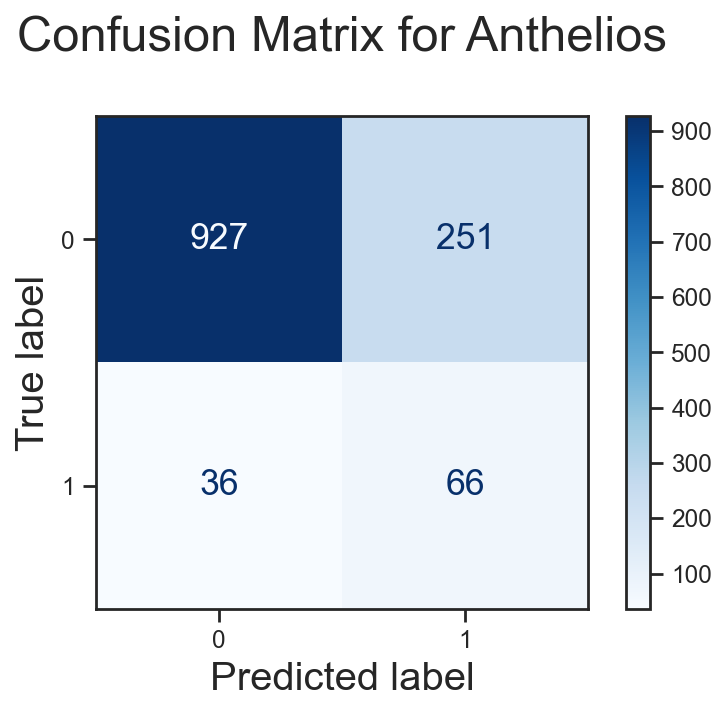

In [ ]:
confus_matrix(y_nn_B5_test, y_pred_nn_B5, "B5")

40/40 [==============================] - 0s 486us/step


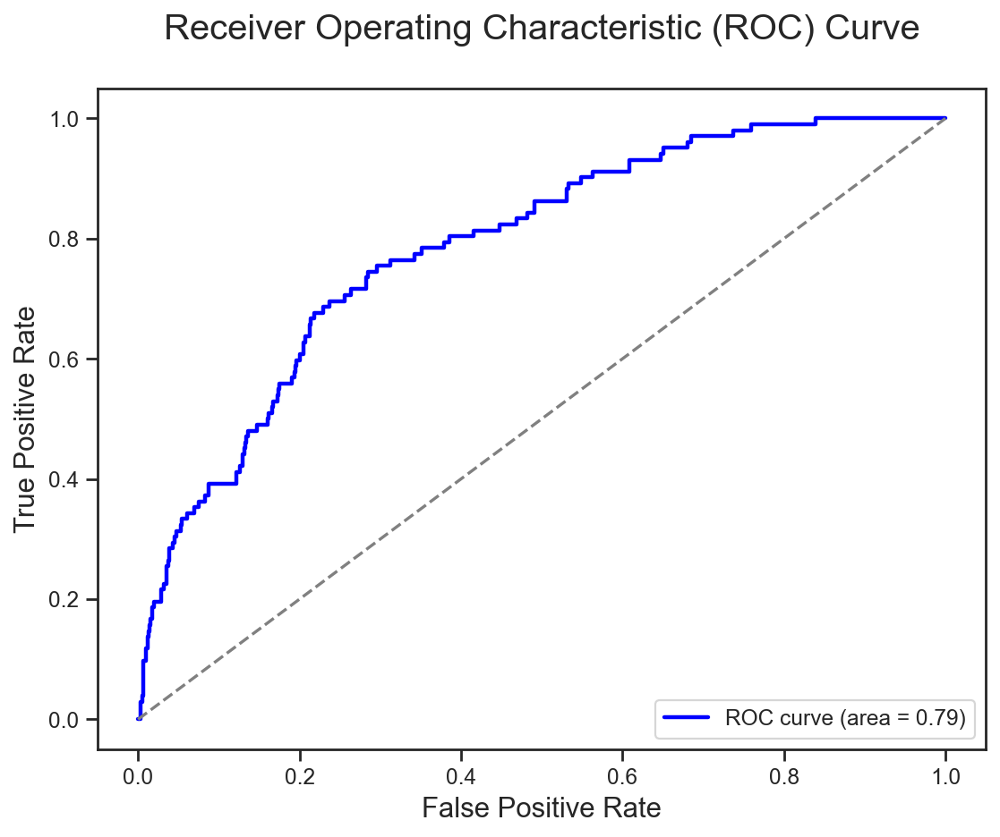

In [ ]:
plot_roc_curve(y_nn_B5_test, model_nn_B5.predict(x_nn_B5_test))

### 2.2: Neural network model (Brand Description_Lipikar_Output)

In [ ]:
loreal_nn_lipikar = loreal_nn.copy()

loreal_nn_lipikar["Brand Description_Lipikar_Output"] = loreal_classifi["Brand Description_Lipikar_Output"]

In [ ]:
x_nn_lipikar = loreal_nn_lipikar.iloc[:, 0:-1]
y_nn_lipikar = np.array(loreal_nn_lipikar['Brand Description_Lipikar_Output'])

x_nn_lipikar_train, x_nn_lipikar_test, y_nn_lipikar_train, y_nn_lipikar_test = train_test_split(x_nn_lipikar, y_nn_lipikar, test_size=0.2, random_state=0)
print(x_nn_lipikar_train.shape)
print(x_nn_lipikar_test.shape)

(5120, 90)
(1280, 90)


### 2.2.1: Finding balanced class weights

In [ ]:
classes = np.unique(y_nn_lipikar_train)
weights = class_weight.compute_class_weight(class_weight='balanced', classes=classes, y=y_nn_lipikar_train)
class_weights = dict(enumerate(weights))


In [ ]:
class_weights

{0: 0.6336633663366337, 1: 2.3703703703703702}

### 2.2.2: Hyperparameter tuning

In [ ]:
tuner = kt.RandomSearch(
    best_neural_network,
    objective=kt.Objective("val_f1_score_group1", direction="max"),
    max_trials=20,  # Number of hyperparameter combinations to try
    executions_per_trial=3,  # Number of models to build and fit for each trial
    directory='neural_network_lipikar',
    project_name='tuning_nn_with_f1'
)

# Define early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=20, restore_best_weights=True)


In [ ]:
tf.keras.utils.set_random_seed(0)

tuner.search(x_nn_lipikar_train, y_nn_lipikar_train,
             epochs=50,
             batch_size=tuner.oracle.hyperparameters.Choice('batch_size', [8, 16, 32, 64]),
             validation_split=0.2,
             shuffle=True,
             callbacks=[early_stopping],
             class_weight=class_weights,
             verbose=2)

Oracle triggered exit


Trial 20 Complete [00h 00m 34s]
val_f1_score_group1: 0.38482666015625

Best val_f1_score_group1 So Far: 0.3878025710582733
Total elapsed time: 00h 13m 30s


### 2.2.3: Best Model Information

In [ ]:
# Get the best hyperparameters and model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

In [ ]:
print(f"Best units for input layer: {best_hps.get('units_1')}")
print(f"Best dropout rate for input layer: {best_hps.get('dropout_1')}")


print(f"Best number of hidden layers: {best_hps.get('num_layers')}")

if best_hps.get('num_layers') >= 1:
    print(f"Best units for first layer: {best_hps.get('units_2')}")
    print(f"Best dropout rate for first layer: {best_hps.get('dropout_2')}")

if best_hps.get('num_layers') >= 2:
    print(f"Best units for second layer: {best_hps.get('units_3')}")
    print(f"Best dropout rate for second layer: {best_hps.get('dropout_3')}")

if best_hps.get('num_layers') >= 3:
    print(f"Best units for third layer: {best_hps.get('units_4')}")
    print(f"Best dropout rate for third layer: {best_hps.get('dropout_4')}")



print(f"Best batch_size: {best_hps.get('batch_size')}")
print(f"Best learning_rate: {best_hps.get('learning_rate')}")

Best units for input layer: 256
Best dropout rate for input layer: 0.2
Best number of hidden layers: 1
Best units for first layer: 256
Best dropout rate for first layer: 0.30000000000000004
Best batch_size: 32
Best learning_rate: 0.01


### 2.2.4: Model Building

In [ ]:
tf.keras.utils.set_random_seed(0)


model_nn_lipikar = tf.keras.Sequential()
n_features = x_nn_B5_train.shape[1]
n_outputs = 1


model_nn_lipikar.add(tf.keras.layers.Dense(256, input_dim=n_features, activation='relu',kernel_initializer='he_normal'))
model_nn_lipikar.add(tf.keras.layers.BatchNormalization())
model_nn_lipikar.add(tf.keras.layers.Dropout(0.2))


model_nn_lipikar.add(tf.keras.layers.Dense(256, activation='relu',kernel_initializer='he_normal'))
model_nn_lipikar.add(tf.keras.layers.BatchNormalization())
model_nn_lipikar.add(tf.keras.layers.Dropout(0.3))



model_nn_lipikar.add(tf.keras.layers.Dense(1, activation='sigmoid'))


learning_rate = 0.01


model_nn_lipikar.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),f1_score_group1])


early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=100, restore_best_weights=True)

# 训练模型
history = model_nn_lipikar.fit(x_nn_lipikar_train, y_nn_lipikar_train,
                    epochs=100,
                    batch_size=32,
                    validation_split=0.2,
                    shuffle=True,
                    callbacks=[early_stopping],
                    class_weight=class_weights,
                    verbose=1)


Epoch 1/100
128/128 [==============================] - 1s 3ms/step - loss: 0.8376 - accuracy: 0.5276 - auc: 0.5290 - f1_score_group1: 0.3001 - val_loss: 0.7867 - val_accuracy: 0.5010 - val_auc: 0.5889 - val_f1_score_group1: 0.3572
Epoch 2/100
128/128 [==============================] - 0s 2ms/step - loss: 0.7353 - accuracy: 0.5527 - auc: 0.5528 - f1_score_group1: 0.3170 - val_loss: 0.6891 - val_accuracy: 0.6162 - val_auc: 0.5095 - val_f1_score_group1: 0.2423
Epoch 3/100
128/128 [==============================] - 0s 2ms/step - loss: 0.7189 - accuracy: 0.5559 - auc: 0.5651 - f1_score_group1: 0.3361 - val_loss: 0.6834 - val_accuracy: 0.6855 - val_auc: 0.5884 - val_f1_score_group1: 0.2460
Epoch 4/100
128/128 [==============================] - 0s 2ms/step - loss: 0.7199 - accuracy: 0.5547 - auc: 0.5624 - f1_score_group1: 0.3334 - val_loss: 0.6730 - val_accuracy: 0.6270 - val_auc: 0.6127 - val_f1_score_group1: 0.3482
Epoch 5/100
128/128 [==============================] - 0s 2ms/step - loss: 0

128/128 [==============================] - 0s 2ms/step - loss: 0.6361 - accuracy: 0.6746 - auc: 0.6880 - f1_score_group1: 0.4214 - val_loss: 0.6306 - val_accuracy: 0.6523 - val_auc: 0.6870 - val_f1_score_group1: 0.3970
Epoch 37/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6459 - accuracy: 0.6636 - auc: 0.6720 - f1_score_group1: 0.4081 - val_loss: 0.6439 - val_accuracy: 0.7012 - val_auc: 0.6954 - val_f1_score_group1: 0.4203
Epoch 38/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6401 - accuracy: 0.6726 - auc: 0.6798 - f1_score_group1: 0.4093 - val_loss: 0.6455 - val_accuracy: 0.6660 - val_auc: 0.6901 - val_f1_score_group1: 0.4189
Epoch 39/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6409 - accuracy: 0.6731 - auc: 0.6769 - f1_score_group1: 0.4090 - val_loss: 0.5847 - val_accuracy: 0.7402 - val_auc: 0.6679 - val_f1_score_group1: 0.3842
Epoch 40/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6422 - 

128/128 [==============================] - 0s 2ms/step - loss: 0.6377 - accuracy: 0.6841 - auc: 0.6817 - f1_score_group1: 0.4166 - val_loss: 0.6502 - val_accuracy: 0.6602 - val_auc: 0.6947 - val_f1_score_group1: 0.4171
Epoch 72/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6254 - accuracy: 0.6807 - auc: 0.7012 - f1_score_group1: 0.4270 - val_loss: 0.7087 - val_accuracy: 0.5957 - val_auc: 0.6952 - val_f1_score_group1: 0.3983
Epoch 73/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6312 - accuracy: 0.6614 - auc: 0.6949 - f1_score_group1: 0.4173 - val_loss: 0.7669 - val_accuracy: 0.4932 - val_auc: 0.7018 - val_f1_score_group1: 0.3870
Epoch 74/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6420 - accuracy: 0.6638 - auc: 0.6835 - f1_score_group1: 0.4192 - val_loss: 0.7038 - val_accuracy: 0.5479 - val_auc: 0.6805 - val_f1_score_group1: 0.3869
Epoch 75/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6343 - 

In [ ]:
model_nn_lipikar.evaluate(x_nn_lipikar_test, y_nn_lipikar_test)

40/40 [==============================] - 0s 670us/step - loss: 0.6141 - accuracy: 0.7000 - auc: 0.6560 - f1_score_group1: 0.4077


[0.6140660047531128,
 0.699999988079071,
 0.6559596061706543,
 0.40768367052078247]

In [ ]:
y_pred_nn_lipikar = model_nn_lipikar.predict(x_nn_lipikar_test)

y_pred_nn_lipikar = (y_pred_nn_lipikar > 0.5).astype(int)

print(classification_report(y_nn_lipikar_test, y_pred_nn_lipikar))

40/40 [==============================] - 0s 544us/step
              precision    recall  f1-score   support

           0       0.84      0.76      0.80       989
           1       0.38      0.49      0.43       291

    accuracy                           0.70      1280
   macro avg       0.61      0.63      0.61      1280
weighted avg       0.73      0.70      0.71      1280



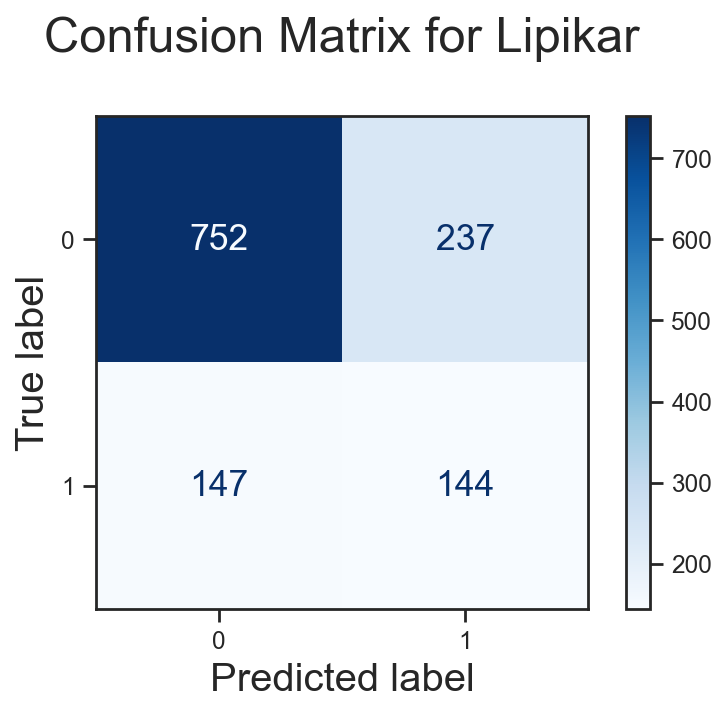

In [ ]:
confus_matrix(y_nn_lipikar_test, y_pred_nn_lipikar, "Lipikar")

40/40 [==============================] - 0s 599us/step


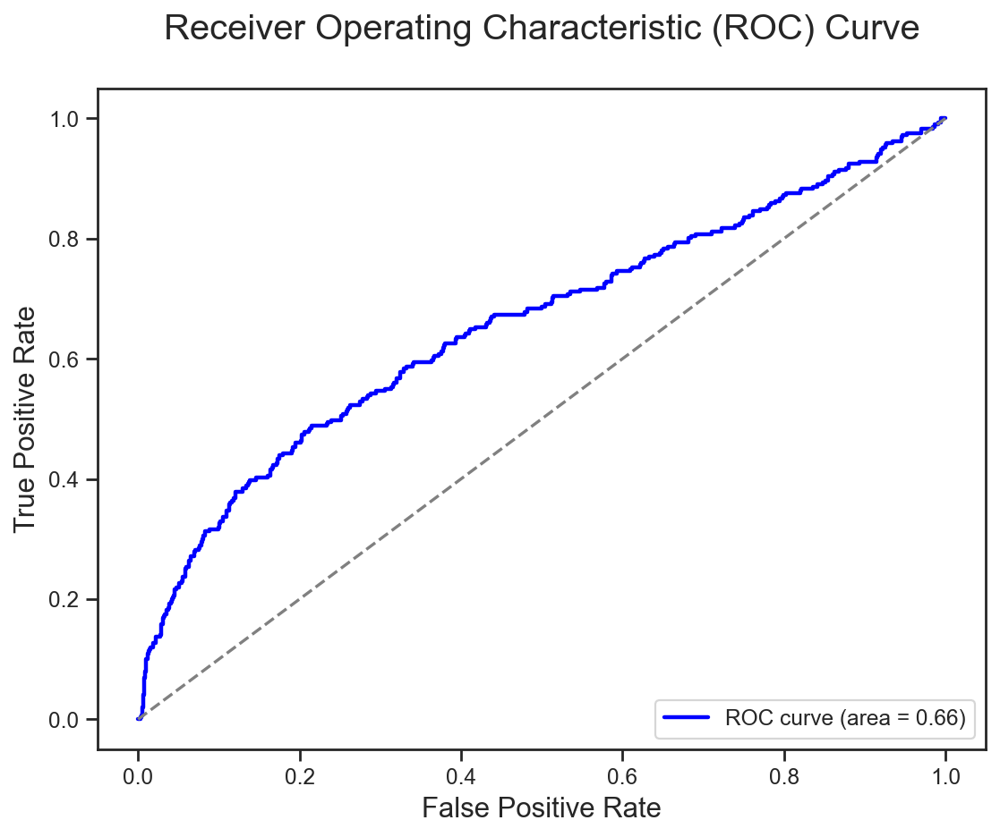

In [ ]:
plot_roc_curve(y_nn_lipikar_test, model_nn_lipikar.predict(x_nn_lipikar_test))

### 2.3: Neural network model (Brand Description_Vitamin C_Output)

In [ ]:
loreal_nn_vitamin = loreal_nn.copy()

loreal_nn_vitamin["Brand Description_Vitamin C_Output"] = loreal_classifi["Brand Description_Vitamin C_Output"]

In [ ]:
x_nn_vitamin = loreal_nn_vitamin.iloc[:, 0:-1]
y_nn_vitamin = np.array(loreal_nn_vitamin['Brand Description_Vitamin C_Output'])

x_nn_vitamin_train, x_nn_vitamin_test, y_nn_vitamin_train, y_nn_vitamin_test = train_test_split(x_nn_vitamin, y_nn_vitamin, test_size=0.2, random_state=0)
print(x_nn_vitamin_train.shape)
print(x_nn_vitamin_test.shape)

(5120, 90)
(1280, 90)


### 2.3.1: Finding balanced class weights

In [ ]:
classes = np.unique(y_nn_vitamin_train)
weights = class_weight.compute_class_weight(class_weight='balanced', classes=classes, y=y_nn_vitamin_train)
class_weights = dict(enumerate(weights))


In [ ]:
class_weights

{0: 0.6642449403217436, 1: 2.022116903633491}

### 2.3.2: Hyperparameter tuning

In [ ]:
tuner = kt.RandomSearch(
    best_neural_network,
    objective=kt.Objective("val_f1_score_group1", direction="max"),
    max_trials=20,  # Number of hyperparameter combinations to try
    executions_per_trial=3,  # Number of models to build and fit for each trial
    directory='neural_network_vitamin',
    project_name='tuning_nn_with_f1'
)

# Define early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=20, restore_best_weights=True)


In [ ]:
tf.keras.utils.set_random_seed(0)

tuner.search(x_nn_vitamin_train, y_nn_vitamin_train,
             epochs=50,
             batch_size=tuner.oracle.hyperparameters.Choice('batch_size', [8, 16, 32, 64]),
             validation_split=0.2,
             shuffle=True,
             callbacks=[early_stopping],
             class_weight=class_weights,
             verbose=2)

Oracle triggered exit


Trial 20 Complete [00h 00m 42s]
val_f1_score_group1: 0.3502005438009898

Best val_f1_score_group1 So Far: 0.3840231696764628
Total elapsed time: 00h 16m 43s


### 2.3.3: Best Model Information

In [ ]:
# Get the best hyperparameters and model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

In [ ]:
print(f"Best units for input layer: {best_hps.get('units_1')}")
print(f"Best dropout rate for input layer: {best_hps.get('dropout_1')}")


print(f"Best number of hidden layers: {best_hps.get('num_layers')}")

if best_hps.get('num_layers') >= 1:
    print(f"Best units for first layer: {best_hps.get('units_2')}")
    print(f"Best dropout rate for first layer: {best_hps.get('dropout_2')}")

if best_hps.get('num_layers') >= 2:
    print(f"Best units for second layer: {best_hps.get('units_3')}")
    print(f"Best dropout rate for second layer: {best_hps.get('dropout_3')}")

if best_hps.get('num_layers') >= 3:
    print(f"Best units for third layer: {best_hps.get('units_4')}")
    print(f"Best dropout rate for third layer: {best_hps.get('dropout_4')}")



print(f"Best batch_size: {best_hps.get('batch_size')}")
print(f"Best learning_rate: {best_hps.get('learning_rate')}")

Best units for input layer: 128
Best dropout rate for input layer: 0.2
Best number of hidden layers: 1
Best units for first layer: 160
Best dropout rate for first layer: 0.2
Best batch_size: 16
Best learning_rate: 0.01


### 2.2.4: Model Building

In [ ]:
tf.keras.utils.set_random_seed(0)


model_nn_vitamin = tf.keras.Sequential()
n_features = x_nn_B5_train.shape[1]
n_outputs = 1


model_nn_vitamin.add(tf.keras.layers.Dense(128, input_dim=n_features, activation='relu',kernel_initializer='he_normal'))
model_nn_vitamin.add(tf.keras.layers.BatchNormalization())
model_nn_vitamin.add(tf.keras.layers.Dropout(0.2))


model_nn_vitamin.add(tf.keras.layers.Dense(160, activation='relu',kernel_initializer='he_normal'))
model_nn_vitamin.add(tf.keras.layers.BatchNormalization())
model_nn_vitamin.add(tf.keras.layers.Dropout(0.2))




model_nn_vitamin.add(tf.keras.layers.Dense(1, activation='sigmoid'))  # 二分类问题，使用 sigmoid 激活函数


learning_rate = 0.01


model_nn_vitamin.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),f1_score_group1])


early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=100, restore_best_weights=True)

# 训练模型
history = model_nn_vitamin.fit(x_nn_vitamin_train, y_nn_vitamin_train,
                    epochs=100,
                    batch_size=16,
                    validation_split=0.2,
                    shuffle=True,
                    callbacks=[early_stopping],
                    class_weight=class_weights,
                    verbose=1)


Epoch 1/100
256/256 [==============================] - 1s 1ms/step - loss: 0.7771 - accuracy: 0.5376 - auc: 0.5341 - f1_score_group1: 0.3361 - val_loss: 0.7164 - val_accuracy: 0.4834 - val_auc: 0.5010 - val_f1_score_group1: 0.3194
Epoch 2/100
256/256 [==============================] - 0s 878us/step - loss: 0.7181 - accuracy: 0.5381 - auc: 0.5424 - f1_score_group1: 0.3400 - val_loss: 0.6984 - val_accuracy: 0.5059 - val_auc: 0.5081 - val_f1_score_group1: 0.3136
Epoch 3/100
256/256 [==============================] - 0s 1ms/step - loss: 0.7056 - accuracy: 0.5500 - auc: 0.5469 - f1_score_group1: 0.3554 - val_loss: 0.6655 - val_accuracy: 0.7021 - val_auc: 0.5930 - val_f1_score_group1: 0.2771
Epoch 4/100
256/256 [==============================] - 0s 940us/step - loss: 0.6956 - accuracy: 0.5774 - auc: 0.5538 - f1_score_group1: 0.3274 - val_loss: 0.6989 - val_accuracy: 0.4746 - val_auc: 0.4815 - val_f1_score_group1: 0.3145
Epoch 5/100
256/256 [==============================] - 0s 960us/step - l

256/256 [==============================] - 0s 901us/step - loss: 0.6824 - accuracy: 0.6143 - auc: 0.5856 - f1_score_group1: 0.3578 - val_loss: 0.6441 - val_accuracy: 0.6836 - val_auc: 0.6012 - val_f1_score_group1: 0.3099
Epoch 37/100
256/256 [==============================] - 0s 855us/step - loss: 0.6850 - accuracy: 0.5925 - auc: 0.5783 - f1_score_group1: 0.3440 - val_loss: 0.7075 - val_accuracy: 0.5596 - val_auc: 0.6134 - val_f1_score_group1: 0.3783
Epoch 38/100
256/256 [==============================] - 0s 847us/step - loss: 0.6873 - accuracy: 0.5796 - auc: 0.5725 - f1_score_group1: 0.3607 - val_loss: 0.7110 - val_accuracy: 0.4922 - val_auc: 0.6230 - val_f1_score_group1: 0.3905
Epoch 39/100
256/256 [==============================] - 0s 826us/step - loss: 0.6880 - accuracy: 0.5762 - auc: 0.5755 - f1_score_group1: 0.3557 - val_loss: 0.7225 - val_accuracy: 0.4912 - val_auc: 0.6257 - val_f1_score_group1: 0.3858
Epoch 40/100
256/256 [==============================] - 0s 855us/step - loss:

256/256 [==============================] - 0s 956us/step - loss: 0.6839 - accuracy: 0.5583 - auc: 0.5797 - f1_score_group1: 0.3503 - val_loss: 0.6378 - val_accuracy: 0.6982 - val_auc: 0.6207 - val_f1_score_group1: 0.3073
Epoch 72/100
256/256 [==============================] - 0s 893us/step - loss: 0.6831 - accuracy: 0.5681 - auc: 0.5866 - f1_score_group1: 0.3648 - val_loss: 0.6627 - val_accuracy: 0.6621 - val_auc: 0.6069 - val_f1_score_group1: 0.3310
Epoch 73/100
256/256 [==============================] - 0s 904us/step - loss: 0.6863 - accuracy: 0.5669 - auc: 0.5791 - f1_score_group1: 0.3529 - val_loss: 0.6580 - val_accuracy: 0.6855 - val_auc: 0.5970 - val_f1_score_group1: 0.2618
Epoch 74/100
256/256 [==============================] - 0s 961us/step - loss: 0.6865 - accuracy: 0.5742 - auc: 0.5787 - f1_score_group1: 0.3553 - val_loss: 0.7351 - val_accuracy: 0.4121 - val_auc: 0.6068 - val_f1_score_group1: 0.3776
Epoch 75/100
256/256 [==============================] - 0s 894us/step - loss:

In [ ]:
model_nn_vitamin.evaluate(x_nn_vitamin_test, y_nn_vitamin_test)

40/40 [==============================] - 0s 636us/step - loss: 0.7290 - accuracy: 0.5828 - auc: 0.5683 - f1_score_group1: 0.3610


[0.7290360331535339,
 0.582812488079071,
 0.5682833790779114,
 0.36100250482559204]

In [ ]:
y_pred_nn_vitamin = model_nn_vitamin.predict(x_nn_vitamin_test)

y_pred_nn_vitamin = (y_pred_nn_vitamin > 0.5).astype(int)

print(classification_report(y_nn_vitamin_test, y_pred_nn_vitamin))

40/40 [==============================] - 0s 464us/step
              precision    recall  f1-score   support

           0       0.79      0.61      0.69       966
           1       0.29      0.49      0.37       314

    accuracy                           0.58      1280
   macro avg       0.54      0.55      0.53      1280
weighted avg       0.67      0.58      0.61      1280



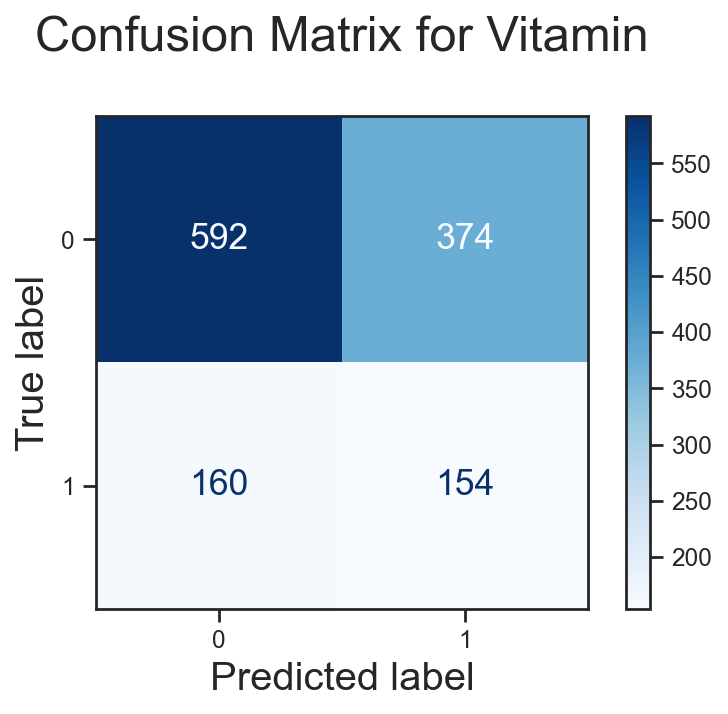

In [ ]:
confus_matrix(y_nn_vitamin_test, y_pred_nn_vitamin, "Vitamin")

40/40 [==============================] - 0s 607us/step


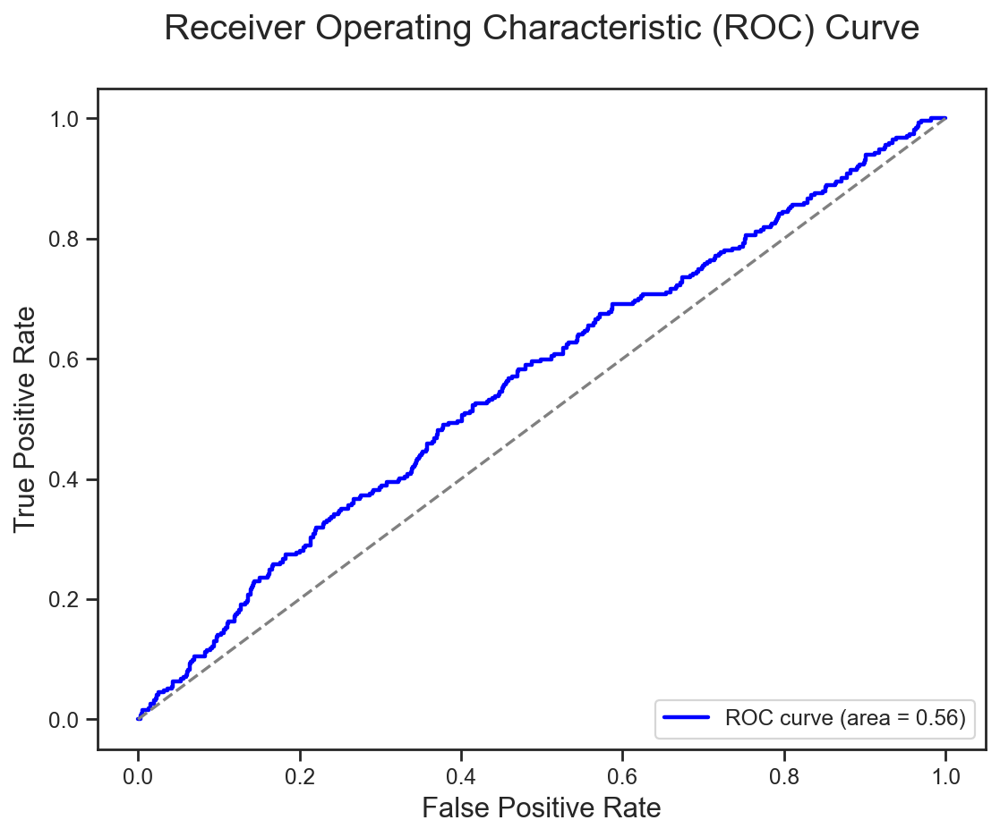

In [ ]:
plot_roc_curve(y_nn_vitamin_test, model_nn_lipikar.predict(x_nn_vitamin_test))

### 2.4: Neural network model (Brand Description_Cicaplast_Output)

In [ ]:
loreal_nn_cicaplast = loreal_nn.copy()

loreal_nn_cicaplast["Brand Description_Cicaplast_Output"] = loreal_classifi["Brand Description_Cicaplast_Output"]

In [ ]:
x_nn_cicaplast = loreal_nn_cicaplast.iloc[:, 0:-1]
y_nn_cicaplast = np.array(loreal_nn_cicaplast['Brand Description_Cicaplast_Output'])

x_nn_cicaplast_train, x_nn_cicaplast_test, y_nn_cicaplast_train, y_nn_cicaplast_test = train_test_split(x_nn_cicaplast, y_nn_cicaplast, test_size=0.2, random_state=0)
print(x_nn_cicaplast_train.shape)
print(x_nn_cicaplast_test.shape)

(5120, 90)
(1280, 90)


### 2.4.1: Finding balanced class weights

In [ ]:
classes = np.unique(y_nn_cicaplast_train)
weights = class_weight.compute_class_weight(class_weight='balanced', classes=classes, y=y_nn_cicaplast_train)
class_weights = dict(enumerate(weights))


In [ ]:
class_weights

{0: 0.6632124352331606, 1: 2.0317460317460316}

### 2.4.2: Hyperparameter tuning

In [ ]:
tuner = kt.RandomSearch(
    best_neural_network,
    objective=kt.Objective("val_f1_score_group1", direction="max"),
    max_trials=20,  # Number of hyperparameter combinations to try
    executions_per_trial=3,  # Number of models to build and fit for each trial
    directory='neural_network_cicaplast',
    project_name='tuning_nn_with_f1'
)

# Define early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=20, restore_best_weights=True)


In [ ]:
tf.keras.utils.set_random_seed(0)

tuner.search(x_nn_cicaplast_train, y_nn_cicaplast_train,
             epochs=50,
             batch_size=tuner.oracle.hyperparameters.Choice('batch_size', [8, 16, 32, 64]),
             validation_split=0.2,
             shuffle=True,
             callbacks=[early_stopping],
             class_weight=class_weights,
             verbose=2)

Oracle triggered exit


Trial 20 Complete [00h 00m 46s]
val_f1_score_group1: 0.4144117633501689

Best val_f1_score_group1 So Far: 0.4277159670988719
Total elapsed time: 00h 15m 40s


### 2.4.3: Best Model Information

In [ ]:
# Get the best hyperparameters and model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

In [ ]:
print(f"Best units for input layer: {best_hps.get('units_1')}")
print(f"Best dropout rate for input layer: {best_hps.get('dropout_1')}")


print(f"Best number of hidden layers: {best_hps.get('num_layers')}")

if best_hps.get('num_layers') >= 1:
    print(f"Best units for first layer: {best_hps.get('units_2')}")
    print(f"Best dropout rate for first layer: {best_hps.get('dropout_2')}")

if best_hps.get('num_layers') >= 2:
    print(f"Best units for second layer: {best_hps.get('units_3')}")
    print(f"Best dropout rate for second layer: {best_hps.get('dropout_3')}")

if best_hps.get('num_layers') >= 3:
    print(f"Best units for third layer: {best_hps.get('units_4')}")
    print(f"Best dropout rate for third layer: {best_hps.get('dropout_4')}")



print(f"Best batch_size: {best_hps.get('batch_size')}")
print(f"Best learning_rate: {best_hps.get('learning_rate')}")

Best units for input layer: 64
Best dropout rate for input layer: 0.2
Best number of hidden layers: 1
Best units for first layer: 256
Best dropout rate for first layer: 0.0
Best batch_size: 16
Best learning_rate: 0.01


### 2.4.4: Model Building

In [ ]:
tf.keras.utils.set_random_seed(0)


model_nn_cicaplast = tf.keras.Sequential()
n_features = x_nn_B5_train.shape[1]
n_outputs = 1


model_nn_cicaplast.add(tf.keras.layers.Dense(64, input_dim=n_features, activation='relu',kernel_initializer='he_normal'))
model_nn_cicaplast.add(tf.keras.layers.BatchNormalization())
model_nn_cicaplast.add(tf.keras.layers.Dropout(0.2))


model_nn_cicaplast.add(tf.keras.layers.Dense(256, activation='relu',kernel_initializer='he_normal'))
model_nn_cicaplast.add(tf.keras.layers.BatchNormalization())
model_nn_cicaplast.add(tf.keras.layers.Dropout(0.0))




model_nn_cicaplast.add(tf.keras.layers.Dense(1, activation='sigmoid'))


learning_rate = 0.01


model_nn_cicaplast.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),f1_score_group1])


early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=100, restore_best_weights=True)

# 训练模型
history = model_nn_cicaplast.fit(x_nn_cicaplast_train, y_nn_cicaplast_train,
                    epochs=100,
                    batch_size=16,
                    validation_split=0.2,
                    shuffle=True,
                    callbacks=[early_stopping],
                    class_weight=class_weights,
                    verbose=1)


Epoch 1/100
256/256 [==============================] - 1s 1ms/step - loss: 0.7852 - accuracy: 0.5667 - auc: 0.5620 - f1_score_group1: 0.3546 - val_loss: 0.7886 - val_accuracy: 0.5146 - val_auc: 0.4783 - val_f1_score_group1: 0.2956
Epoch 2/100
256/256 [==============================] - 0s 966us/step - loss: 0.7080 - accuracy: 0.5532 - auc: 0.5699 - f1_score_group1: 0.3482 - val_loss: 0.6655 - val_accuracy: 0.5957 - val_auc: 0.6345 - val_f1_score_group1: 0.4159
Epoch 3/100
256/256 [==============================] - 0s 921us/step - loss: 0.6871 - accuracy: 0.5657 - auc: 0.5855 - f1_score_group1: 0.3530 - val_loss: 0.6838 - val_accuracy: 0.6240 - val_auc: 0.6169 - val_f1_score_group1: 0.3875
Epoch 4/100
256/256 [==============================] - 0s 948us/step - loss: 0.6790 - accuracy: 0.6084 - auc: 0.6032 - f1_score_group1: 0.3676 - val_loss: 0.6351 - val_accuracy: 0.7129 - val_auc: 0.6390 - val_f1_score_group1: 0.3616
Epoch 5/100
256/256 [==============================] - 0s 901us/step -

256/256 [==============================] - 0s 916us/step - loss: 0.6594 - accuracy: 0.6448 - auc: 0.6385 - f1_score_group1: 0.4030 - val_loss: 0.6716 - val_accuracy: 0.6475 - val_auc: 0.6433 - val_f1_score_group1: 0.4140
Epoch 37/100
256/256 [==============================] - 0s 848us/step - loss: 0.6577 - accuracy: 0.6555 - auc: 0.6436 - f1_score_group1: 0.4018 - val_loss: 0.7441 - val_accuracy: 0.5283 - val_auc: 0.6535 - val_f1_score_group1: 0.4269
Epoch 38/100
256/256 [==============================] - 0s 838us/step - loss: 0.6578 - accuracy: 0.6445 - auc: 0.6434 - f1_score_group1: 0.4031 - val_loss: 0.6671 - val_accuracy: 0.6338 - val_auc: 0.6578 - val_f1_score_group1: 0.4226
Epoch 39/100
256/256 [==============================] - 0s 860us/step - loss: 0.6591 - accuracy: 0.6306 - auc: 0.6428 - f1_score_group1: 0.4024 - val_loss: 0.6769 - val_accuracy: 0.5889 - val_auc: 0.6544 - val_f1_score_group1: 0.4137
Epoch 40/100
256/256 [==============================] - 0s 890us/step - loss:

256/256 [==============================] - 0s 885us/step - loss: 0.6623 - accuracy: 0.6426 - auc: 0.6383 - f1_score_group1: 0.4031 - val_loss: 0.6966 - val_accuracy: 0.5947 - val_auc: 0.6497 - val_f1_score_group1: 0.4299
Epoch 72/100
256/256 [==============================] - 0s 884us/step - loss: 0.6549 - accuracy: 0.6418 - auc: 0.6525 - f1_score_group1: 0.4115 - val_loss: 0.8291 - val_accuracy: 0.4805 - val_auc: 0.6516 - val_f1_score_group1: 0.4189
Epoch 73/100
256/256 [==============================] - 0s 886us/step - loss: 0.6594 - accuracy: 0.6331 - auc: 0.6416 - f1_score_group1: 0.4045 - val_loss: 0.6475 - val_accuracy: 0.6670 - val_auc: 0.6365 - val_f1_score_group1: 0.3763
Epoch 74/100
256/256 [==============================] - 0s 855us/step - loss: 0.6580 - accuracy: 0.6462 - auc: 0.6443 - f1_score_group1: 0.4034 - val_loss: 0.6379 - val_accuracy: 0.6699 - val_auc: 0.6611 - val_f1_score_group1: 0.4170
Epoch 75/100
256/256 [==============================] - 0s 859us/step - loss:

In [ ]:
model_nn_cicaplast.evaluate(x_nn_cicaplast_test, y_nn_cicaplast_test)

40/40 [==============================] - 0s 645us/step - loss: 0.6659 - accuracy: 0.6453 - auc: 0.6727 - f1_score_group1: 0.4529


[0.665881872177124, 0.645312488079071, 0.6727266907691956, 0.45293956995010376]

In [ ]:
y_pred_nn_cicaplast = model_nn_cicaplast.predict(x_nn_cicaplast_test)

y_pred_nn_cicaplast = (y_pred_nn_cicaplast > 0.5).astype(int)

print(classification_report(y_nn_cicaplast_test, y_pred_nn_cicaplast))

40/40 [==============================] - 0s 465us/step
              precision    recall  f1-score   support

           0       0.82      0.66      0.73       943
           1       0.39      0.59      0.47       337

    accuracy                           0.65      1280
   macro avg       0.60      0.63      0.60      1280
weighted avg       0.71      0.65      0.66      1280



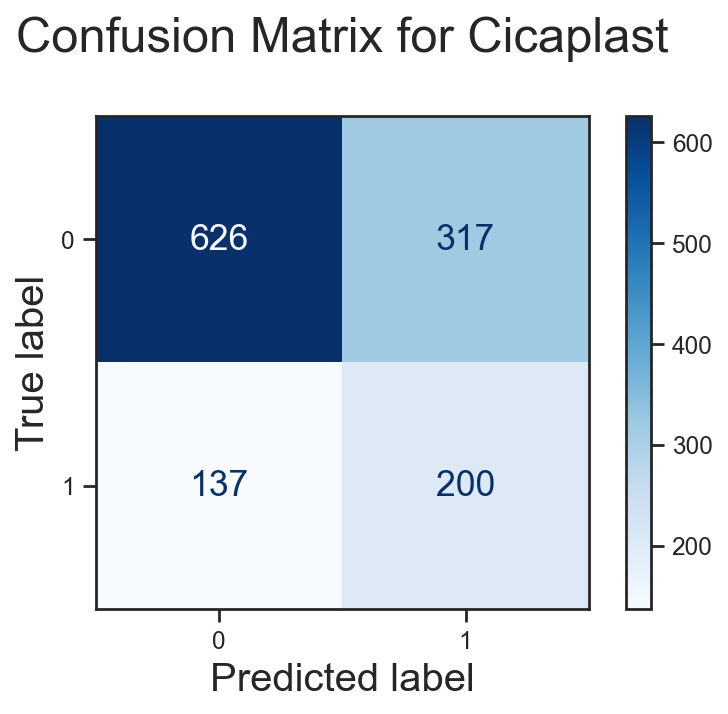

In [ ]:
confus_matrix(y_nn_cicaplast_test, y_pred_nn_cicaplast, "Cicaplast")

40/40 [==============================] - 0s 481us/step


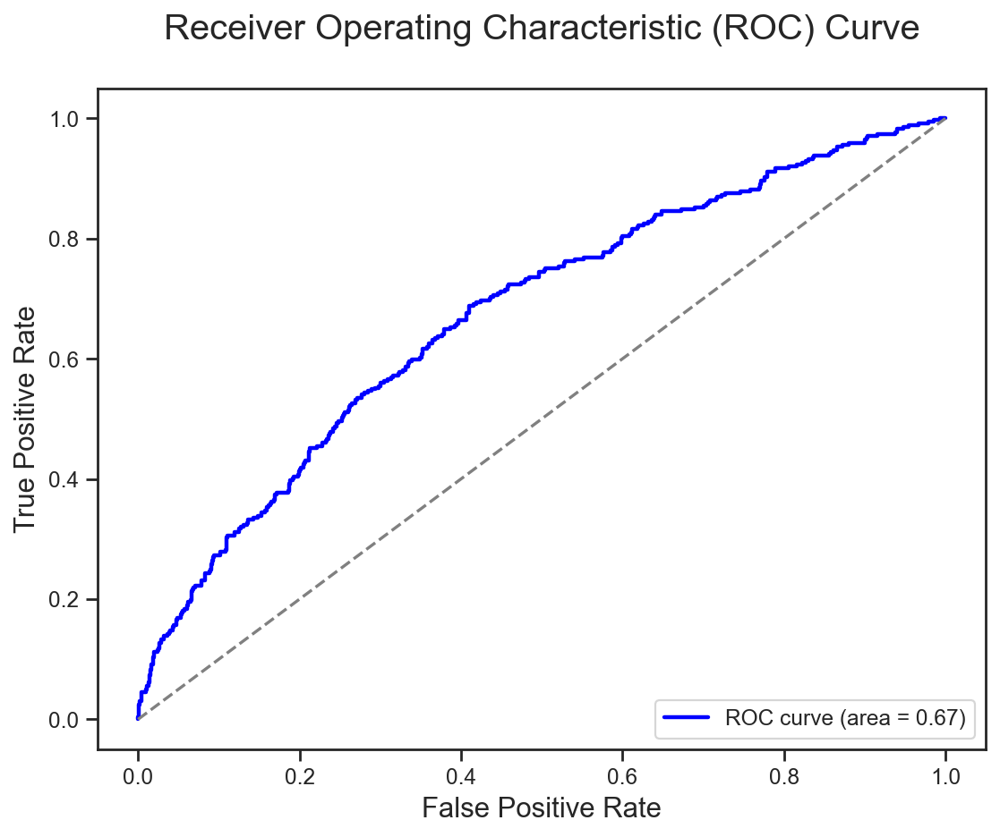

In [ ]:
plot_roc_curve(y_nn_cicaplast_test, model_nn_cicaplast.predict(x_nn_cicaplast_test))

### 2.5: Neural network model (Brand Description_Toleriane_Output)

In [ ]:
loreal_nn_toleriane = loreal_nn.copy()

loreal_nn_toleriane["Brand Description_Toleriane_Output"] = loreal_classifi["Brand Description_Toleriane_Output"]

In [ ]:
x_nn_toleriane = loreal_nn_toleriane.iloc[:, 0:-1]
y_nn_toleriane = np.array(loreal_nn_toleriane['Brand Description_Toleriane_Output'])

x_nn_toleriane_train, x_nn_toleriane_test, y_nn_toleriane_train, y_nn_toleriane_test = train_test_split(x_nn_toleriane, y_nn_toleriane, test_size=0.2, random_state=0)
print(x_nn_toleriane_train.shape)
print(x_nn_toleriane_test.shape)

(5120, 90)
(1280, 90)


### 2.5.1: Finding balanced class weights

In [ ]:
classes = np.unique(y_nn_toleriane_train)
weights = class_weight.compute_class_weight(class_weight='balanced', classes=classes, y=y_nn_toleriane_train)
class_weights = dict(enumerate(weights))


In [ ]:
class_weights

{0: 0.818676047329709, 1: 1.2844957350727546}

### 2.5.2: Hyperparameter tuning

In [ ]:
tuner = kt.RandomSearch(
    best_neural_network,
    objective=kt.Objective("val_f1_score_group1", direction="max"),
    max_trials=20,  # Number of hyperparameter combinations to try
    executions_per_trial=3,  # Number of models to build and fit for each trial
    directory='neural_network_toleriane',
    project_name='tuning_nn_with_f1'
)

# Define early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=20, restore_best_weights=True)


In [ ]:
tf.keras.utils.set_random_seed(0)

tuner.search(x_nn_toleriane_train, y_nn_toleriane_train,
             epochs=50,
             batch_size=tuner.oracle.hyperparameters.Choice('batch_size', [8, 16, 32, 64]),
             validation_split=0.2,
             shuffle=True,
             callbacks=[early_stopping],
             class_weight=class_weights,
             verbose=2)

Oracle triggered exit


Trial 20 Complete [00h 00m 36s]
val_f1_score_group1: 0.5821219086647034

Best val_f1_score_group1 So Far: 0.5884168148040771
Total elapsed time: 00h 13m 40s


### 2.5.3: Best Model Information

In [ ]:
# Get the best hyperparameters and model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

In [ ]:
print(f"Best units for input layer: {best_hps.get('units_1')}")
print(f"Best dropout rate for input layer: {best_hps.get('dropout_1')}")


print(f"Best number of hidden layers: {best_hps.get('num_layers')}")

if best_hps.get('num_layers') >= 1:
    print(f"Best units for first layer: {best_hps.get('units_2')}")
    print(f"Best dropout rate for first layer: {best_hps.get('dropout_2')}")

if best_hps.get('num_layers') >= 2:
    print(f"Best units for second layer: {best_hps.get('units_3')}")
    print(f"Best dropout rate for second layer: {best_hps.get('dropout_3')}")

if best_hps.get('num_layers') >= 3:
    print(f"Best units for third layer: {best_hps.get('units_4')}")
    print(f"Best dropout rate for third layer: {best_hps.get('dropout_4')}")



print(f"Best batch_size: {best_hps.get('batch_size')}")
print(f"Best learning_rate: {best_hps.get('learning_rate')}")

Best units for input layer: 128
Best dropout rate for input layer: 0.30000000000000004
Best number of hidden layers: 2
Best units for first layer: 192
Best dropout rate for first layer: 0.2
Best units for second layer: 64
Best dropout rate for second layer: 0.2
Best batch_size: 8
Best learning_rate: 0.01


### 2.5.4: Model Building

In [ ]:
tf.keras.utils.set_random_seed(0)


model_nn_toleriane = tf.keras.Sequential()
n_features = x_nn_B5_train.shape[1]
n_outputs = 1


model_nn_toleriane.add(tf.keras.layers.Dense(128, input_dim=n_features, activation='relu',kernel_initializer='he_normal'))
model_nn_toleriane.add(tf.keras.layers.BatchNormalization())
model_nn_toleriane.add(tf.keras.layers.Dropout(0.3))


model_nn_toleriane.add(tf.keras.layers.Dense(192, activation='relu',kernel_initializer='he_normal'))
model_nn_toleriane.add(tf.keras.layers.BatchNormalization())
model_nn_toleriane.add(tf.keras.layers.Dropout(0.2))



model_nn_toleriane.add(tf.keras.layers.Dense(64, activation='relu',kernel_initializer='he_normal'))
model_nn_toleriane.add(tf.keras.layers.BatchNormalization())
model_nn_toleriane.add(tf.keras.layers.Dropout(0.2))




model_nn_toleriane.add(tf.keras.layers.Dense(1, activation='sigmoid'))


learning_rate = 0.01


model_nn_toleriane.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),f1_score_group1])


early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=100, restore_best_weights=True)


history = model_nn_toleriane.fit(x_nn_toleriane_train, y_nn_toleriane_train,
                    epochs=100,
                    batch_size=8,
                    validation_split=0.2,
                    shuffle=True,
                    callbacks=[early_stopping],
                    class_weight=class_weights,
                    verbose=1)


Epoch 1/100
512/512 [==============================] - 1s 1ms/step - loss: 0.7240 - accuracy: 0.5457 - auc: 0.5556 - f1_score_group1: 0.4443 - val_loss: 0.7126 - val_accuracy: 0.4424 - val_auc: 0.5117 - val_f1_score_group1: 0.4467
Epoch 2/100
512/512 [==============================] - 1s 985us/step - loss: 0.6781 - accuracy: 0.5950 - auc: 0.6207 - f1_score_group1: 0.5029 - val_loss: 0.6331 - val_accuracy: 0.6807 - val_auc: 0.6997 - val_f1_score_group1: 0.3723
Epoch 3/100
512/512 [==============================] - 1s 1ms/step - loss: 0.6463 - accuracy: 0.6421 - auc: 0.6772 - f1_score_group1: 0.5427 - val_loss: 0.6450 - val_accuracy: 0.6387 - val_auc: 0.6744 - val_f1_score_group1: 0.4852
Epoch 4/100
512/512 [==============================] - 1s 1ms/step - loss: 0.6371 - accuracy: 0.6628 - auc: 0.6936 - f1_score_group1: 0.5632 - val_loss: 0.5836 - val_accuracy: 0.7051 - val_auc: 0.7315 - val_f1_score_group1: 0.5543
Epoch 5/100
512/512 [==============================] - 1s 1ms/step - loss:

512/512 [==============================] - 0s 926us/step - loss: 0.6203 - accuracy: 0.6829 - auc: 0.7165 - f1_score_group1: 0.5833 - val_loss: 0.6139 - val_accuracy: 0.6934 - val_auc: 0.7325 - val_f1_score_group1: 0.5801
Epoch 37/100
512/512 [==============================] - 1s 1ms/step - loss: 0.6153 - accuracy: 0.6919 - auc: 0.7222 - f1_score_group1: 0.5938 - val_loss: 0.9055 - val_accuracy: 0.7041 - val_auc: 0.7215 - val_f1_score_group1: 0.5702
Epoch 38/100
512/512 [==============================] - 1s 1ms/step - loss: 0.6197 - accuracy: 0.6841 - auc: 0.7148 - f1_score_group1: 0.5837 - val_loss: 0.6036 - val_accuracy: 0.7109 - val_auc: 0.7241 - val_f1_score_group1: 0.5550
Epoch 39/100
512/512 [==============================] - 1s 1ms/step - loss: 0.6138 - accuracy: 0.6904 - auc: 0.7236 - f1_score_group1: 0.5880 - val_loss: 0.6387 - val_accuracy: 0.6709 - val_auc: 0.7337 - val_f1_score_group1: 0.5770
Epoch 40/100
512/512 [==============================] - 1s 1ms/step - loss: 0.6199 

512/512 [==============================] - 1s 1ms/step - loss: 0.6119 - accuracy: 0.6829 - auc: 0.7291 - f1_score_group1: 0.5913 - val_loss: 0.8286 - val_accuracy: 0.7021 - val_auc: 0.7329 - val_f1_score_group1: 0.5703
Epoch 72/100
512/512 [==============================] - 1s 1ms/step - loss: 0.6133 - accuracy: 0.6804 - auc: 0.7237 - f1_score_group1: 0.5913 - val_loss: 0.5751 - val_accuracy: 0.7217 - val_auc: 0.7448 - val_f1_score_group1: 0.5620
Epoch 73/100
512/512 [==============================] - 1s 996us/step - loss: 0.6098 - accuracy: 0.6921 - auc: 0.7275 - f1_score_group1: 0.5939 - val_loss: 0.6231 - val_accuracy: 0.6611 - val_auc: 0.7395 - val_f1_score_group1: 0.5692
Epoch 74/100
512/512 [==============================] - 1s 983us/step - loss: 0.6141 - accuracy: 0.6860 - auc: 0.7254 - f1_score_group1: 0.5912 - val_loss: 0.5697 - val_accuracy: 0.7188 - val_auc: 0.7427 - val_f1_score_group1: 0.5362
Epoch 75/100
512/512 [==============================] - 1s 985us/step - loss: 0.6

In [ ]:
model_nn_toleriane.evaluate(x_nn_toleriane_test, y_nn_toleriane_test)

40/40 [==============================] - 0s 712us/step - loss: 1.0329 - accuracy: 0.7094 - auc: 0.7466 - f1_score_group1: 0.6278


[1.0329029560089111,
 0.7093750238418579,
 0.7465758323669434,
 0.6277684569358826]

In [ ]:
y_pred_nn_toleriane = model_nn_toleriane.predict(x_nn_toleriane_test)

y_pred_nn_toleriane = (y_pred_nn_toleriane > 0.5).astype(int)

print(classification_report(y_nn_toleriane_test, y_pred_nn_toleriane))

40/40 [==============================] - 0s 405us/step
              precision    recall  f1-score   support

           0       0.77      0.75      0.76       777
           1       0.62      0.65      0.64       503

    accuracy                           0.71      1280
   macro avg       0.70      0.70      0.70      1280
weighted avg       0.71      0.71      0.71      1280



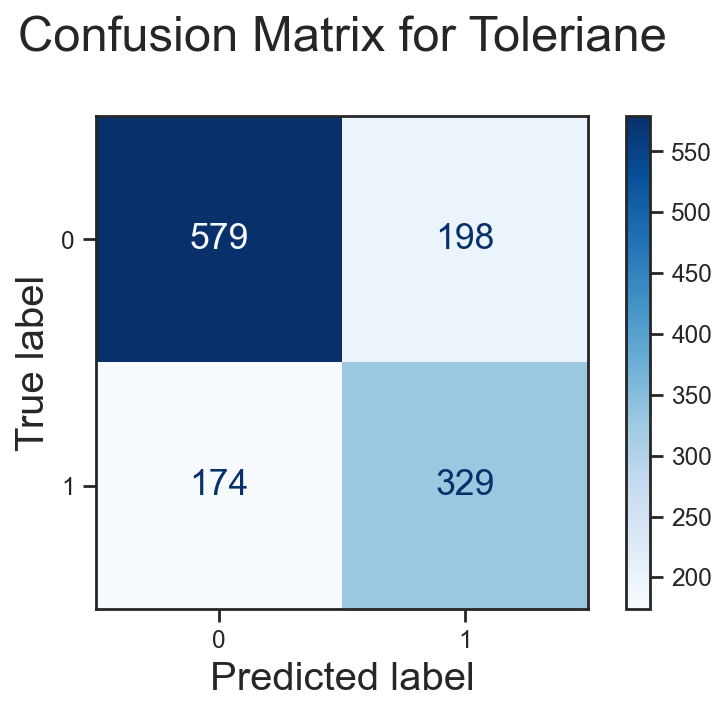

In [ ]:
confus_matrix(y_nn_toleriane_test, y_pred_nn_toleriane, "Toleriane")

40/40 [==============================] - 0s 522us/step


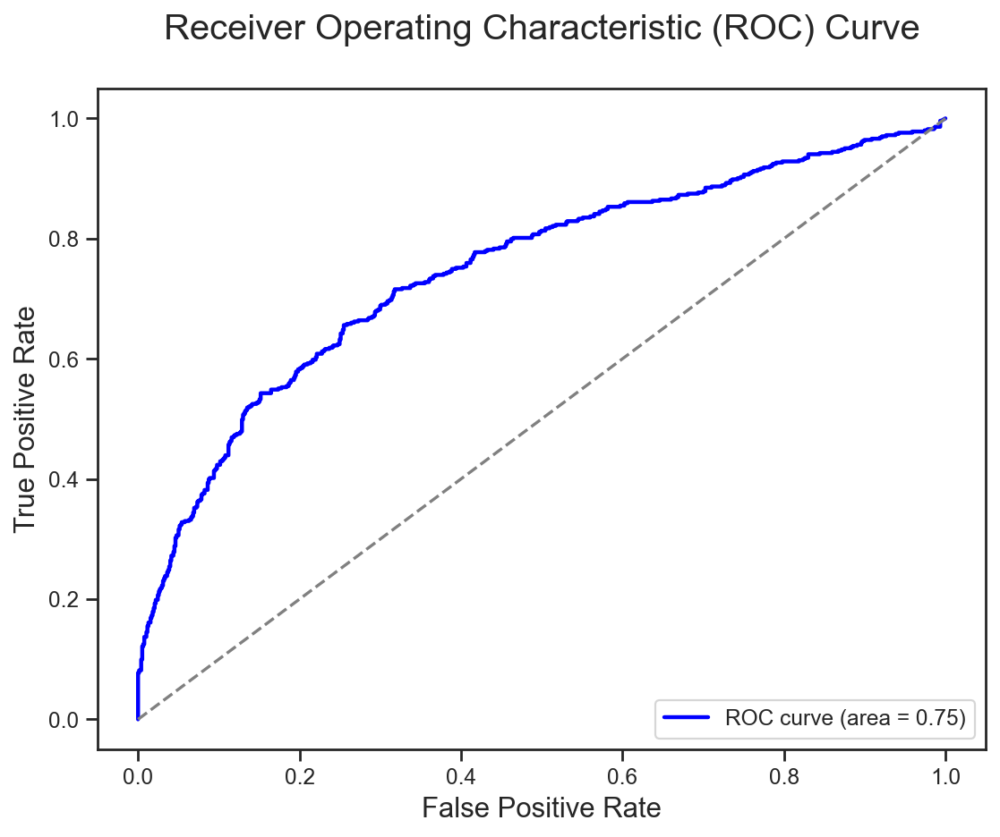

In [ ]:
plot_roc_curve(y_nn_toleriane_test, model_nn_toleriane.predict(x_nn_toleriane_test))

### 2.6: Neural network model (Brand Description_Effaclar_Output)

In [ ]:
loreal_nn_effaclar = loreal_nn.copy()

loreal_nn_effaclar["Brand Description_Effaclar_Output"] = loreal_classifi["Brand Description_Effaclar_Output"]

In [ ]:
x_nn_effaclar = loreal_nn_effaclar.iloc[:, 0:-1]
y_nn_effaclar = np.array(loreal_nn_effaclar['Brand Description_Effaclar_Output'])

x_nn_effaclar_train, x_nn_effaclar_test, y_nn_effaclar_train, y_nn_effaclar_test = train_test_split(x_nn_effaclar, y_nn_effaclar, test_size=0.2, random_state=0)
print(x_nn_effaclar_train.shape)
print(x_nn_effaclar_test.shape)

(5120, 90)
(1280, 90)


### 2.6.1: Finding balanced class weights

In [ ]:
classes = np.unique(y_nn_effaclar_train)
weights = class_weight.compute_class_weight(class_weight='balanced', classes=classes, y=y_nn_effaclar_train)
class_weights = dict(enumerate(weights))


In [ ]:
class_weights

{0: 0.8547579298831386, 1: 1.204705882352941}

### 2.6.2: Hyperparameter tuning

In [ ]:
tuner = kt.RandomSearch(
    best_neural_network,
    objective=kt.Objective("val_f1_score_group1", direction="max"),
    max_trials=20,  # Number of hyperparameter combinations to try
    executions_per_trial=3,  # Number of models to build and fit for each trial
    directory='neural_network_effaclar',
    project_name='tuning_nn_with_f1'
)

# Define early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=20, restore_best_weights=True)


In [ ]:
tf.keras.utils.set_random_seed(0)

tuner.search(x_nn_effaclar_train, y_nn_effaclar_train,
             epochs=50,
             batch_size=tuner.oracle.hyperparameters.Choice('batch_size', [8, 16, 32, 64]),
             validation_split=0.2,
             shuffle=True,
             callbacks=[early_stopping],
             class_weight=class_weights,
             verbose=2)

Oracle triggered exit


Trial 20 Complete [00h 00m 36s]
val_f1_score_group1: 0.5857442220052084

Best val_f1_score_group1 So Far: 0.5888748168945312
Total elapsed time: 00h 13m 39s


### 2.6.3: Best Model Information

In [ ]:
# Get the best hyperparameters and model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

In [ ]:
print(f"Best units for input layer: {best_hps.get('units_1')}")
print(f"Best dropout rate for input layer: {best_hps.get('dropout_1')}")


print(f"Best number of hidden layers: {best_hps.get('num_layers')}")

if best_hps.get('num_layers') >= 1:
    print(f"Best units for first layer: {best_hps.get('units_2')}")
    print(f"Best dropout rate for first layer: {best_hps.get('dropout_2')}")

if best_hps.get('num_layers') >= 2:
    print(f"Best units for second layer: {best_hps.get('units_3')}")
    print(f"Best dropout rate for second layer: {best_hps.get('dropout_3')}")

if best_hps.get('num_layers') >= 3:
    print(f"Best units for third layer: {best_hps.get('units_4')}")
    print(f"Best dropout rate for third layer: {best_hps.get('dropout_4')}")



print(f"Best batch_size: {best_hps.get('batch_size')}")
print(f"Best learning_rate: {best_hps.get('learning_rate')}")

Best units for input layer: 96
Best dropout rate for input layer: 0.1
Best number of hidden layers: 3
Best units for first layer: 192
Best dropout rate for first layer: 0.1
Best units for second layer: 160
Best dropout rate for second layer: 0.1
Best units for third layer: 192
Best dropout rate for third layer: 0.1
Best batch_size: 16
Best learning_rate: 0.01


### 2.6.4: Model Building

In [ ]:
tf.keras.utils.set_random_seed(0)


model_nn_effaclar = tf.keras.Sequential()
n_features = x_nn_B5_train.shape[1]
n_outputs = 1


model_nn_effaclar.add(tf.keras.layers.Dense(96, input_dim=n_features, activation='relu',kernel_initializer='he_normal'))
model_nn_effaclar.add(tf.keras.layers.BatchNormalization())
model_nn_effaclar.add(tf.keras.layers.Dropout(0.1))


model_nn_effaclar.add(tf.keras.layers.Dense(192, activation='relu',kernel_initializer='he_normal'))
model_nn_effaclar.add(tf.keras.layers.BatchNormalization())
model_nn_effaclar.add(tf.keras.layers.Dropout(0.1))


model_nn_effaclar.add(tf.keras.layers.Dense(160, activation='relu',kernel_initializer='he_normal'))
model_nn_effaclar.add(tf.keras.layers.BatchNormalization())
model_nn_effaclar.add(tf.keras.layers.Dropout(0.2))


model_nn_effaclar.add(tf.keras.layers.Dense(192, activation='relu',kernel_initializer='he_normal'))
model_nn_effaclar.add(tf.keras.layers.BatchNormalization())
model_nn_effaclar.add(tf.keras.layers.Dropout(0.1))


model_nn_effaclar.add(tf.keras.layers.Dense(1, activation='sigmoid'))


learning_rate = 0.01


model_nn_effaclar.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),f1_score_group1])


early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=100, restore_best_weights=True)


history = model_nn_effaclar.fit(x_nn_effaclar_train, y_nn_effaclar_train,
                    epochs=100,
                    batch_size=16,
                    validation_split=0.2,
                    shuffle=True,
                    callbacks=[early_stopping],
                    class_weight=class_weights,
                    verbose=1)


Epoch 1/100
256/256 [==============================] - 1s 2ms/step - loss: 0.7774 - accuracy: 0.5117 - auc: 0.5146 - f1_score_group1: 0.4440 - val_loss: 0.7126 - val_accuracy: 0.5527 - val_auc: 0.5771 - val_f1_score_group1: 0.5004
Epoch 2/100
256/256 [==============================] - 0s 2ms/step - loss: 0.7039 - accuracy: 0.5535 - auc: 0.5732 - f1_score_group1: 0.4861 - val_loss: 0.7709 - val_accuracy: 0.5752 - val_auc: 0.5844 - val_f1_score_group1: 0.3518
Epoch 3/100
256/256 [==============================] - 0s 2ms/step - loss: 0.6612 - accuracy: 0.6143 - auc: 0.6504 - f1_score_group1: 0.5372 - val_loss: 0.6745 - val_accuracy: 0.6191 - val_auc: 0.6552 - val_f1_score_group1: 0.5250
Epoch 4/100
256/256 [==============================] - 0s 2ms/step - loss: 0.6458 - accuracy: 0.6423 - auc: 0.6667 - f1_score_group1: 0.5449 - val_loss: 0.7255 - val_accuracy: 0.5635 - val_auc: 0.6596 - val_f1_score_group1: 0.5856
Epoch 5/100
256/256 [==============================] - 0s 1ms/step - loss: 0

256/256 [==============================] - 0s 1ms/step - loss: 0.6191 - accuracy: 0.6855 - auc: 0.7056 - f1_score_group1: 0.5858 - val_loss: 0.6139 - val_accuracy: 0.6982 - val_auc: 0.7203 - val_f1_score_group1: 0.5764
Epoch 37/100
256/256 [==============================] - 0s 1ms/step - loss: 0.6099 - accuracy: 0.6970 - auc: 0.7194 - f1_score_group1: 0.6084 - val_loss: 0.6269 - val_accuracy: 0.6816 - val_auc: 0.7048 - val_f1_score_group1: 0.5615
Epoch 38/100
256/256 [==============================] - 0s 1ms/step - loss: 0.6152 - accuracy: 0.6880 - auc: 0.7149 - f1_score_group1: 0.5986 - val_loss: 0.7209 - val_accuracy: 0.4990 - val_auc: 0.7182 - val_f1_score_group1: 0.5981
Epoch 39/100
256/256 [==============================] - 0s 1ms/step - loss: 0.6165 - accuracy: 0.6838 - auc: 0.7099 - f1_score_group1: 0.5918 - val_loss: 0.6184 - val_accuracy: 0.6826 - val_auc: 0.7152 - val_f1_score_group1: 0.5841
Epoch 40/100
256/256 [==============================] - 0s 1ms/step - loss: 0.6119 - 

256/256 [==============================] - 0s 1ms/step - loss: 0.6128 - accuracy: 0.6897 - auc: 0.7148 - f1_score_group1: 0.5913 - val_loss: 0.6312 - val_accuracy: 0.6953 - val_auc: 0.7215 - val_f1_score_group1: 0.5656
Epoch 72/100
256/256 [==============================] - 0s 1ms/step - loss: 0.6101 - accuracy: 0.6938 - auc: 0.7172 - f1_score_group1: 0.6026 - val_loss: 0.6327 - val_accuracy: 0.6514 - val_auc: 0.7206 - val_f1_score_group1: 0.5927
Epoch 73/100
256/256 [==============================] - 0s 1ms/step - loss: 0.6126 - accuracy: 0.6904 - auc: 0.7100 - f1_score_group1: 0.5920 - val_loss: 0.6167 - val_accuracy: 0.7021 - val_auc: 0.7200 - val_f1_score_group1: 0.5894
Epoch 74/100
256/256 [==============================] - 0s 2ms/step - loss: 0.6140 - accuracy: 0.6853 - auc: 0.7158 - f1_score_group1: 0.5925 - val_loss: 0.6117 - val_accuracy: 0.6914 - val_auc: 0.7192 - val_f1_score_group1: 0.5624
Epoch 75/100
256/256 [==============================] - 0s 1ms/step - loss: 0.6181 - 

In [ ]:
model_nn_effaclar.evaluate(x_nn_effaclar_test, y_nn_effaclar_test)

40/40 [==============================] - 0s 824us/step - loss: 12.3213 - accuracy: 0.6805 - auc: 0.7052 - f1_score_group1: 0.5826


[12.321250915527344, 0.680468738079071, 0.705223560333252, 0.5826324224472046]

In [ ]:
y_pred_nn_effaclar = model_nn_effaclar.predict(x_nn_effaclar_test)

y_pred_nn_effaclar = (y_pred_nn_effaclar > 0.5).astype(int)

print(classification_report(y_nn_effaclar_test, y_pred_nn_effaclar))

40/40 [==============================] - 0s 549us/step
              precision    recall  f1-score   support

           0       0.71      0.77      0.74       751
           1       0.63      0.56      0.59       529

    accuracy                           0.68      1280
   macro avg       0.67      0.66      0.66      1280
weighted avg       0.68      0.68      0.68      1280



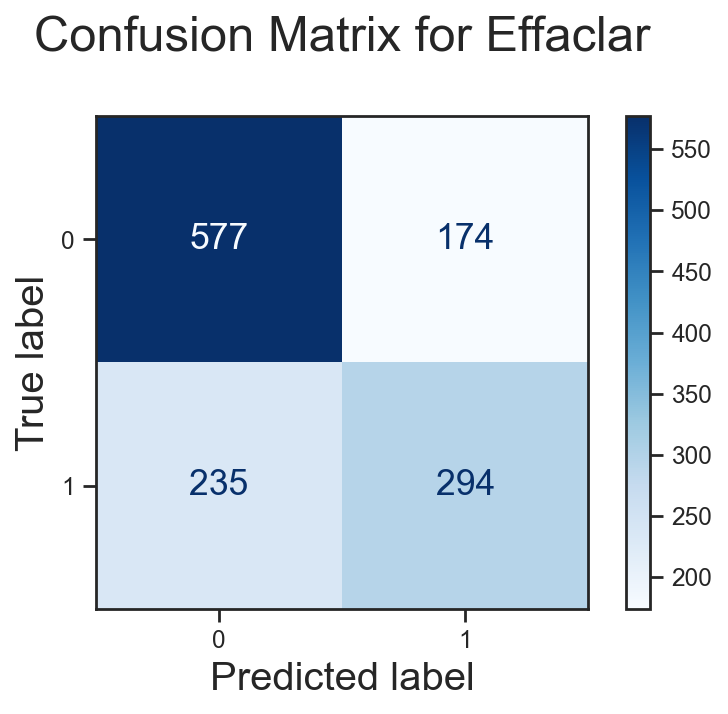

In [ ]:
confus_matrix(y_nn_effaclar_test, y_pred_nn_effaclar, "Effaclar")

40/40 [==============================] - 0s 633us/step


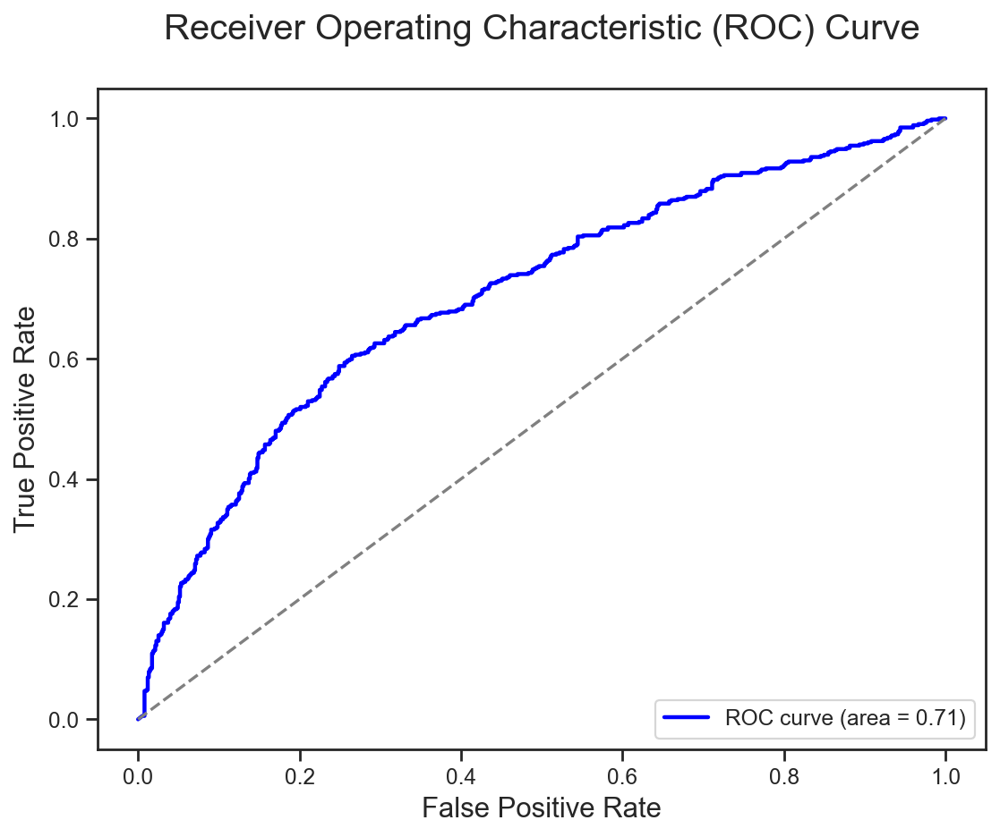

In [ ]:
plot_roc_curve(y_nn_effaclar_test, model_nn_effaclar.predict(x_nn_effaclar_test))

### 2.7: Neural network model (Brand Description_Anthelios_Output)

In [ ]:
loreal_nn_anthelios = loreal_nn.copy()

loreal_nn_anthelios["Brand Description_Anthelios_Output"] = loreal_classifi["Brand Description_Anthelios_Output"]

In [ ]:
x_nn_anthelios = loreal_nn_anthelios.iloc[:, 0:-1]
y_nn_anthelios = np.array(loreal_nn_anthelios['Brand Description_Anthelios_Output'])

x_nn_anthelios_train, x_nn_anthelios_test, y_nn_anthelios_train, y_nn_anthelios_test = train_test_split(x_nn_anthelios, y_nn_anthelios, test_size=0.2, random_state=0)
print(x_nn_anthelios_train.shape)
print(x_nn_anthelios_test.shape)

(5120, 90)
(1280, 90)


### 2.7.1: Finding balanced class weights

In [ ]:
classes = np.unique(y_nn_anthelios_train)
weights = class_weight.compute_class_weight(class_weight='balanced', classes=classes, y=y_nn_anthelios_train)
class_weights = dict(enumerate(weights))


In [ ]:
class_weights

{0: 0.887040887040887, 1: 1.1459265890778871}

### 2.7.2: Hyperparameter tuning

In [ ]:
tuner = kt.RandomSearch(
    best_neural_network,
    objective=kt.Objective("val_f1_score_group1", direction="max"),
    max_trials=20,  # Number of hyperparameter combinations to try
    executions_per_trial=3,  # Number of models to build and fit for each trial
    directory='neural_network_anthelios',
    project_name='tuning_nn_with_f1'
)

# Define early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=20, restore_best_weights=True)


In [ ]:
tf.keras.utils.set_random_seed(0)

tuner.search(x_nn_anthelios_train, y_nn_anthelios_train,
             epochs=50,
             batch_size=tuner.oracle.hyperparameters.Choice('batch_size', [8, 16, 32, 64]),
             validation_split=0.2,
             shuffle=True,
             callbacks=[early_stopping],
             class_weight=class_weights,
             verbose=2)

Oracle triggered exit


Trial 20 Complete [00h 00m 45s]
val_f1_score_group1: 0.602069616317749

Best val_f1_score_group1 So Far: 0.6071304281552633
Total elapsed time: 00h 17m 14s


### 2.7.3: Best Model Information

In [ ]:
# Get the best hyperparameters and model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

In [ ]:
print(f"Best units for input layer: {best_hps.get('units_1')}")
print(f"Best dropout rate for input layer: {best_hps.get('dropout_1')}")


print(f"Best number of hidden layers: {best_hps.get('num_layers')}")

if best_hps.get('num_layers') >= 1:
    print(f"Best units for first layer: {best_hps.get('units_2')}")
    print(f"Best dropout rate for first layer: {best_hps.get('dropout_2')}")

if best_hps.get('num_layers') >= 2:
    print(f"Best units for second layer: {best_hps.get('units_3')}")
    print(f"Best dropout rate for second layer: {best_hps.get('dropout_3')}")

if best_hps.get('num_layers') >= 3:
    print(f"Best units for third layer: {best_hps.get('units_4')}")
    print(f"Best dropout rate for third layer: {best_hps.get('dropout_4')}")



print(f"Best batch_size: {best_hps.get('batch_size')}")
print(f"Best learning_rate: {best_hps.get('learning_rate')}")

Best units for input layer: 192
Best dropout rate for input layer: 0.1
Best number of hidden layers: 2
Best units for first layer: 160
Best dropout rate for first layer: 0.1
Best units for second layer: 256
Best dropout rate for second layer: 0.1
Best batch_size: 32
Best learning_rate: 0.01


### 2.7.4: Model Building

In [ ]:
tf.keras.utils.set_random_seed(0)


model_nn_anthelios = tf.keras.Sequential()
n_features = x_nn_B5_train.shape[1]
n_outputs = 1


model_nn_anthelios.add(tf.keras.layers.Dense(192, input_dim=n_features, activation='relu',kernel_initializer='he_normal'))
model_nn_anthelios.add(tf.keras.layers.BatchNormalization())
model_nn_anthelios.add(tf.keras.layers.Dropout(0.1))


model_nn_anthelios.add(tf.keras.layers.Dense(160, activation='relu',kernel_initializer='he_normal'))
model_nn_anthelios.add(tf.keras.layers.BatchNormalization())
model_nn_anthelios.add(tf.keras.layers.Dropout(0.1))


model_nn_anthelios.add(tf.keras.layers.Dense(256, activation='relu',kernel_initializer='he_normal'))
model_nn_anthelios.add(tf.keras.layers.BatchNormalization())
model_nn_anthelios.add(tf.keras.layers.Dropout(0.1))


model_nn_anthelios.add(tf.keras.layers.Dense(1, activation='sigmoid'))


learning_rate = 0.01


model_nn_anthelios.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),f1_score_group1])


early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=100, restore_best_weights=True)


history = model_nn_anthelios.fit(x_nn_anthelios_train, y_nn_anthelios_train,
                    epochs=100,
                    batch_size=32,
                    validation_split=0.2,
                    shuffle=True,
                    callbacks=[early_stopping],
                    class_weight=class_weights,
                    verbose=1)


Epoch 1/100
128/128 [==============================] - 1s 3ms/step - loss: 0.7967 - accuracy: 0.5215 - auc: 0.5195 - f1_score_group1: 0.4523 - val_loss: 0.9387 - val_accuracy: 0.5146 - val_auc: 0.5764 - val_f1_score_group1: 0.6060
Epoch 2/100
128/128 [==============================] - 0s 2ms/step - loss: 0.7213 - accuracy: 0.5256 - auc: 0.5338 - f1_score_group1: 0.4656 - val_loss: 0.7322 - val_accuracy: 0.5156 - val_auc: 0.5510 - val_f1_score_group1: 0.5401
Epoch 3/100
128/128 [==============================] - 0s 2ms/step - loss: 0.7155 - accuracy: 0.5286 - auc: 0.5390 - f1_score_group1: 0.4478 - val_loss: 0.7281 - val_accuracy: 0.5459 - val_auc: 0.5278 - val_f1_score_group1: 0.4874
Epoch 4/100
128/128 [==============================] - 0s 2ms/step - loss: 0.7010 - accuracy: 0.5430 - auc: 0.5509 - f1_score_group1: 0.4630 - val_loss: 0.6882 - val_accuracy: 0.5518 - val_auc: 0.5776 - val_f1_score_group1: 0.4674
Epoch 5/100
128/128 [==============================] - 0s 2ms/step - loss: 0

128/128 [==============================] - 0s 2ms/step - loss: 0.6698 - accuracy: 0.5989 - auc: 0.6170 - f1_score_group1: 0.5110 - val_loss: 0.6681 - val_accuracy: 0.5898 - val_auc: 0.6398 - val_f1_score_group1: 0.3009
Epoch 37/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6653 - accuracy: 0.6052 - auc: 0.6269 - f1_score_group1: 0.5184 - val_loss: 0.6578 - val_accuracy: 0.6230 - val_auc: 0.6466 - val_f1_score_group1: 0.5080
Epoch 38/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6678 - accuracy: 0.6028 - auc: 0.6242 - f1_score_group1: 0.5239 - val_loss: 0.6911 - val_accuracy: 0.5918 - val_auc: 0.6226 - val_f1_score_group1: 0.5886
Epoch 39/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6663 - accuracy: 0.6072 - auc: 0.6277 - f1_score_group1: 0.5283 - val_loss: 0.6678 - val_accuracy: 0.6230 - val_auc: 0.6304 - val_f1_score_group1: 0.5480
Epoch 40/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6647 - 

128/128 [==============================] - 0s 2ms/step - loss: 0.6567 - accuracy: 0.6118 - auc: 0.6474 - f1_score_group1: 0.5345 - val_loss: 0.7445 - val_accuracy: 0.5801 - val_auc: 0.6119 - val_f1_score_group1: 0.2359
Epoch 72/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6573 - accuracy: 0.6262 - auc: 0.6472 - f1_score_group1: 0.5415 - val_loss: 0.6973 - val_accuracy: 0.6055 - val_auc: 0.6471 - val_f1_score_group1: 0.5980
Epoch 73/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6544 - accuracy: 0.6260 - auc: 0.6534 - f1_score_group1: 0.5533 - val_loss: 0.7771 - val_accuracy: 0.6055 - val_auc: 0.6127 - val_f1_score_group1: 0.4839
Epoch 74/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6525 - accuracy: 0.6262 - auc: 0.6545 - f1_score_group1: 0.5435 - val_loss: 0.8608 - val_accuracy: 0.6201 - val_auc: 0.6438 - val_f1_score_group1: 0.5192
Epoch 75/100
128/128 [==============================] - 0s 2ms/step - loss: 0.6635 - 

In [ ]:
model_nn_anthelios.evaluate(x_nn_anthelios_test, y_nn_anthelios_test)

40/40 [==============================] - 0s 671us/step - loss: 5.1037 - accuracy: 0.5945 - auc: 0.5870 - f1_score_group1: 0.4138


[5.103675842285156, 0.594531238079071, 0.5870327949523926, 0.4137643277645111]

In [ ]:
y_pred_nn_anthelios = model_nn_anthelios.predict(x_nn_anthelios_test)

y_pred_nn_anthelios = (y_pred_nn_anthelios > 0.5).astype(int)

print(classification_report(y_nn_anthelios_test, y_pred_nn_anthelios))

40/40 [==============================] - 0s 615us/step
              precision    recall  f1-score   support

           0       0.60      0.80      0.69       706
           1       0.58      0.34      0.43       574

    accuracy                           0.59      1280
   macro avg       0.59      0.57      0.56      1280
weighted avg       0.59      0.59      0.57      1280



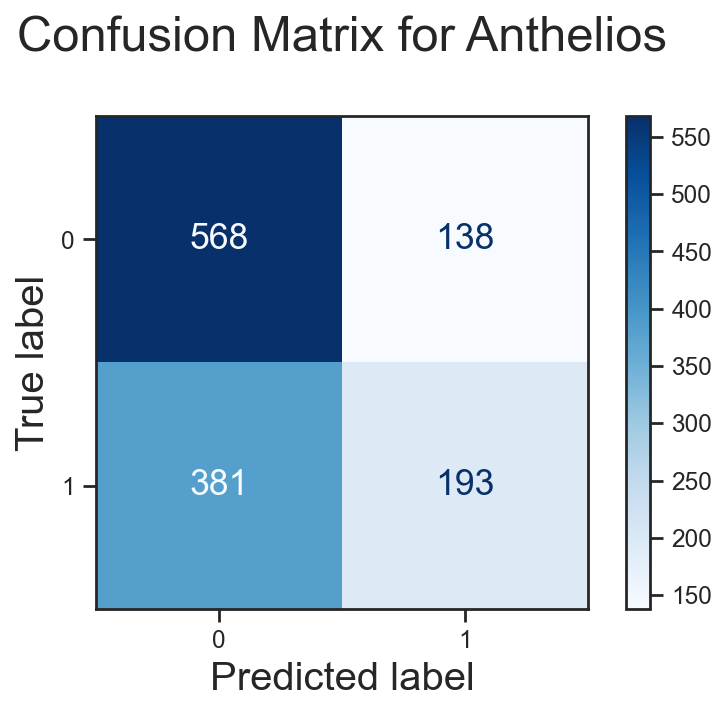

In [ ]:
confus_matrix(y_nn_anthelios_test, y_pred_nn_anthelios, "Anthelios")

40/40 [==============================] - 0s 645us/step


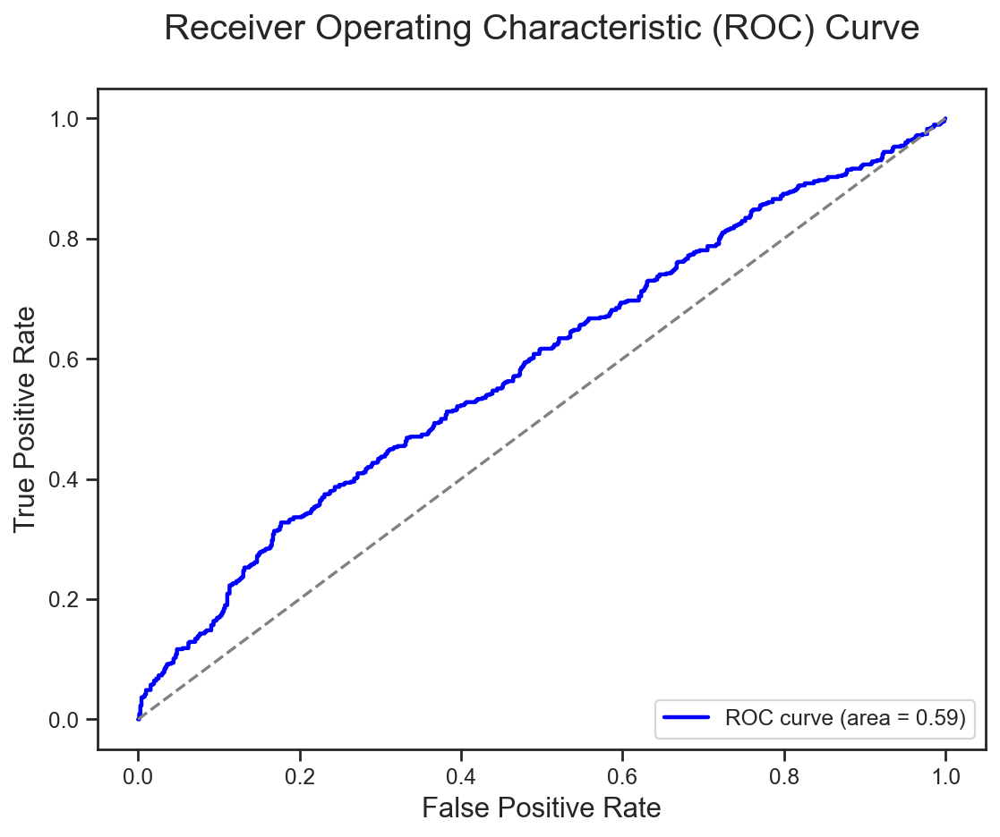

In [ ]:
plot_roc_curve(y_nn_anthelios_test, model_nn_anthelios.predict(x_nn_anthelios_test))

## 3: Random Forest Tree

In [ ]:
X = loreal.copy()
y = loreal_classifi.iloc[:, -7:]
# train test split
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# train valid split
X_train, X_valid, y_train, y_valid = train_test_split(X_temp, y_temp, test_size=0.2, random_state=0)


In [ ]:
# balance our response
def apply_smote(X, y):
    smote = BorderlineSMOTE(random_state=0)
    X_res, y_res = smote.fit_resample(X, y)
    return X_res, y_res


In [ ]:
# evaluate our model
def evaluate_model(model, X_valid, y_valid):
    y_pred_prob = model.predict_proba(X_valid)[:, 1]
    y_pred = (y_pred_prob > 0.5).astype(int)
    auc = roc_auc_score(y_valid, y_pred_prob)
    accuracy = accuracy_score(y_valid, y_pred)
    f1 = f1_score(y_valid, y_pred)
    return {'AUC': auc, 'Accuracy': accuracy, 'F1 Score': f1}

In [ ]:
# optimize hyper-parameter
def best_RandomForest_single_label_classification(trial, X_train, X_valid, y_train, y_valid):
    X_res, y_res = apply_smote(X_train, y_train)

    # fix class imbalance
    label_counts = y_train.value_counts()
    if 1 in label_counts and 0 in label_counts:
        weight = label_counts[0] / label_counts[1]
    else:
        weight = 1

    # define hyper-parameter range
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
        'max_features': trial.suggest_uniform('max_features', 0.1, 1.0),
        'class_weight': {0: 1, 1: weight},
        'random_state': 0
    }

    rf_model = RandomForestClassifier(**params)
    rf_model.fit(X_res, y_res)

    results = evaluate_model(rf_model, X_valid, y_valid)

    # Save the model in trial.user_attrs to retrieve later
    trial.set_user_attr('model', rf_model)

    # optimize f1 score
    return results['F1 Score']

In [ ]:
# get classification report
def generate_classification_report(model, X_test, y_test):
    y_pred = (model.predict_proba(X_test)[:, 1] > 0.5).astype(int)
    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=['Not Purchased', 'Purchased']))
    print("\n")

In [ ]:
# get confusion matrix
def plot_confusion_matrix(model, X_test, y_test):
    y_pred = (model.predict_proba(X_test)[:, 1] > 0.5).astype(int)
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Purchased', 'Purchased'])
    fig, ax = plt.subplots(figsize=(6, 4))
    disp.plot(cmap='Blues', ax=ax)
    plt.title('Confusion Matrix', fontsize=16)
    plt.xlabel('Predicted label', fontsize=14)
    plt.ylabel('True label', fontsize=14)
    ax.tick_params(axis='both', labelsize=12)
    plt.show()

### 3.1: Brand Description_Anthelios_Output

In [ ]:
y_train_Anthelios=y_train['Brand Description_Anthelios_Output']
y_valid_Anthelios=y_valid['Brand Description_Anthelios_Output']
y_test_Anthelios=y_test['Brand Description_Anthelios_Output']

In [ ]:
# build rf model
study_rf = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study_rf.optimize(lambda trial: best_RandomForest_single_label_classification(trial, X_train, X_valid, y_train_Anthelios, y_valid_Anthelios),
                  n_trials=50, show_progress_bar=True, n_jobs=-1, timeout=1200)

[I 2024-10-15 10:28:06,553] A new study created in memory with name: no-name-db0d43e0-6d71-4d85-9301-7c7a51451aa0


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2024-10-15 10:28:08,991] Trial 7 finished with value: 0.5998300764655905 and parameters: {'n_estimators': 194, 'max_depth': 6, 'min_samples_split': 4, 'min_samples_leaf': 6, 'max_features': 0.15090577271245698}. Best is trial 7 with value: 0.5998300764655905.
[I 2024-10-15 10:28:14,722] Trial 2 finished with value: 0.5605749486652978 and parameters: {'n_estimators': 339, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 9, 'max_features': 0.8388766949097969}. Best is trial 7 with value: 0.5998300764655905.
[I 2024-10-15 10:28:15,194] Trial 4 finished with value: 0.5617740232312566 and parameters: {'n_estimators': 397, 'max_depth': 12, 'min_samples_split': 7, 'min_samples_leaf': 6, 'max_features': 0.7127923458543832}. Best is trial 7 with value: 0.5998300764655905.
[I 2024-10-15 10:28:17,223] Trial 8 finished with value: 0.5790010193679919 and parameters: {'n_estimators': 871, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 0.246560736829647

[I 2024-10-15 10:28:34,265] Trial 27 finished with value: 0.5858778625954199 and parameters: {'n_estimators': 549, 'max_depth': 9, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.20250548249398015}. Best is trial 28 with value: 0.6042194092827005.
[I 2024-10-15 10:28:35,159] Trial 36 finished with value: 0.6012461059190031 and parameters: {'n_estimators': 471, 'max_depth': 3, 'min_samples_split': 2, 'min_samples_leaf': 9, 'max_features': 0.1994248235786072}. Best is trial 28 with value: 0.6042194092827005.
[I 2024-10-15 10:28:35,451] Trial 37 finished with value: 0.5957446808510638 and parameters: {'n_estimators': 451, 'max_depth': 3, 'min_samples_split': 2, 'min_samples_leaf': 9, 'max_features': 0.2053272740007479}. Best is trial 28 with value: 0.6042194092827005.
[I 2024-10-15 10:28:36,215] Trial 35 finished with value: 0.5876010781671159 and parameters: {'n_estimators': 454, 'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 0.39929989178

AUC: 0.596734313154544, Accuracy: 0.52890625, F1 Score: 0.5872689938398358


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.63      0.35      0.45       706
    Purchased       0.48      0.75      0.59       574

     accuracy                           0.53      1280
    macro avg       0.56      0.55      0.52      1280
 weighted avg       0.56      0.53      0.51      1280





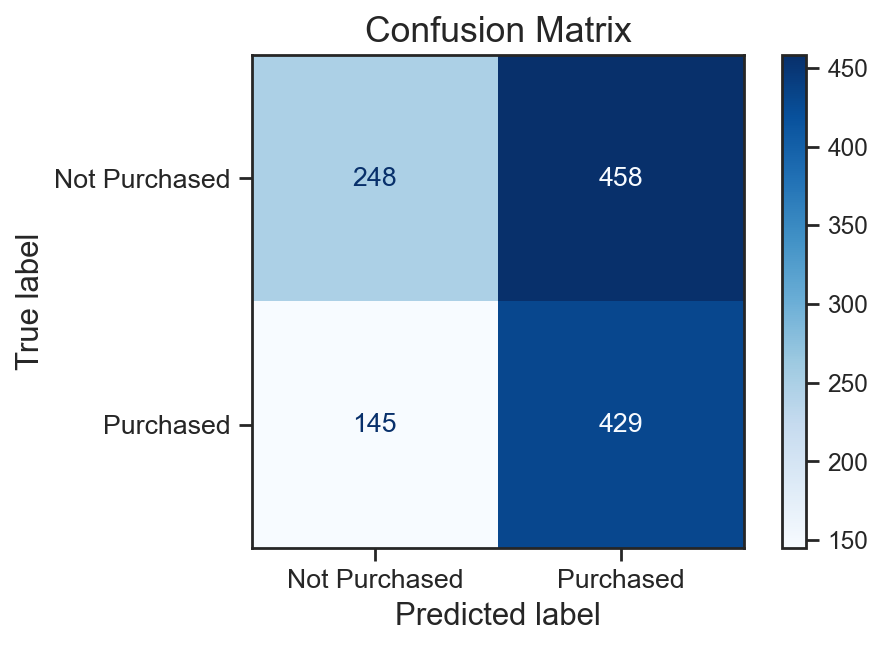

In [ ]:
# get the best model
best_model_rf_Anthelios = study_rf.best_trial.user_attrs['model']
# test performances on test set
label_results_rf = evaluate_model(best_model_rf_Anthelios, X_test, y_test_Anthelios)
# output result
print(f"AUC: {label_results_rf['AUC']}, Accuracy: {label_results_rf['Accuracy']}, F1 Score: {label_results_rf['F1 Score']}")
print('\n')

# classification report
generate_classification_report(best_model_rf_Anthelios, X_test, y_test_Anthelios)
# confusion matrix
plot_confusion_matrix(best_model_rf_Anthelios, X_test, y_test_Anthelios)

### 3.2: Brand Description_Cicaplast_Output

In [ ]:
y_train_Cicaplast=y_train['Brand Description_Cicaplast_Output']
y_valid_Cicaplast=y_valid['Brand Description_Cicaplast_Output']
y_test_Cicaplast=y_test['Brand Description_Cicaplast_Output']

In [ ]:
# build rf model
study_rf = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study_rf.optimize(lambda trial: best_RandomForest_single_label_classification(trial, X_train, X_valid, y_train_Cicaplast, y_valid_Cicaplast),
                  n_trials=50, show_progress_bar=True, n_jobs=-1, timeout=1200)

[I 2024-10-15 10:29:35,878] A new study created in memory with name: no-name-f7e4fa01-40a9-4dc9-8105-f56ab0180fbc


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2024-10-15 10:29:39,993] Trial 5 finished with value: 0.4085106382978723 and parameters: {'n_estimators': 398, 'max_depth': 4, 'min_samples_split': 6, 'min_samples_leaf': 6, 'max_features': 0.28534597987126104}. Best is trial 5 with value: 0.4085106382978723.
[I 2024-10-15 10:29:41,469] Trial 7 finished with value: 0.4367816091954023 and parameters: {'n_estimators': 233, 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.8024385630058734}. Best is trial 7 with value: 0.4367816091954023.
[I 2024-10-15 10:29:41,667] Trial 6 finished with value: 0.411663807890223 and parameters: {'n_estimators': 511, 'max_depth': 4, 'min_samples_split': 10, 'min_samples_leaf': 10, 'max_features': 0.38171490367075955}. Best is trial 7 with value: 0.4367816091954023.
[I 2024-10-15 10:29:42,117] Trial 0 finished with value: 0.4051863857374392 and parameters: {'n_estimators': 729, 'max_depth': 3, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 0.2782994957406856

[I 2024-10-15 10:30:19,476] Trial 31 finished with value: 0.456359102244389 and parameters: {'n_estimators': 323, 'max_depth': 8, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.9703011609654922}. Best is trial 12 with value: 0.46041412911084045.
[I 2024-10-15 10:30:20,355] Trial 35 finished with value: 0.4431687715269805 and parameters: {'n_estimators': 183, 'max_depth': 7, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 0.9293662411552351}. Best is trial 12 with value: 0.46041412911084045.
[I 2024-10-15 10:30:21,074] Trial 32 finished with value: 0.4489281210592686 and parameters: {'n_estimators': 347, 'max_depth': 8, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_features': 0.9826388605000353}. Best is trial 12 with value: 0.46041412911084045.
[I 2024-10-15 10:30:24,173] Trial 33 finished with value: 0.45869297163995065 and parameters: {'n_estimators': 364, 'max_depth': 8, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 0.994343920

AUC: 0.6609029204728895, Accuracy: 0.5921875, F1 Score: 0.478


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.84      0.55      0.67       943
    Purchased       0.36      0.71      0.48       337

     accuracy                           0.59      1280
    macro avg       0.60      0.63      0.57      1280
 weighted avg       0.71      0.59      0.62      1280





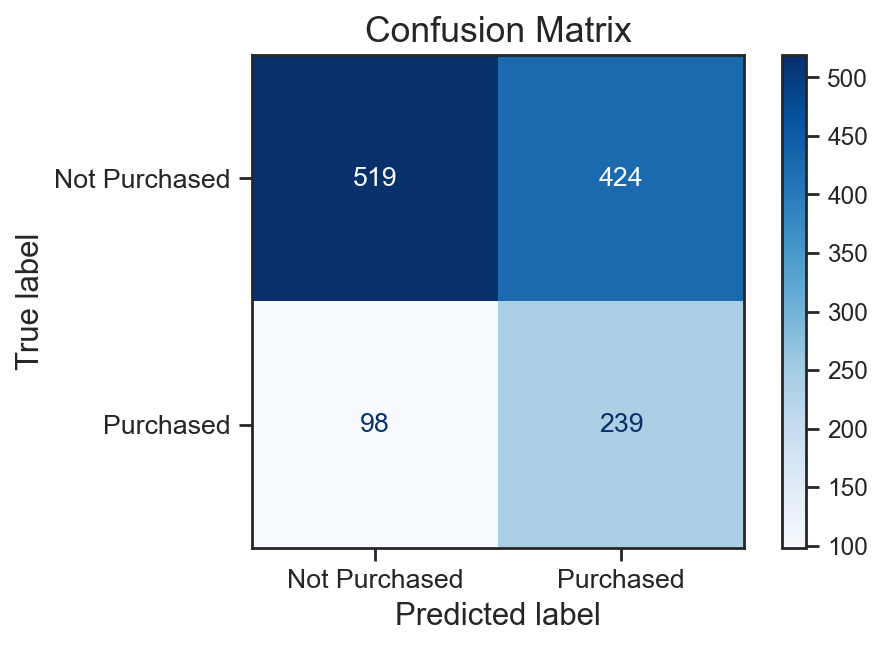

In [ ]:
# get the best model
best_model_rf_Cicaplast = study_rf.best_trial.user_attrs['model']
# test performances on test set
label_results_rf = evaluate_model(best_model_rf_Cicaplast, X_test, y_test_Cicaplast)
# output result
print(f"AUC: {label_results_rf['AUC']}, Accuracy: {label_results_rf['Accuracy']}, F1 Score: {label_results_rf['F1 Score']}")
print('\n')

# classification report
generate_classification_report(best_model_rf_Cicaplast, X_test, y_test_Cicaplast)
# confusion matrix
plot_confusion_matrix(best_model_rf_Cicaplast, X_test, y_test_Cicaplast)

### 3.3: Brand Description_Effaclar_Output

In [ ]:
y_train_Effaclar=y_train['Brand Description_Effaclar_Output']
y_valid_Effaclar=y_valid['Brand Description_Effaclar_Output']
y_test_Effaclar=y_test['Brand Description_Effaclar_Output']

In [ ]:
# build rf model
study_rf = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study_rf.optimize(lambda trial: best_RandomForest_single_label_classification(trial, X_train, X_valid, y_train_Effaclar, y_valid_Effaclar),
                  n_trials=50, show_progress_bar=True, n_jobs=-1, timeout=1200)

[I 2024-10-15 10:31:12,596] A new study created in memory with name: no-name-dba00c6c-9b85-4e7f-867f-eb8b55ba090e


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2024-10-15 10:31:15,389] Trial 6 finished with value: 0.6266506602641057 and parameters: {'n_estimators': 125, 'max_depth': 16, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 0.4163058937943171}. Best is trial 6 with value: 0.6266506602641057.
[I 2024-10-15 10:31:15,926] Trial 7 finished with value: 0.6317044100119189 and parameters: {'n_estimators': 107, 'max_depth': 9, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 0.8553740794204606}. Best is trial 7 with value: 0.6317044100119189.
[I 2024-10-15 10:31:18,946] Trial 4 finished with value: 0.6401985111662531 and parameters: {'n_estimators': 619, 'max_depth': 3, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.5929272606199659}. Best is trial 4 with value: 0.6401985111662531.
[I 2024-10-15 10:31:19,252] Trial 1 finished with value: 0.6389548693586699 and parameters: {'n_estimators': 452, 'max_depth': 8, 'min_samples_split': 2, 'min_samples_leaf': 10, 'max_features': 0.4373340010402693

[I 2024-10-15 10:31:50,403] Trial 36 finished with value: 0.6420323325635104 and parameters: {'n_estimators': 468, 'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.7261103840928607}. Best is trial 19 with value: 0.6437346437346437.
[I 2024-10-15 10:31:50,973] Trial 35 finished with value: 0.6422857142857142 and parameters: {'n_estimators': 450, 'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.8975072882424528}. Best is trial 19 with value: 0.6437346437346437.
[I 2024-10-15 10:31:52,580] Trial 37 finished with value: 0.6382488479262672 and parameters: {'n_estimators': 417, 'max_depth': 4, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.7353246994233251}. Best is trial 19 with value: 0.6437346437346437.
[I 2024-10-15 10:31:52,958] Trial 33 finished with value: 0.6396292004634995 and parameters: {'n_estimators': 497, 'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.715038569882

AUC: 0.7216188119684153, Accuracy: 0.68125, F1 Score: 0.603112840466926


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.72      0.75      0.73       751
    Purchased       0.62      0.59      0.60       529

     accuracy                           0.68      1280
    macro avg       0.67      0.67      0.67      1280
 weighted avg       0.68      0.68      0.68      1280





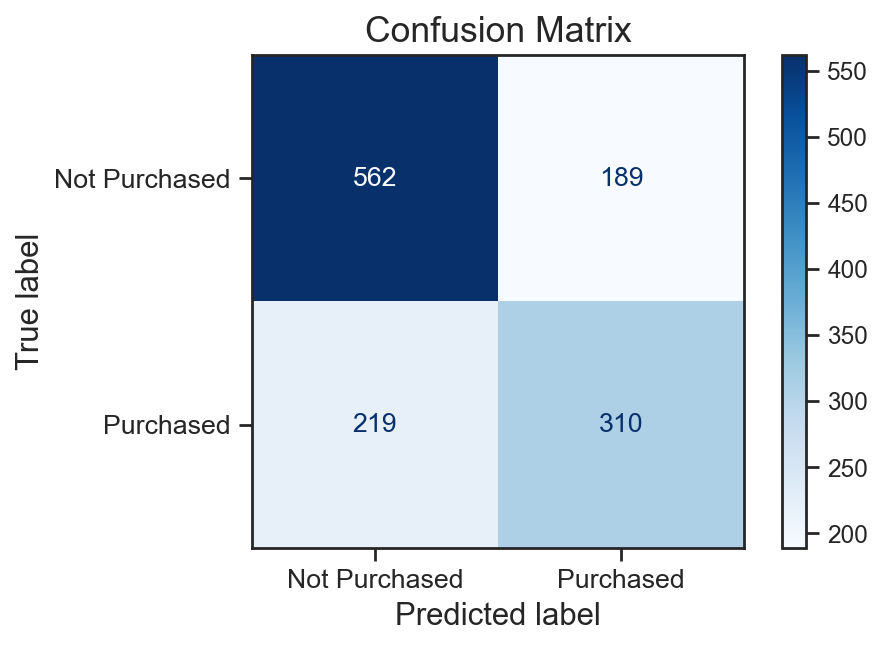

In [ ]:
# get the best model
best_model_rf_Effaclar = study_rf.best_trial.user_attrs['model']
# test performances on test set
label_results_rf = evaluate_model(best_model_rf_Effaclar, X_test, y_test_Effaclar)
# output result
print(f"AUC: {label_results_rf['AUC']}, Accuracy: {label_results_rf['Accuracy']}, F1 Score: {label_results_rf['F1 Score']}")
print('\n')

# classification report
generate_classification_report(best_model_rf_Effaclar, X_test, y_test_Effaclar)
# confusion matrix
plot_confusion_matrix(best_model_rf_Effaclar, X_test, y_test_Effaclar)

### 3.4: Brand Description_Hyalu B5_Output

In [ ]:
y_train_B5=y_train['Brand Description_Hyalu B5_Output']
y_valid_B5=y_valid['Brand Description_Hyalu B5_Output']
y_test_B5=y_test['Brand Description_Hyalu B5_Output']

In [ ]:
# build rf model
study_rf = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study_rf.optimize(lambda trial: best_RandomForest_single_label_classification(trial, X_train, X_valid, y_train_B5, y_valid_B5),
                  n_trials=50, show_progress_bar=True, n_jobs=-1, timeout=1200)

[I 2024-10-15 10:32:20,491] A new study created in memory with name: no-name-5a0b664b-9761-4d57-a197-52f2324ac4a9


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2024-10-15 10:32:25,405] Trial 6 finished with value: 0.3035230352303523 and parameters: {'n_estimators': 214, 'max_depth': 13, 'min_samples_split': 7, 'min_samples_leaf': 9, 'max_features': 0.2424211457700712}. Best is trial 6 with value: 0.3035230352303523.
[I 2024-10-15 10:32:31,983] Trial 2 finished with value: 0.3028391167192429 and parameters: {'n_estimators': 277, 'max_depth': 12, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.5648593930334556}. Best is trial 6 with value: 0.3035230352303523.
[I 2024-10-15 10:32:32,707] Trial 7 finished with value: 0.2555366269165247 and parameters: {'n_estimators': 767, 'max_depth': 7, 'min_samples_split': 6, 'min_samples_leaf': 5, 'max_features': 0.2824486798948848}. Best is trial 6 with value: 0.3035230352303523.
[I 2024-10-15 10:32:33,524] Trial 5 finished with value: 0.2907268170426065 and parameters: {'n_estimators': 934, 'max_depth': 15, 'min_samples_split': 9, 'min_samples_leaf': 10, 'max_features': 0.153860266129696

[I 2024-10-15 10:34:26,671] Trial 35 finished with value: 0.3137254901960784 and parameters: {'n_estimators': 262, 'max_depth': 17, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.6606864350026297}. Best is trial 11 with value: 0.33447098976109213.
[I 2024-10-15 10:34:27,074] Trial 34 finished with value: 0.3127035830618892 and parameters: {'n_estimators': 269, 'max_depth': 17, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.6802463337453738}. Best is trial 11 with value: 0.33447098976109213.
[I 2024-10-15 10:34:27,398] Trial 29 finished with value: 0.3202614379084967 and parameters: {'n_estimators': 722, 'max_depth': 17, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 0.7882721335495778}. Best is trial 11 with value: 0.33447098976109213.
[I 2024-10-15 10:34:32,408] Trial 31 finished with value: 0.32131147540983607 and parameters: {'n_estimators': 713, 'max_depth': 17, 'min_samples_split': 9, 'min_samples_leaf': 8, 'max_features': 0.8307

AUC: 0.7710434768134757, Accuracy: 0.8078125, F1 Score: 0.27647058823529413


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.95      0.84      0.89      1178
    Purchased       0.20      0.46      0.28       102

     accuracy                           0.81      1280
    macro avg       0.57      0.65      0.58      1280
 weighted avg       0.89      0.81      0.84      1280





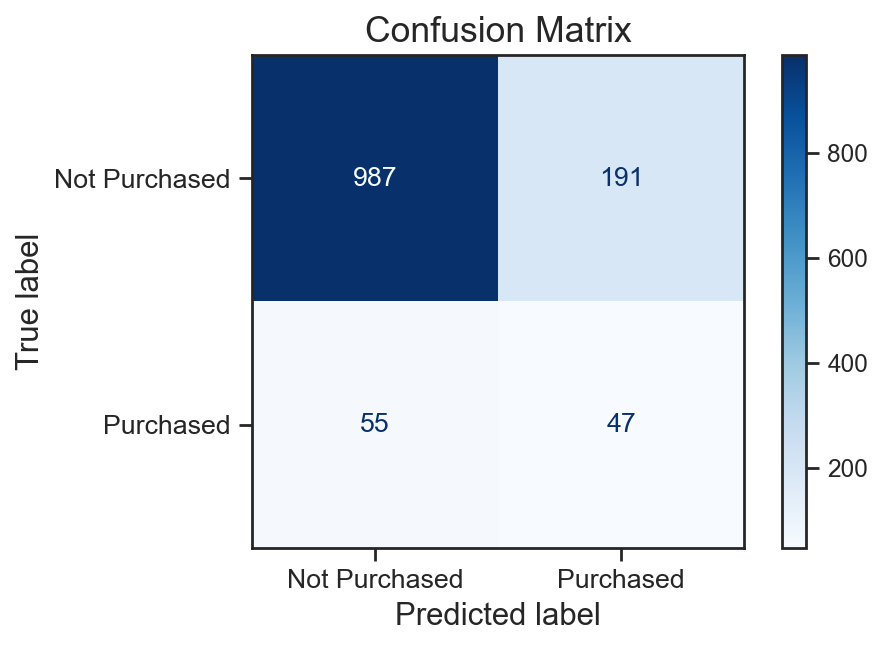

In [ ]:
# get the best model
best_model_rf_B5 = study_rf.best_trial.user_attrs['model']
# test performances on test set
label_results_rf = evaluate_model(best_model_rf_B5, X_test, y_test_B5)
# output result
print(f"AUC: {label_results_rf['AUC']}, Accuracy: {label_results_rf['Accuracy']}, F1 Score: {label_results_rf['F1 Score']}")
print('\n')

# classification report
generate_classification_report(best_model_rf_B5, X_test, y_test_B5)
# confusion matrix
plot_confusion_matrix(best_model_rf_B5, X_test, y_test_B5)

### 3.5: Brand Description_Lipikar_Output

In [ ]:
y_train_Lipikar=y_train['Brand Description_Lipikar_Output']
y_valid_Lipikar=y_valid['Brand Description_Lipikar_Output']
y_test_Lipikar=y_test['Brand Description_Lipikar_Output']

In [ ]:
# build rf model
study_rf = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study_rf.optimize(lambda trial: best_RandomForest_single_label_classification(trial, X_train, X_valid, y_train_Lipikar, y_valid_Lipikar),
                  n_trials=50, show_progress_bar=True, n_jobs=-1, timeout=1200)

[I 2024-10-15 10:36:10,160] A new study created in memory with name: no-name-d0290505-2f4d-4ea4-a76a-b9891c3dafc8


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2024-10-15 10:36:14,412] Trial 0 finished with value: 0.4352 and parameters: {'n_estimators': 189, 'max_depth': 14, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.12353055071779984}. Best is trial 0 with value: 0.4352.
[I 2024-10-15 10:36:15,721] Trial 5 finished with value: 0.43103448275862066 and parameters: {'n_estimators': 143, 'max_depth': 9, 'min_samples_split': 6, 'min_samples_leaf': 1, 'max_features': 0.5201290526747416}. Best is trial 0 with value: 0.4352.
[I 2024-10-15 10:36:18,855] Trial 3 finished with value: 0.4 and parameters: {'n_estimators': 351, 'max_depth': 4, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.7994661958553839}. Best is trial 0 with value: 0.4352.
[I 2024-10-15 10:36:19,591] Trial 7 finished with value: 0.445468509984639 and parameters: {'n_estimators': 566, 'max_depth': 17, 'min_samples_split': 3, 'min_samples_leaf': 9, 'max_features': 0.18479399032660457}. Best is trial 7 with value: 0.445468509984639.
[I 2024-10-

[I 2024-10-15 10:37:31,305] Trial 32 finished with value: 0.4444444444444444 and parameters: {'n_estimators': 856, 'max_depth': 15, 'min_samples_split': 7, 'min_samples_leaf': 9, 'max_features': 0.5028411981420184}. Best is trial 2 with value: 0.46102819237147596.
[I 2024-10-15 10:37:32,010] Trial 34 finished with value: 0.45095168374816985 and parameters: {'n_estimators': 821, 'max_depth': 10, 'min_samples_split': 7, 'min_samples_leaf': 9, 'max_features': 0.5506662561256456}. Best is trial 2 with value: 0.46102819237147596.
[I 2024-10-15 10:37:33,333] Trial 35 finished with value: 0.45132743362831856 and parameters: {'n_estimators': 830, 'max_depth': 10, 'min_samples_split': 7, 'min_samples_leaf': 9, 'max_features': 0.5340629656377825}. Best is trial 2 with value: 0.46102819237147596.
[I 2024-10-15 10:37:33,803] Trial 29 finished with value: 0.45923460898502494 and parameters: {'n_estimators': 856, 'max_depth': 12, 'min_samples_split': 7, 'min_samples_leaf': 10, 'max_features': 0.6719

AUC: 0.6607840888953749, Accuracy: 0.7078125, F1 Score: 0.3967741935483871


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.82      0.79      0.81       989
    Purchased       0.37      0.42      0.40       291

     accuracy                           0.71      1280
    macro avg       0.60      0.61      0.60      1280
 weighted avg       0.72      0.71      0.71      1280





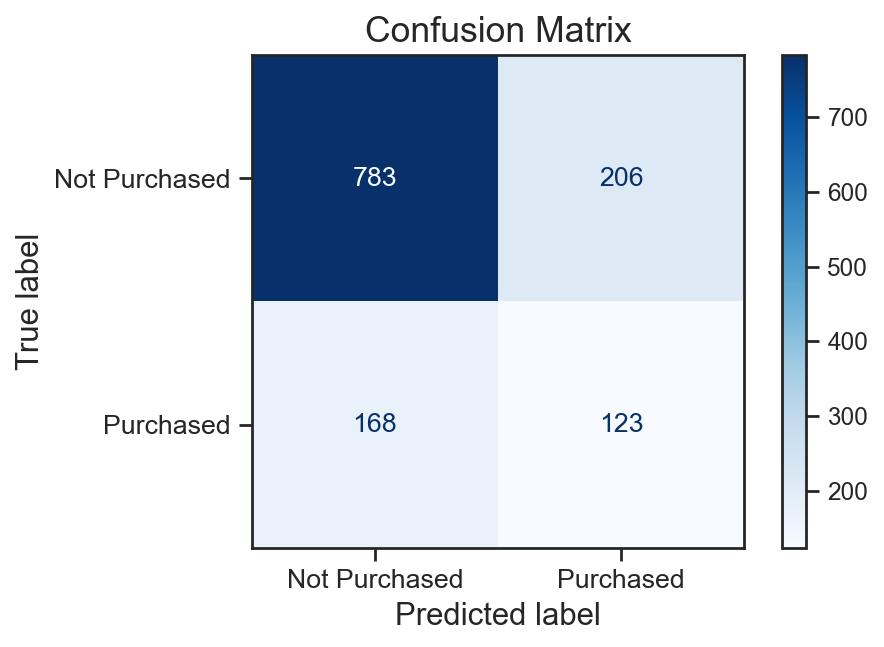

In [ ]:
# get the best model
best_model_rf_Lipikar = study_rf.best_trial.user_attrs['model']
# test performances on test set
label_results_rf = evaluate_model(best_model_rf_Lipikar, X_test, y_test_Lipikar)
# output result
print(f"AUC: {label_results_rf['AUC']}, Accuracy: {label_results_rf['Accuracy']}, F1 Score: {label_results_rf['F1 Score']}")
print('\n')

# classification report
generate_classification_report(best_model_rf_Lipikar, X_test, y_test_Lipikar)
# confusion matrix
plot_confusion_matrix(best_model_rf_Lipikar, X_test, y_test_Lipikar)

### 3.6: Brand Description_Toleriane_Output

In [ ]:
y_train_Toleriane=y_train['Brand Description_Toleriane_Output']
y_valid_Toleriane=y_valid['Brand Description_Toleriane_Output']
y_test_Toleriane=y_test['Brand Description_Toleriane_Output']

In [ ]:
# build rf model
study_rf = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study_rf.optimize(lambda trial: best_RandomForest_single_label_classification(trial, X_train, X_valid, y_train_Toleriane, y_valid_Toleriane),
                  n_trials=50, show_progress_bar=True, n_jobs=-1, timeout=1200)

[I 2024-10-15 10:38:24,311] A new study created in memory with name: no-name-6dc9bea5-2a9d-4054-8319-fe000114bdca


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2024-10-15 10:38:27,884] Trial 1 finished with value: 0.6309226932668329 and parameters: {'n_estimators': 309, 'max_depth': 8, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 0.14829475017250726}. Best is trial 1 with value: 0.6309226932668329.
[I 2024-10-15 10:38:29,051] Trial 6 finished with value: 0.6326276463262764 and parameters: {'n_estimators': 251, 'max_depth': 18, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.35527537824630706}. Best is trial 6 with value: 0.6326276463262764.
[I 2024-10-15 10:38:29,301] Trial 8 finished with value: 0.6386138613861386 and parameters: {'n_estimators': 106, 'max_depth': 20, 'min_samples_split': 9, 'min_samples_leaf': 7, 'max_features': 0.19387075520778346}. Best is trial 8 with value: 0.6386138613861386.
[I 2024-10-15 10:38:30,296] Trial 2 finished with value: 0.6275 and parameters: {'n_estimators': 568, 'max_depth': 10, 'min_samples_split': 7, 'min_samples_leaf': 10, 'max_features': 0.14678754766742438}. Bes

[I 2024-10-15 10:39:14,453] Trial 32 finished with value: 0.6524822695035462 and parameters: {'n_estimators': 606, 'max_depth': 3, 'min_samples_split': 3, 'min_samples_leaf': 7, 'max_features': 0.9903918980770892}. Best is trial 29 with value: 0.6577344701583435.
[I 2024-10-15 10:39:14,917] Trial 33 finished with value: 0.6548042704626335 and parameters: {'n_estimators': 617, 'max_depth': 3, 'min_samples_split': 5, 'min_samples_leaf': 7, 'max_features': 0.9267269237776631}. Best is trial 29 with value: 0.6577344701583435.
[I 2024-10-15 10:39:16,691] Trial 35 finished with value: 0.6517119244391971 and parameters: {'n_estimators': 636, 'max_depth': 3, 'min_samples_split': 5, 'min_samples_leaf': 9, 'max_features': 0.9981917385593375}. Best is trial 29 with value: 0.6577344701583435.
[I 2024-10-15 10:39:17,237] Trial 34 finished with value: 0.6524822695035462 and parameters: {'n_estimators': 658, 'max_depth': 3, 'min_samples_split': 5, 'min_samples_leaf': 9, 'max_features': 0.988642102402

AUC: 0.7699274110804926, Accuracy: 0.72109375, F1 Score: 0.641925777331996


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.77      0.78      0.77       777
    Purchased       0.65      0.64      0.64       503

     accuracy                           0.72      1280
    macro avg       0.71      0.71      0.71      1280
 weighted avg       0.72      0.72      0.72      1280





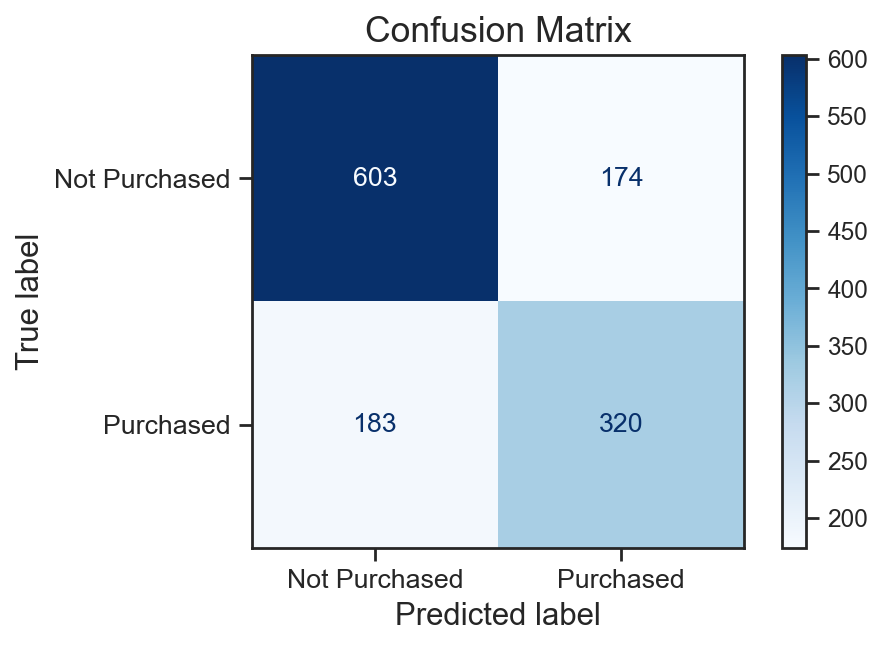

In [ ]:
# get the best model
best_model_rf_Toleriane = study_rf.best_trial.user_attrs['model']
# test performances on test set
label_results_rf = evaluate_model(best_model_rf_Toleriane, X_test, y_test_Toleriane)
# output result
print(f"AUC: {label_results_rf['AUC']}, Accuracy: {label_results_rf['Accuracy']}, F1 Score: {label_results_rf['F1 Score']}")
print('\n')

# classification report
generate_classification_report(best_model_rf_Toleriane, X_test, y_test_Toleriane)
# confusion matrix
plot_confusion_matrix(best_model_rf_Toleriane, X_test, y_test_Toleriane)

### 3.7: Brand Description_Vitamin C_Output

In [ ]:
y_train_Vitamin=y_train['Brand Description_Vitamin C_Output']
y_valid_Vitamin=y_valid['Brand Description_Vitamin C_Output']
y_test_Vitamin=y_test['Brand Description_Vitamin C_Output']

In [ ]:
# build rf model
study_rf = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study_rf.optimize(lambda trial: best_RandomForest_single_label_classification(trial, X_train, X_valid, y_train_Vitamin, y_valid_Vitamin),
                  n_trials=50, show_progress_bar=True, n_jobs=-1, timeout=1200)

[I 2024-10-15 10:39:47,166] A new study created in memory with name: no-name-e6d5a5ed-424e-4df5-9c13-f9ef0407ef5c


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2024-10-15 10:39:51,182] Trial 2 finished with value: 0.3686635944700461 and parameters: {'n_estimators': 262, 'max_depth': 6, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 0.33346558696458306}. Best is trial 2 with value: 0.3686635944700461.
[I 2024-10-15 10:39:51,720] Trial 4 finished with value: 0.3465045592705167 and parameters: {'n_estimators': 134, 'max_depth': 14, 'min_samples_split': 8, 'min_samples_leaf': 9, 'max_features': 0.6330987352249976}. Best is trial 2 with value: 0.3686635944700461.
[I 2024-10-15 10:39:52,469] Trial 1 finished with value: 0.34796747967479674 and parameters: {'n_estimators': 120, 'max_depth': 20, 'min_samples_split': 10, 'min_samples_leaf': 9, 'max_features': 0.9024063572062768}. Best is trial 2 with value: 0.3686635944700461.
[I 2024-10-15 10:39:52,885] Trial 6 finished with value: 0.34678624813153963 and parameters: {'n_estimators': 177, 'max_depth': 19, 'min_samples_split': 9, 'min_samples_leaf': 10, 'max_features': 0.63141956221

[I 2024-10-15 10:40:43,437] Trial 31 finished with value: 0.3787878787878788 and parameters: {'n_estimators': 771, 'max_depth': 6, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.5180709251085429}. Best is trial 28 with value: 0.3795066413662239.
[I 2024-10-15 10:40:45,813] Trial 32 finished with value: 0.3738120380147835 and parameters: {'n_estimators': 723, 'max_depth': 7, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.551612418715256}. Best is trial 28 with value: 0.3795066413662239.
[I 2024-10-15 10:40:48,765] Trial 33 finished with value: 0.35214446952595935 and parameters: {'n_estimators': 711, 'max_depth': 8, 'min_samples_split': 7, 'min_samples_leaf': 6, 'max_features': 0.5691089208864217}. Best is trial 28 with value: 0.3795066413662239.
[I 2024-10-15 10:40:53,846] Trial 34 finished with value: 0.35600907029478457 and parameters: {'n_estimators': 721, 'max_depth': 8, 'min_samples_split': 7, 'min_samples_leaf': 6, 'max_features': 0.70349294231

AUC: 0.5265491685458453, Accuracy: 0.37109375, F1 Score: 0.38876233864844345


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.79      0.23      0.35       966
    Purchased       0.26      0.82      0.39       314

     accuracy                           0.37      1280
    macro avg       0.52      0.52      0.37      1280
 weighted avg       0.66      0.37      0.36      1280





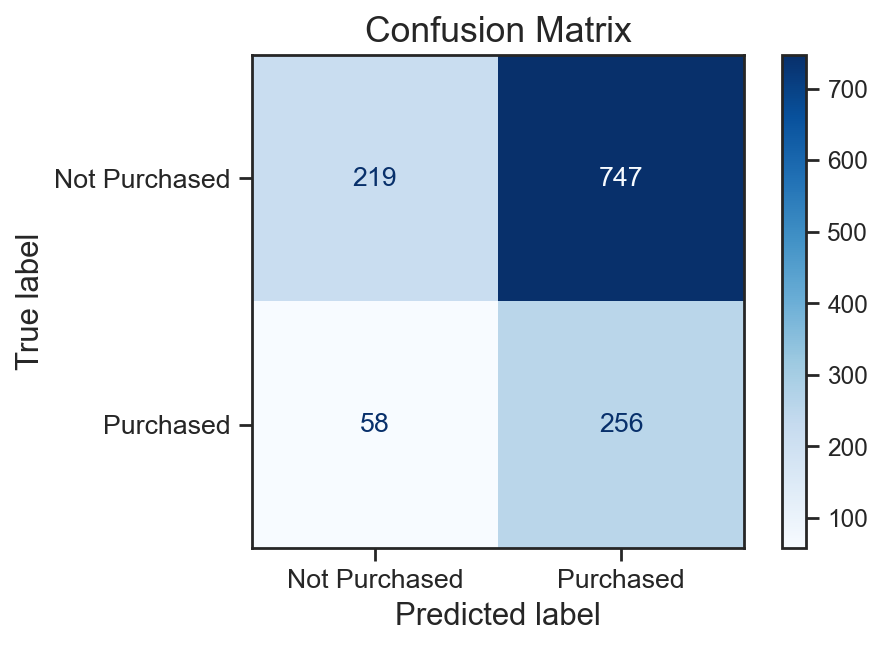

In [ ]:
# get the best model
best_model_rf_Vitamin = study_rf.best_trial.user_attrs['model']
# test performances on test set
label_results_rf = evaluate_model(best_model_rf_Vitamin, X_test, y_test_Vitamin)
# output result
print(f"AUC: {label_results_rf['AUC']}, Accuracy: {label_results_rf['Accuracy']}, F1 Score: {label_results_rf['F1 Score']}")
print('\n')

# classification report
generate_classification_report(best_model_rf_Vitamin, X_test, y_test_Vitamin)
# confusion matrix
plot_confusion_matrix(best_model_rf_Vitamin, X_test, y_test_Vitamin)

## 4: XGBoost Model

In [ ]:
def plot_confusion_matrix(model, X_valid, y_valid):
    y_pred = (model.predict_proba(X_valid)[:, 1] > 0.5).astype(int)
    cm = confusion_matrix(y_valid, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Purchased', 'Purchased'])
    fig, ax = plt.subplots(figsize=(6, 4))
    disp.plot(cmap='Blues', ax=ax)
    plt.title('Confusion Matrix', fontsize=16)
    plt.xlabel('Predicted label', fontsize=14)
    plt.ylabel('True label', fontsize=14)
    ax.tick_params(axis='both', labelsize=12)
    for texts in disp.text_.ravel():
        texts.set_fontsize(12)

    plt.show()

In [ ]:
def evaluate_model(model, X_valid, y_valid):
    y_pred_prob = model.predict_proba(X_valid)[:, 1]
    y_pred = (y_pred_prob > 0.5).astype(int)
    auc = roc_auc_score(y_valid, y_pred_prob)
    accuracy = accuracy_score(y_valid, y_pred)
    f1 = f1_score(y_valid, y_pred)
    return {'AUC': auc, 'Accuracy': accuracy, 'F1 Score': f1}


In [ ]:
def apply_smote_with_dynamic_neighbors(X, y):
    class_counts = y.value_counts()
    min_class_count = min(class_counts.values)

    if min_class_count > 1:
        k_neighbors = min(5, min_class_count - 1)
    else:
        return X, y

    smote = BorderlineSMOTE(random_state=0, k_neighbors=k_neighbors)
    X_res, y_res = smote.fit_resample(X, y)
    return X_res, y_res

In [ ]:
def best_XGBoost_single_label_classification(trial, X_train, X_valid, y_train, y_valid):
    X_res, y_res = apply_smote_with_dynamic_neighbors(X_train, y_train)

    label_counts = y_train.value_counts()
    if 1 in label_counts and 0 in label_counts:
        weight = label_counts[0] / label_counts[1]
        scale_pos_weight = trial.suggest_uniform('scale_pos_weight', 1, max(2, weight))
    else:
        scale_pos_weight = 1

    params = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'booster': 'gbtree',
        'learning_rate': trial.suggest_uniform('learning_rate', 0.001, 0.1),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'lambda': trial.suggest_loguniform('lambda', 1e-8, 10.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-8, 10.0),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 20),
        'scale_pos_weight': scale_pos_weight,
        'random_state': 0  # set seed so results are reproducible
    }

    xgb_model = xgb.XGBClassifier(**params)
    xgb_model.fit(X_res, y_res)

    results = evaluate_model(xgb_model, X_valid, y_valid)
    trial.set_user_attr('model', xgb_model)

    return results['F1 Score']

In [ ]:
def generate_classification_report(model, X_valid, y_valid):
    y_pred = (model.predict_proba(X_valid)[:, 1] > 0.5).astype(int)
    print("Classification Report:")
    print(classification_report(y_valid, y_pred, target_names=['Not Purchased', 'Purchased']))
    print("\n")


### 4.1: Brand Description_Anthelios_Output

In [ ]:
y_train_Anthelios=y_train['Brand Description_Anthelios_Output']
y_valid_Anthelios=y_valid['Brand Description_Anthelios_Output']
y_test_Anthelios=y_test['Brand Description_Anthelios_Output']

In [ ]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study.optimize(lambda trial: best_XGBoost_single_label_classification(
    trial, X_train, X_valid, y_train_Anthelios, y_valid_Anthelios), n_trials=50,timeout=600)


[I 2024-10-15 10:44:14,460] A new study created in memory with name: no-name-07f1eacd-357b-47a4-bcc9-7e00a98600ef
[I 2024-10-15 10:44:15,030] Trial 0 finished with value: 0.5716963448922212 and parameters: {'scale_pos_weight': 1.5488135039273248, 'learning_rate': 0.07180374727086954, 'max_depth': 13, 'lambda': 0.0008015832747965149, 'alpha': 6.499698237449666e-05, 'subsample': 0.8229470565333281, 'colsample_bytree': 0.7187936056313462, 'min_child_weight': 18}. Best is trial 0 with value: 0.5716963448922212.
[I 2024-10-15 10:44:15,819] Trial 1 finished with value: 0.5708812260536399 and parameters: {'scale_pos_weight': 1.9636627605010293, 'learning_rate': 0.038960710363751996, 'max_depth': 17, 'lambda': 0.0005755118598534656, 'alpha': 0.001295391520396607, 'subsample': 0.9627983191463305, 'colsample_bytree': 0.5355180290989434, 'min_child_weight': 2}. Best is trial 0 with value: 0.5716963448922212.
[I 2024-10-15 10:44:16,249] Trial 2 finished with value: 0.5159817351598174 and parameter

[I 2024-10-15 10:44:23,688] Trial 21 finished with value: 0.6088173547935619 and parameters: {'scale_pos_weight': 1.6527933130758363, 'learning_rate': 0.011994942365201986, 'max_depth': 3, 'lambda': 0.021114181797239024, 'alpha': 1.0746628981045512e-07, 'subsample': 0.7172086523823645, 'colsample_bytree': 0.7746108822503365, 'min_child_weight': 11}. Best is trial 21 with value: 0.6088173547935619.
[I 2024-10-15 10:44:23,988] Trial 22 finished with value: 0.6056338028169014 and parameters: {'scale_pos_weight': 1.6489759357959255, 'learning_rate': 0.012889448670698604, 'max_depth': 5, 'lambda': 4.75544735457372e-05, 'alpha': 1.3825706275759085e-07, 'subsample': 0.6141698027752298, 'colsample_bytree': 0.7647224392075352, 'min_child_weight': 9}. Best is trial 21 with value: 0.6088173547935619.
[I 2024-10-15 10:44:24,256] Trial 23 finished with value: 0.6130212143379663 and parameters: {'scale_pos_weight': 1.6806140258392726, 'learning_rate': 0.027526927729548047, 'max_depth': 4, 'lambda': 

[I 2024-10-15 10:44:30,682] Trial 42 finished with value: 0.6 and parameters: {'scale_pos_weight': 1.4389097822258579, 'learning_rate': 0.023988972442026572, 'max_depth': 4, 'lambda': 0.0018682307565278163, 'alpha': 0.0007390349688058642, 'subsample': 0.9591193699619264, 'colsample_bytree': 0.6916378472611839, 'min_child_weight': 20}. Best is trial 35 with value: 0.6132556445739257.
[I 2024-10-15 10:44:30,918] Trial 43 finished with value: 0.5885608856088561 and parameters: {'scale_pos_weight': 1.1872161177131688, 'learning_rate': 0.020444405668083462, 'max_depth': 3, 'lambda': 0.09773734377339245, 'alpha': 0.005508934247049789, 'subsample': 0.9259400183965064, 'colsample_bytree': 0.5708331884422276, 'min_child_weight': 18}. Best is trial 35 with value: 0.6132556445739257.
[I 2024-10-15 10:44:31,243] Trial 44 finished with value: 0.581981981981982 and parameters: {'scale_pos_weight': 1.3964896304149161, 'learning_rate': 0.033676296364324454, 'max_depth': 6, 'lambda': 0.0002545526014094

{'AUC': 0.6089146292110432, 'Accuracy': 0.46953125, 'F1 Score': 0.6104417670682731}


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.62      0.10      0.17       706
    Purchased       0.46      0.93      0.61       574

     accuracy                           0.47      1280
    macro avg       0.54      0.51      0.39      1280
 weighted avg       0.55      0.47      0.37      1280





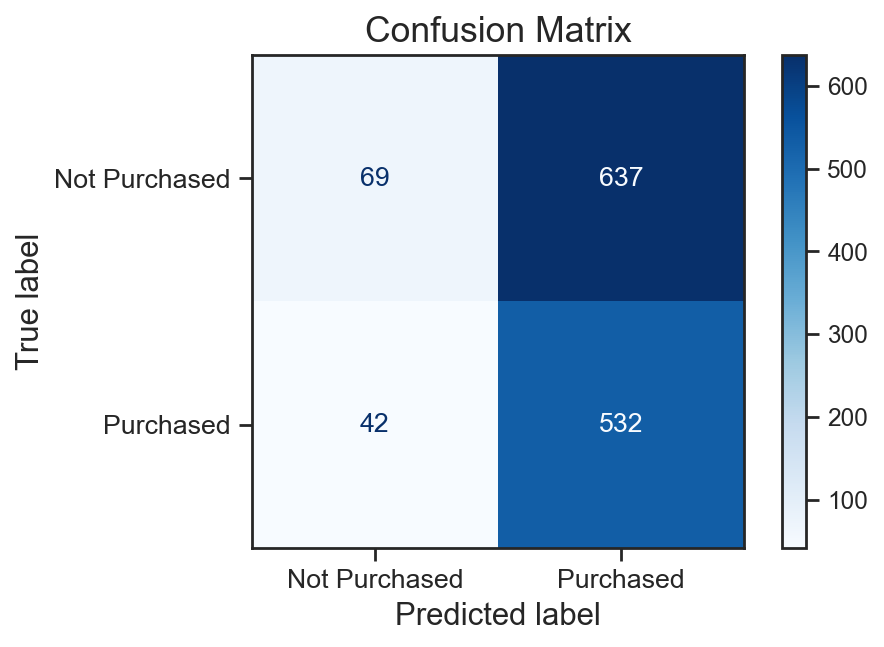

In [ ]:
# train best model
best_model_xgb_Anthelios = study.best_trial.user_attrs['model']
label_results_xgb_Anthelios = evaluate_model(best_model_xgb_Anthelios, X_test, y_test_Anthelios)
print(label_results_xgb_Anthelios)
print('\n')
# get classification report
generate_classification_report(best_model_xgb_Anthelios, X_test, y_test_Anthelios)
# Confusion Matrix
plot_confusion_matrix(best_model_xgb_Anthelios, X_test, y_test_Anthelios)


### 4.2: Brand Description_Cicaplast_Output

In [ ]:
y_train_Cicaplast=y_train['Brand Description_Cicaplast_Output']
y_valid_Cicaplast=y_valid['Brand Description_Cicaplast_Output']
y_test_Cicaplast=y_test['Brand Description_Cicaplast_Output']

In [ ]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study.optimize(lambda trial: best_XGBoost_single_label_classification(
    trial, X_train, X_valid, y_train_Anthelios, y_valid_Anthelios), n_trials=50,timeout=600)


[I 2024-10-15 10:45:05,785] A new study created in memory with name: no-name-5e61f220-2d37-46f0-b842-733fdbf0aaad
[I 2024-10-15 10:45:06,314] Trial 0 finished with value: 0.5716963448922212 and parameters: {'scale_pos_weight': 1.5488135039273248, 'learning_rate': 0.07180374727086954, 'max_depth': 13, 'lambda': 0.0008015832747965149, 'alpha': 6.499698237449666e-05, 'subsample': 0.8229470565333281, 'colsample_bytree': 0.7187936056313462, 'min_child_weight': 18}. Best is trial 0 with value: 0.5716963448922212.
[I 2024-10-15 10:45:07,117] Trial 1 finished with value: 0.5708812260536399 and parameters: {'scale_pos_weight': 1.9636627605010293, 'learning_rate': 0.038960710363751996, 'max_depth': 17, 'lambda': 0.0005755118598534656, 'alpha': 0.001295391520396607, 'subsample': 0.9627983191463305, 'colsample_bytree': 0.5355180290989434, 'min_child_weight': 2}. Best is trial 0 with value: 0.5716963448922212.
[I 2024-10-15 10:45:07,575] Trial 2 finished with value: 0.5159817351598174 and parameter

[I 2024-10-15 10:45:14,975] Trial 21 finished with value: 0.6088173547935619 and parameters: {'scale_pos_weight': 1.6527933130758363, 'learning_rate': 0.011994942365201986, 'max_depth': 3, 'lambda': 0.021114181797239024, 'alpha': 1.0746628981045512e-07, 'subsample': 0.7172086523823645, 'colsample_bytree': 0.7746108822503365, 'min_child_weight': 11}. Best is trial 21 with value: 0.6088173547935619.
[I 2024-10-15 10:45:15,269] Trial 22 finished with value: 0.6056338028169014 and parameters: {'scale_pos_weight': 1.6489759357959255, 'learning_rate': 0.012889448670698604, 'max_depth': 5, 'lambda': 4.75544735457372e-05, 'alpha': 1.3825706275759085e-07, 'subsample': 0.6141698027752298, 'colsample_bytree': 0.7647224392075352, 'min_child_weight': 9}. Best is trial 21 with value: 0.6088173547935619.
[I 2024-10-15 10:45:15,533] Trial 23 finished with value: 0.6130212143379663 and parameters: {'scale_pos_weight': 1.6806140258392726, 'learning_rate': 0.027526927729548047, 'max_depth': 4, 'lambda': 

[I 2024-10-15 10:45:22,133] Trial 42 finished with value: 0.6 and parameters: {'scale_pos_weight': 1.4389097822258579, 'learning_rate': 0.023988972442026572, 'max_depth': 4, 'lambda': 0.0018682307565278163, 'alpha': 0.0007390349688058642, 'subsample': 0.9591193699619264, 'colsample_bytree': 0.6916378472611839, 'min_child_weight': 20}. Best is trial 35 with value: 0.6132556445739257.
[I 2024-10-15 10:45:22,371] Trial 43 finished with value: 0.5885608856088561 and parameters: {'scale_pos_weight': 1.1872161177131688, 'learning_rate': 0.020444405668083462, 'max_depth': 3, 'lambda': 0.09773734377339245, 'alpha': 0.005508934247049789, 'subsample': 0.9259400183965064, 'colsample_bytree': 0.5708331884422276, 'min_child_weight': 18}. Best is trial 35 with value: 0.6132556445739257.
[I 2024-10-15 10:45:22,703] Trial 44 finished with value: 0.581981981981982 and parameters: {'scale_pos_weight': 1.3964896304149161, 'learning_rate': 0.033676296364324454, 'max_depth': 6, 'lambda': 0.0002545526014094

{'AUC': 0.5752412749259734, 'Accuracy': 0.315625, 'F1 Score': 0.41832669322709165}


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.80      0.09      0.17       943
    Purchased       0.27      0.93      0.42       337

     accuracy                           0.32      1280
    macro avg       0.54      0.51      0.29      1280
 weighted avg       0.66      0.32      0.23      1280





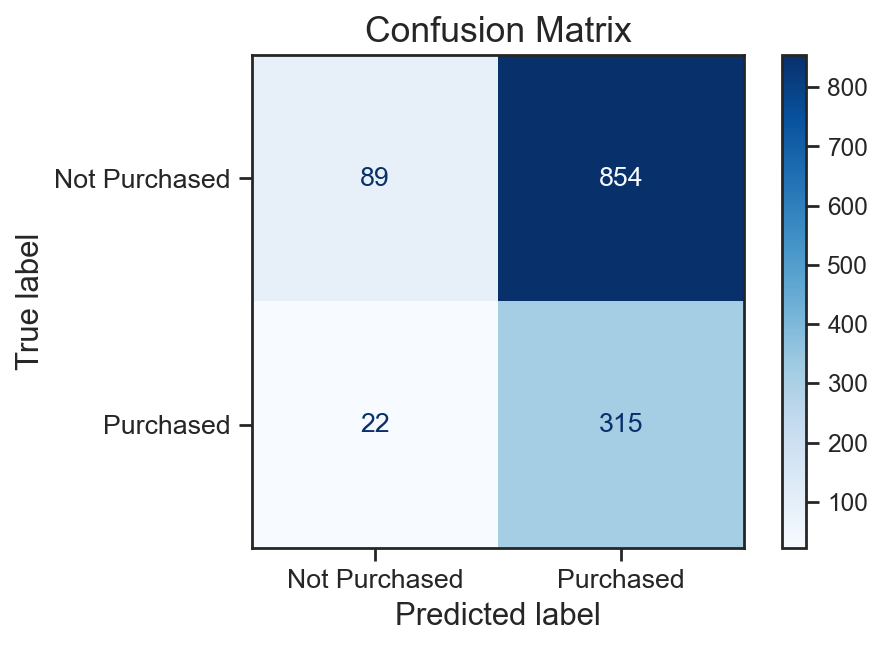

In [ ]:
# train best model
best_model_xgb_Cicaplast = study.best_trial.user_attrs['model']
label_results_xgb_Cicaplast = evaluate_model(best_model_xgb_Cicaplast, X_test, y_test_Cicaplast)
print(label_results_xgb_Cicaplast)
print('\n')
# get classification report
generate_classification_report(best_model_xgb_Cicaplast, X_test, y_test_Cicaplast)
# Confusion Matrix
plot_confusion_matrix(best_model_xgb_Cicaplast, X_test, y_test_Cicaplast)


### 4.3: Brand Description_Effaclar_Output

In [ ]:
y_train_Effaclar=y_train['Brand Description_Effaclar_Output']
y_valid_Effaclar=y_valid['Brand Description_Effaclar_Output']
y_test_Effaclar=y_test['Brand Description_Effaclar_Output']

In [ ]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study.optimize(lambda trial: best_XGBoost_single_label_classification(
    trial, X_train, X_valid, y_train_Effaclar, y_valid_Effaclar), n_trials=50,timeout=600)


[I 2024-10-15 10:45:36,638] A new study created in memory with name: no-name-ea0367a2-86af-4365-8443-0edfed2b8da8
[I 2024-10-15 10:45:37,161] Trial 0 finished with value: 0.6509635974304069 and parameters: {'scale_pos_weight': 1.5488135039273248, 'learning_rate': 0.07180374727086954, 'max_depth': 13, 'lambda': 0.0008015832747965149, 'alpha': 6.499698237449666e-05, 'subsample': 0.8229470565333281, 'colsample_bytree': 0.7187936056313462, 'min_child_weight': 18}. Best is trial 0 with value: 0.6509635974304069.
[I 2024-10-15 10:45:37,913] Trial 1 finished with value: 0.6241900647948164 and parameters: {'scale_pos_weight': 1.9636627605010293, 'learning_rate': 0.038960710363751996, 'max_depth': 17, 'lambda': 0.0005755118598534656, 'alpha': 0.001295391520396607, 'subsample': 0.9627983191463305, 'colsample_bytree': 0.5355180290989434, 'min_child_weight': 2}. Best is trial 0 with value: 0.6509635974304069.
[I 2024-10-15 10:45:38,367] Trial 2 finished with value: 0.6273525721455459 and parameter

[I 2024-10-15 10:45:46,695] Trial 21 finished with value: 0.6410788381742739 and parameters: {'scale_pos_weight': 1.6789012712217308, 'learning_rate': 0.09974621207355863, 'max_depth': 9, 'lambda': 0.06893320020178104, 'alpha': 9.41066827034391e-06, 'subsample': 0.708260625936423, 'colsample_bytree': 0.9059398059520283, 'min_child_weight': 20}. Best is trial 14 with value: 0.6552763819095477.
[I 2024-10-15 10:45:47,217] Trial 22 finished with value: 0.6514399205561072 and parameters: {'scale_pos_weight': 1.8655771120566356, 'learning_rate': 0.08997559426144036, 'max_depth': 10, 'lambda': 0.033227660248987316, 'alpha': 8.092475933730251e-08, 'subsample': 0.6495502575559603, 'colsample_bytree': 0.8083132119861564, 'min_child_weight': 18}. Best is trial 14 with value: 0.6552763819095477.
[I 2024-10-15 10:45:47,647] Trial 23 finished with value: 0.6529351184346035 and parameters: {'scale_pos_weight': 1.6870772340665596, 'learning_rate': 0.09999889475181786, 'max_depth': 7, 'lambda': 0.0018

[I 2024-10-15 10:45:53,988] Trial 42 finished with value: 0.6636528028933092 and parameters: {'scale_pos_weight': 1.9249024298251278, 'learning_rate': 0.02937732866865532, 'max_depth': 3, 'lambda': 0.4036925045628457, 'alpha': 2.674629846041915e-08, 'subsample': 0.84971760307233, 'colsample_bytree': 0.5316166707394588, 'min_child_weight': 15}. Best is trial 41 with value: 0.667853962600178.
[I 2024-10-15 10:45:54,235] Trial 43 finished with value: 0.6637010676156584 and parameters: {'scale_pos_weight': 1.940553966970754, 'learning_rate': 0.02918973522571654, 'max_depth': 3, 'lambda': 2.9007644892784548, 'alpha': 1.9309941555964924e-08, 'subsample': 0.8432488111214048, 'colsample_bytree': 0.5015854247150884, 'min_child_weight': 15}. Best is trial 41 with value: 0.667853962600178.
[I 2024-10-15 10:45:54,464] Trial 44 finished with value: 0.6612021857923497 and parameters: {'scale_pos_weight': 1.929056116981527, 'learning_rate': 0.029745852831258687, 'max_depth': 3, 'lambda': 8.5405619651

{'AUC': 0.7258651980094594, 'Accuracy': 0.60234375, 'F1 Score': 0.6276517922457937}


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.77      0.46      0.57       751
    Purchased       0.51      0.81      0.63       529

     accuracy                           0.60      1280
    macro avg       0.64      0.63      0.60      1280
 weighted avg       0.67      0.60      0.60      1280





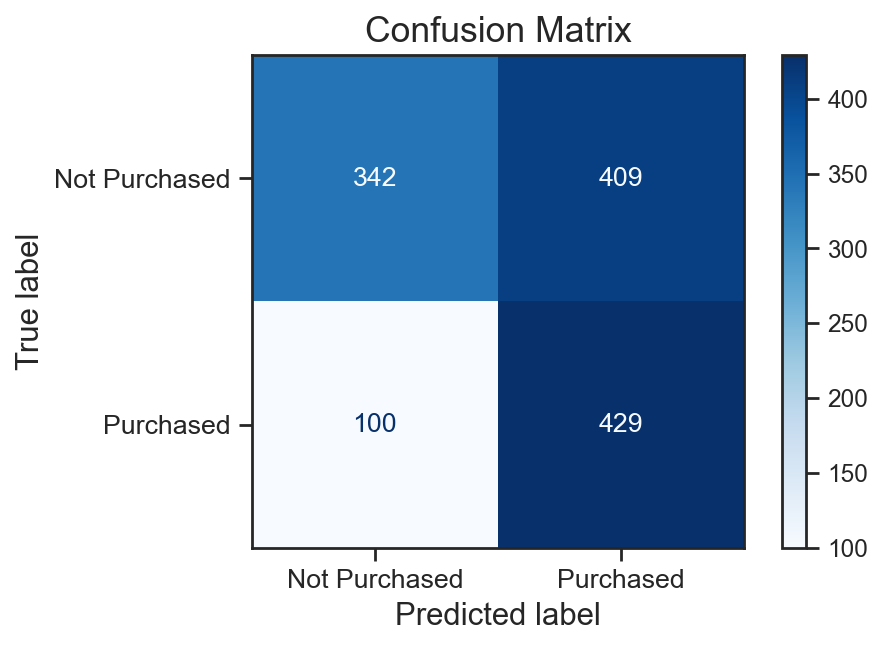

In [ ]:
# train best model
best_model_xgb_Effaclar = study.best_trial.user_attrs['model']
label_results_xgb_Effaclar = evaluate_model(best_model_xgb_Effaclar, X_test, y_test_Effaclar)
print(label_results_xgb_Effaclar)
print('\n')
# get classification report
generate_classification_report(best_model_xgb_Effaclar, X_test, y_test_Effaclar)
# Confusion Matrix
plot_confusion_matrix(best_model_xgb_Effaclar, X_test, y_test_Effaclar)


### 4.4: Brand Description_Hyalu B5_Output

In [ ]:
y_train_B5=y_train['Brand Description_Hyalu B5_Output']
y_valid_B5=y_valid['Brand Description_Hyalu B5_Output']
y_test_B5=y_test['Brand Description_Hyalu B5_Output']

In [ ]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study.optimize(lambda trial: best_XGBoost_single_label_classification(
    trial, X_train, X_valid, y_train_B5, y_valid_B5), n_trials=50,timeout=600)


[I 2024-10-15 10:46:07,543] A new study created in memory with name: no-name-fff3198a-3265-4554-9315-ff3d1cc9df20
[I 2024-10-15 10:46:08,090] Trial 0 finished with value: 0.328 and parameters: {'scale_pos_weight': 6.078032640734148, 'learning_rate': 0.07180374727086954, 'max_depth': 13, 'lambda': 0.0008015832747965149, 'alpha': 6.499698237449666e-05, 'subsample': 0.8229470565333281, 'colsample_bytree': 0.7187936056313462, 'min_child_weight': 18}. Best is trial 0 with value: 0.328.
[I 2024-10-15 10:46:08,967] Trial 1 finished with value: 0.3016759776536313 and parameters: {'scale_pos_weight': 9.916527959800733, 'learning_rate': 0.038960710363751996, 'max_depth': 17, 'lambda': 0.0005755118598534656, 'alpha': 0.001295391520396607, 'subsample': 0.9627983191463305, 'colsample_bytree': 0.5355180290989434, 'min_child_weight': 2}. Best is trial 0 with value: 0.328.
[I 2024-10-15 10:46:09,367] Trial 2 finished with value: 0.30666666666666664 and parameters: {'scale_pos_weight': 1.18707572137092

[I 2024-10-15 10:46:17,850] Trial 21 finished with value: 0.3389830508474576 and parameters: {'scale_pos_weight': 2.056629907432798, 'learning_rate': 0.08388084963087881, 'max_depth': 7, 'lambda': 3.2847495106528535, 'alpha': 3.6153344147430533e-06, 'subsample': 0.6278390455173805, 'colsample_bytree': 0.6738523335357285, 'min_child_weight': 7}. Best is trial 3 with value: 0.3645320197044335.
[I 2024-10-15 10:46:18,246] Trial 22 finished with value: 0.3333333333333333 and parameters: {'scale_pos_weight': 3.2654233624398397, 'learning_rate': 0.08981735139122063, 'max_depth': 8, 'lambda': 7.312112573850762, 'alpha': 6.061764838790365e-07, 'subsample': 0.7036407342443687, 'colsample_bytree': 0.5077410407550458, 'min_child_weight': 6}. Best is trial 3 with value: 0.3645320197044335.
[I 2024-10-15 10:46:18,470] Trial 23 finished with value: 0.3627450980392157 and parameters: {'scale_pos_weight': 1.712689433246453, 'learning_rate': 0.07914915737182017, 'max_depth': 3, 'lambda': 0.014610921791

[I 2024-10-15 10:46:24,261] Trial 42 finished with value: 0.3502824858757062 and parameters: {'scale_pos_weight': 1.4564487238026167, 'learning_rate': 0.07617011444333506, 'max_depth': 4, 'lambda': 0.0012857486049381549, 'alpha': 0.0005559250797804148, 'subsample': 0.8503061277818207, 'colsample_bytree': 0.7312775260486651, 'min_child_weight': 12}. Best is trial 41 with value: 0.38144329896907214.
[I 2024-10-15 10:46:24,472] Trial 43 finished with value: 0.32432432432432434 and parameters: {'scale_pos_weight': 2.345348811407146, 'learning_rate': 0.06952914216814463, 'max_depth': 3, 'lambda': 0.00039031221418224326, 'alpha': 9.522236569114227e-07, 'subsample': 0.723681201864417, 'colsample_bytree': 0.6883825541704401, 'min_child_weight': 1}. Best is trial 41 with value: 0.38144329896907214.
[I 2024-10-15 10:46:24,743] Trial 44 finished with value: 0.3013698630136986 and parameters: {'scale_pos_weight': 1.0590675262804987, 'learning_rate': 0.06589212162487494, 'max_depth': 5, 'lambda': 0

{'AUC': 0.7978336495888678, 'Accuracy': 0.875, 'F1 Score': 0.3548387096774194}


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.95      0.91      0.93      1178
    Purchased       0.30      0.43      0.35       102

     accuracy                           0.88      1280
    macro avg       0.63      0.67      0.64      1280
 weighted avg       0.90      0.88      0.88      1280





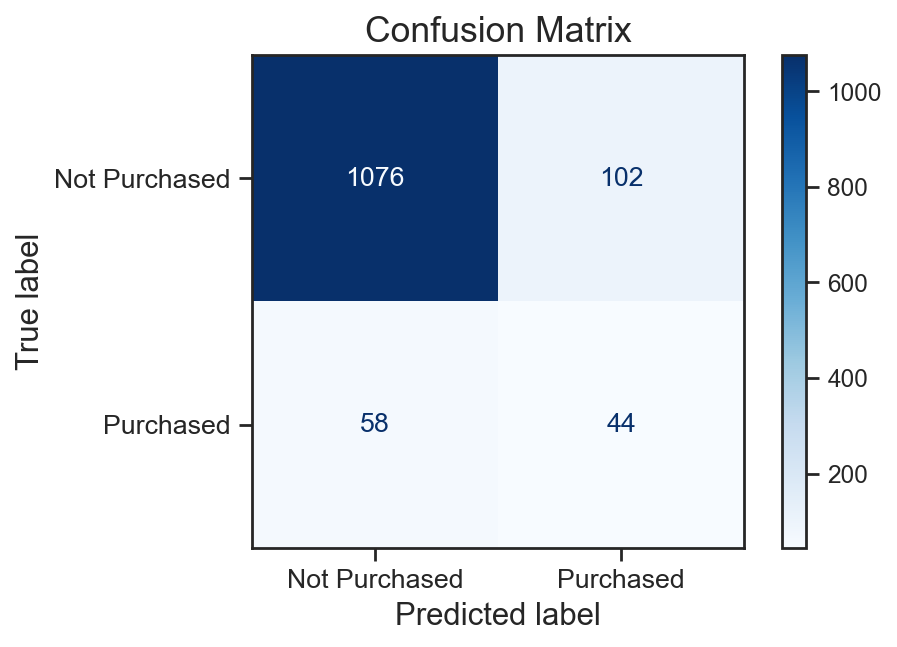

In [ ]:
# train best model
best_model_xgb_B5 = study.best_trial.user_attrs['model']
label_results_xgb_B5 = evaluate_model(best_model_xgb_B5, X_test, y_test_B5)
print(label_results_xgb_B5)
print('\n')
# get classification report
generate_classification_report(best_model_xgb_B5, X_test, y_test_B5)
# Confusion Matrix
plot_confusion_matrix(best_model_xgb_B5, X_test, y_test_B5)


### 4.5: Brand Description_Lipikar_Output

In [ ]:
y_train_Lipikar=y_train['Brand Description_Lipikar_Output']
y_valid_Lipikar=y_valid['Brand Description_Lipikar_Output']
y_test_Lipikar=y_test['Brand Description_Lipikar_Output']

In [ ]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study.optimize(lambda trial: best_XGBoost_single_label_classification(
    trial, X_train, X_valid, y_train_Lipikar, y_valid_Lipikar), n_trials=50,timeout=600)


[I 2024-10-15 10:46:47,216] A new study created in memory with name: no-name-98c333c0-a1bc-4a5f-adf0-2cc71f9ef536
[I 2024-10-15 10:46:47,759] Trial 0 finished with value: 0.445859872611465 and parameters: {'scale_pos_weight': 2.5689686173960293, 'learning_rate': 0.07180374727086954, 'max_depth': 13, 'lambda': 0.0008015832747965149, 'alpha': 6.499698237449666e-05, 'subsample': 0.8229470565333281, 'colsample_bytree': 0.7187936056313462, 'min_child_weight': 18}. Best is trial 0 with value: 0.445859872611465.
[I 2024-10-15 10:46:48,636] Trial 1 finished with value: 0.42298850574712643 and parameters: {'scale_pos_weight': 3.7549552227846745, 'learning_rate': 0.038960710363751996, 'max_depth': 17, 'lambda': 0.0005755118598534656, 'alpha': 0.001295391520396607, 'subsample': 0.9627983191463305, 'colsample_bytree': 0.5355180290989434, 'min_child_weight': 2}. Best is trial 0 with value: 0.445859872611465.
[I 2024-10-15 10:46:49,089] Trial 2 finished with value: 0.3878787878787879 and parameters:

[I 2024-10-15 10:46:57,113] Trial 21 finished with value: 0.4911660777385159 and parameters: {'scale_pos_weight': 2.762570189373754, 'learning_rate': 0.05408546865671478, 'max_depth': 5, 'lambda': 0.002913297166245891, 'alpha': 0.5626616367546656, 'subsample': 0.9559806053937511, 'colsample_bytree': 0.9405695856381346, 'min_child_weight': 20}. Best is trial 20 with value: 0.5061946902654867.
[I 2024-10-15 10:46:57,410] Trial 22 finished with value: 0.4812286689419795 and parameters: {'scale_pos_weight': 2.7993053646201753, 'learning_rate': 0.05142423299366088, 'max_depth': 5, 'lambda': 0.00017109154923569678, 'alpha': 1.4024675167138039, 'subsample': 0.9992264267111874, 'colsample_bytree': 0.9168532706758785, 'min_child_weight': 20}. Best is trial 20 with value: 0.5061946902654867.
[I 2024-10-15 10:46:57,704] Trial 23 finished with value: 0.458041958041958 and parameters: {'scale_pos_weight': 3.034467389894129, 'learning_rate': 0.06926553235751698, 'max_depth': 5, 'lambda': 0.002122595

[I 2024-10-15 10:47:05,792] Trial 42 finished with value: 0.4731977818853974 and parameters: {'scale_pos_weight': 2.793545351104603, 'learning_rate': 0.04142861740166863, 'max_depth': 14, 'lambda': 7.7986590169435015, 'alpha': 0.5364533652313488, 'subsample': 0.8419568232208159, 'colsample_bytree': 0.9112658960329904, 'min_child_weight': 20}. Best is trial 20 with value: 0.5061946902654867.
[I 2024-10-15 10:47:06,484] Trial 43 finished with value: 0.3970223325062035 and parameters: {'scale_pos_weight': 2.6476058525247197, 'learning_rate': 0.04865980811565083, 'max_depth': 12, 'lambda': 1.515610681523605, 'alpha': 0.015565382342682461, 'subsample': 0.9591502214933757, 'colsample_bytree': 0.9442800160269954, 'min_child_weight': 1}. Best is trial 20 with value: 0.5061946902654867.
[I 2024-10-15 10:47:07,063] Trial 44 finished with value: 0.4889867841409692 and parameters: {'scale_pos_weight': 2.1476295720960885, 'learning_rate': 0.03294232971333309, 'max_depth': 15, 'lambda': 0.2262618348

{'AUC': 0.671470366471044, 'Accuracy': 0.70234375, 'F1 Score': 0.4338781575037147}


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.84      0.76      0.80       989
    Purchased       0.38      0.50      0.43       291

     accuracy                           0.70      1280
    macro avg       0.61      0.63      0.62      1280
 weighted avg       0.73      0.70      0.72      1280





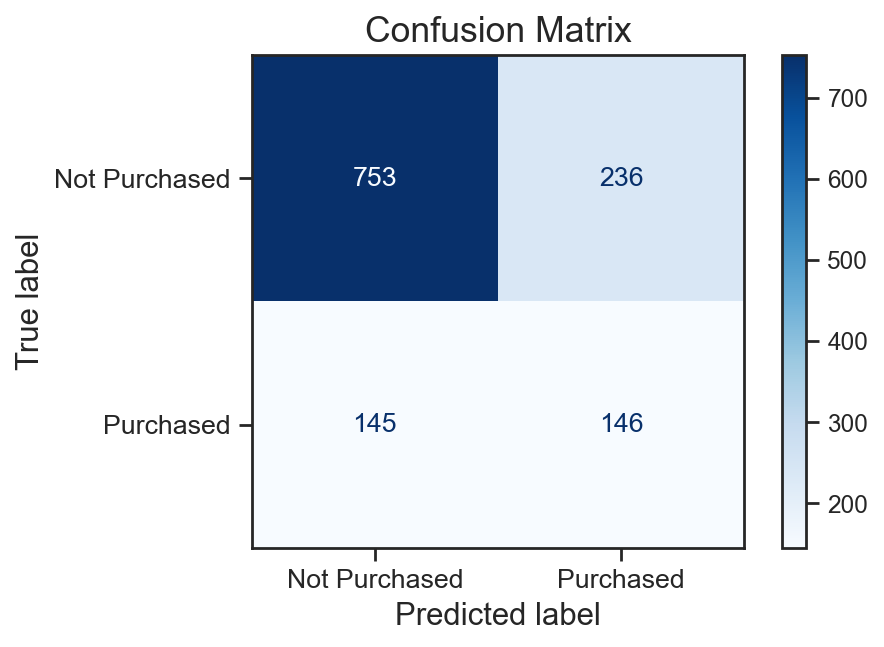

In [ ]:
# train best model
best_model_xgb_Lipikar = study.best_trial.user_attrs['model']
label_results_xgb_Lipikar = evaluate_model(best_model_xgb_Lipikar, X_test, y_test_Lipikar)
print(label_results_xgb_Lipikar)
print('\n')
# get classification report
generate_classification_report(best_model_xgb_Lipikar, X_test, y_test_Lipikar)
# Confusion Matrix
plot_confusion_matrix(best_model_xgb_Lipikar, X_test, y_test_Lipikar)


### 4.6: Brand Description_Toleriane_Output

In [ ]:
y_train_Toleriane=y_train['Brand Description_Toleriane_Output']
y_valid_Toleriane=y_valid['Brand Description_Toleriane_Output']
y_test_Toleriane=y_test['Brand Description_Toleriane_Output']

In [ ]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study.optimize(lambda trial: best_XGBoost_single_label_classification(
    trial, X_train, X_valid, y_train_Toleriane, y_valid_Toleriane), n_trials=50,timeout=600)


[I 2024-10-15 10:47:27,302] A new study created in memory with name: no-name-5b696910-60e3-4c35-9ddc-822928923961
[I 2024-10-15 10:47:27,793] Trial 0 finished with value: 0.6341463414634146 and parameters: {'scale_pos_weight': 1.5488135039273248, 'learning_rate': 0.07180374727086954, 'max_depth': 13, 'lambda': 0.0008015832747965149, 'alpha': 6.499698237449666e-05, 'subsample': 0.8229470565333281, 'colsample_bytree': 0.7187936056313462, 'min_child_weight': 18}. Best is trial 0 with value: 0.6341463414634146.
[I 2024-10-15 10:47:28,586] Trial 1 finished with value: 0.631055900621118 and parameters: {'scale_pos_weight': 1.9636627605010293, 'learning_rate': 0.038960710363751996, 'max_depth': 17, 'lambda': 0.0005755118598534656, 'alpha': 0.001295391520396607, 'subsample': 0.9627983191463305, 'colsample_bytree': 0.5355180290989434, 'min_child_weight': 2}. Best is trial 0 with value: 0.6341463414634146.
[I 2024-10-15 10:47:29,022] Trial 2 finished with value: 0.625 and parameters: {'scale_pos

[I 2024-10-15 10:47:36,590] Trial 21 finished with value: 0.6507747318235996 and parameters: {'scale_pos_weight': 1.4949613779717204, 'learning_rate': 0.027815408802073734, 'max_depth': 3, 'lambda': 1.5146035562256289e-05, 'alpha': 2.2350155342096739e-07, 'subsample': 0.7330009639402576, 'colsample_bytree': 0.8660057540839956, 'min_child_weight': 20}. Best is trial 4 with value: 0.6529126213592233.
[I 2024-10-15 10:47:36,914] Trial 22 finished with value: 0.6447831184056272 and parameters: {'scale_pos_weight': 1.4723205543236204, 'learning_rate': 0.011148706522140542, 'max_depth': 6, 'lambda': 9.422566500706604e-05, 'alpha': 2.0546764635308146e-07, 'subsample': 0.7433156388147636, 'colsample_bytree': 0.9120864883746931, 'min_child_weight': 17}. Best is trial 4 with value: 0.6529126213592233.
[I 2024-10-15 10:47:37,167] Trial 23 finished with value: 0.641318124207858 and parameters: {'scale_pos_weight': 1.3105735631018522, 'learning_rate': 0.047090093207709155, 'max_depth': 4, 'lambda':

[I 2024-10-15 10:47:43,726] Trial 42 finished with value: 0.6574712643678161 and parameters: {'scale_pos_weight': 1.918933436002821, 'learning_rate': 0.04641738708856087, 'max_depth': 5, 'lambda': 0.49637516066740456, 'alpha': 0.006538327071760318, 'subsample': 0.909638132689621, 'colsample_bytree': 0.9914597471179204, 'min_child_weight': 16}. Best is trial 42 with value: 0.6574712643678161.
[I 2024-10-15 10:47:43,953] Trial 43 finished with value: 0.6323809523809524 and parameters: {'scale_pos_weight': 1.9330560913641293, 'learning_rate': 0.011277182524388231, 'max_depth': 3, 'lambda': 0.11742993059793538, 'alpha': 0.00015138248888171615, 'subsample': 0.9662217312560251, 'colsample_bytree': 0.9547811828706224, 'min_child_weight': 17}. Best is trial 42 with value: 0.6574712643678161.
[I 2024-10-15 10:47:44,210] Trial 44 finished with value: 0.6487119437939111 and parameters: {'scale_pos_weight': 1.7221917827405302, 'learning_rate': 0.04843099597452769, 'max_depth': 4, 'lambda': 1.90658

{'AUC': 0.7803078568486124, 'Accuracy': 0.7109375, 'F1 Score': 0.6567717996289425}


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.79      0.72      0.75       777
    Purchased       0.62      0.70      0.66       503

     accuracy                           0.71      1280
    macro avg       0.70      0.71      0.70      1280
 weighted avg       0.72      0.71      0.71      1280





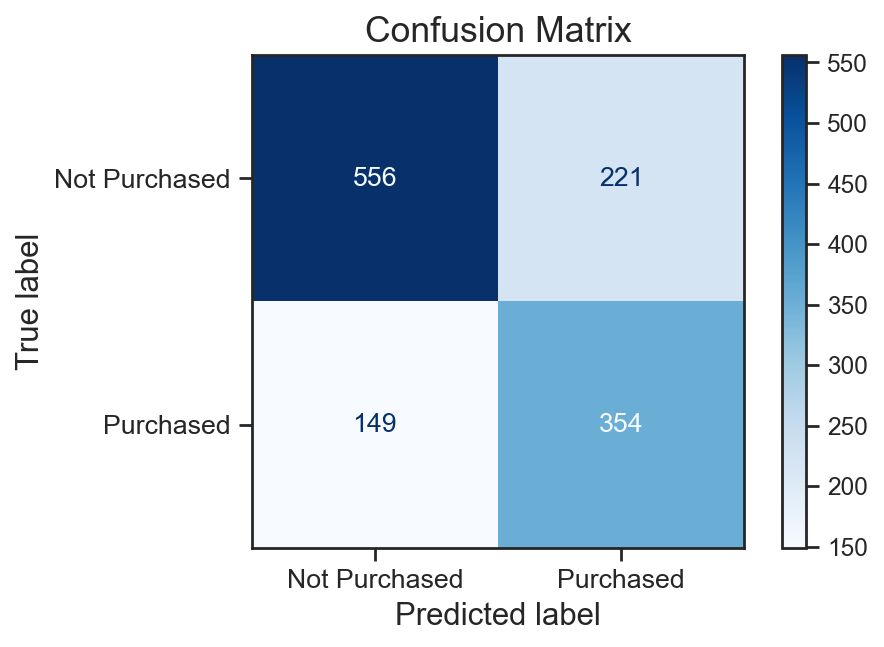

In [ ]:
# train best model
best_model_xgb_Toleriane = study.best_trial.user_attrs['model']
label_results_xgb_Toleriane = evaluate_model(best_model_xgb_Toleriane, X_test, y_test_Toleriane)
print(label_results_xgb_Toleriane)
print('\n')
# get classification report
generate_classification_report(best_model_xgb_Toleriane, X_test, y_test_Toleriane)
# Confusion Matrix
plot_confusion_matrix(best_model_xgb_Toleriane, X_test, y_test_Toleriane)


### 4.7: Brand Description_Vitamin C_Output

In [ ]:
y_train_Vitamin=y_train['Brand Description_Vitamin C_Output']
y_valid_Vitamin=y_valid['Brand Description_Vitamin C_Output']
y_test_Vitamin=y_test['Brand Description_Vitamin C_Output']

In [ ]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study.optimize(lambda trial: best_XGBoost_single_label_classification(
    trial, X_train, X_valid, y_train_Vitamin, y_valid_Vitamin), n_trials=50,timeout=600)


[I 2024-10-15 10:47:59,705] A new study created in memory with name: no-name-1bd95e74-bbd0-4be5-bc5d-055306a5d3a1
[I 2024-10-15 10:48:00,245] Trial 0 finished with value: 0.2916666666666667 and parameters: {'scale_pos_weight': 2.0806095348646547, 'learning_rate': 0.07180374727086954, 'max_depth': 13, 'lambda': 0.0008015832747965149, 'alpha': 6.499698237449666e-05, 'subsample': 0.8229470565333281, 'colsample_bytree': 0.7187936056313462, 'min_child_weight': 18}. Best is trial 0 with value: 0.2916666666666667.
[I 2024-10-15 10:48:01,183] Trial 1 finished with value: 0.2569593147751606 and parameters: {'scale_pos_weight': 2.8974445051725692, 'learning_rate': 0.038960710363751996, 'max_depth': 17, 'lambda': 0.0005755118598534656, 'alpha': 0.001295391520396607, 'subsample': 0.9627983191463305, 'colsample_bytree': 0.5355180290989434, 'min_child_weight': 2}. Best is trial 0 with value: 0.2916666666666667.
[I 2024-10-15 10:48:01,653] Trial 2 finished with value: 0.1398176291793313 and parameter

[I 2024-10-15 10:48:10,819] Trial 21 finished with value: 0.3373493975903614 and parameters: {'scale_pos_weight': 2.329918373282176, 'learning_rate': 0.027299335745434028, 'max_depth': 20, 'lambda': 0.4296033307580593, 'alpha': 0.024355186681574555, 'subsample': 0.5004851492217886, 'colsample_bytree': 0.7670614741797185, 'min_child_weight': 5}. Best is trial 17 with value: 0.38578680203045684.
[I 2024-10-15 10:48:11,724] Trial 22 finished with value: 0.327150084317032 and parameters: {'scale_pos_weight': 2.704314623739422, 'learning_rate': 0.04598918350998474, 'max_depth': 19, 'lambda': 9.20137855972642, 'alpha': 5.097487674471323e-05, 'subsample': 0.5922266419656241, 'colsample_bytree': 0.8478836114790149, 'min_child_weight': 1}. Best is trial 17 with value: 0.38578680203045684.
[I 2024-10-15 10:48:12,366] Trial 23 finished with value: 0.31499051233396586 and parameters: {'scale_pos_weight': 2.328113990108763, 'learning_rate': 0.09873704615133082, 'max_depth': 19, 'lambda': 1.71309585

[I 2024-10-15 10:48:23,795] Trial 42 finished with value: 0.3326959847036329 and parameters: {'scale_pos_weight': 1.6959448822717467, 'learning_rate': 0.022522611908928306, 'max_depth': 17, 'lambda': 1.4239635438575148e-06, 'alpha': 2.0678004599590403e-06, 'subsample': 0.9349780073705213, 'colsample_bytree': 0.6099182718234172, 'min_child_weight': 16}. Best is trial 37 with value: 0.3956723338485317.
[I 2024-10-15 10:48:24,398] Trial 43 finished with value: 0.3979328165374677 and parameters: {'scale_pos_weight': 2.055582102394487, 'learning_rate': 0.014859820347430268, 'max_depth': 20, 'lambda': 4.11193401539432e-06, 'alpha': 9.480839320619224e-07, 'subsample': 0.9765585992332778, 'colsample_bytree': 0.5567517443335808, 'min_child_weight': 18}. Best is trial 43 with value: 0.3979328165374677.
[I 2024-10-15 10:48:25,044] Trial 44 finished with value: 0.34657039711191334 and parameters: {'scale_pos_weight': 2.0499803018025355, 'learning_rate': 0.03441082592147604, 'max_depth': 20, 'lambd

{'AUC': 0.5734742387677862, 'Accuracy': 0.5265625, 'F1 Score': 0.3816326530612245}


Classification Report:
               precision    recall  f1-score   support

Not Purchased       0.79      0.50      0.62       966
    Purchased       0.28      0.60      0.38       314

     accuracy                           0.53      1280
    macro avg       0.54      0.55      0.50      1280
 weighted avg       0.67      0.53      0.56      1280





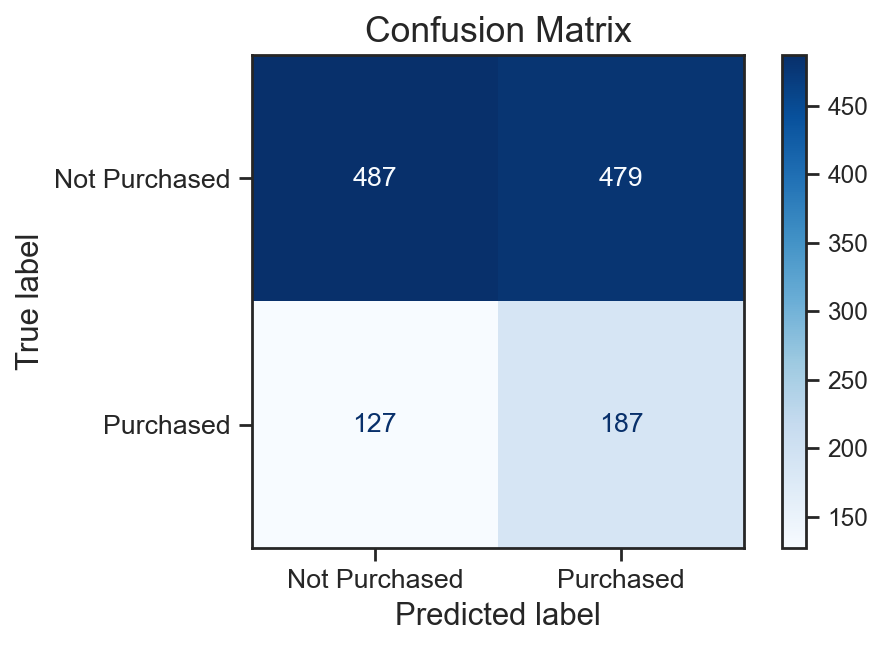

In [ ]:
# train best model
best_model_xgb_Vitamin = study.best_trial.user_attrs['model']
label_results_xgb_Vitamin = evaluate_model(best_model_xgb_Vitamin, X_test, y_test_Vitamin)
print(label_results_xgb_Vitamin)
print('\n')
# get classification report
generate_classification_report(best_model_xgb_Vitamin, X_test, y_test_Vitamin)
# Confusion Matrix
plot_confusion_matrix(best_model_xgb_Vitamin, X_test, y_test_Vitamin)


# 2: MultiOutputClassifier

## 1: KNN Model

In [ ]:
loreal_all_knn = pd.concat([loreal, loreal_classifi.iloc[:,-7:]], axis=1)

In [ ]:
x_all_knn = loreal_all_knn.iloc[:, 0:-7]
y_all_knn = loreal_all_knn.iloc[:, -7:]

x_all_train_knn, x_all_test_knn, y_all_train_knn, y_all_test_knn = train_test_split(x_all_knn, y_all_knn, test_size=0.2, random_state=0)
print(x_all_train_knn.shape)
print(x_all_test_knn.shape)

(5120, 90)
(1280, 90)


In [ ]:
from sklearn.metrics import make_scorer, f1_score
f1_micro_scorer = make_scorer(f1_score, average='micro')

In [ ]:
param_grid = {
    'estimator__n_neighbors': [i for i in range(2,20)]  # Search for different numbers of neighbors
}

In [ ]:
knn = KNeighborsClassifier()

# MultiOutputClassifier to apply KNN to each label independently
multi_knn = MultiOutputClassifier(knn)


In [ ]:
# GridSearchCV for hyperparameter search and optimize f1_score
grid_search = GridSearchCV(multi_knn, param_grid, cv=5, scoring=f1_micro_scorer, verbose=1, n_jobs=-1)


In [ ]:
# Find the best parameters
grid_search.fit(x_all_train_knn, y_all_train_knn)


Fitting 5 folds for each of 18 candidates, totalling 90 fits


GridSearchCV(cv=5,
             estimator=MultiOutputClassifier(estimator=KNeighborsClassifier()),
             n_jobs=-1,
             param_grid={'estimator__n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9, 10,
                                                    11, 12, 13, 14, 15, 16, 17,
                                                    18, 19]},
             scoring=make_scorer(f1_score, response_method='predict', average=micro),
             verbose=1)

In [ ]:
grid_search.best_estimator_

MultiOutputClassifier(estimator=KNeighborsClassifier(n_neighbors=3))

In [ ]:
# Output the best n_neighbors
print(f"Best n_neighbors: {grid_search.best_params_['estimator__n_neighbors']}")
print(f"Best score: {grid_search.best_score_}")

Best n_neighbors: 3
Best score: 0.3383551123328489


In [ ]:
best_knn = grid_search.best_estimator_

y_pred_knn = best_knn.predict(x_all_test_knn)

In [ ]:
# Evaluate the model using classification report
print(classification_report(y_all_test_knn, y_pred_knn, target_names=y_all_knn.columns))


                                    precision    recall  f1-score   support

Brand Description_Anthelios_Output       0.48      0.42      0.45       574
Brand Description_Cicaplast_Output       0.37      0.20      0.26       337
 Brand Description_Effaclar_Output       0.46      0.39      0.42       529
 Brand Description_Hyalu B5_Output       0.22      0.09      0.13       102
  Brand Description_Lipikar_Output       0.34      0.17      0.23       291
Brand Description_Toleriane_Output       0.46      0.40      0.43       503
Brand Description_Vitamin C_Output       0.28      0.18      0.22       314

                         micro avg       0.42      0.31      0.36      2650
                         macro avg       0.37      0.26      0.31      2650
                      weighted avg       0.41      0.31      0.35      2650
                       samples avg       0.33      0.26      0.26      2650



Brand Description_Anthelios_Output Classification Report:
              precision    recall  f1-score   support

           0       0.57      0.62      0.60       706
           1       0.48      0.42      0.45       574

    accuracy                           0.53      1280
   macro avg       0.52      0.52      0.52      1280
weighted avg       0.53      0.53      0.53      1280

Confusion Matrix for Brand Description_Anthelios_Output:


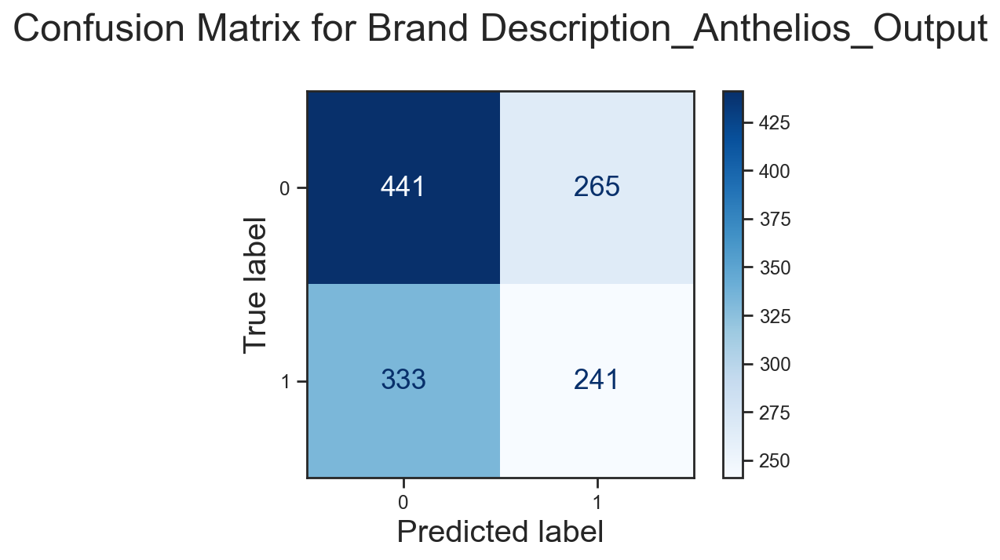



Brand Description_Cicaplast_Output Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.87      0.81       943
           1       0.37      0.20      0.26       337

    accuracy                           0.70      1280
   macro avg       0.56      0.54      0.54      1280
weighted avg       0.65      0.70      0.67      1280

Confusion Matrix for Brand Description_Cicaplast_Output:


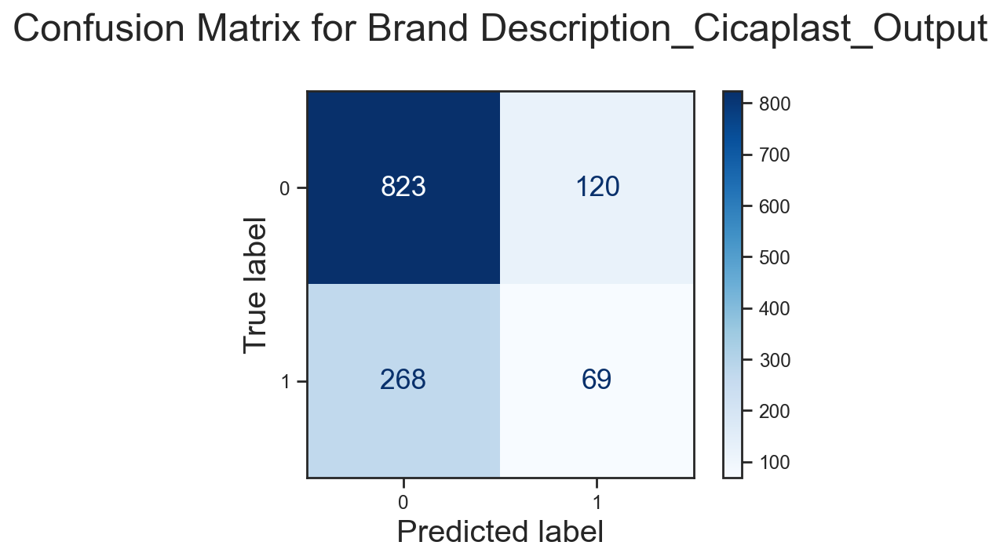



Brand Description_Effaclar_Output Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.68      0.64       751
           1       0.46      0.39      0.42       529

    accuracy                           0.56      1280
   macro avg       0.54      0.54      0.53      1280
weighted avg       0.55      0.56      0.55      1280

Confusion Matrix for Brand Description_Effaclar_Output:


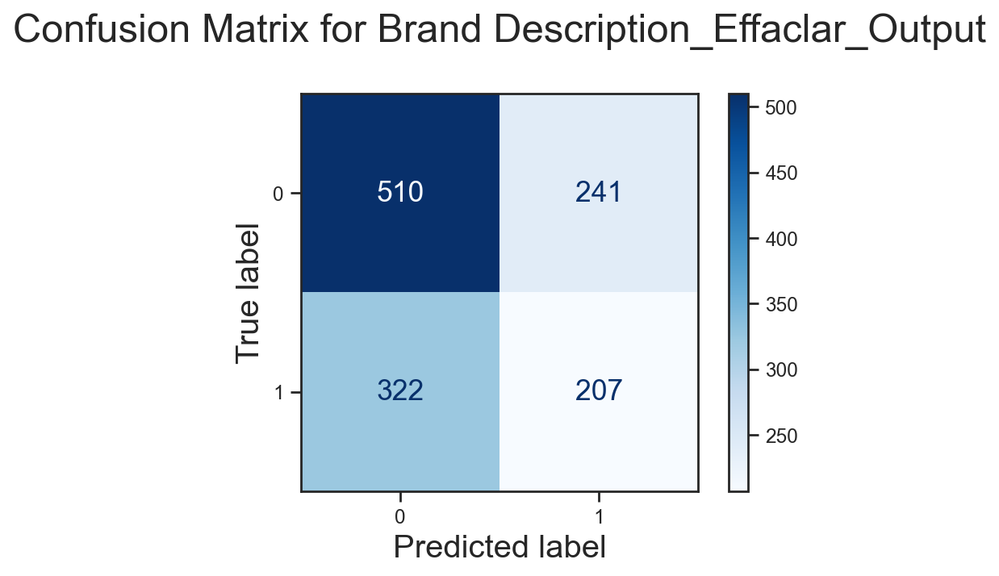



Brand Description_Hyalu B5_Output Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.95      1178
           1       0.22      0.09      0.13       102

    accuracy                           0.90      1280
   macro avg       0.57      0.53      0.54      1280
weighted avg       0.87      0.90      0.88      1280

Confusion Matrix for Brand Description_Hyalu B5_Output:


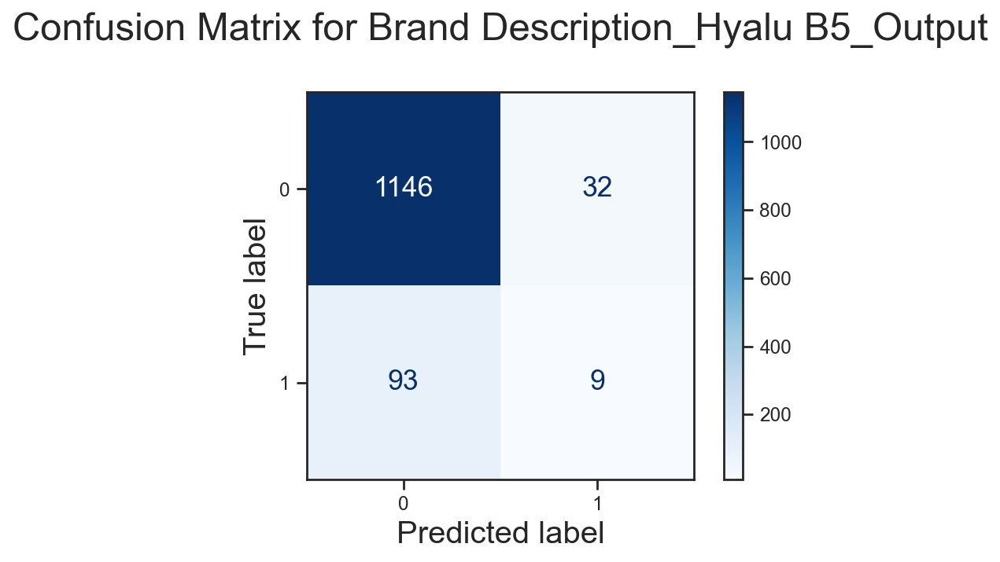



Brand Description_Lipikar_Output Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.90      0.84       989
           1       0.34      0.17      0.23       291

    accuracy                           0.74      1280
   macro avg       0.56      0.54      0.54      1280
weighted avg       0.69      0.74      0.70      1280

Confusion Matrix for Brand Description_Lipikar_Output:


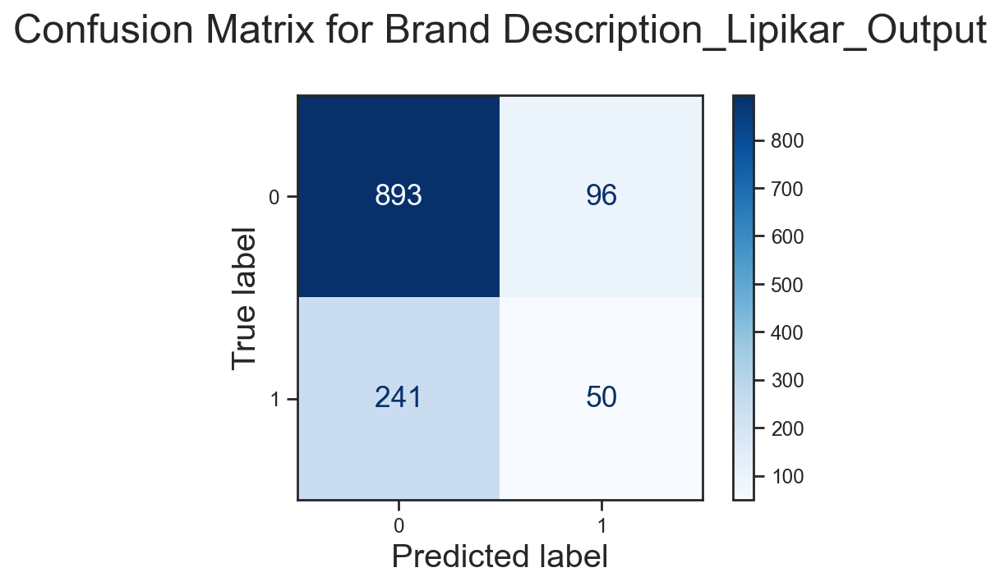



Brand Description_Toleriane_Output Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.70      0.67       777
           1       0.46      0.40      0.43       503

    accuracy                           0.58      1280
   macro avg       0.55      0.55      0.55      1280
weighted avg       0.57      0.58      0.58      1280

Confusion Matrix for Brand Description_Toleriane_Output:


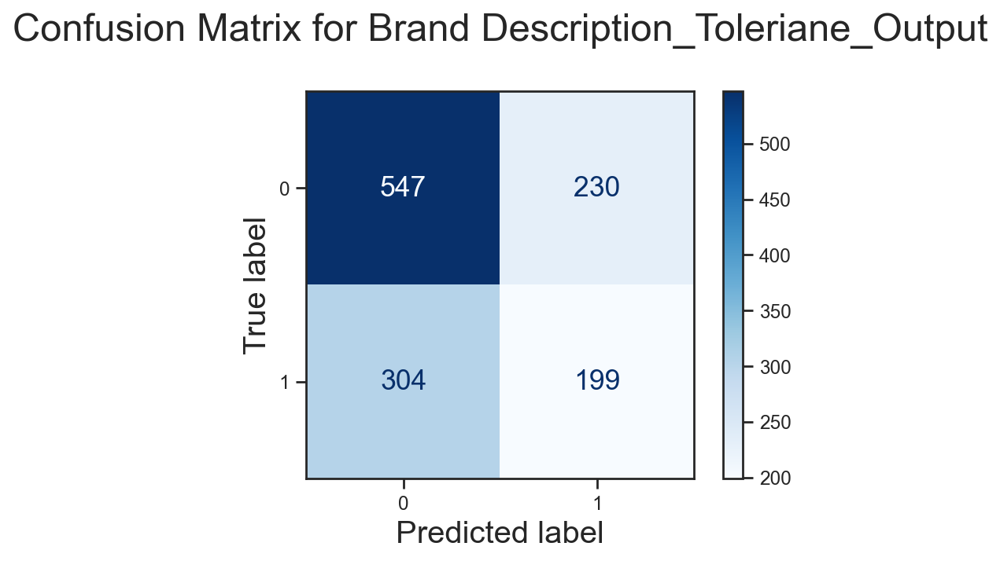



Brand Description_Vitamin C_Output Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.85      0.80       966
           1       0.28      0.18      0.22       314

    accuracy                           0.69      1280
   macro avg       0.52      0.52      0.51      1280
weighted avg       0.64      0.69      0.66      1280

Confusion Matrix for Brand Description_Vitamin C_Output:


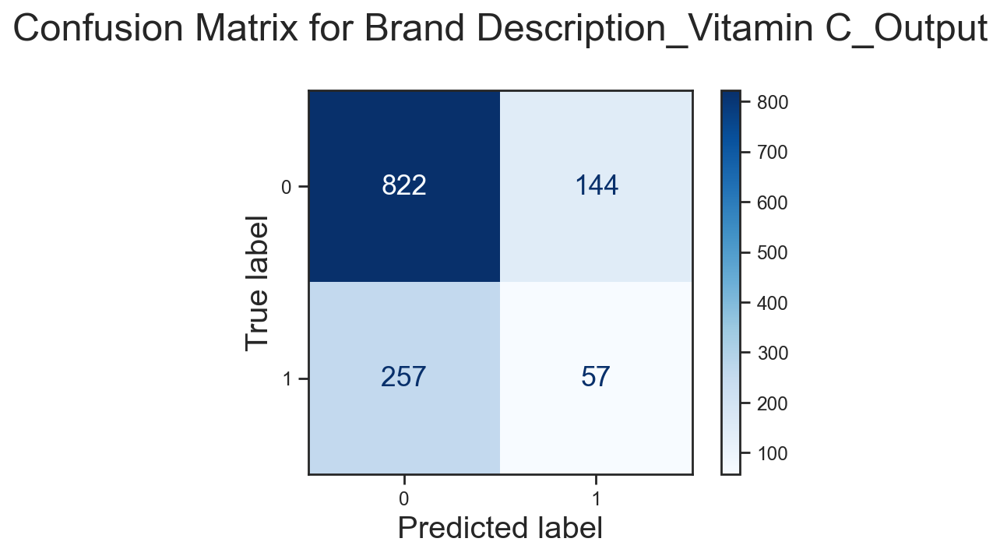

In [ ]:
# Print the classification report and confusion matrix for each label

for i, label in enumerate(y_all_knn.columns):

    print(f"{y_all_test_knn.columns[i]} Classification Report:")
    print(classification_report(y_all_test_knn.iloc[:, i], y_pred_knn[:, i]))

    print(f"Confusion Matrix for {label}:")


    conf_matrix = confusion_matrix(y_all_test_knn.iloc[:, i], y_pred_knn[:, i])

    disp = ConfusionMatrixDisplay(conf_matrix)
    fig, ax = plt.subplots(figsize=(6, 4))
    disp.plot(cmap=plt.cm.Blues, ax=ax, values_format='d')

    plt.title(f"Confusion Matrix for {label}\n", fontsize=22)
    plt.xlabel('Predicted label', fontsize=18)
    plt.ylabel('True label', fontsize=18)

    for text in disp.text_.ravel():
        text.set_fontsize(16)

    plt.show()

    print("\n")

## 2: Neural Network Model

In [ ]:
loreal_all = pd.concat([loreal, loreal_classifi.iloc[:,-7:]], axis=1)
loreal_all

,Transaction_Count_AllTime,Brand_Description_Cicaplast,Brand_Description_Effaclar,Brand_Description_Hyalu_B5,Brand_Description_Toleriane,Class_Description_Anti_Acne,Class_Description_Anti_Ageing,Class_Description_Face_Care,Sub_Category_Face_Cleanser,Sub_Category_Face_Moisturiser,...,Total_Spent_6M_to_9M,Total_Spent_3M_to_6M,Total_Spent_1M_to_3M,Brand Description_Anthelios_Output,Brand Description_Cicaplast_Output,Brand Description_Effaclar_Output,Brand Description_Hyalu B5_Output,Brand Description_Lipikar_Output,Brand Description_Toleriane_Output,Brand Description_Vitamin C_Output
0,0.0,0.0,1.0,0.0,3.0,1.0,0.0,4.0,2.0,2.0,...,0.0,0.00,0.00,0,0,1,0,1,1,1
1,0.0,0.0,4.0,0.0,0.0,3.0,0.0,2.0,1.0,1.0,...,0.0,189.36,0.00,0,1,1,1,1,1,1
2,0.0,1.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,...,0.0,161.59,0.00,1,0,1,0,0,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00,0.00,1,1,0,0,1,0,0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,...,0.0,0.00,0.00,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6395,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,2.0,0.0,...,0.0,0.00,133.85,0,0,0,0,0,0,0
6396,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.00,0.00,0,0,1,0,0,0,0
6397,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.00,180.67,0,0,1,0,0,0,0
6398,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,2.0,...,0.0,0.00,0.00,0,1,0,0,0,1,0


In [ ]:
x_all = loreal_all.iloc[:, 0:-7]
y_all = loreal_all.iloc[:, -7:]

x_all_train, x_all_test, y_all_train, y_all_test = train_test_split(x_all, y_all, test_size=0.2, random_state=0)
print(x_all_train.shape)
print(x_all_test.shape)

(5120, 90)
(1280, 90)


In [ ]:
# 定义 F1 分数的计算函数，仅针对 group 1
def f1_score_group1(y_true, y_pred):
    y_pred = tf.round(y_pred)  # 将预测结果四舍五入为 0 或 1
    tp = tf.reduce_sum(tf.cast(y_true * y_pred, 'float32'), axis=0)
    fp = tf.reduce_sum(tf.cast((1 - y_true) * y_pred, 'float32'), axis=0)
    fn = tf.reduce_sum(tf.cast(y_true * (1 - y_pred), 'float32'), axis=0)

    precision = tp / (tp + fp + tf.keras.backend.epsilon())
    recall = tp / (tp + fn + tf.keras.backend.epsilon())

    f1 = 2 * (precision * recall) / (precision + recall + tf.keras.backend.epsilon())
    return tf.reduce_mean(f1)  # 返回 group 1 的 F1 score 的平均值



In [ ]:
# Define weighted binary cross entropy loss function
def weighted_binary_crossentropy(class_weights):
    def loss_fn(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        total_loss = 0

        # Apply weights separately for each label
        for i in range(len(class_weights)):  # Process each label separately
            class_weight_tensor = tf.constant(class_weights[i], dtype=tf.float32)

            # Calculate the binary crossover loss for this label
            bce = tf.keras.losses.binary_crossentropy(y_true[:, i], y_pred[:, i])

            # Apply weights to this label
            weight_map = y_true[:, i] * class_weight_tensor[1] + (1 - y_true[:, i]) * class_weight_tensor[0]

            # Get weighted loss
            weighted_loss = bce * weight_map
            total_loss += tf.reduce_mean(weighted_loss)

        return total_loss

    return loss_fn

In [ ]:
# Class weight adjustment function
def adjust_class_weights(class_weights, factor):
    adjusted_class_weights = []
    for weight in class_weights:
        adjusted_class_weights.append([weight[0], weight[1] * factor])  # Adjust the weight of category 1
    return np.array(adjusted_class_weights)


In [ ]:
def best_multi_neural_network(hp):

    model = tf.keras.Sequential()
    n_features = x_all_train.shape[1]
    n_outputs = y_all_train.shape[1]

    # Define L2 regularization hyperparameters
    l2_lambda = hp.Float('l2_lambda', min_value=1e-5, max_value=1e-2, sampling='LOG')


    # First layer: L2 regularization
    model.add(tf.keras.layers.Dense(units=hp.Int('units_1', min_value=64, max_value=256, step=32),
                                    input_dim=n_features, activation='relu',
                                    kernel_initializer='he_normal',
                                    kernel_regularizer=regularizers.l2(l2_lambda)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(rate=hp.Float('dropout_1', min_value=0.0, max_value=0.3, step=0.1)))

    # Optional hidden layers
    for i in range(hp.Int('num_layers', 1, 3)):
        model.add(tf.keras.layers.Dense(units=hp.Int(f'units_{i+2}', min_value=64, max_value=256, step=32),
                                        activation='relu',
                                        kernel_initializer='he_normal',
                                        kernel_regularizer=regularizers.l2(l2_lambda)))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Dropout(rate=hp.Float(f'dropout_{i+2}', min_value=0.0, max_value=0.3, step=0.1)))

    # Multi-label classification
    model.add(tf.keras.layers.Dense(n_outputs, activation='sigmoid'))

    # Set the search range for learning rate
    learning_rate = hp.Choice('learning_rate', values=[1e-4, 1e-3, 1e-2])


    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  loss=weighted_binary_crossentropy(class_weights_adjusted),
                  metrics=['accuracy', tf.keras.metrics.AUC(name='auc'), f1_score_group1])

    return model

### 2.1: Define Class Weights

In [ ]:
# Calculate the weight of each category

class_weights = []
for i in range(y_all_train.shape[1]):
    class_weights.append(compute_class_weight('balanced', classes=np.unique(y_all_train.iloc[:, i]),
                                              y=y_all_train.iloc[:, i]))


# Adjust the weight of category 1 by doubling its weight
class_weights_adjusted = adjust_class_weights(class_weights, factor=1)


In [ ]:
class_weights_adjusted

array([[0.88704089, 1.14592659],
       [0.66321244, 2.03174603],
       [0.85475793, 1.20470588],
       [0.54900279, 5.60175055],
       [0.63366337, 2.37037037],
       [0.81867605, 1.28449574],
       [0.66424494, 2.0221169 ]])

### 2.2: Hyperparameter Tunering

In [ ]:
tf.keras.utils.set_random_seed(0)


# Define RandomSearch hyperparameter tuner
tuner = kt.RandomSearch(
    best_multi_neural_network,
    objective=kt.Objective("val_f1_score_group1", direction="max"),
    max_trials=20,  # The number of attempts for different hyperparameter combinations
    executions_per_trial=3,  # Number of times to construct and fit the model for each combinations
    directory='my_dir_multi_nn',
    project_name='tuning_nn_with_class_weights'
)




# Define early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_score_group1', patience=20, restore_best_weights=True)



In [ ]:
# Perform hyperparameter search and train the model
tuner.search(
    x_all_train, y_all_train,
    epochs=50,
    batch_size=tuner.oracle.hyperparameters.Choice('batch_size', [8, 16, 32, 64]),
    validation_split=0.2,
    shuffle=True,
    callbacks=[early_stopping],
    verbose=2
)

Oracle triggered exit


Trial 20 Complete [00h 01m 13s]
val_f1_score_group1: 0.2032290150721868

Best val_f1_score_group1 So Far: 0.3166902959346771
Total elapsed time: 00h 21m 28s


In [ ]:
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

In [ ]:
print(f"Best units for input layer: {best_hps.get('units_1')}")
print(f"Best dropout rate for input layer: {best_hps.get('dropout_1')}")

print(f"Best number of hidden layers: {best_hps.get('num_layers')}")

if best_hps.get('num_layers') >= 1:
    print(f"Best units for first layer: {best_hps.get('units_2')}")
    print(f"Best dropout rate for first layer: {best_hps.get('dropout_2')}")

if best_hps.get('num_layers') >= 2:
    print(f"Best units for second layer: {best_hps.get('units_3')}")
    print(f"Best dropout rate for second layer: {best_hps.get('dropout_3')}")

if best_hps.get('num_layers') >= 3:
    print(f"Best units for third layer: {best_hps.get('units_4')}")
    print(f"Best dropout rate for third layer: {best_hps.get('dropout_4')}")

print(f"Best batch_size: {best_hps.get('batch_size')}")
print(f"Best learning_rate: {best_hps.get('learning_rate')}")
print(f"Best L2 regularization lambda: {best_hps.get('l2_lambda')}")


Best units for input layer: 192
Best dropout rate for input layer: 0.2
Best number of hidden layers: 2
Best units for first layer: 256
Best dropout rate for first layer: 0.2
Best units for second layer: 224
Best dropout rate for second layer: 0.2
Best batch_size: 32
Best learning_rate: 0.0001
Best L2 regularization lambda: 2.6246640749948365e-05


In [ ]:
best_hps_dict = {
    "units_1": best_hps.get("units_1"),
    "dropout_1": best_hps.get("dropout_1"),
    "units_2": best_hps.get("units_2"),
    "dropout_2": best_hps.get("dropout_2"),
    "units_3": best_hps.get("units_3"),
    "dropout_3": best_hps.get("dropout_3"),
    "num_layers": best_hps.get("num_layers"),
    "learning_rate": best_hps.get("learning_rate"),
    "batch_size": best_hps.get("batch_size")
}


with open("best_hyperparameters_neural_network.json", "w") as f:
    json.dump(best_hps_dict, f)



## 2.3: Model Building

In [ ]:
tf.keras.utils.set_random_seed(0)

# Define the final neural network model
model_all = tf.keras.Sequential()
n_features = x_all_train.shape[1]
n_outputs = y_all_train.shape[1]  # Number of labels (multi-label classification)


best_units_1 = 192
best_dropout_1 = 0.2
best_units_2 = 256
best_dropout_2 = 0.2
best_units_3 = 224
best_dropout_3 = 0.2


best_learning_rate = 0.0001
best_l2_lambda = 2.6246640749948365e-05


# Input layer with best hyperparameters
model_all.add(tf.keras.layers.Dense(best_units_1, input_dim=n_features, activation='relu',
                                    kernel_regularizer=tf.keras.regularizers.l2(best_l2_lambda)))
model_all.add(tf.keras.layers.BatchNormalization())
model_all.add(tf.keras.layers.Dropout(best_dropout_1))


# First hidden layer with best hyperparameters
model_all.add(tf.keras.layers.Dense(best_units_2, activation='relu',
                                    kernel_regularizer=tf.keras.regularizers.l2(best_l2_lambda)))
model_all.add(tf.keras.layers.BatchNormalization())
model_all.add(tf.keras.layers.Dropout(best_dropout_2))


# Second hidden layer with best hyperparameters
model_all.add(tf.keras.layers.Dense(best_units_3, activation='relu',
                                    kernel_regularizer=tf.keras.regularizers.l2(best_l2_lambda)))
model_all.add(tf.keras.layers.BatchNormalization())
model_all.add(tf.keras.layers.Dropout(best_dropout_3))





# Output layer for multi-label classification
model_all.add(tf.keras.layers.Dense(n_outputs, activation='sigmoid'))  # Independent binary predictions for each label

# Compile the model with best learning rate
model_all.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=best_learning_rate),
                  loss=weighted_binary_crossentropy(class_weights_adjusted),  # Custom loss function
                  metrics=['accuracy', tf.keras.metrics.AUC(name='auc'), f1_score])


history = model_all.fit(x_all_train, y_all_train, epochs=100, batch_size=32,
                        verbose=1, validation_split=0.2)


Epoch 1/100
128/128 [==============================] - 1s 4ms/step - loss: 6.0114 - accuracy: 0.1597 - auc: 0.5231 - f1_score: 0.3551 - val_loss: 5.2168 - val_accuracy: 0.2051 - val_auc: 0.5956 - val_f1_score: 0.4200
Epoch 2/100
128/128 [==============================] - 0s 2ms/step - loss: 5.5996 - accuracy: 0.1636 - auc: 0.5389 - f1_score: 0.3562 - val_loss: 4.9542 - val_accuracy: 0.2109 - val_auc: 0.6091 - val_f1_score: 0.4034
Epoch 3/100
128/128 [==============================] - 0s 2ms/step - loss: 5.2960 - accuracy: 0.1709 - auc: 0.5585 - f1_score: 0.3612 - val_loss: 4.7747 - val_accuracy: 0.2197 - val_auc: 0.6176 - val_f1_score: 0.3817
Epoch 4/100
128/128 [==============================] - 0s 2ms/step - loss: 5.1230 - accuracy: 0.1865 - auc: 0.5624 - f1_score: 0.3499 - val_loss: 4.6105 - val_accuracy: 0.2471 - val_auc: 0.6269 - val_f1_score: 0.3601
Epoch 5/100
128/128 [==============================] - 0s 3ms/step - loss: 4.9904 - accuracy: 0.1892 - auc: 0.5711 - f1_score: 0.342

Epoch 39/100
128/128 [==============================] - 0s 2ms/step - loss: 4.0141 - accuracy: 0.3171 - auc: 0.6904 - f1_score: 0.2684 - val_loss: 3.8603 - val_accuracy: 0.3623 - val_auc: 0.7141 - val_f1_score: 0.2268
Epoch 40/100
128/128 [==============================] - 0s 2ms/step - loss: 3.9946 - accuracy: 0.3196 - auc: 0.6904 - f1_score: 0.2701 - val_loss: 3.8731 - val_accuracy: 0.3408 - val_auc: 0.7116 - val_f1_score: 0.2280
Epoch 41/100
128/128 [==============================] - 0s 2ms/step - loss: 3.9754 - accuracy: 0.3081 - auc: 0.6954 - f1_score: 0.2693 - val_loss: 3.8565 - val_accuracy: 0.3740 - val_auc: 0.7135 - val_f1_score: 0.2284
Epoch 42/100
128/128 [==============================] - 0s 3ms/step - loss: 3.9794 - accuracy: 0.3096 - auc: 0.6922 - f1_score: 0.2737 - val_loss: 3.8473 - val_accuracy: 0.3789 - val_auc: 0.7169 - val_f1_score: 0.2311
Epoch 43/100
128/128 [==============================] - 0s 2ms/step - loss: 3.9321 - accuracy: 0.3057 - auc: 0.7011 - f1_score: 

128/128 [==============================] - 0s 2ms/step - loss: 3.8072 - accuracy: 0.3367 - auc: 0.7220 - f1_score: 0.2863 - val_loss: 3.8247 - val_accuracy: 0.3564 - val_auc: 0.7207 - val_f1_score: 0.2456
Epoch 77/100
128/128 [==============================] - 0s 3ms/step - loss: 3.7933 - accuracy: 0.3333 - auc: 0.7223 - f1_score: 0.2851 - val_loss: 3.8217 - val_accuracy: 0.3633 - val_auc: 0.7208 - val_f1_score: 0.2511
Epoch 78/100
128/128 [==============================] - 0s 2ms/step - loss: 3.8170 - accuracy: 0.3440 - auc: 0.7216 - f1_score: 0.2798 - val_loss: 3.8130 - val_accuracy: 0.3799 - val_auc: 0.7227 - val_f1_score: 0.2376
Epoch 79/100
128/128 [==============================] - 0s 2ms/step - loss: 3.8034 - accuracy: 0.3376 - auc: 0.7210 - f1_score: 0.2759 - val_loss: 3.8205 - val_accuracy: 0.3691 - val_auc: 0.7209 - val_f1_score: 0.2384
Epoch 80/100
128/128 [==============================] - 0s 2ms/step - loss: 3.8055 - accuracy: 0.3362 - auc: 0.7200 - f1_score: 0.2755 - val_

In [ ]:
model_all.evaluate(x_all_test, y_all_test)

40/40 [==============================] - 0s 859us/step - loss: 3.8500 - accuracy: 0.3359 - auc: 0.7181 - f1_score: 0.2395


[3.8499953746795654, 0.3359375, 0.7180835008621216, 0.23951831459999084]

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


y_pred_all = model_all.predict(x_all_test)


y_pred_all_binary = (y_pred_all > 0.5).astype(int)


40/40 [==============================] - 0s 651us/step


Brand Description_Anthelios_Output Classification Report:
              precision    recall  f1-score   support

           0       0.57      0.86      0.68       706
           1       0.53      0.20      0.29       574

    accuracy                           0.56      1280
   macro avg       0.55      0.53      0.49      1280
weighted avg       0.55      0.56      0.51      1280



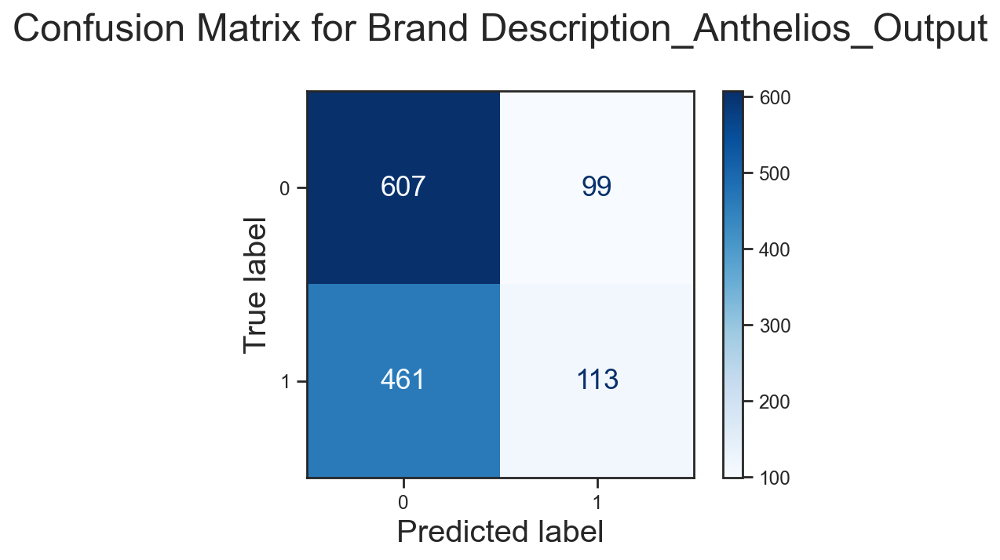

40/40 [==============================] - 0s 684us/step


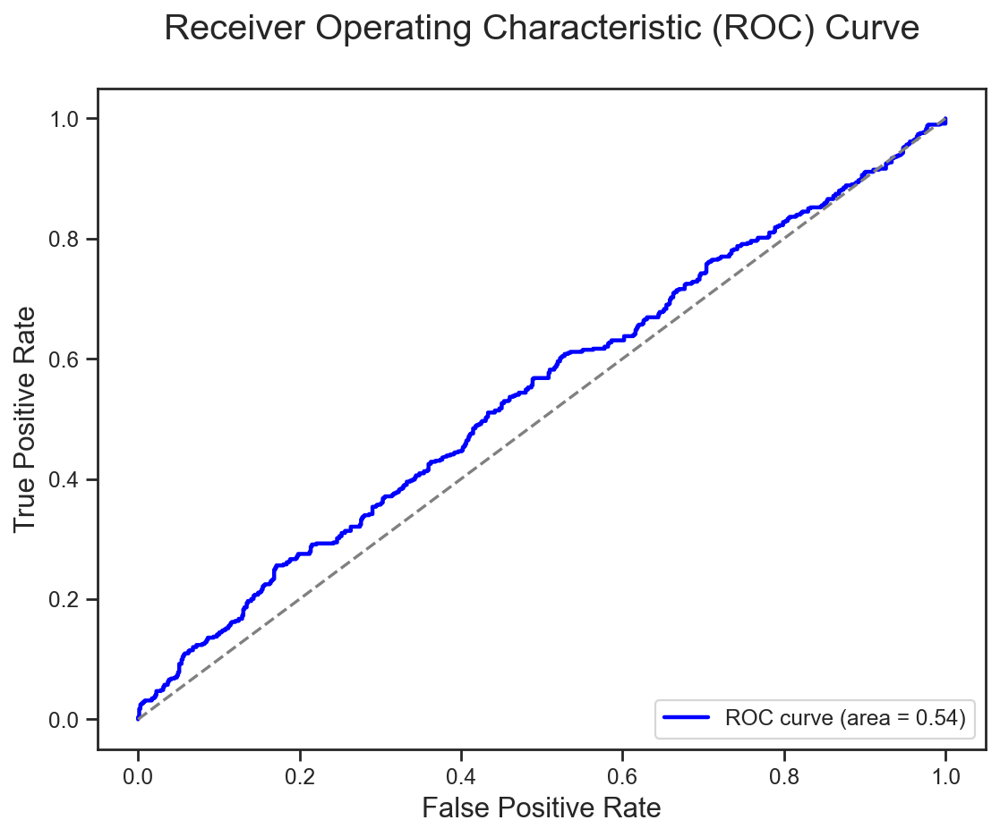

Brand Description_Cicaplast_Output Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.98      0.85       943
           1       0.55      0.06      0.11       337

    accuracy                           0.74      1280
   macro avg       0.65      0.52      0.48      1280
weighted avg       0.69      0.74      0.65      1280



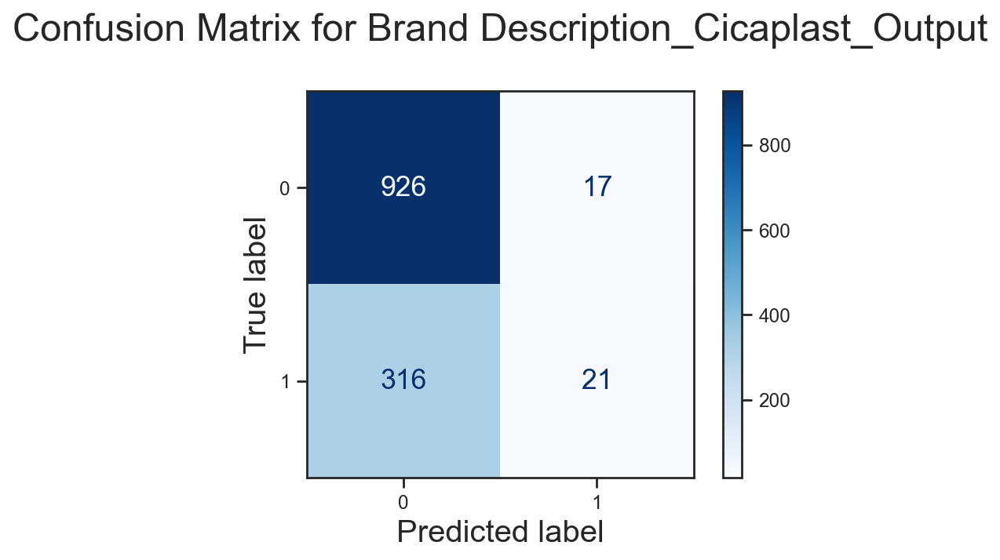

40/40 [==============================] - 0s 685us/step


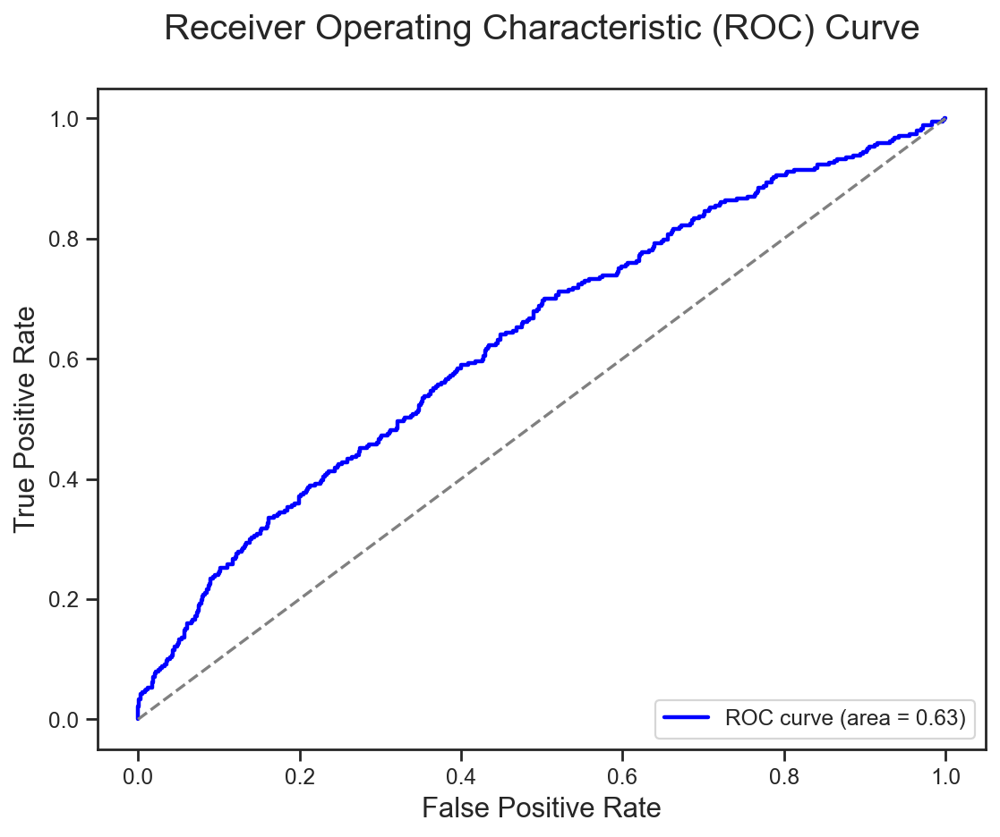

Brand Description_Effaclar_Output Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.79      0.74       751
           1       0.63      0.51      0.56       529

    accuracy                           0.67      1280
   macro avg       0.66      0.65      0.65      1280
weighted avg       0.67      0.67      0.67      1280



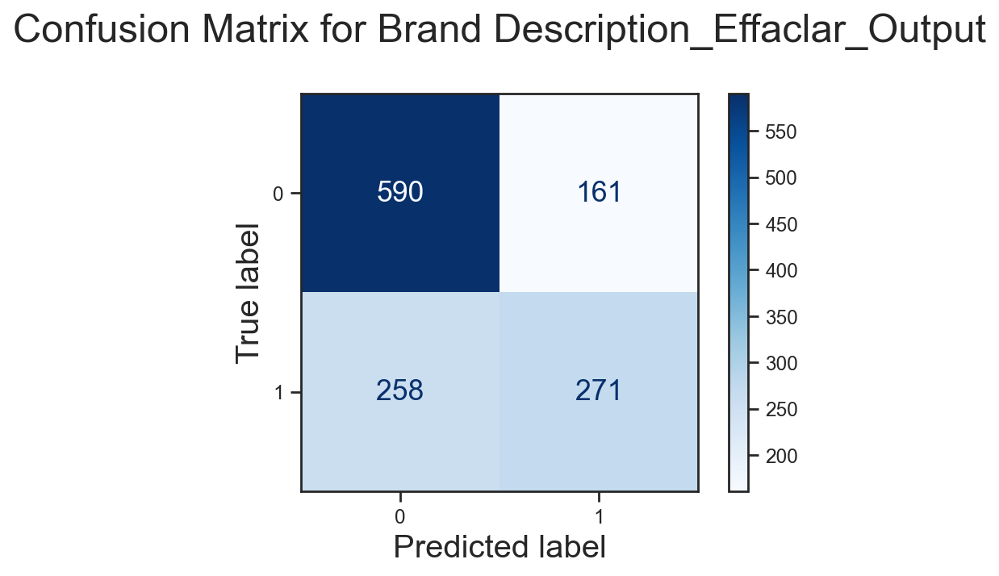

40/40 [==============================] - 0s 652us/step


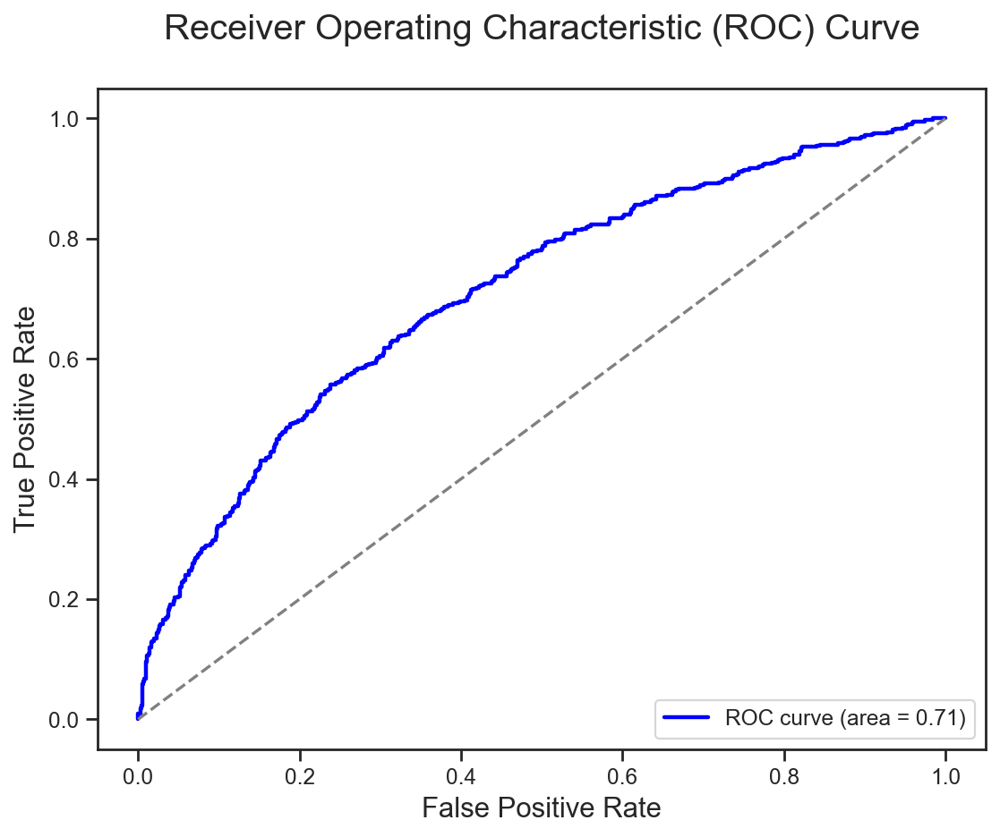

Brand Description_Hyalu B5_Output Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.99      0.95      1178
           1       0.24      0.04      0.07       102

    accuracy                           0.91      1280
   macro avg       0.58      0.51      0.51      1280
weighted avg       0.87      0.91      0.88      1280



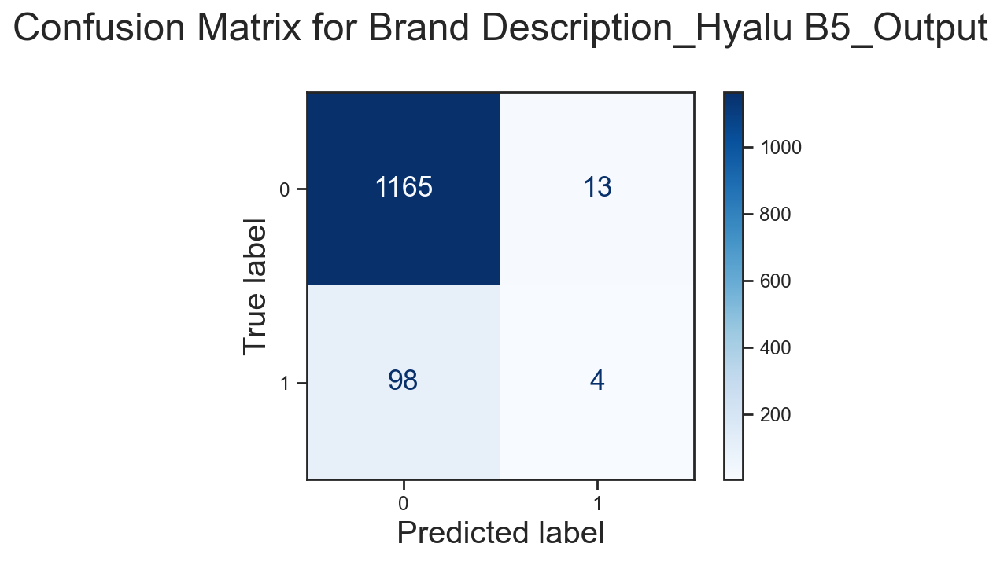

40/40 [==============================] - 0s 644us/step


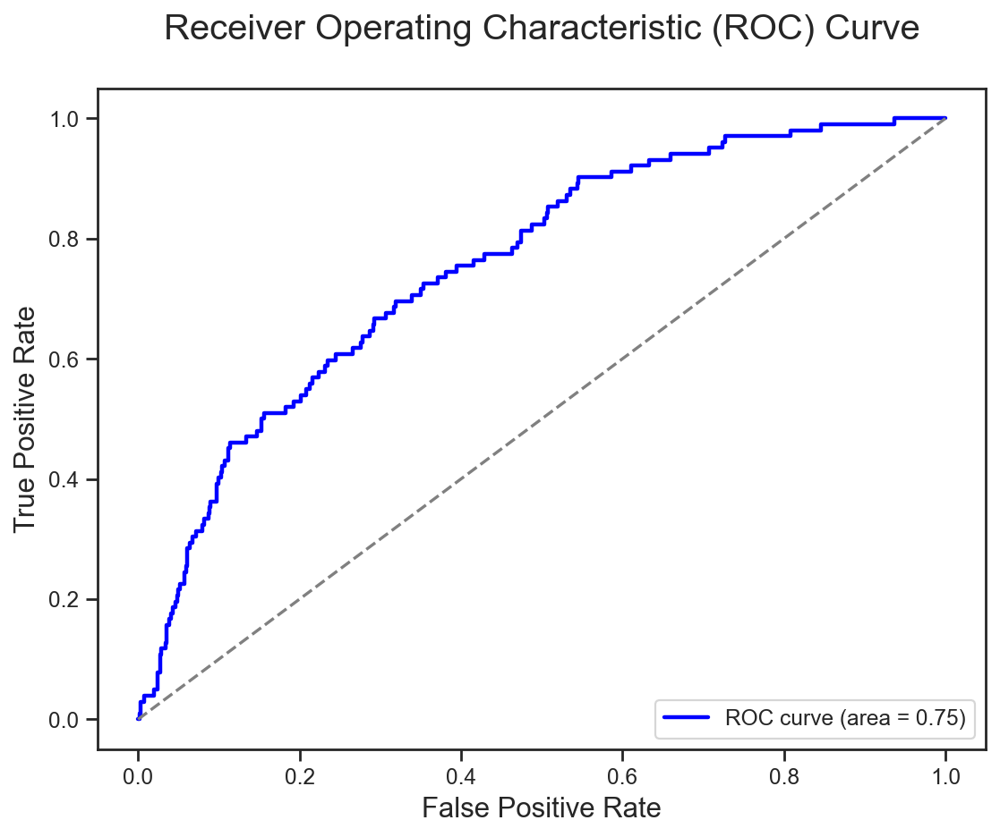

Brand Description_Lipikar_Output Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.99      0.87       989
           1       0.54      0.02      0.05       291

    accuracy                           0.77      1280
   macro avg       0.66      0.51      0.46      1280
weighted avg       0.72      0.77      0.68      1280



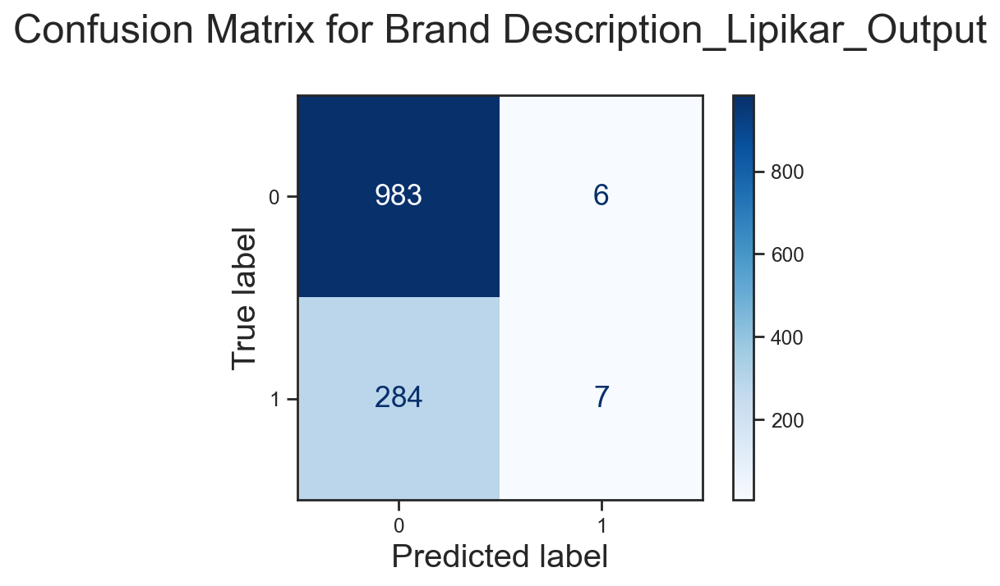

40/40 [==============================] - 0s 763us/step


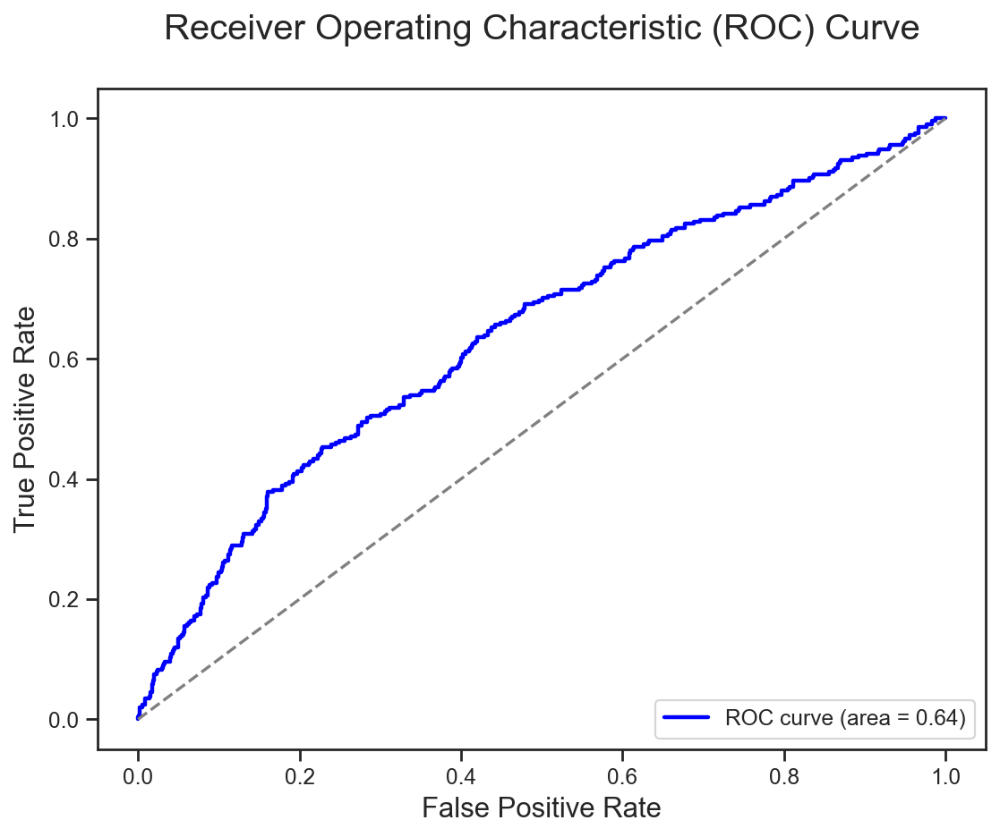

Brand Description_Toleriane_Output Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.80      0.77       777
           1       0.65      0.56      0.60       503

    accuracy                           0.71      1280
   macro avg       0.69      0.68      0.69      1280
weighted avg       0.70      0.71      0.70      1280



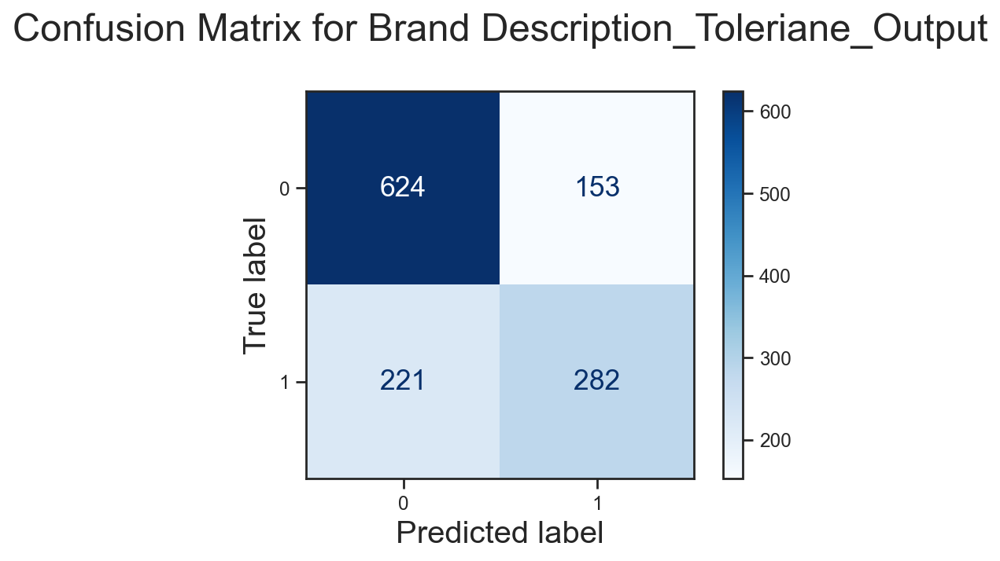

40/40 [==============================] - 0s 734us/step


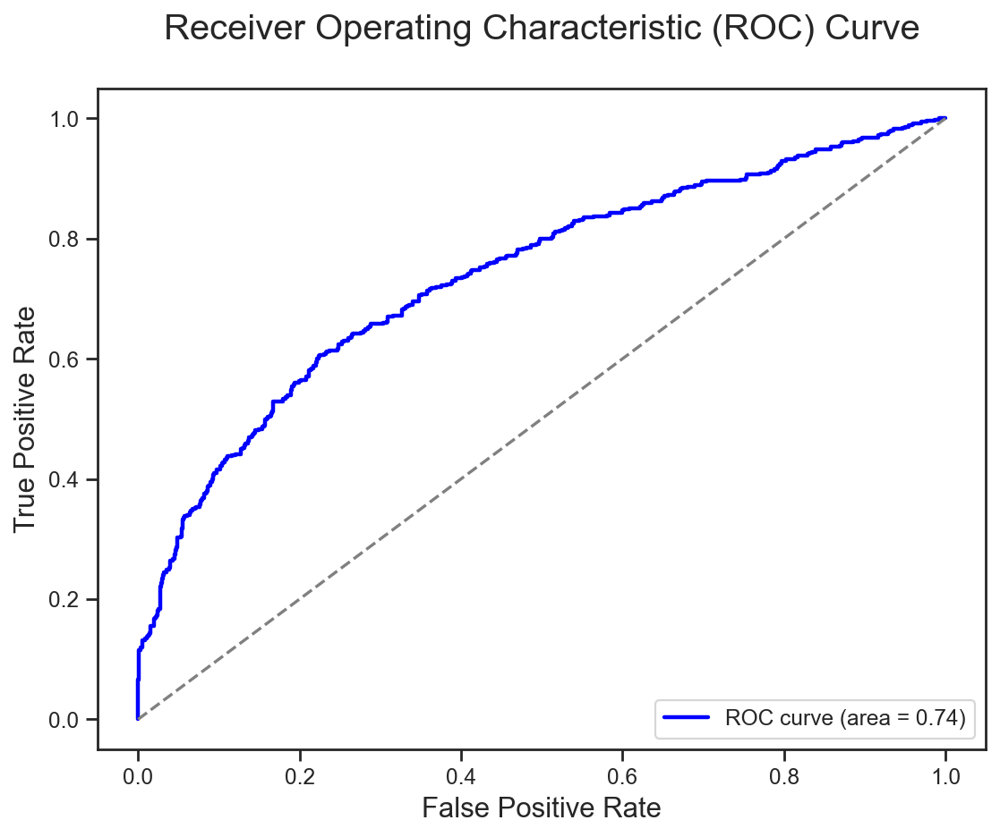

Brand Description_Vitamin C_Output Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.97      0.85       966
           1       0.34      0.04      0.08       314

    accuracy                           0.74      1280
   macro avg       0.55      0.51      0.47      1280
weighted avg       0.66      0.74      0.66      1280



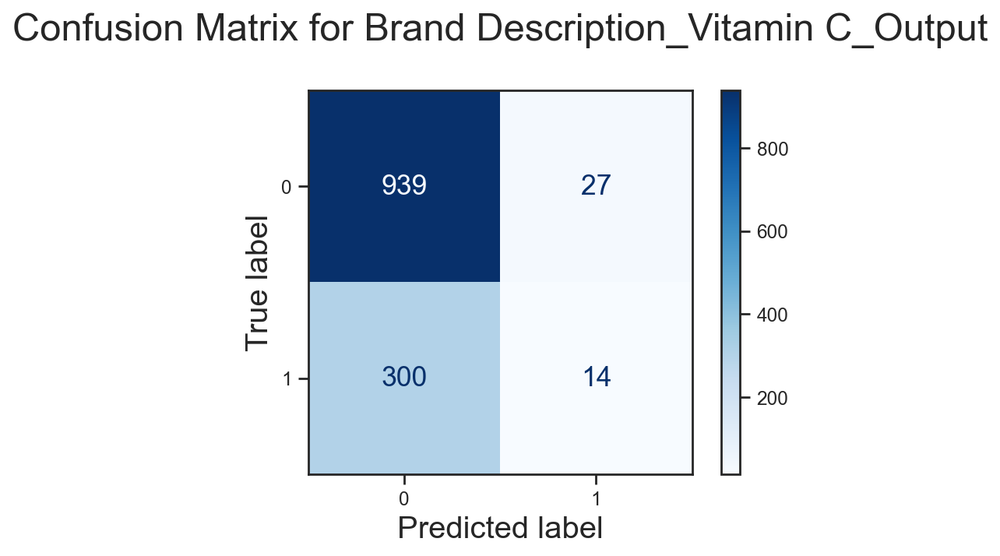

40/40 [==============================] - 0s 665us/step


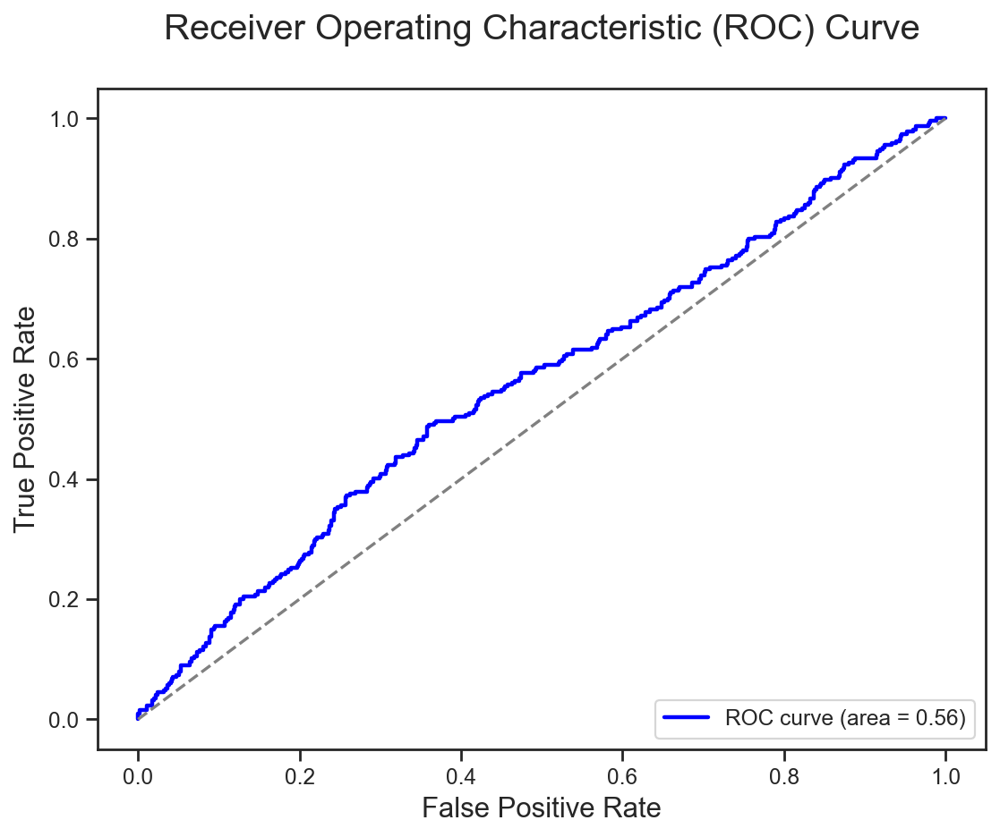

In [ ]:
# Print the classification report, confusion matrix and ROC curve for each label

for i in range(y_all_test.shape[1]):

    print(f"{y_all_test.columns[i]} Classification Report:")
    print(classification_report(y_all_test.iloc[:, i], y_pred_all_binary[:, i]))


    confus_matrix(y_all_test.iloc[:, i], y_pred_all_binary[:, i], y_all_test.columns[i])

    plot_roc_curve(y_all_test.iloc[:, i], model_all.predict(x_all_test)[:,i])



## 3: Random Forest

In [ ]:
X = loreal.copy()
y = loreal_classifi.iloc[:, -7:]
# train test split
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# train valid split
X_train, X_valid, y_train, y_valid = train_test_split(X_temp, y_temp, test_size=0.2, random_state=0)


In [ ]:
def plot_confusion_matrices(model, X_valid, y_valid, labels):
    for i, estimator in enumerate(model.estimators_):
        y_pred = (estimator.predict_proba(X_valid)[:, 1] > 0.5).astype(int)
        cm = confusion_matrix(y_valid.iloc[:, i], y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Purchased', 'Purchased'])
        fig, ax = plt.subplots(figsize=(6, 4))

        disp.plot(cmap='Blues', ax=ax)
        plt.title(f'Confusion Matrix for {labels[i]}', fontsize=16)
        plt.xlabel('Predicted label', fontsize=14)
        plt.ylabel('True label', fontsize=14)
        ax.tick_params(axis='both', labelsize=12)
        for texts in disp.text_.ravel():
            texts.set_fontsize(12)
        plt.show()

In [ ]:
def evaluate_model(model, X_valid, y_valid):
    results = []
    for i, estimator in enumerate(model.estimators_):
        y_pred_prob = estimator.predict_proba(X_valid)[:, 1]
        y_pred = (y_pred_prob > 0.5).astype(int)
        auc = roc_auc_score(y_valid.iloc[:, i], y_pred_prob)
        accuracy = accuracy_score(y_valid.iloc[:, i], y_pred)
        f1 = f1_score(y_valid.iloc[:, i], y_pred)
        results.append({'Label': i, 'AUC': auc, 'Accuracy': accuracy, 'F1 Score': f1})
    return results


In [ ]:
def apply_smote_with_dynamic_neighbors(X, y):
    y_combined = y.apply(lambda row: ''.join(row.astype(str)), axis=1)
    class_counts = Counter(y_combined)
    min_class_count = min(class_counts.values())

    if min_class_count > 1:
        k_neighbors = min(5, min_class_count - 1)
    else:
        return X, y

    smote = BorderlineSMOTE(random_state=0, k_neighbors=k_neighbors)
    X_res, y_res_combined = smote.fit_resample(X, y_combined)

    y_res = y.iloc[y_res_combined.index].reset_index(drop=True)
    return X_res, y_res


In [ ]:
def generate_classification_reports(model, X_valid, y_valid, labels):
    for i, estimator in enumerate(model.estimators_):
        y_pred = (estimator.predict_proba(X_valid)[:, 1] > 0.5).astype(int) # predict each label

        # print classification report
        print(f"Classification Report for {labels[i]}:")
        print(classification_report(y_valid.iloc[:, i], y_pred, target_names=['Not Purchased', 'Purchased']))
        print("\n")


In [ ]:
def plot_feature_importance_for_labels(model, labels, font_size=14):
    for i, estimator in enumerate(model.estimators_):

        plt.figure(figsize=(8, 6))
        plot_importance(estimator, max_num_features=15, title=f"Feature Importance for {labels[i]}")

        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.title(f"Feature Importance for {labels[i]}\n", fontsize=16)
        plt.xlabel("F Score", fontsize=14)
        plt.ylabel("Features", fontsize=12)
        sns.despine()
        plt.show()


In [ ]:
def plot_feature_importance_for_labels_rf(model, labels, X_train, font_size=14):
    for i, estimator in enumerate(model.estimators_):
        plt.figure(figsize=(10, 8))
        importances = estimator.feature_importances_
        indices = np.argsort(importances)[-15:]  # 选择15个最重要的特征
        plt.barh(range(len(indices)), importances[indices], align='center')
        plt.yticks(range(len(indices)), [X_train.columns[i] for i in indices], fontsize=12)
        plt.xlabel('Importance', fontsize=font_size)
        plt.title(f"Feature Importance for {labels[i]}\n", fontsize=font_size + 2)
        sns.despine()
        plt.show()

In [ ]:
def best_RandomForest_multi_label_classification(trial, X_train, X_valid, y_train, y_valid):
    X_res, y_res = apply_smote_with_dynamic_neighbors(X_train, y_train)

    # handle class imbalance problem
    weights = []
    for i in range(y_train.shape[1]):
        label_counts = y_train.iloc[:, i].value_counts()
        if 1 in label_counts and 0 in label_counts:
            weight = label_counts[0] / label_counts[1]
            weights.append(trial.suggest_uniform(f'scale_pos_weight_{i}', 1, max(2, weight)))
        else:
            weights.append(1)

    # hyperparameters
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
        'max_features': trial.suggest_uniform('max_features', 0.1, 1.0),
        'class_weight': {0: 1, 1: np.mean(weights)},
        'random_state': 0
    }

    base_rf_model = RandomForestClassifier(**params)
    multi_target_model = MultiOutputClassifier(base_rf_model)
    multi_target_model.fit(X_res, y_res)

    results = evaluate_model(multi_target_model, X_valid, y_valid)
    average_f1 = np.mean([result['F1 Score'] for result in results])

    trial.set_user_attr('model', multi_target_model)

    return average_f1


In [ ]:
# build models
study_rf = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
study_rf.optimize(lambda trial: best_RandomForest_multi_label_classification(trial, X_train, X_valid, y_train, y_valid),
                  n_trials=50, show_progress_bar=True, n_jobs=-1, timeout=1200)


[I 2024-10-15 12:28:52,212] A new study created in memory with name: no-name-0f3d7c3a-b20e-4be9-81f4-f87004a3f096


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2024-10-15 12:29:09,849] Trial 0 finished with value: 0.41447251670522883 and parameters: {'scale_pos_weight_0': 1.4710309047983234, 'scale_pos_weight_1': 2.9870995758246757, 'scale_pos_weight_2': 1.5421917270142709, 'scale_pos_weight_3': 1.5542991800935022, 'scale_pos_weight_4': 1.6430978464157178, 'scale_pos_weight_5': 1.8290156805908975, 'scale_pos_weight_6': 1.4931763230550985, 'n_estimators': 152, 'max_depth': 10, 'min_samples_split': 9, 'min_samples_leaf': 1, 'max_features': 0.6281469428374449}. Best is trial 0 with value: 0.41447251670522883.
[I 2024-10-15 12:29:24,591] Trial 5 finished with value: 0.48909001799187113 and parameters: {'scale_pos_weight_0': 1.7543605515223857, 'scale_pos_weight_1': 1.3635627513657158, 'scale_pos_weight_2': 1.5511702132866563, 'scale_pos_weight_3': 9.623752133761819, 'scale_pos_weight_4': 3.783161790930117, 'scale_pos_weight_5': 1.5452289852979975, 'scale_pos_weight_6': 1.04443632572814, 'n_estimators': 649, 'max_depth': 5, 'min_samples_split':

[I 2024-10-15 12:30:40,918] Trial 13 finished with value: 0.403497781363809 and parameters: {'scale_pos_weight_0': 1.3088632538178038, 'scale_pos_weight_1': 2.173466422548122, 'scale_pos_weight_2': 1.160072608027682, 'scale_pos_weight_3': 8.542626854703293, 'scale_pos_weight_4': 1.2296577307182204, 'scale_pos_weight_5': 1.5402065773578686, 'scale_pos_weight_6': 1.7446853408293332, 'n_estimators': 606, 'max_depth': 16, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 0.29852749100343573}. Best is trial 10 with value: 0.49232948882833105.
[I 2024-10-15 12:30:53,133] Trial 17 finished with value: 0.38933352967863044 and parameters: {'scale_pos_weight_0': 1.9764306836903134, 'scale_pos_weight_1': 1.728368065936293, 'scale_pos_weight_2': 1.9354785134879373, 'scale_pos_weight_3': 4.197728873145982, 'scale_pos_weight_4': 3.087817514990852, 'scale_pos_weight_5': 1.947804698371651, 'scale_pos_weight_6': 1.5927486954236187, 'n_estimators': 981, 'max_depth': 3, 'min_samples_split': 

[I 2024-10-15 12:32:48,748] Trial 29 finished with value: 0.4908931031340913 and parameters: {'scale_pos_weight_0': 1.6138733089537614, 'scale_pos_weight_1': 2.502740422312879, 'scale_pos_weight_2': 1.8494599813876247, 'scale_pos_weight_3': 10.151997660175457, 'scale_pos_weight_4': 2.753353942507356, 'scale_pos_weight_5': 1.9705343055522169, 'scale_pos_weight_6': 1.7689766973673633, 'n_estimators': 897, 'max_depth': 14, 'min_samples_split': 10, 'min_samples_leaf': 9, 'max_features': 0.45680567168894926}. Best is trial 30 with value: 0.5055127321751296.
[I 2024-10-15 12:32:50,377] Trial 32 finished with value: 0.48981780663633323 and parameters: {'scale_pos_weight_0': 1.5844444762646595, 'scale_pos_weight_1': 2.021792444787978, 'scale_pos_weight_2': 1.8346254862717466, 'scale_pos_weight_3': 9.298673781942762, 'scale_pos_weight_4': 3.4023889519216266, 'scale_pos_weight_5': 1.9979429058272398, 'scale_pos_weight_6': 2.1919472140674947, 'n_estimators': 890, 'max_depth': 8, 'min_samples_spli

[I 2024-10-15 12:34:38,835] Trial 41 finished with value: 0.5017642068845435 and parameters: {'scale_pos_weight_0': 1.214895905458269, 'scale_pos_weight_1': 2.9278316215873126, 'scale_pos_weight_2': 1.643413057505181, 'scale_pos_weight_3': 7.926265961738662, 'scale_pos_weight_4': 3.29870911277316, 'scale_pos_weight_5': 1.8819716736671845, 'scale_pos_weight_6': 2.383809850203683, 'n_estimators': 940, 'max_depth': 7, 'min_samples_split': 9, 'min_samples_leaf': 7, 'max_features': 0.6137157491920772}. Best is trial 37 with value: 0.5061802639912438.
[I 2024-10-15 12:34:40,216] Trial 48 finished with value: 0.5043189454257655 and parameters: {'scale_pos_weight_0': 1.744255276143116, 'scale_pos_weight_1': 2.920988098619122, 'scale_pos_weight_2': 1.664758673412908, 'scale_pos_weight_3': 7.938259031905659, 'scale_pos_weight_4': 3.46682771220226, 'scale_pos_weight_5': 1.8752083873720609, 'scale_pos_weight_6': 2.6074898678954552, 'n_estimators': 490, 'max_depth': 5, 'min_samples_split': 9, 'min_

In [ ]:
# find best trail
best_model_rf = study_rf.best_trial.user_attrs['model']
label_results_rf = evaluate_model(best_model_rf, X_valid, y_valid)


In [ ]:
# Convert label names
label_names = loreal_classifi.columns[-7:].tolist()
label_names = [label.replace("Brand Description_", "") for label in label_names]
label_names = [label.replace("_Output", "") for label in label_names]

In [ ]:
label_results_rf = evaluate_model(best_model_rf, X_valid, y_valid)

for label, result in zip(label_names, label_results_rf):
    print(f"{label}: AUC: {result['AUC']}, Accuracy: {result['Accuracy']}, F1 Score: {result['F1 Score']}")


Anthelios: AUC: 0.6134792806271137, Accuracy: 0.4609375, F1 Score: 0.6068376068376068
Cicaplast: AUC: 0.686879499185771, Accuracy: 0.66015625, F1 Score: 0.47904191616766467
Effaclar: AUC: 0.7552853710291455, Accuracy: 0.5751953125, F1 Score: 0.6448979591836734
Hyalu B5: AUC: 0.7883764711317465, Accuracy: 0.8984375, F1 Score: 0.2972972972972973
Lipikar: AUC: 0.7381928918769669, Accuracy: 0.794921875, F1 Score: 0.4827586206896552
Toleriane: AUC: 0.7633709382696433, Accuracy: 0.666015625, F1 Score: 0.6495901639344263
Vitamin C: AUC: 0.6075029752244943, Accuracy: 0.634765625, F1 Score: 0.38283828382838286


In [ ]:
# find best model
best_rf_model = study_rf.best_trial.user_attrs['model']

# classification report
generate_classification_reports(best_rf_model, X_test, y_test, label_names)


Classification Report for Anthelios:
               precision    recall  f1-score   support

Not Purchased       0.73      0.05      0.09       706
    Purchased       0.46      0.98      0.62       574

     accuracy                           0.47      1280
    macro avg       0.59      0.51      0.36      1280
 weighted avg       0.61      0.47      0.33      1280



Classification Report for Cicaplast:
               precision    recall  f1-score   support

Not Purchased       0.80      0.70      0.75       943
    Purchased       0.38      0.51      0.44       337

     accuracy                           0.65      1280
    macro avg       0.59      0.61      0.59      1280
 weighted avg       0.69      0.65      0.67      1280



Classification Report for Effaclar:
               precision    recall  f1-score   support

Not Purchased       0.81      0.31      0.45       751
    Purchased       0.48      0.90      0.62       529

     accuracy                           0.55      128

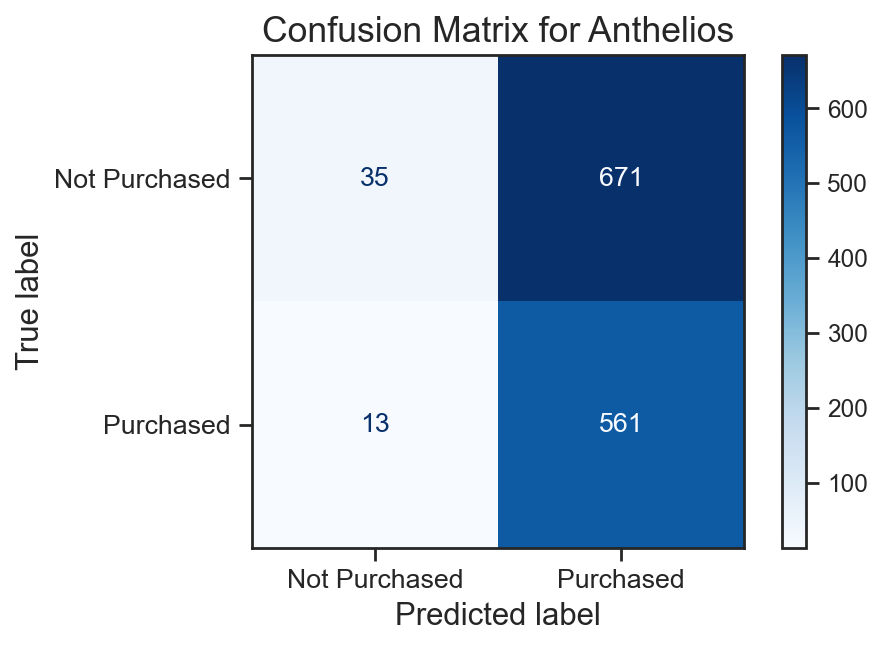

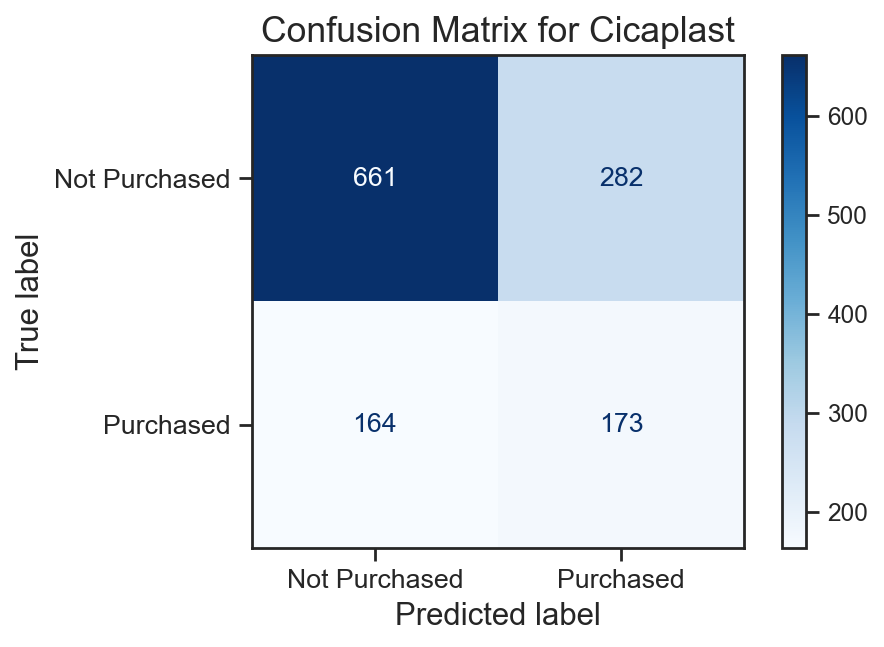

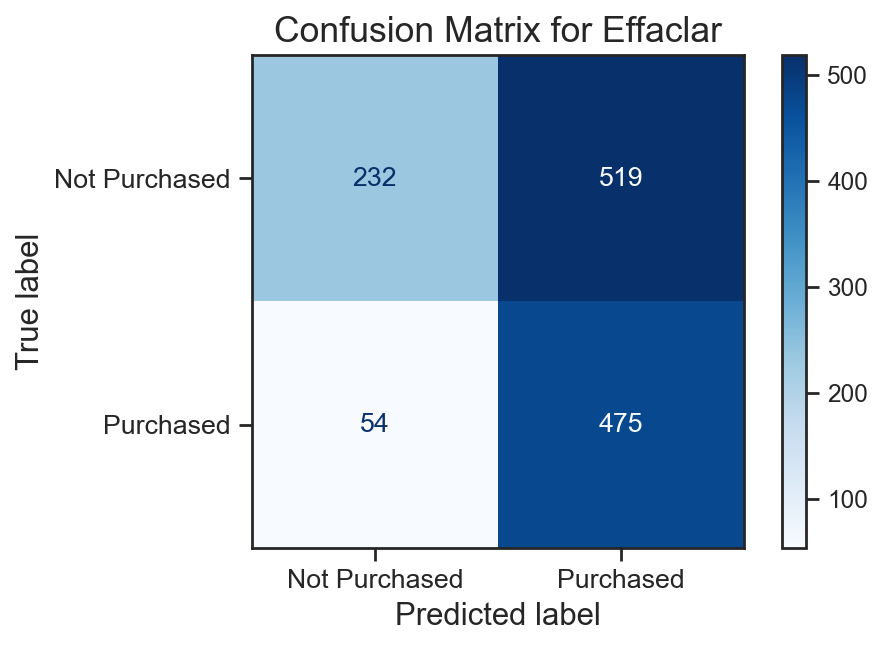

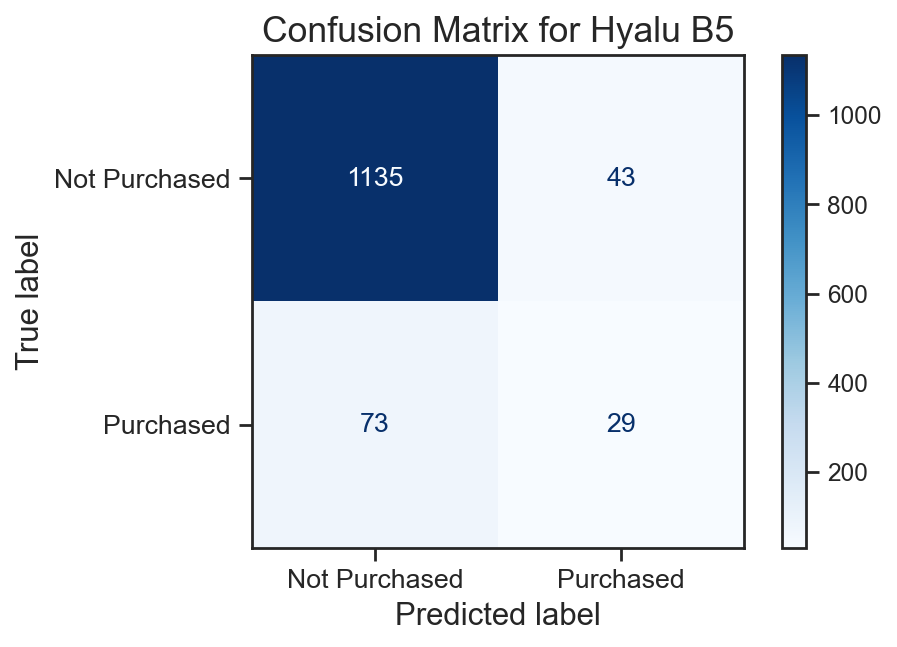

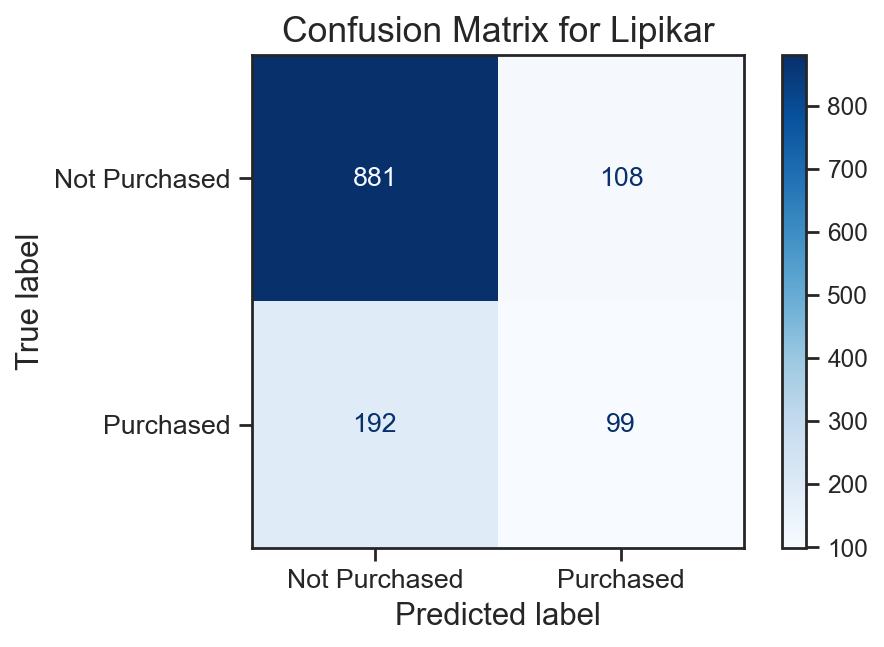

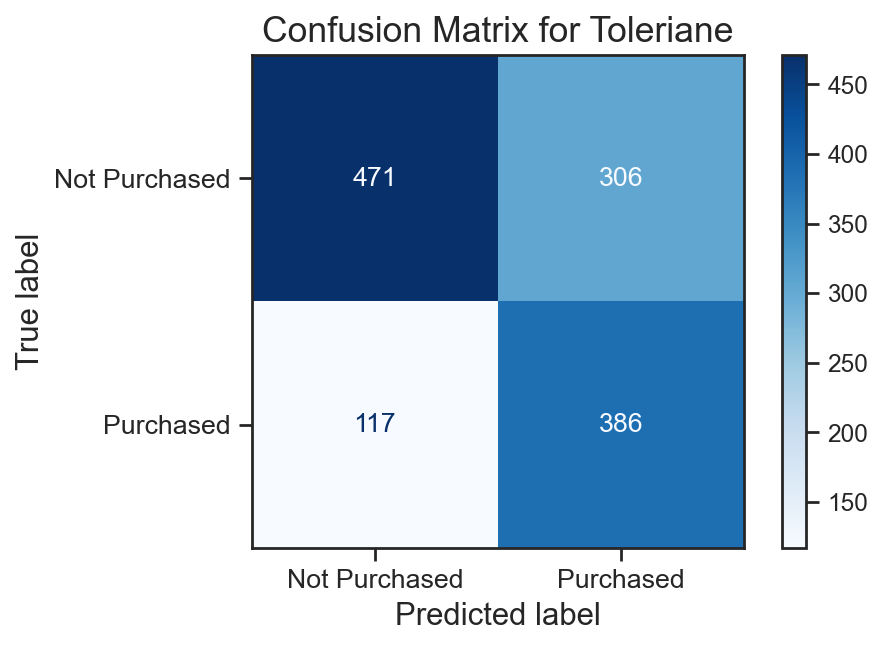

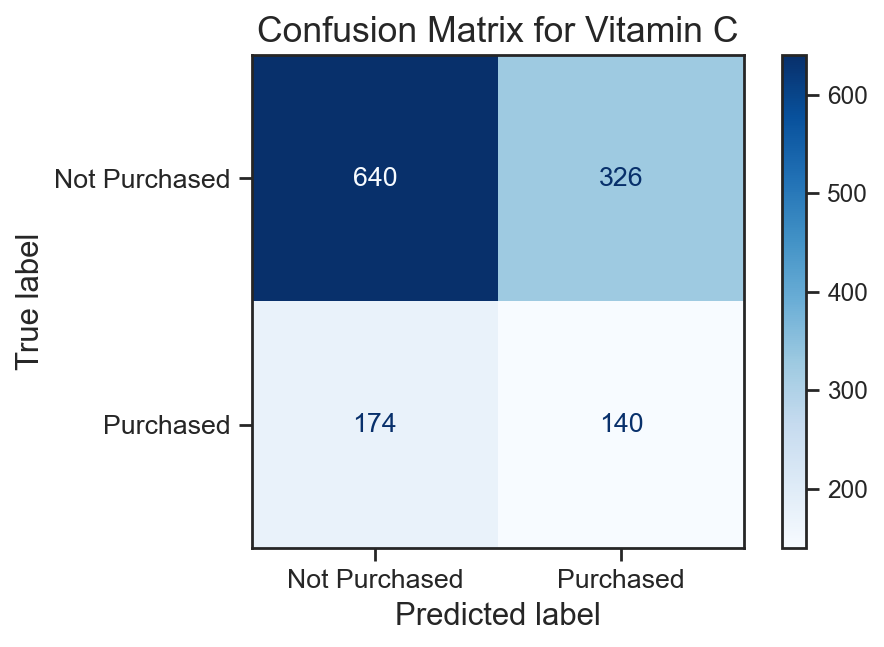

In [ ]:
# confusion matrix
plot_confusion_matrices(best_rf_model, X_test, y_test, label_names)


## 4: XGBoost

In [ ]:
X = loreal.iloc[:, :-7]
y = loreal_classifi.iloc[:, -7:]

In [ ]:
# train test split
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# train valid split
X_train, X_valid, y_train, y_valid = train_test_split(X_temp, y_temp, test_size=0.2, random_state=0)


In [ ]:
def plot_confusion_matrices(model, X_valid, y_valid, labels):
    for i, estimator in enumerate(model.estimators_):
        y_pred = (estimator.predict_proba(X_valid)[:, 1] > 0.5).astype(int)
        cm = confusion_matrix(y_valid.iloc[:, i], y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Purchased', 'Purchased'])
        fig, ax = plt.subplots(figsize=(6, 4))

        disp.plot(cmap='Blues', ax=ax)
        plt.title(f'Confusion Matrix for {labels[i]}', fontsize=16)
        plt.xlabel('Predicted label', fontsize=14)
        plt.ylabel('True label', fontsize=14)
        ax.tick_params(axis='both', labelsize=12)
        for texts in disp.text_.ravel():
            texts.set_fontsize(12)
        plt.show()


In [ ]:
def evaluate_model(model, X_valid, y_valid):
    results = []
    for i, estimator in enumerate(model.estimators_):
        y_pred_prob = estimator.predict_proba(X_valid)[:, 1]
        y_pred = (y_pred_prob > 0.5).astype(int)
        auc = roc_auc_score(y_valid.iloc[:, i], y_pred_prob)
        accuracy = accuracy_score(y_valid.iloc[:, i], y_pred)
        f1 = f1_score(y_valid.iloc[:, i], y_pred)
        results.append({'Label': i, 'AUC': auc, 'Accuracy': accuracy, 'F1 Score': f1})
    return results


In [ ]:
def apply_smote_with_dynamic_neighbors(X, y):
    y_combined = y.apply(lambda row: ''.join(row.astype(str)), axis=1)
    class_counts = Counter(y_combined)
    min_class_count = min(class_counts.values())

    if min_class_count > 1:
        k_neighbors = min(5, min_class_count - 1)
    else:
        return X, y

    smote = BorderlineSMOTE(random_state=0, k_neighbors=k_neighbors)
    X_res, y_res_combined = smote.fit_resample(X, y_combined)

    y_res = y.iloc[y_res_combined.index].reset_index(drop=True)
    return X_res, y_res


In [ ]:
def best_XGBoost_multi_label_classification(trial, X_train, X_valid, y_train, y_valid):
    X_res, y_res = apply_smote_with_dynamic_neighbors(X_train, y_train)

    weights = []
    for i in range(y_train.shape[1]):
        label_counts = y_train.iloc[:, i].value_counts()
        if 1 in label_counts and 0 in label_counts:
            weight = label_counts[0] / label_counts[1]
            weights.append(trial.suggest_uniform(f'scale_pos_weight_{i}', 1, max(2, weight)))
        else:
            weights.append(1)

    params = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'booster': 'gbtree',
        'learning_rate': trial.suggest_uniform('learning_rate', 0.001, 0.1),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'lambda': trial.suggest_loguniform('lambda', 1e-8, 10.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-8, 10.0),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 20),
        'scale_pos_weight': np.mean(weights),
        'random_state': 0  # set seed so results are reproducable
    }

    base_xgb_model = xgb.XGBClassifier(**params)
    multi_target_model = MultiOutputClassifier(base_xgb_model)
    multi_target_model.fit(X_res, y_res)

    results = evaluate_model(multi_target_model, X_valid, y_valid)
    average_f1 = np.mean([result['F1 Score'] for result in results])

    trial.set_user_attr('model', multi_target_model)

    return average_f1


In [ ]:
def generate_classification_reports(model, X_valid, y_valid, labels):
    for i, estimator in enumerate(model.estimators_):
        y_pred = (estimator.predict_proba(X_valid)[:, 1] > 0.5).astype(int) # predict each label

        # print classification report
        print(f"Classification Report for {labels[i]}:")
        print(classification_report(y_valid.iloc[:, i], y_pred, target_names=['Not Purchased', 'Purchased']))
        print("\n")


In [ ]:
def plot_feature_importance_for_labels(model, labels, font_size=14):
    for i, estimator in enumerate(model.estimators_):

        plt.figure(figsize=(8, 6))
        plot_importance(estimator, max_num_features=15, title=f"Feature Importance for {labels[i]}")

        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.title(f"Feature Importance for {labels[i]}\n", fontsize=16)
        plt.xlabel("F Score", fontsize=14)
        plt.ylabel("Features", fontsize=12)
        sns.despine()
        plt.show()


In [ ]:
# # Convert label names
# label_names = loreal_classifi.columns[-7:].tolist()
# label_names = [label.replace("Brand Description_", "") for label in label_names]
# label_names = [label.replace("_Output", "") for label in label_names]


In [ ]:
study = optuna.create_study(direction='maximize',
    sampler=optuna.samplers.TPESampler(seed=0))
study.optimize(lambda trial: best_XGBoost_multi_label_classification(trial, X_train, X_test, y_train, y_test), n_trials=50, timeout=600)


[I 2024-10-15 11:02:16,349] A new study created in memory with name: no-name-633f1fcf-e9f7-4db0-a806-a0b373b99c59
[I 2024-10-15 11:02:19,700] Trial 0 finished with value: 0.45688391166560666 and parameters: {'scale_pos_weight_0': 1.5488135039273248, 'scale_pos_weight_1': 2.4902749508657593, 'scale_pos_weight_2': 1.602763376071644, 'scale_pos_weight_3': 6.041666374542716, 'scale_pos_weight_4': 2.2111602211230847, 'scale_pos_weight_5': 1.6458941130666562, 'scale_pos_weight_6': 1.861605826827317, 'learning_rate': 0.0892855270774259, 'max_depth': 20, 'lambda': 2.8247087122296067e-05, 'alpha': 0.13351354975517526, 'subsample': 0.7644474598764522, 'colsample_bytree': 0.7840222805469661, 'min_child_weight': 19}. Best is trial 0 with value: 0.45688391166560666.
[I 2024-10-15 11:02:22,221] Trial 1 finished with value: 0.4808342192217732 and parameters: {'scale_pos_weight_0': 1.0710360581978868, 'scale_pos_weight_1': 1.1815555696672184, 'scale_pos_weight_2': 1.0202183974403258, 'scale_pos_weight

[I 2024-10-15 11:02:50,843] Trial 13 finished with value: 0.5021413688953462 and parameters: {'scale_pos_weight_0': 1.2836494453707983, 'scale_pos_weight_1': 3.0671827396541667, 'scale_pos_weight_2': 1.2009703957470896, 'scale_pos_weight_3': 10.139285868663334, 'scale_pos_weight_4': 3.8501280296880136, 'scale_pos_weight_5': 1.7466663912365255, 'scale_pos_weight_6': 2.3594429610141847, 'learning_rate': 0.08464636098564562, 'max_depth': 3, 'lambda': 7.9914982265118395, 'alpha': 1.4595154893948165e-08, 'subsample': 0.9159939074617877, 'colsample_bytree': 0.5042873069121039, 'min_child_weight': 15}. Best is trial 13 with value: 0.5021413688953462.
[I 2024-10-15 11:02:51,987] Trial 14 finished with value: 0.4992297403398206 and parameters: {'scale_pos_weight_0': 1.3134831430086795, 'scale_pos_weight_1': 2.512286427757258, 'scale_pos_weight_2': 1.2196344715136591, 'scale_pos_weight_3': 10.10471926810475, 'scale_pos_weight_4': 3.828808407083241, 'scale_pos_weight_5': 1.4023881991205858, 'scal

[I 2024-10-15 11:03:11,520] Trial 26 finished with value: 0.49061431725982896 and parameters: {'scale_pos_weight_0': 1.2947905341680366, 'scale_pos_weight_1': 2.6516947036573137, 'scale_pos_weight_2': 1.464871260641383, 'scale_pos_weight_3': 10.200837996609241, 'scale_pos_weight_4': 3.84167722561025, 'scale_pos_weight_5': 1.3914014438854017, 'scale_pos_weight_6': 2.6370841399986733, 'learning_rate': 0.07044816778252799, 'max_depth': 7, 'lambda': 0.14126887896367674, 'alpha': 5.9089607563944294e-05, 'subsample': 0.7844295593565696, 'colsample_bytree': 0.6464795054506626, 'min_child_weight': 15}. Best is trial 13 with value: 0.5021413688953462.
[I 2024-10-15 11:03:12,661] Trial 27 finished with value: 0.4854723878372068 and parameters: {'scale_pos_weight_0': 1.4730371612287692, 'scale_pos_weight_1': 2.9093715963689366, 'scale_pos_weight_2': 1.2854896074347957, 'scale_pos_weight_3': 9.37588671356851, 'scale_pos_weight_4': 3.014904397736041, 'scale_pos_weight_5': 1.495337331853512, 'scale_

[I 2024-10-15 11:03:34,761] Trial 39 finished with value: 0.471519850464815 and parameters: {'scale_pos_weight_0': 1.0629233777852474, 'scale_pos_weight_1': 2.86152416896291, 'scale_pos_weight_2': 1.2767111839468333, 'scale_pos_weight_3': 6.950880396499339, 'scale_pos_weight_4': 2.388990937450816, 'scale_pos_weight_5': 1.8842565773357263, 'scale_pos_weight_6': 2.272487453821306, 'learning_rate': 0.07274795682321812, 'max_depth': 8, 'lambda': 0.06900368697049264, 'alpha': 2.217642441334072e-07, 'subsample': 0.9535244634396693, 'colsample_bytree': 0.7315494062373733, 'min_child_weight': 16}. Best is trial 13 with value: 0.5021413688953462.
[I 2024-10-15 11:03:36,016] Trial 40 finished with value: 0.48660061515473857 and parameters: {'scale_pos_weight_0': 1.2043571958962724, 'scale_pos_weight_1': 1.9525476702567408, 'scale_pos_weight_2': 1.0703834804781187, 'scale_pos_weight_3': 9.635312198642666, 'scale_pos_weight_4': 3.6526613686707328, 'scale_pos_weight_5': 1.0126347752884157, 'scale_p

In [ ]:
# train best model
best_model_xgb = study.best_trial.user_attrs['model']
label_results_xgb = evaluate_model(best_model_xgb, X_test, y_test)

In [ ]:
### Get the result
for label, result in zip(label_names, label_results_xgb):
    print(f"{label}: AUC: {result['AUC']}, Accuracy: {result['Accuracy']}, F1 Score: {result['F1 Score']}")

print('\n\n')

Anthelios: AUC: 0.6327681594298744, Accuracy: 0.46640625, F1 Score: 0.6253428414701042
Cicaplast: AUC: 0.6845096305433446, Accuracy: 0.61875, F1 Score: 0.45657015590200445
Effaclar: AUC: 0.7214023394138629, Accuracy: 0.51328125, F1 Score: 0.6118380062305296
Hyalu B5: AUC: 0.7997436665667965, Accuracy: 0.90234375, F1 Score: 0.3842364532019704
Lipikar: AUC: 0.6859526961525232, Accuracy: 0.72734375, F1 Score: 0.40341880341880343
Toleriane: AUC: 0.785231980062994, Accuracy: 0.62421875, F1 Score: 0.6434395848776872
Vitamin C: AUC: 0.5981392834065223, Accuracy: 0.5359375, F1 Score: 0.39014373716632444





In [ ]:
# get classification report
generate_classification_reports(best_model_xgb, X_test, y_test, label_names)

Classification Report for Anthelios:
               precision    recall  f1-score   support

Not Purchased       0.87      0.04      0.07       706
    Purchased       0.46      0.99      0.63       574

     accuracy                           0.47      1280
    macro avg       0.66      0.52      0.35      1280
 weighted avg       0.69      0.47      0.32      1280



Classification Report for Cicaplast:
               precision    recall  f1-score   support

Not Purchased       0.82      0.62      0.71       943
    Purchased       0.37      0.61      0.46       337

     accuracy                           0.62      1280
    macro avg       0.59      0.62      0.58      1280
 weighted avg       0.70      0.62      0.64      1280



Classification Report for Effaclar:
               precision    recall  f1-score   support

Not Purchased       0.81      0.22      0.35       751
    Purchased       0.46      0.93      0.61       529

     accuracy                           0.51      128

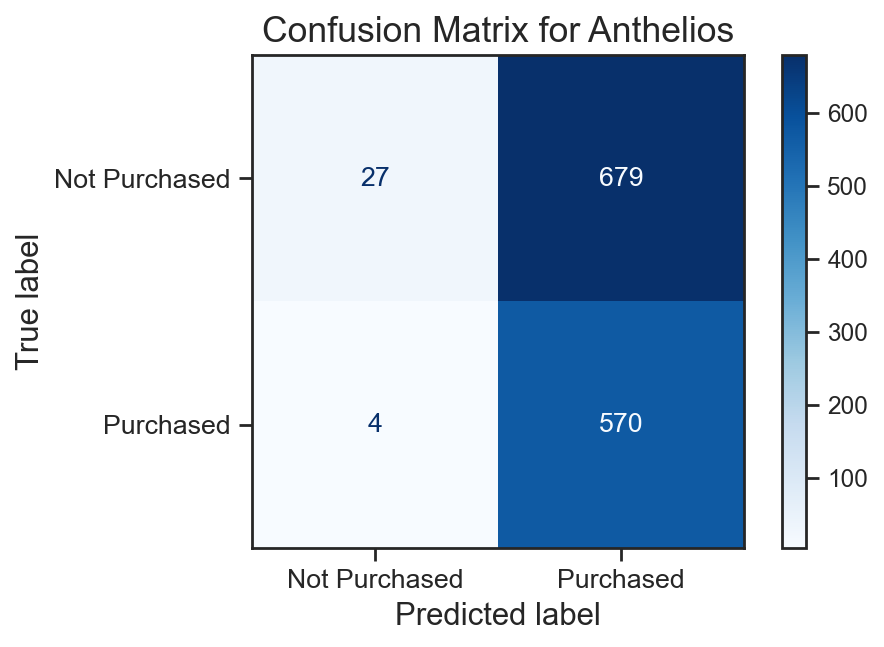

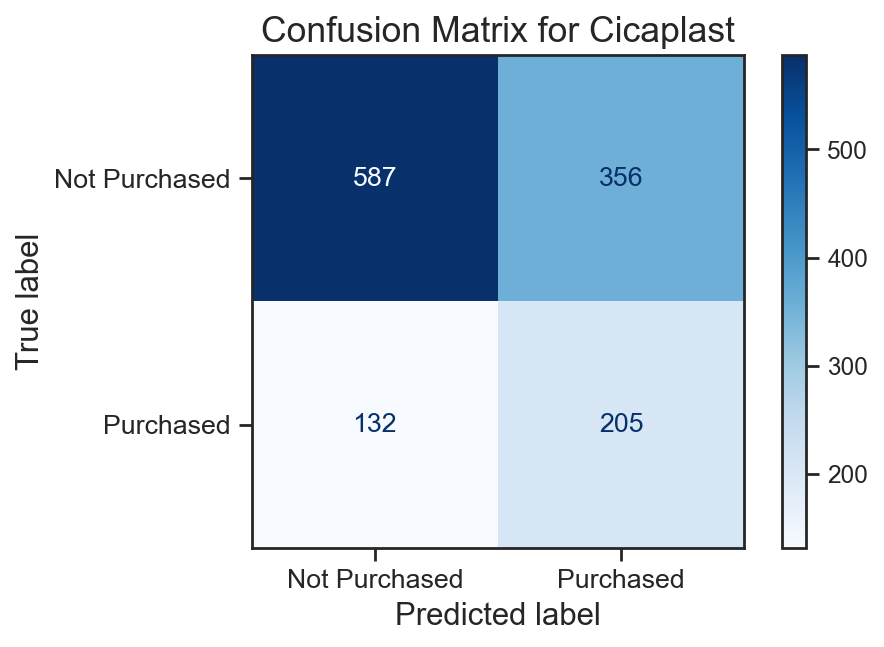

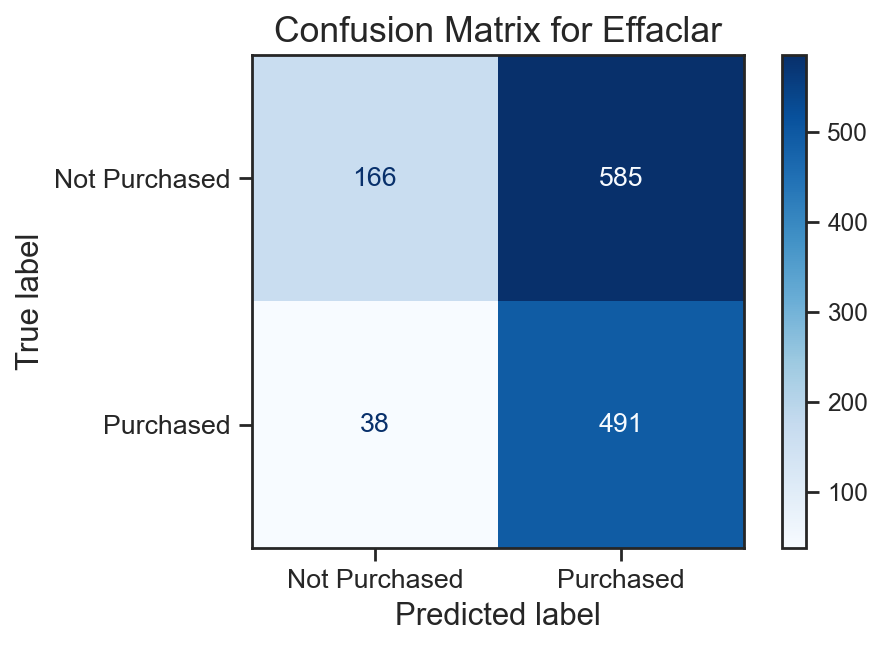

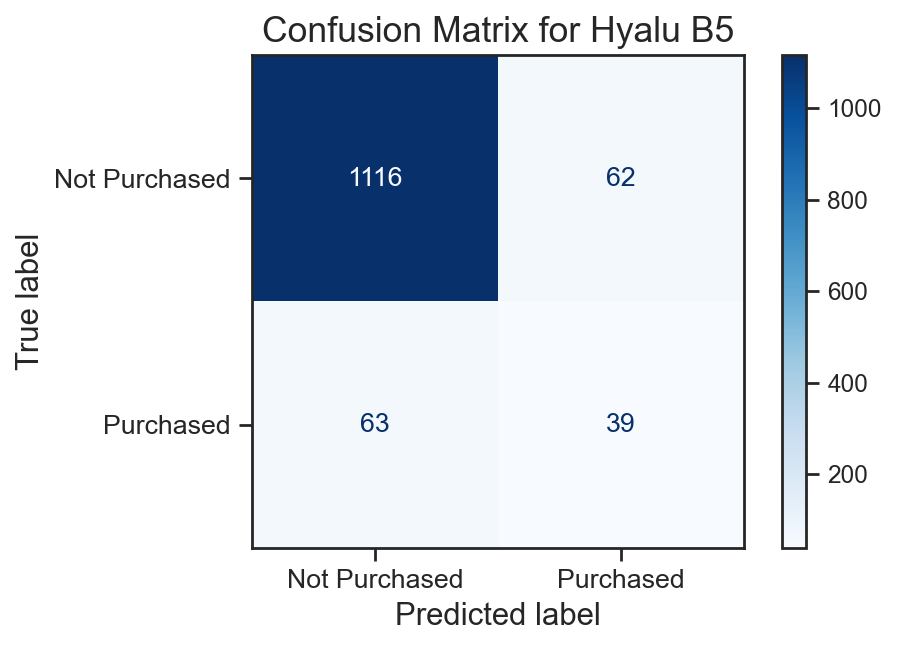

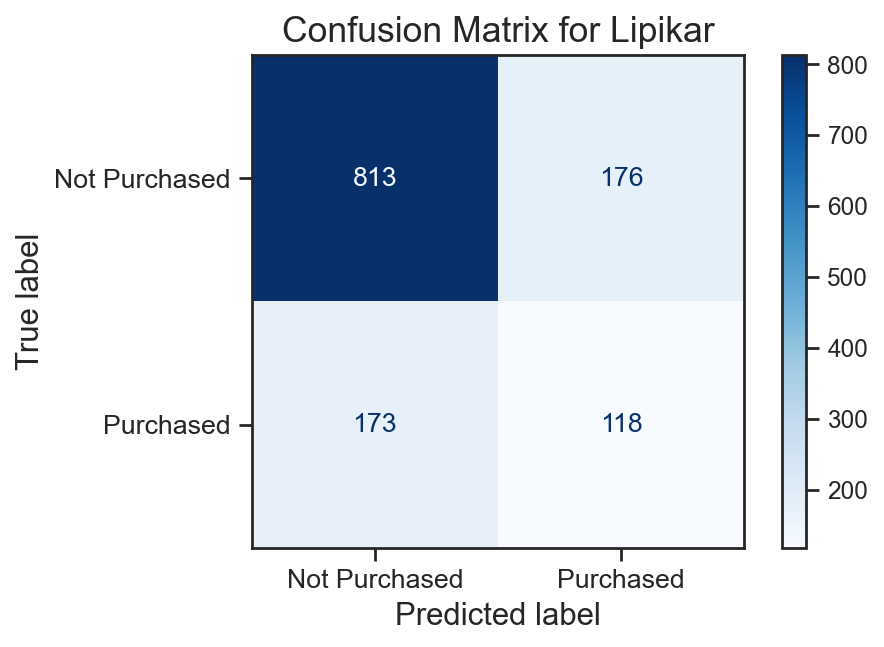

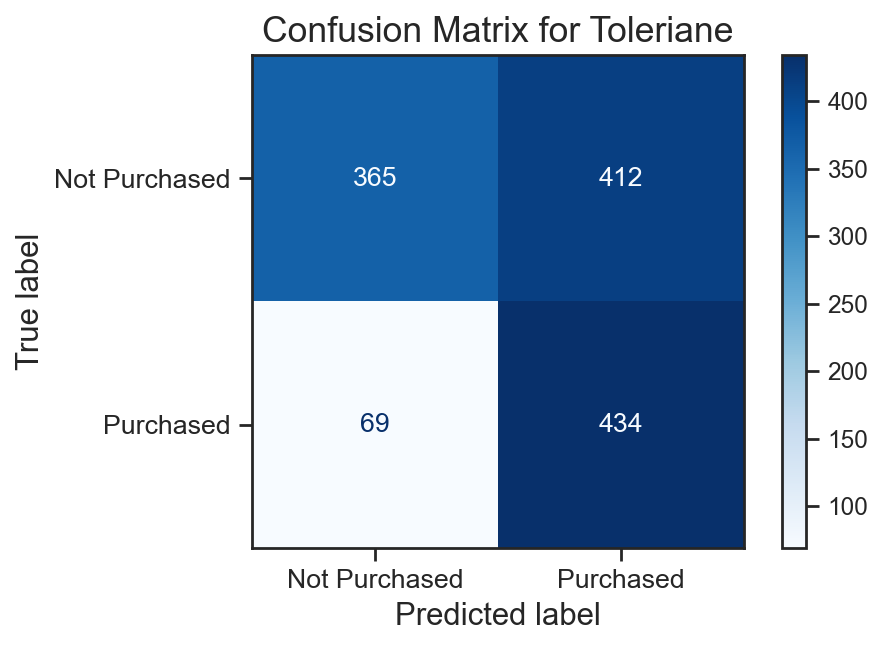

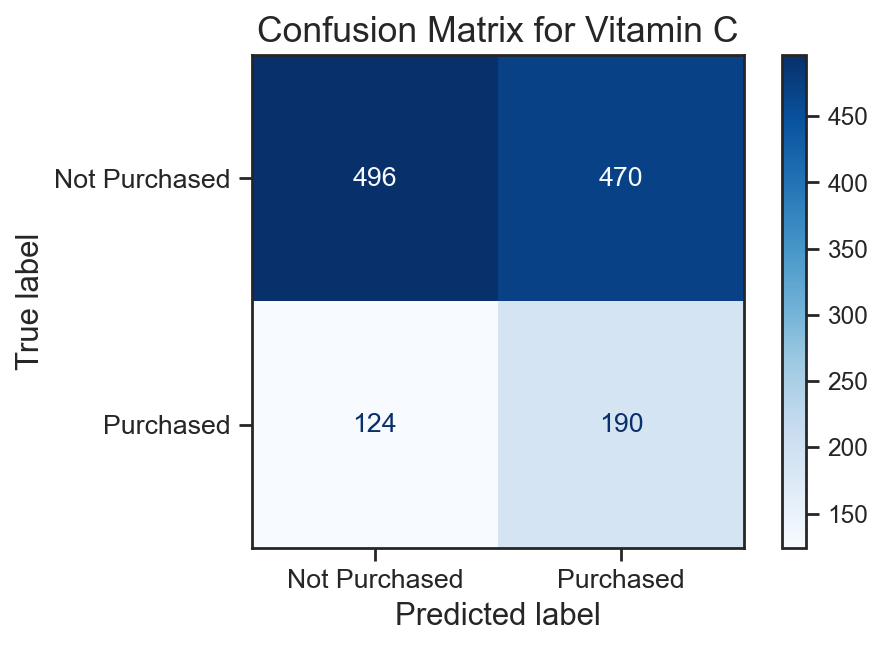

In [ ]:
### Confusion Matrix
plot_confusion_matrices(best_model_xgb, X_test, y_test, label_names)

<Figure size 640x480 with 0 Axes>

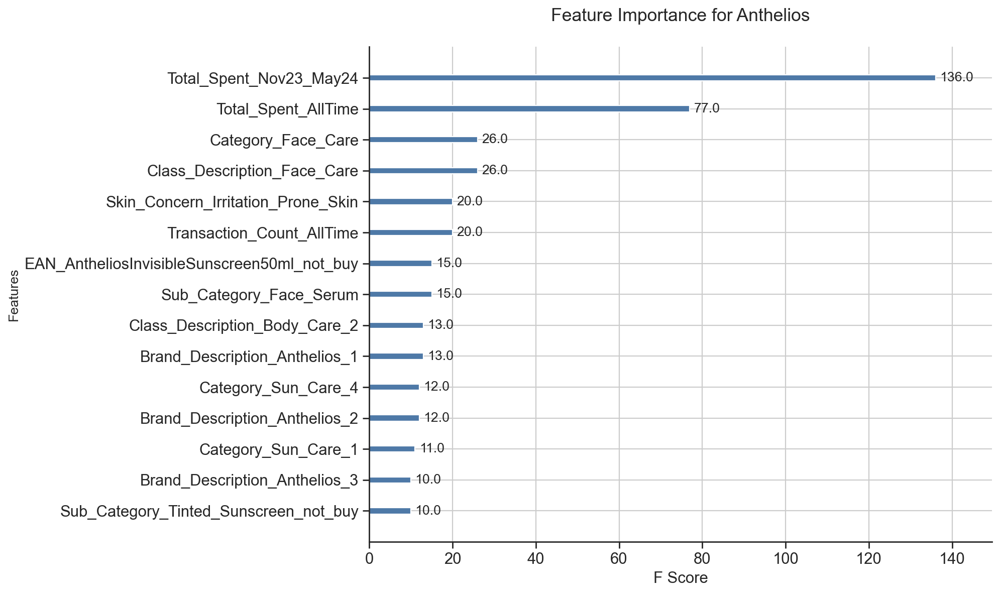

<Figure size 640x480 with 0 Axes>

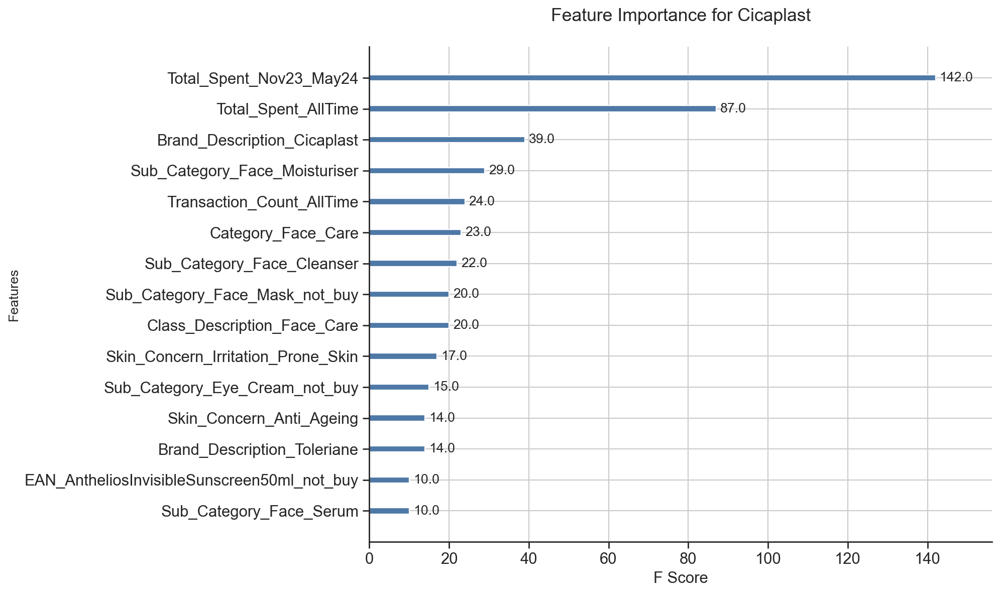

<Figure size 640x480 with 0 Axes>

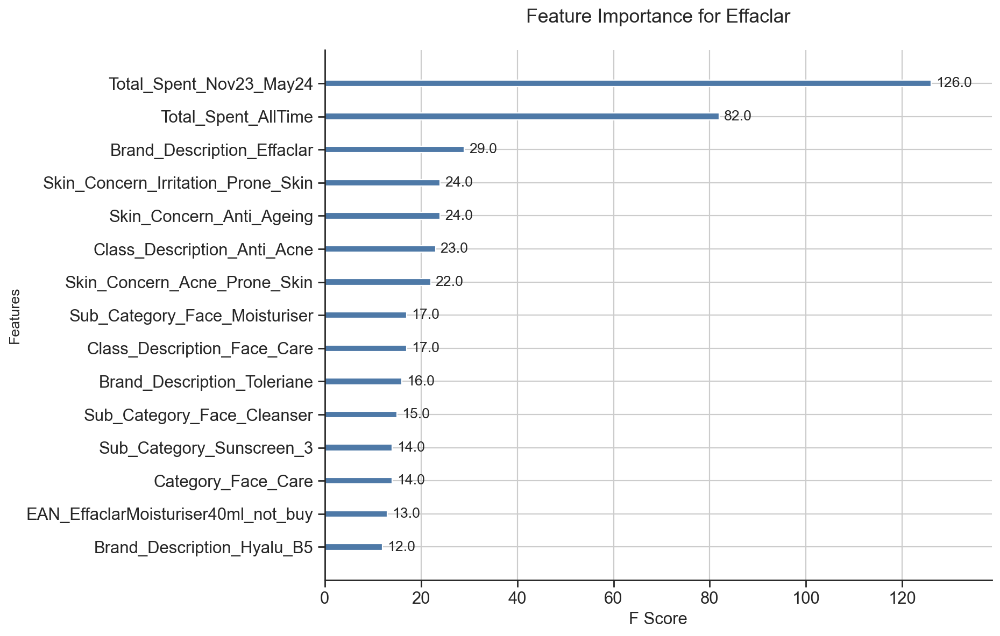

<Figure size 640x480 with 0 Axes>

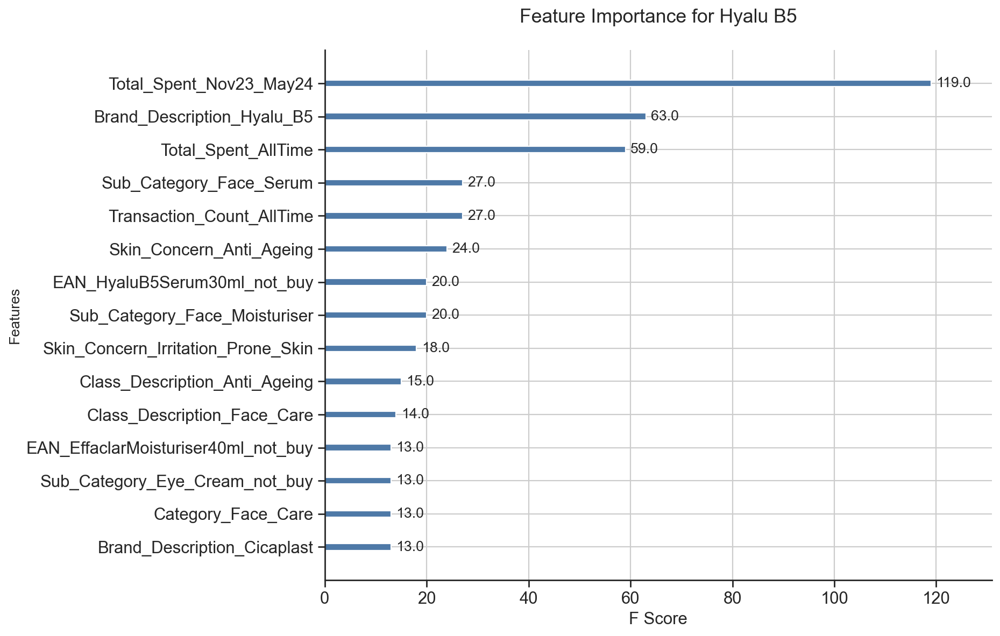

<Figure size 640x480 with 0 Axes>

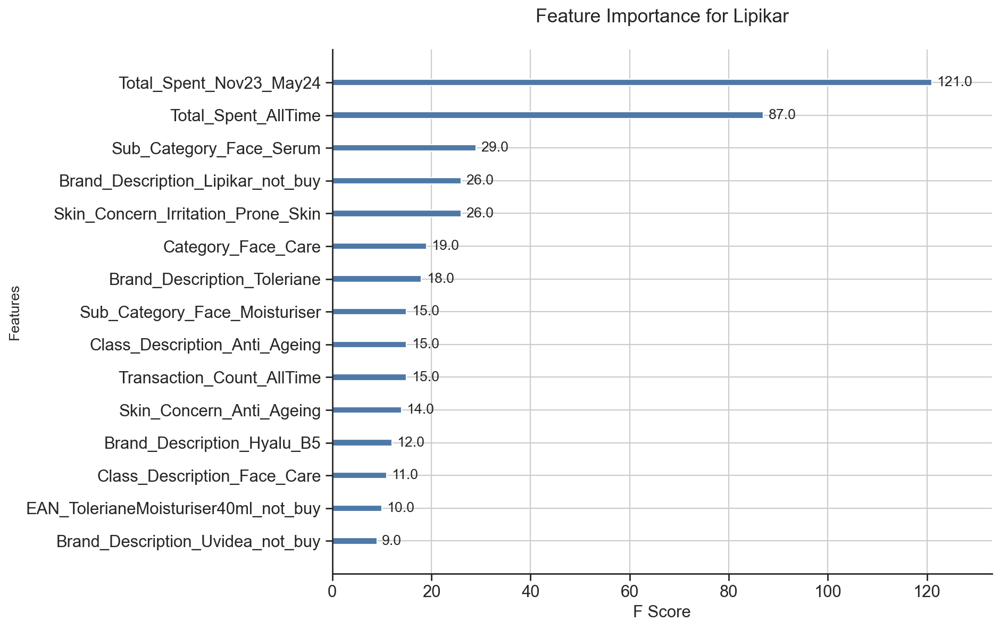

<Figure size 640x480 with 0 Axes>

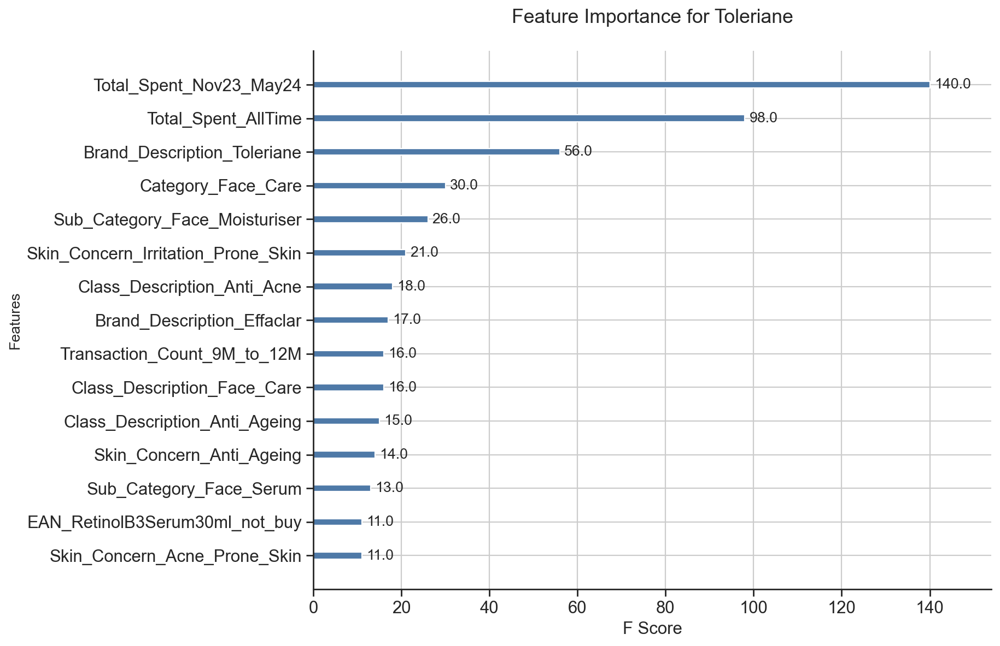

<Figure size 640x480 with 0 Axes>

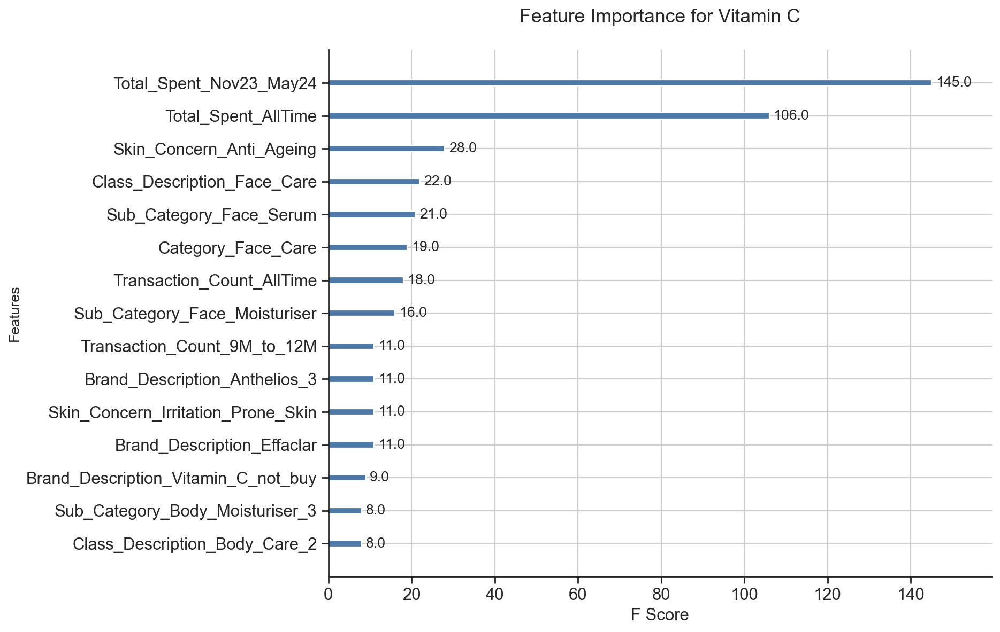

In [ ]:
# Feature Importance for each label
plot_feature_importance_for_labels(best_model_xgb, label_names)


,Transaction_Count_AllTime,Brand_Description_Cicaplast,Brand_Description_Effaclar,Brand_Description_Hyalu_B5,Brand_Description_Toleriane,Class_Description_Anti_Acne,Class_Description_Anti_Ageing,Class_Description_Face_Care,Sub_Category_Face_Cleanser,Sub_Category_Face_Moisturiser,...,Total_Spent_Nov23_May24,Total_Spent_AllTime,Transaction_Count_9M_to_12M,Transaction_Count_6M_to_9M,Transaction_Count_3M_to_6M,Transaction_Count_1M_to_3M,Total_Spent_9M_to_12M,Total_Spent_6M_to_9M,Total_Spent_3M_to_6M,Total_Spent_1M_to_3M
0,0.0,0.0,1.0,0.0,3.0,1.0,0.0,4.0,2.0,2.0,...,119.81,143.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
1,0.0,0.0,4.0,0.0,0.0,3.0,0.0,2.0,1.0,1.0,...,461.54,189.36,0.0,0.0,1.0,0.0,0.0,0.0,189.36,0.00
2,0.0,1.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,...,38.41,161.59,0.0,0.0,1.0,0.0,0.0,0.0,161.59,0.00
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,168.25,73.62,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,...,82.28,88.85,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6395,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,2.0,0.0,...,55.90,133.85,0.0,0.0,0.0,1.0,0.0,0.0,0.00,133.85
6396,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,136.80,100.15,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
6397,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,196.00,180.67,0.0,0.0,0.0,1.0,0.0,0.0,0.00,180.67
6398,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,2.0,...,58.35,63.40,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
